ABHISHEK CHANDAR

300222152

*Import* the necessary packages

In [1]:
import numpy as np
import pandas as pd

from sklearn import preprocessing

from sklearn.model_selection import RepeatedKFold,cross_validate,RepeatedStratifiedKFold
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, plot_roc_curve, roc_curve
from scipy.stats import randint

#Hyperparameter tune
from sklearn.model_selection import RandomizedSearchCV

#model import
from sklearn import tree,svm #decision tree, SVM
from sklearn.ensemble import RandomForestClassifier #random forest
from sklearn.neighbors import KNeighborsClassifier #KNN classifer
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from scipy.stats import sem  
from sklearn.model_selection import RepeatedKFold,cross_validate,KFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import OrdinalEncoder,OneHotEncoder

from scipy.stats import sem  
from statistics import mean 
from numpy import std

!pip install category_encoders
import category_encoders as ce

You should consider upgrading via the 'C:\Python-Workspace\Scripts\python.exe -m pip install --upgrade pip' command.


## Import first dataset

In [2]:
#Import dataset
data = pd.read_csv("online_shoppers_intention.csv")
test = pd.read_csv("online_shoppers_intention.csv")

# Feature transformation

## Handle categorical features
  1. Encode categorical features using 1-to-C dummy encoding 
  2. Convert boolean True/False to 0/1

In [3]:
#Feature transformation starts here
data_encoded = pd.get_dummies(data=data,drop_first=True)

#Convert weekend and revenue from object type to int type
data_encoded[["Weekend","Revenue"]] = data_encoded[["Weekend","Revenue"]].astype(int)

#Perform One Hot Encoding for Traffic Type, OS, Browser and Region
encoder1=ce.OneHotEncoder(cols='TrafficType',handle_unknown='return_nan',return_df=True,use_cat_names=True)
encoder2=ce.OneHotEncoder(cols='OperatingSystems',handle_unknown='return_nan',return_df=True,use_cat_names=True)
encoder3=ce.OneHotEncoder(cols='Browser',handle_unknown='return_nan',return_df=True,use_cat_names=True)
encoder4=ce.OneHotEncoder(cols='Region',handle_unknown='return_nan',return_df=True,use_cat_names=True)

data_encoded = encoder1.fit_transform(data_encoded)
data_encoded = encoder2.fit_transform(data_encoded)
data_encoded = encoder3.fit_transform(data_encoded)
data_encoded = encoder4.fit_transform(data_encoded)

data_encoded.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Feb,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,...,1,0,0,0,0,0,0,0,0,1
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,...,1,0,0,0,0,0,0,0,0,1
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,...,1,0,0,0,0,0,0,0,0,1
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,...,1,0,0,0,0,0,0,0,0,1
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,...,1,0,0,0,0,0,0,0,0,1


## Handle numerical features
  1. Standardize the numerical data


In [4]:
#Handle numerical features

#Move target class to end of dataframe
move = data_encoded['Revenue']
data_encoded.drop(labels=['Revenue'], axis=1, inplace = True)
data_encoded.insert(len(data_encoded.columns), 'Revenue', move)

In [5]:
#1. Standardize numerical values to 0 mean and respective std
X_data = data_encoded.iloc[:,:-1]
Y_data = data_encoded['Revenue']
#Select numerical features and apply it only on those features
data_encoded.iloc[:,:10] = preprocessing.scale(data_encoded.iloc[:,:10]) #Till "Special day" feature

data_encoded.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor,Revenue
0,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,-0.308821,...,0,0,0,0,0,0,0,0,1,0
1,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903,-0.457683,1.171473,-0.317178,-0.308821,...,0,0,0,0,0,0,0,0,1,0
2,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,-0.308821,...,0,0,0,0,0,0,0,0,1,0
3,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954,0.573535,1.994610,-0.317178,-0.308821,...,0,0,0,0,0,0,0,0,1,0
4,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430,-0.045196,0.142551,-0.317178,-0.308821,...,0,0,0,0,0,0,0,0,1,0


# Feature selection

In [6]:
#Correlation based feature selection process
correlation = test.corr(method='pearson')["Revenue"]
absolute_corr = abs(correlation)
sorted = absolute_corr.sort_values(ascending=False)

print(sorted)

Revenue                    1.000000
PageValues                 0.492569
ExitRates                  0.207071
ProductRelated             0.158538
ProductRelated_Duration    0.152373
BounceRates                0.150673
Administrative             0.138917
Informational              0.095200
Administrative_Duration    0.093587
SpecialDay                 0.082305
Informational_Duration     0.070345
Weekend                    0.029295
Browser                    0.023984
OperatingSystems           0.014668
Region                     0.011595
TrafficType                0.005113
Name: Revenue, dtype: float64


##Use first 10 best features for classification

1. PageValues
2. ExitRates
3. ProductRelated
4. ProductRelated_Duration
5. BounceRates
6. Administrative
7. Informational
8. Administrative_Duration
9. SpecialDay
10. Informational_Duration
11. Visitor Type

In [7]:
# feature_selected_X_data = data_encoded[['PageValues', 'ExitRates','ProductRelated','ProductRelated_Duration','BounceRates','Administrative','Informational','Administrative_Duration','SpecialDay','Informational_Duration']]
feature_selected_X_data = data_encoded[['PageValues', 'ExitRates','ProductRelated','ProductRelated_Duration','BounceRates','Administrative','Informational','Administrative_Duration','SpecialDay','Informational_Duration','VisitorType_Other','VisitorType_Returning_Visitor']]
feature_selected_X_data.head()

,PageValues,ExitRates,ProductRelated,ProductRelated_Duration,BounceRates,Administrative,Informational,Administrative_Duration,SpecialDay,Informational_Duration,VisitorType_Other,VisitorType_Returning_Visitor
0,-0.317178,3.229316,-0.691003,-0.624348,3.667189,-0.696993,-0.396478,-0.457191,-0.308821,-0.244931,0,1
1,-0.317178,1.171473,-0.668518,-0.590903,-0.457683,-0.696993,-0.396478,-0.457191,-0.308821,-0.244931,0,1
2,-0.317178,3.229316,-0.691003,-0.624348,3.667189,-0.696993,-0.396478,-0.457191,-0.308821,-0.244931,0,1
3,-0.317178,1.994610,-0.668518,-0.622954,0.573535,-0.696993,-0.396478,-0.457191,-0.308821,-0.244931,0,1
4,-0.317178,0.142551,-0.488636,-0.296430,-0.045196,-0.696993,-0.396478,-0.457191,-0.308821,-0.244931,0,1


#Balance the dataset

Techniques implemented:
1. ENN - Undersampling
2. SMOTE - Oversampling

In [8]:
# !pip install imbalanced-learn

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.over_sampling import SMOTE

oversample = SMOTE()
undersample = EditedNearestNeighbours(n_neighbors=3)

# oversample = RandomOverSampler(sampling_strategy=0.5, random_state=0)
# undersample = RandomUnderSampler(sampling_strategy=0.5, random_state=0)

X_over, y_over = oversample.fit_resample(feature_selected_X_data,Y_data)
X_under, y_under = undersample.fit_resample(feature_selected_X_data,Y_data)

In [195]:

tree_output = [0.8877572485979683, 0.8917055512239898, 0.894795914809613, 0.8891487870601837, 0.8886279643022549, 0.8866119815477287, 0.8875887110845365, 0.8889518754389352, 0.8871639337366253, 0.8888076452010021]
svm_output = [0.8532668948843627, 0.8572688413259091, 0.8563378279853217, 0.8541370877546305, 0.8548331209158544, 0.8576042807910502, 0.8549966074590829, 0.8563435217147879, 0.8567086435463128, 0.8545335204629665]
rf_output = [0.917340314615371, 0.9202522185402863, 0.9203223341859162, 0.9172112160266856, 0.9187713199713355, 0.9204709698812568, 0.9192768874107774, 0.9184223915392394, 0.9185451407013201, 0.9195679083471878]
knn_output = [0.9069887239234082, 0.9075329602960265, 0.9079530337339202, 0.9078486720804715, 0.9064978118059411, 0.9078639422094001, 0.9069884736155089, 0.9062965803463161, 0.9078789952017619, 0.9068825624607236]
mlp_output = [0.9086551342486414, 0.9090687370984447, 0.9103232654805588, 0.911675212191182, 0.9088772907004327, 0.9088956045555067, 0.9100231299260558, 0.9094887709553395, 0.9104316402596566, 0.9089631953250576]
gb_output = [0.9241835140907065, 0.9252645537441525, 0.9289158643014643, 0.9267750912708645, 0.927855111929097, 0.9272519545200408, 0.9274880217499792, 0.9268607910689275, 0.9274538242861186, 0.9261741931788049]

In [196]:
print(np.mean(tree_output))
print(np.mean(svm_output))
print(np.mean(rf_output))
print(np.mean(knn_output))
print(np.mean(mlp_output))
print(np.mean(gb_output))

0.8891159613002838
0.8556030346840279
0.9190180701219377
0.9072731755673477
0.9096401980740876
0.9268222920140156


In [10]:
#TREE_SVM
mean_tree = mean(tree_output)
mean_svm = mean(svm_output)
n = 10 #10 iterations of 10 fold cross validation
ssd1 = sum([(tree_output[i] - svm_output[i])**2 for i in range(n)])
ssd2 = sum([(tree_output[i] - svm_output[i]) for i in range(n)])

std = np.sqrt((ssd1 - (ssd2**2 / n))/(n - 1))

sed = std/np.sqrt(n)

t_stat = (mean_tree - mean_svm) / sed

degree = n - 1
print(t_stat)

40.88126819090244


In [11]:
data2 = pd.read_csv("marketing_campaign.csv", delimiter='\t')

In [12]:
data2.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

Less than 1% of missing data in the form of Income. Therefore, the records with missing values are dropped. Had the percentage of missing values been more than 25 to 30%, imputing could've been considered.

In [13]:
data2 = data2.dropna()

Data preprocessing for dataset 2 - Customer analysis

1. Remove ID column


In [14]:
data2 = data2.drop(["ID","Z_CostContact","Z_Revenue"],axis = 1)

Handle categorical features:

Education - Ordinal encoding

Marital Status - One hot encoding

Date - Split the date in Day, Month and Year. Apply Cyclical encoding for Day and Month. Standardize the year

In [15]:
#Ordinal encoding
encoderEducation = OrdinalEncoder(categories=[['Basic', 'Graduation', 'Master','2n Cycle','PhD']])
data2.Education = encoderEducation.fit_transform(data2.loc[:,['Education']])

#One hot encoding
encoderNominal=ce.OneHotEncoder(cols='Marital_Status',handle_unknown='return_nan',return_df=True,use_cat_names=True)
data2 = encoderNominal.fit_transform(data2)

data2[["day", "month", "year"]] = data2["Dt_Customer"].str.split("-", expand = True)
data2 = data2.drop('Dt_Customer',axis=1)


import math
data2['day'] = data2['day'].astype(float, errors = 'raise')
data2['month'] = data2['month'].astype(float, errors = 'raise')

#Cyclical encoding
data2['day_sin'] = np.sin(2 * np.pi * data2['day']/30.0)
data2['month_sin'] = np.sin(2 * np.pi * data2['month']/12.0)
data2 = data2.drop(['day','month'],axis=1)

data2.head()

,Year_Birth,Education,Marital_Status_Single,Marital_Status_Together,Marital_Status_Married,Marital_Status_Divorced,Marital_Status_Widow,Marital_Status_Alone,Marital_Status_Absurd,Marital_Status_YOLO,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,year,day_sin,month_sin
0,1957,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,2012,0.743145,-1.000000
1,1954,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,2014,0.994522,1.000000
2,1965,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,2013,-0.951057,-0.866025
3,1984,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,2014,0.866025,0.866025
4,1981,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,2014,-0.743145,0.500000


In [16]:
tempdf = data2.pop('Teenhome')
data2['Teenhome'] = tempdf

## Is the dataset balanced?

In [17]:
#plot here
rslt_df = data2.loc[data2['Teenhome'] == 0]
rslt_df1 = data2.loc[data2['Teenhome'] == 1]
print(len(rslt_df))
print(len(rslt_df1))

1147
1018


Yes. The dataset is almost balanced. No balancing techniques were implemented to retain the original nature of the dataset

In [18]:
# Year_Birth,Income,Recency,MntFruits.......Mnt,Num......,year

data2 = data2[['Year_Birth',
 'Income',
 'Kidhome',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'year',
 'Education',
 'Marital_Status_Single',
 'Marital_Status_Together',
 'Marital_Status_Married',
 'Marital_Status_Divorced',
 'Marital_Status_Widow',
 'Marital_Status_Alone',
 'Marital_Status_Absurd',
 'Marital_Status_YOLO',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Complain',
 'Response',
 'day_sin',
 'month_sin',
 'Teenhome']]

## Standardization of numerical features

Convert the target feature into binary class ie. 1 if values [1,2] else 0

In [19]:
X_data2 = data2.iloc[:,:-1]
Y_data2 = data2['Teenhome']
#Select numerical features and apply it only on those features
data2.iloc[:,:16] = preprocessing.scale(data2.iloc[:,:16])
data2["Teenhome"] = data2["Teenhome"].apply(lambda x: 1 if x > 0 else 0)
X_data2.head()

,Year_Birth,Income,Kidhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Marital_Status_YOLO,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,day_sin,month_sin
0,1957,58138.0,0,58,635,88,546,172,88,88,...,0.0,0,0,0,0,0,0,1,0.743145,-1.000000
1,1954,46344.0,1,38,11,1,6,2,1,6,...,0.0,0,0,0,0,0,0,0,0.994522,1.000000
2,1965,71613.0,0,26,426,49,127,111,21,42,...,0.0,0,0,0,0,0,0,0,-0.951057,-0.866025
3,1984,26646.0,1,26,11,4,20,10,3,5,...,0.0,0,0,0,0,0,0,0,0.866025,0.866025
4,1981,58293.0,1,94,173,43,118,46,27,15,...,0.0,0,0,0,0,0,0,0,-0.743145,0.500000


## Feature selection

In [20]:
#Correlation based feature selection process
correlation2 = data2.corr(method='pearson')["Teenhome"]
absolute_corr2 = abs(correlation2)
sorted2 = absolute_corr2.sort_values(ascending=False)

print(sorted2)

Teenhome                   1.000000
NumDealsPurchases          0.393543
Year_Birth                 0.355421
MntMeatProducts            0.275444
MntFishProducts            0.211447
AcceptedCmp5               0.205205
MntFruits                  0.181948
MntSweetProducts           0.164504
NumWebPurchases            0.163731
Response                   0.160834
AcceptedCmp1               0.149353
NumWebVisitsMonth          0.139642
NumCatalogPurchases        0.118309
Marital_Status_Single      0.104215
Education                  0.082394
Marital_Status_Divorced    0.056290
Marital_Status_Widow       0.056261
NumStorePurchases          0.048832
AcceptedCmp3               0.047157
Kidhome                    0.040833
AcceptedCmp4               0.037555
Marital_Status_YOLO        0.031133
Marital_Status_Absurd      0.029016
Marital_Status_Together    0.028018
MntGoldProds               0.022957
AcceptedCmp2               0.019318
Income                     0.014772
Marital_Status_Alone       0

### Selecting features with correlation > 0.01

In [21]:
X_data2_features = data2[
['NumDealsPurchases',
'Year_Birth',
'MntMeatProducts',
'MntFishProducts',
'AcceptedCmp5',
'MntFruits',
'MntSweetProducts',
'NumWebPurchases',
'Response',
'AcceptedCmp1',
'NumWebVisitsMonth',
'NumCatalogPurchases',
'Marital_Status_Single',
 
'Education',
'Marital_Status_Divorced',
'Marital_Status_Widow',
'NumStorePurchases',
'AcceptedCmp3',
'Kidhome',
'AcceptedCmp4',
'Marital_Status_YOLO',
'Marital_Status_Absurd',
'Marital_Status_Together',
'MntGoldProds',
'AcceptedCmp2',
'Income',
'Marital_Status_Alone'
]
]
Y_data2 = data2['Teenhome']

In [22]:
#Scoring
scoring = {'accuracy' : make_scorer(accuracy_score), 
           'precision' : make_scorer(precision_score),
           'recall' : make_scorer(recall_score), 
           'f1_score' : make_scorer(f1_score)}
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=10, random_state=1)

In [191]:
tree_output2 = [0.8503102705647407, 0.8409558448071308, 0.8487824161723809, 0.8435955796330441, 0.8400731640419551, 0.850639938367301, 0.8523214485952539, 0.8582430661130458, 0.838860221594269, 0.8488521904845351]
svm_output2 = [0.9000211629782562, 0.900435694090666, 0.8972360076109925, 0.903071207790134, 0.8986026488623342, 0.9054721391930245, 0.8990042751780429, 0.8963260362523838, 0.8939088325665345, 0.89609962566807]
rf_output2 = [0.8943596437703653, 0.8959126981489518, 0.9000417195274949, 0.8967770115454092, 0.8857806020448422, 0.9008134152395261, 0.9009091895092901, 0.8904559364325054, 0.8910649655711488, 0.891848529462906]
knn_output2 = [0.8720230936578028, 0.8679802527038636, 0.8702862676884852, 0.8692433329070252, 0.8618549803994803, 0.8789533429243409, 0.8700783311478248, 0.869876180207149, 0.8636382676652643, 0.8751614798590935]
mlp_output2 = [0.9007008964707545, 0.9024577398680329, 0.8930931274094458, 0.9025786389649311, 0.8854542252710982, 0.8915414502666884, 0.8983594854183317, 0.8937357967041386, 0.8927876184531286, 0.8923556142221586]
gb_output2 =[0.8975034090799566, 0.8606458961436981, 0.9013607075073693, 0.9026809472587886, 0.860252057225375, 0.8773059391120388, 0.8573843320143613, 0.8790999050373797, 0.8813863293730659, 0.8959770877765119]

In [193]:
print(np.mean(tree_output2))
print(np.mean(svm_output2))
print(np.mean(rf_output2))
print(np.mean(knn_output2))
print(np.mean(mlp_output2))
print(np.mean(gb_output2))

0.8472634140373657
0.8990177630190438
0.894796371125244
0.869909552916033
0.8953064593048708
0.8813596610528546


In [23]:
data3 = pd.read_csv("heart.csv")

In [24]:
data3.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [25]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [26]:
data3.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [27]:
data3.shape

(303, 14)

## Feature transformation

In [28]:
data3 = data3[['age', 'trestbps', 'chol','oldpeak', 'slope', 'ca', 'thalach','cp','thal','sex', 'fbs', 'restecg',
       'exang', 'target']]

In [29]:
encoderChestPain = ce.OneHotEncoder(cols='cp',handle_unknown='return_nan',return_df=True,use_cat_names=True)
encoderThal = ce.OneHotEncoder(cols='thal',handle_unknown='return_nan',return_df=True,use_cat_names=True)


data3 = encoderChestPain.fit_transform(data3)
data3 = encoderThal.fit_transform(data3)

In [30]:
X_data3 = data3.iloc[:,:-1]
Y_data3 = data3['target']
#Select numerical features and apply it only on those features
X_data3.iloc[:,:7] = preprocessing.scale(X_data3.iloc[:,:7]) 

## Is the dataset balanced? Yes! (Almost)

In [31]:
rslt2_df1 = Y_data3.loc[data3['target'] == 0]
rslt2_df2 = Y_data3.loc[data3['target'] == 1]
print(len(rslt2_df1))
print(len(rslt2_df2))

138
165


## Feature selection

In [32]:
#Correlation based feature selection process
correlation3 = data3.corr(method='pearson')["target"]
absolute_corr3 = abs(correlation3)
sorted3 = absolute_corr3.sort_values(ascending=False)

print(sorted3)

target      1.000000
thal_2.0    0.527334
cp_0.0      0.516015
thal_3.0    0.486112
exang       0.436757
oldpeak     0.430696
thalach     0.421741
ca          0.391724
slope       0.345877
cp_2.0      0.316742
sex         0.280937
cp_1.0      0.245879
age         0.225439
trestbps    0.144931
restecg     0.137230
thal_1.0    0.106589
cp_3.0      0.086957
chol        0.085239
fbs         0.028046
thal_0.0    0.007293
Name: target, dtype: float64


In [33]:
X_data3_features = X_data3[['thal_2.0','cp_0.0','thal_3.0','exang','oldpeak','thalach','ca','slope','cp_2.0','sex','cp_1.0','age','trestbps','restecg','thal_1.0']]
X_data3_features.head()

,thal_2.0,cp_0.0,thal_3.0,exang,oldpeak,thalach,ca,slope,cp_2.0,sex,cp_1.0,age,trestbps,restecg,thal_1.0
0,0.0,0.0,0.0,0,1.087338,0.015443,-0.714429,-2.274579,0.0,1,0.0,0.952197,0.763956,0,1.0
1,1.0,0.0,0.0,0,2.122573,1.633471,-0.714429,-2.274579,1.0,1,0.0,-1.915313,-0.092738,1,0.0
2,1.0,0.0,0.0,0,0.310912,0.977514,-0.714429,0.976352,0.0,0,1.0,-1.474158,-0.092738,0,0.0
3,1.0,0.0,0.0,0,-0.206705,1.239897,-0.714429,0.976352,0.0,1,1.0,0.180175,-0.663867,1,0.0
4,1.0,1.0,0.0,1,-0.379244,0.583939,-0.714429,0.976352,0.0,0,0.0,0.290464,-0.663867,1,0.0


In [185]:
tree_output3 = [0.8162595432756723, 0.7864083361040766, 0.8229827051751999, 0.7916137962606002, 0.7983371988645823, 0.8295604611753312, 0.7898290598290598, 0.8098426263620653, 0.7934981825340203, 0.7857161765658498]
svm_output3 = [0.8045732718968013, 0.8453938762320703, 0.8503056454244909, 0.8223183096684045, 0.8473971520483149, 0.8499969440842307, 0.8280299559085457, 0.8368941315264845, 0.8209611702994056, 0.8199736125351721]
rf_output3 = [0.8476297987028865, 0.8339841201534751, 0.8483152675387536, 0.8186289095966515, 0.846813896230732, 0.8438033033033033, 0.8350579218124856, 0.8573162121843664, 0.8463446249028248, 0.8405467183206962]
knn_output3 = [0.8419587890939553, 0.8379554658518075, 0.8583233099648828, 0.8354228716278053, 0.8548943921002745, 0.8618487234308736, 0.8413831540510307, 0.8463702595122543, 0.847566358398496, 0.8194583547524723]
mlp_output3 = [0.7951856171125948, 0.8107930081614294, 0.8097968097968099, 0.8036996159243082, 0.8131964146711068, 0.8303659102131087, 0.7799713014883294, 0.8221624999742915, 0.7919281762481656, 0.8132206637656162]
gb_output3 = [0.8493980111092693, 0.8624483912270857, 0.8693994966052608, 0.8474386573214348, 0.8583957454373113, 0.8678968253968256, 0.841763228896955, 0.8690276029485059, 0.8554100854100855, 0.8465510030869507]

In [189]:
np.mean(tree_output3)
print(np.mean(svm_output3))
print(np.mean(rf_output3))
print(np.mean(knn_output3))
print(np.mean(mlp_output3))
print(np.mean(gb_output3))

0.8325844069623921
0.8418440772746175
0.8445181678783852
0.8070320017355762
0.8567729047439684


## Semi supervised learning

### Algorithm 1: Self training

Pseudocode:


Step 1: Use a ML classifier to train on labelled data


Step 2: Apply the classifier from Step 1 on unlablled data to get pseudo-labels


Step 3: Select the data points with confidence above a threshold level and append it to the labelled dataset mentioned in Step 1


Step 4:Apply Step 1 to 3 iteratively until no more unlabelled data points remains.


In [34]:
#Dataset1
#Imbalanced
print(feature_selected_X_data.shape,Y_data.shape)

#Undersampled
print(X_under.shape,y_under.shape)

#Oversampled
print(X_over.shape,y_over.shape)

#Dataset 2
print(X_data2_features.shape,Y_data2.shape)

#Dataset 3
print(X_data3_features.shape,Y_data3.shape)

(12330, 12) (12330,)
(10326, 12) (10326,)
(20844, 12) (20844,)
(2216, 27) (2216,)
(303, 15) (303,)


Create a function to return a labelled set of data completely isolated from the test data

In [35]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt 
def create_data_versions(X_train_dataset,y_train_dataset,level_of_unlabelled):

    X_label, X_unlabel, y_label, y_unlabel = train_test_split(X_train_dataset, y_train_dataset, test_size=level_of_unlabelled, random_state=42)
    print(X_label.shape, y_label.shape,X_unlabel.shape, y_unlabel.shape)
    return X_label, X_unlabel, y_label, y_unlabel

In [39]:
#Isolate main train and test data
X_train, X_test, y_train, y_test = train_test_split(X_data3_features,Y_data3, test_size=0.2,random_state = 42)

In [36]:
def evaluation(model,X_test,y_test):
    prediction = model.predict(X_test)
    f1 = f1_score(y_test,prediction)
    acc = accuracy_score(y_test,prediction)
#     metrics.plot_roc_curve(model, X_test, y_test)
    plot_roc_curve(model, X_test, y_test)

    #Runtime
    print(f1)
    print(acc)
    return f1, acc

## Baseline models for all datasets

For each model, the evaluation metrics namely F1-score, ROC curve and Training time is observed.

In [65]:
from sklearn.metrics import f1_score,accuracy_score
from sklearn import datasets, metrics, model_selection, svm
import time


def self_training(best_performing_model, X_train, X_test, y_train, y_test):
    algo1_metrics = [] #1 model, 5 levels of unlabelled
    a = time.time()
    best_performing_model.fit(X_train,y_train)
    op = best_performing_model.predict(X_test)
    f1_baseline = f1_score(y_test,op)
    acc_baseline = accuracy_score(y_test,op)
    print(f1_baseline)
    print(acc_baseline)
    
    level_of_unlabelled = [0.1,0.2,0.5,0.9,0.95]
    for i in level_of_unlabelled:
        a = time.time()
        X_label, X_unlabel, y_label, y_unlabel = create_data_versions(X_train,y_train, i)

        #Loop here until there are no unlabelled data
        count = 0
        while(X_unlabel.empty != True):
        #     print("Unlabelled data shape: %s" % (X_unlabel.shape,))
        #     print("Labelled data shape: %s" % (X_label.shape,))

            best_performing_model.fit(X_label,y_label)
            confidence = best_performing_model.predict_proba(X_unlabel)
            output = best_performing_model.predict(X_unlabel)

            X_unlabel["output"] = output
            X_unlabel["confidence_0"] = confidence[:,0]
            X_unlabel["confidence_1"] = confidence[:,1]

            class0_to_append = X_unlabel.loc[X_unlabel['confidence_0'] > 0.60]
            class1_to_append = X_unlabel.loc[X_unlabel['confidence_1'] > 0.60]

            class0_to_append.iloc[:,:-3] #Append this to X_label
            class0_to_append['output'] #Append to y_label

            class1_to_append.iloc[:,:-3] #Append this to X_label
            class1_to_append['output'] #Append to y_label

            X_label = X_label.append(class0_to_append.iloc[:,:-3])
            y_label = y_label.append(class0_to_append['output'])

            X_label = X_label.append(class1_to_append.iloc[:,:-3])
            y_label = y_label.append(class1_to_append['output'])

            X_unlabel = X_unlabel.drop(class0_to_append.index)
            X_unlabel = X_unlabel.drop(class1_to_append.index)
            X_unlabel = X_unlabel.iloc[:,:-3]
            
            temp = X_unlabel.shape[0]
            if(temp == X_unlabel.shape[0]):
                count = count + 1
                print('Same shape %d' % (count))
                if count == 5:
                    break
        b = time.time()
        diff = b-a
        print("Time taken: %f " %diff)
        f1, acc = evaluation(best_performing_model,X_test,y_test)
        algo1_metrics.append([f1,acc,diff])
    return best_performing_model,algo1_metrics



In [59]:
X_train, X_test, y_train, y_test = train_test_split(feature_selected_X_data,Y_data, test_size=0.2,random_state = 42)
clf1_tree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth=5, min_samples_leaf = 5) #,max_features = 9
clf1_svm = svm.SVC(C=1, probability=True)
clf1_rf = RandomForestClassifier(n_estimators=200, min_samples_split=10, max_features='sqrt', max_depth=45)
clf1_knn = KNeighborsClassifier(weights = 'uniform', n_neighbors=9, metric='euclidean')
clf1_mlp = MLPClassifier(solver= 'adam', learning_rate ='constant', hidden_layer_sizes= (50, 100,), alpha= 0.0001, activation= 'tanh')
clf1_gb = GradientBoostingClassifier(n_estimators= 250, max_depth= 9, learning_rate= 1)

base_algos = [clf1_tree,clf1_svm,clf1_rf,clf1_knn,clf1_mlp,clf1_gb]

In [60]:
#Baseline results
import time 
def baseline_results(model_list, X_data,y_data):
    X_train, X_test, y_train, y_test = train_test_split(X_data,y_data, test_size=0.2,random_state = 42)
    l = []
    for i in model_list:
        a = time.time()
        model = i.fit(X_train,y_train)
        b = time.time()
        diff = b - a
        pred = i.predict(X_test)
        plot_roc_curve(model, X_test, y_test)
        f1,acc = evaluation(model, X_test,y_test)
        l.append([f1,acc,diff])
        
    return l

C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6283422459893047
0.8872668288726683


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.578241430700447
0.8852392538523925


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5945945945945946
0.8844282238442822


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5530642750373693
0.8787510137875101


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.599713055954089
0.8868613138686131
0.562905317769131
0.8633414436334145


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


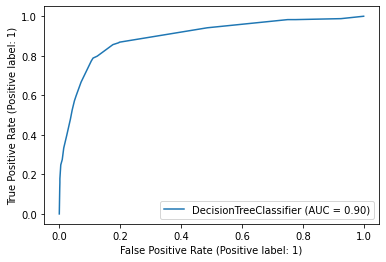

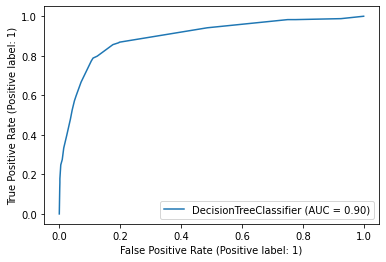

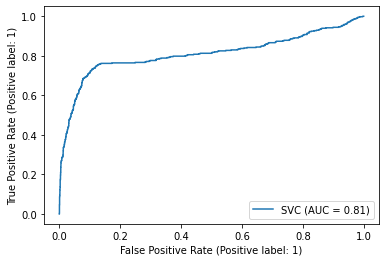

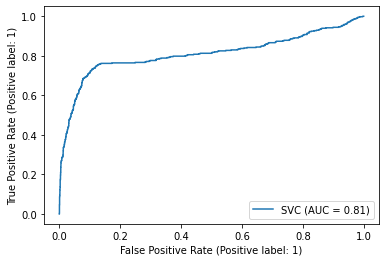

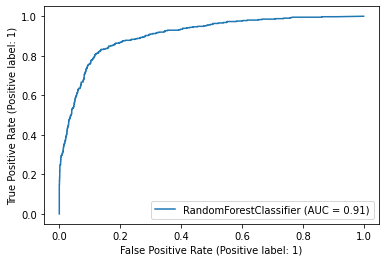

...

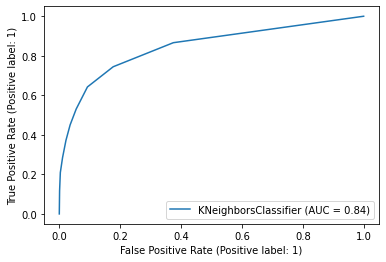

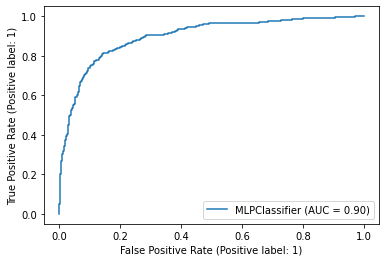

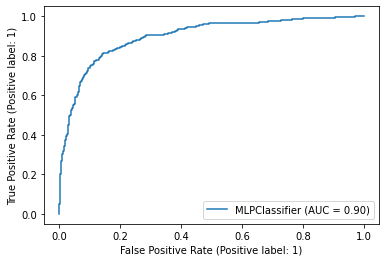

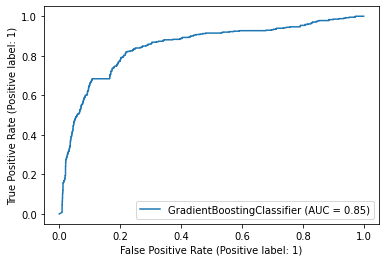

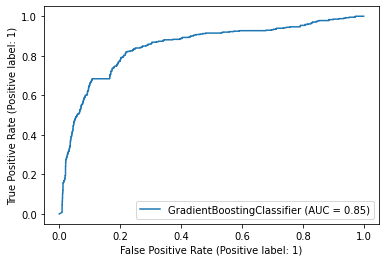

In [61]:
baseline_d1 = baseline_results(base_algos,feature_selected_X_data,Y_data)

0.613728129205922
0.883617193836172
(8877, 12) (8877,) (987, 12) (987,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.291947 
0.598314606741573
0.884022708840227
(7891, 12) (7891,) (1973, 12) (1973,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.286680 
0.5961002785515321
0.8824006488240065


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


(4932, 12) (4932,) (4932, 12) (4932,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Time taken: 0.212184 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5884057971014492
0.8848337388483374
(986, 12) (986,) (8878, 12) (8878,)
Same shape 1
Same shape 2
Time taken: 0.087782 
0.5806451612903226
0.8787510137875101
(493, 12) (493,) (9371, 12) (9371,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Time taken: 0.168891 
0.6501079913606912
0.8686131386861314


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.578241430700447
0.8852392538523925
(8877, 12) (8877,) (987, 12) (987,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 82.227076 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5604900459418071
0.883617193836172
(7891, 12) (7891,) (1973, 12) (1973,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 74.028666 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.558282208588957
0.8832116788321168
(4932, 12) (4932,) (4932, 12) (4932,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 47.160211 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5474683544303798
0.884022708840227
(986, 12) (986,) (8878, 12) (8878,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 16.541375 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5135566188197768
0.8763179237631792
(493, 12) (493,) (9371, 12) (9371,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 13.580151 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5229793977812995
0.8779399837793999
0.5991440798858775
0.8860502838605029
(8877, 12) (8877,) (987, 12) (987,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 19.835839 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5932452276064611
0.8876723438767234
(7891, 12) (7891,) (1973, 12) (1973,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 19.313980 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5985611510791367
0.8868613138686131
(4932, 12) (4932,) (4932, 12) (4932,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 17.664958 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5913043478260869
0.8856447688564477
(986, 12) (986,) (8878, 12) (8878,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 13.239585 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5857740585774059
0.8795620437956204
(493, 12) (493,) (9371, 12) (9371,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 11.964469 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6313131313131314
0.8815896188158961
0.5530642750373693
0.8787510137875101
(8877, 12) (8877,) (987, 12) (987,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.715137 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5390505359877489
0.8779399837793999
(7891, 12) (7891,) (1973, 12) (1973,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.986505 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5335365853658537
0.8759124087591241
(4932, 12) (4932,) (4932, 12) (4932,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.523040 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5103011093502378
0.8746958637469586
(986, 12) (986,) (8878, 12) (8878,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.379254 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5165354330708661
0.875506893755069
(493, 12) (493,) (9371, 12) (9371,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.207430 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.4769736842105263
0.8710462287104623


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0.6210670314637483
0.8876723438767234
(8877, 12) (8877,) (987, 12) (987,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\metrics\_plot\roc_curve.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


Same shape 5
Time taken: 191.915400 
0.627939142461964
0.8909164639091647
(7891, 12) (7891,) (1973, 12) (1973,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 189.782867 
0.6124137931034482
0.8860502838605029
(4932, 12) (4932,) (4932, 12) (4932,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 177.372535 
0.5977961432506886
0.8815896188158961
(986, 12) (986,) (8878, 12) (8878,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 162.189469 
0.6157894736842104
0.8815896188158961
(493, 12) (493,) (9371, 12) (9371,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1
Same shape 2
Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4
Same shape 5
Time taken: 103.414195 
0.6345177664974619
0.8832116788321168


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5638297872340425
0.8669910786699108
(8877, 12) (8877,) (987, 12) (987,)
Same shape 1
Same shape 2
Time taken: 34.394887 
0.5910931174089069
0.8771289537712895
(7891, 12) (7891,) (1973, 12) (1973,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Time taken: 47.778675 
0.5904255319148937
0.8751013787510138
(4932, 12) (4932,) (4932, 12) (4932,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 72.109598 
0.5813333333333334
0.8726682887266829
(986, 12) (986,) (8878, 12) (8878,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 9.324450 
0.6216560509554141
0.8795620437956204
(493, 12) (493,) (9371, 12) (9371,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Time taken: 6.776751 
0.5879518072289157
0.8613138686131386


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


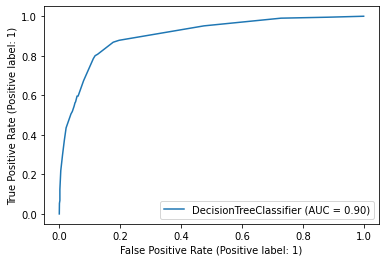

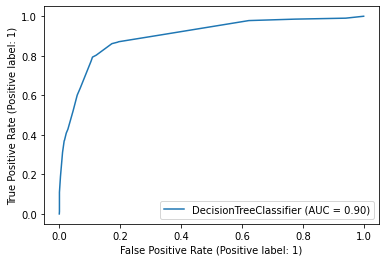

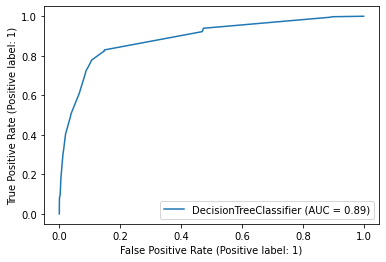

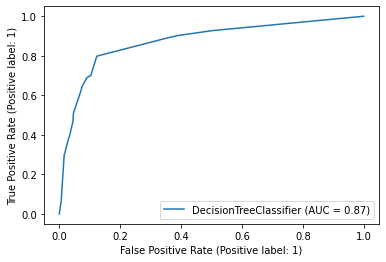

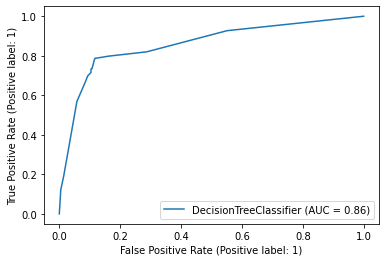

...

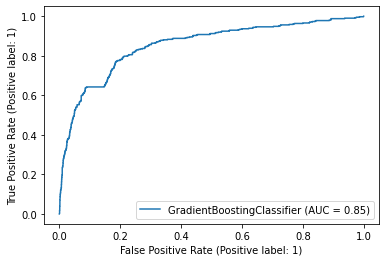

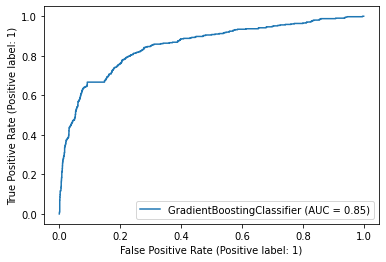

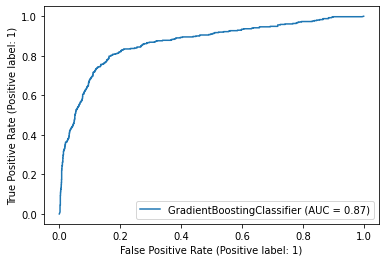

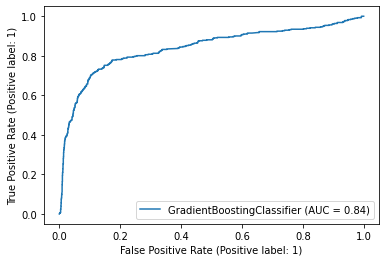

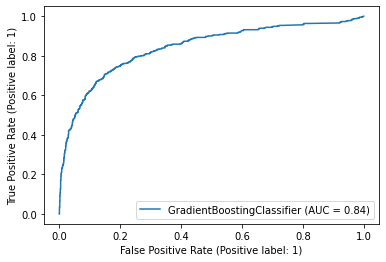

In [67]:
#First level traverse = Each algorithm's 5 unlabelled data
#Second level traverse =  Each Unlabelled version
#Thrid level traverse = F1 or accuracy

final_results_d1_self = []
for i in base_algos:
    clf1, self_d1_metrics = self_training(i, X_train, X_test, y_train, y_test)
    final_results_d1_self.append(self_d1_metrics)

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X_under,y_under, test_size=0.2,random_state = 42)
clf1_under_tree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth=5, min_samples_leaf = 5) #max_features = 9
clf1_under_svm = svm.SVC(C=1, probability=True)
clf1_under_rf = RandomForestClassifier(n_estimators=200, min_samples_split=5, max_features='sqrt', max_depth=23)
clf1_under_knn = KNeighborsClassifier(weights = 'distance', n_neighbors=15, metric='manhattan')
clf1_under_mlp = MLPClassifier(solver= 'adam', learning_rate ='constant', hidden_layer_sizes= (50, 100, 50), alpha= 0.0001, activation= 'tanh')
clf1_under_gb = GradientBoostingClassifier(n_estimators= 250, max_depth= 9, learning_rate= 1)

base_algos_under = [clf1_under_tree,clf1_under_svm,clf1_under_rf,clf1_under_knn,clf1_under_mlp,clf1_under_gb]

C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7978290366350068
0.9278799612778316


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8005997001499251
0.9356243949661182


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8017118402282455
0.9327202323330106


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7388535031847135
0.920619554695063


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7914285714285715
0.9293320425943853
0.7641379310344827
0.9172313649564375


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


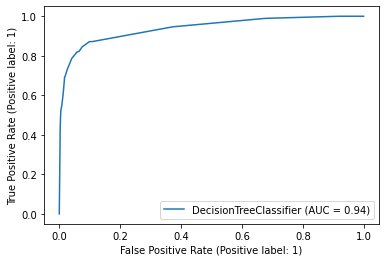

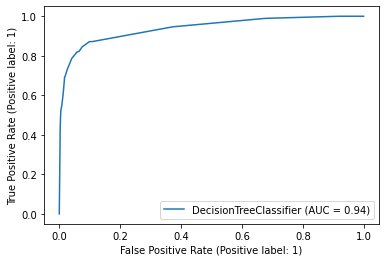

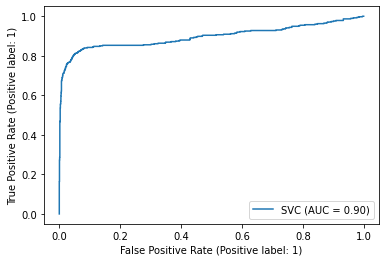

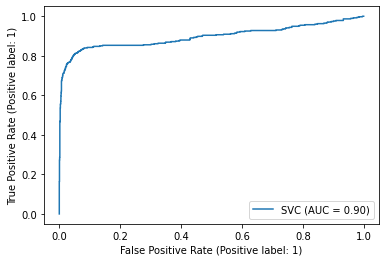

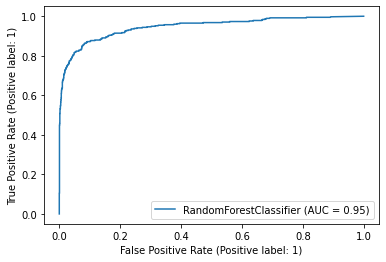

...

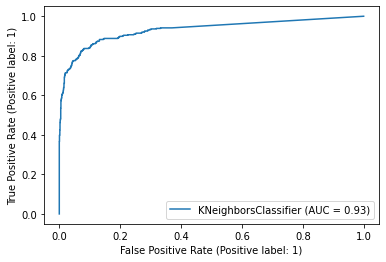

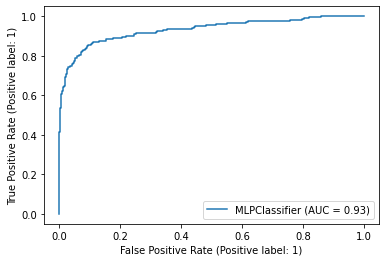

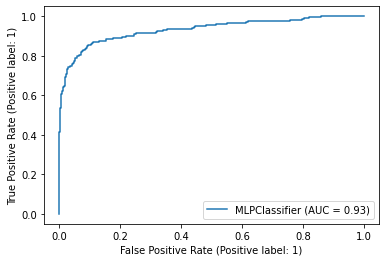

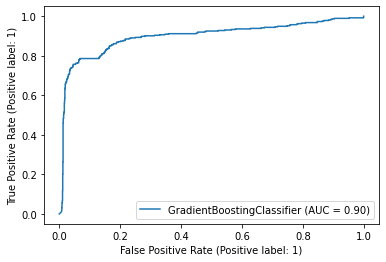

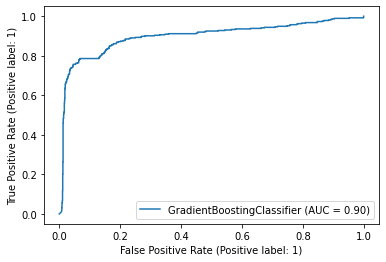

In [58]:
baseline_under = baseline_results(base_algos_under,X_under,y_under)

0.7988904299583912
0.9298160696999032
(7434, 12) (7434,) (826, 12) (826,)
Same shape 1
Same shape 2
Time taken: 0.138670 
0.8
0.9298160696999032
(6608, 12) (6608,) (1652, 12) (1652,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 0.099133 
0.7950481430536451
0.9278799612778316
(4130, 12) (4130,) (4130, 12) (4130,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.223503 
0.8016194331983805
0.9288480154888674
(826, 12) (826,) (7434, 12) (7434,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Same shape 3
Time taken: 0.128655 
0.7713004484304933
0.92594385285576
(413, 12) (413,) (7847, 12) (7847,)
Same shape 1
Same shape 2
Time taken: 0.081652 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6962552011095701
0.8939980638915779
0.8005997001499251
0.9356243949661182
(7434, 12) (7434,) (826, 12) (826,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 48.368031 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7933130699088146
0.9341723136495643
(6608, 12) (6608,) (1652, 12) (1652,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 41.910906 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7957317073170731
0.9351403678606002
(4130, 12) (4130,) (4130, 12) (4130,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 28.088577 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.790909090909091
0.9332042594385286
(826, 12) (826,) (7434, 12) (7434,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 11.627143 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7260726072607261
0.9196515004840271
(413, 12) (413,) (7847, 12) (7847,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 9.087246 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.629090909090909
0.9012584704743466
0.7994310099573256
0.9317521781219749
(7434, 12) (7434,) (826, 12) (826,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 15.996671 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8017118402282455
0.9327202323330106
(6608, 12) (6608,) (1652, 12) (1652,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 15.625767 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8028571428571428
0.9332042594385286
(4130, 12) (4130,) (4130, 12) (4130,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 14.251684 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7804878048780488
0.92594385285576
(826, 12) (826,) (7434, 12) (7434,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 10.497585 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7713004484304933
0.92594385285576
(413, 12) (413,) (7847, 12) (7847,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 9.452634 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7701674277016743
0.9269119070667957
0.7388535031847135
0.920619554695063
(7434, 12) (7434,) (826, 12) (826,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.810303 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7258064516129034
0.9177153920619555
(6608, 12) (6608,) (1652, 12) (1652,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.798505 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7201309328968903
0.9172313649564375
(4130, 12) (4130,) (4130, 12) (4130,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.140155 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6893039049235993
0.9114230396902226
(826, 12) (826,) (7434, 12) (7434,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.873390 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.58195211786372
0.8901258470474347
(413, 12) (413,) (7847, 12) (7847,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.707242 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.502970297029703
0.8785091965150048


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0.7896995708154507
0.9288480154888674
(7434, 12) (7434,) (826, 12) (826,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\metrics\_plot\roc_curve.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


Same shape 4
Time taken: 169.799164 
0.7994227994227994
0.9327202323330106
(6608, 12) (6608,) (1652, 12) (1652,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 207.188820 
0.8035190615835777
0.9351403678606002
(4130, 12) (4130,) (4130, 12) (4130,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 4
Time taken: 151.468537 
0.7869318181818181
0.9273959341723137
(826, 12) (826,) (7434, 12) (7434,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2
Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 4
Time taken: 127.643829 
0.7757575757575758
0.9283639883833494
(413, 12) (413,) (7847, 12) (7847,)
Same shape 1
Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3
Same shape 4
Time taken: 103.258940 
0.7627906976744185
0.92594385285576


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7961165048543689
0.9288480154888674
(7434, 12) (7434,) (826, 12) (826,)
Same shape 1
Same shape 2
Time taken: 24.231825 
0.7748976807639838
0.920135527589545
(6608, 12) (6608,) (1652, 12) (1652,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 20.095179 
0.7865168539325842
0.9264278799612778
(4130, 12) (4130,) (4130, 12) (4130,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 12.855279 
0.776406035665295
0.9211035818005808
(826, 12) (826,) (7434, 12) (7434,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Time taken: 5.845986 
0.7576197387518143
0.9191674733785092
(413, 12) (413,) (7847, 12) (7847,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 1.591358 
0.688259109311741
0.888189738625363


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


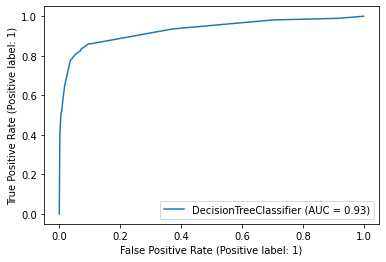

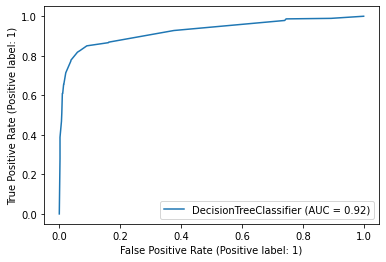

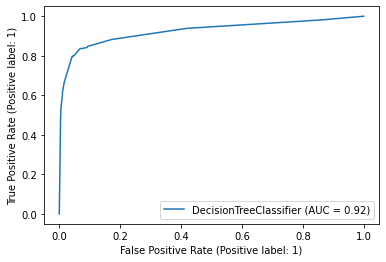

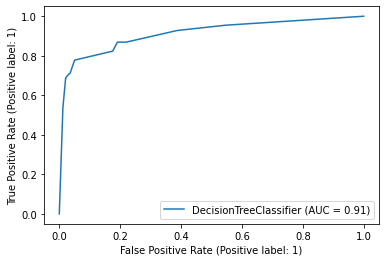

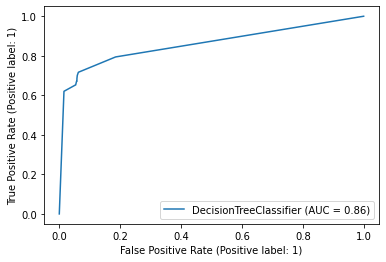

...

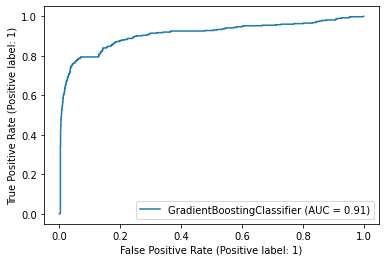

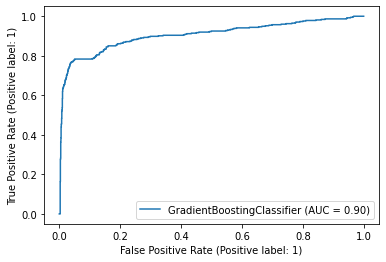

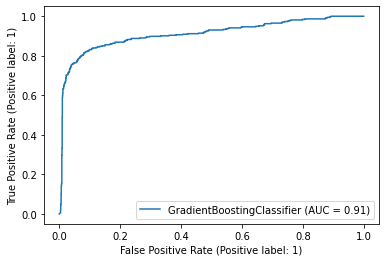

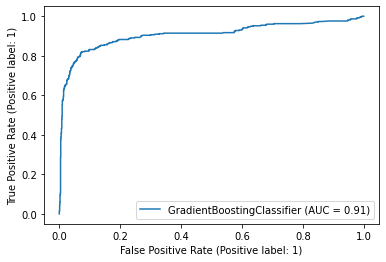

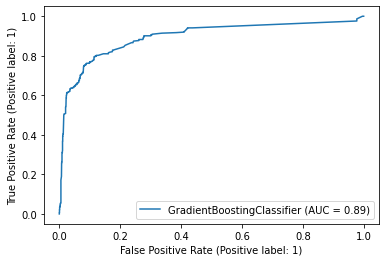

In [68]:
#First level traverse = Each algorithm's 5 unlabelled data
#Second level traverse =  Each Unlabelled version
#Thrid level traverse = F1 or accuracy

final_results_under_self = []
for i in base_algos_under:
    clf1_under, self_under_metrics = self_training(i, X_train, X_test, y_train, y_test)
    final_results_under_self.append(self_under_metrics)
    

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X_over,y_over, test_size=0.2,random_state = 42)

clf1_over_tree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth=None, min_samples_leaf = 1) #max_features = 8
clf1_over_svm = svm.SVC(C=10, probability=True)
clf1_over_rf = RandomForestClassifier(n_estimators=110, min_samples_split=5, max_features='auto', max_depth=23)
clf1_over_knn = KNeighborsClassifier(weights = 'distance', n_neighbors=11, metric='manhattan')
clf1_over_mlp = MLPClassifier(solver= 'adam', learning_rate ='constant', hidden_layer_sizes= (50, 100, 50), alpha= 0.0001, activation= 'tanh')
clf1_over_gb = GradientBoostingClassifier(n_estimators= 250, max_depth= 9, learning_rate= 1)


base_algos_over = [clf1_over_tree,clf1_over_svm,clf1_over_rf,clf1_over_knn,clf1_over_mlp,clf1_over_gb]

C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8885245901639345
0.8858239385943871


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8621529469069654
0.8642360278244183


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.9167054443927408
0.9141280882705685


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.9090094128193635
0.9026145358599185


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.9030600327026396
0.9004557447829216


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.9242990654205607
0.9222835212281123


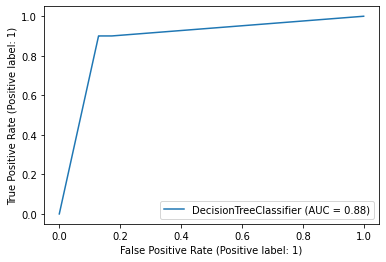

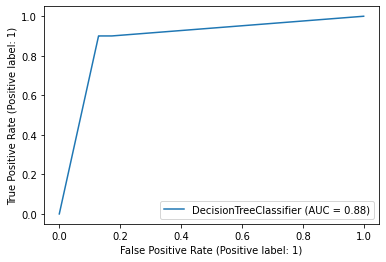

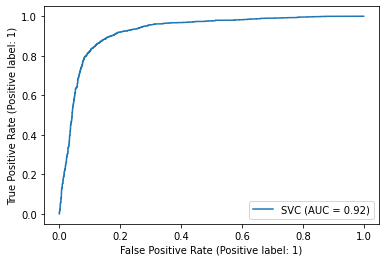

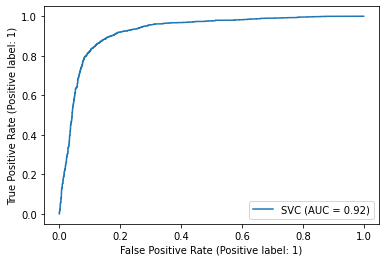

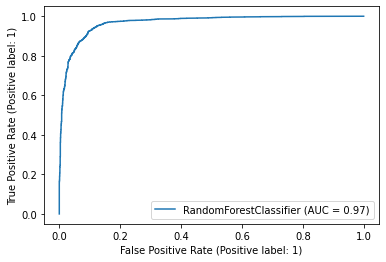

...

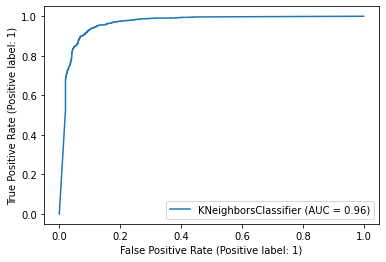

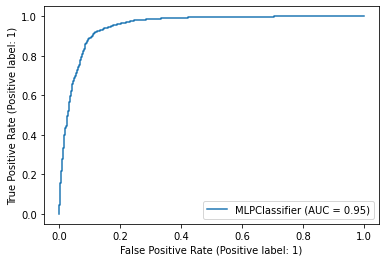

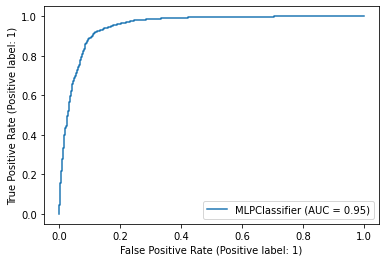

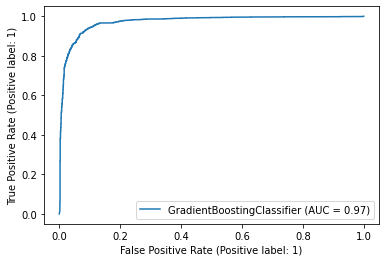

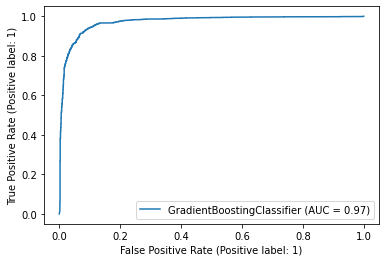

In [56]:
baseline_over = baseline_results(base_algos_over,X_over,y_over)

0.8847425602267358
0.8829455504917246
(15007, 12) (15007,) (1668, 12) (1668,)
Same shape 1
Time taken: 0.216507 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8880544473128374
0.8855840729191653
(13340, 12) (13340,) (3335, 12) (3335,)
Same shape 1
Time taken: 0.218566 
0.8754414881092536
0.8731110578076278
(8337, 12) (8337,) (8338, 12) (8338,)
Same shape 1
Time taken: 0.135767 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8570077995745686
0.8548812664907651
(1667, 12) (1667,) (15008, 12) (15008,)
Same shape 1
Time taken: 0.056359 
0.8372857478281287
0.8337730870712401
(833, 12) (833,) (15842, 12) (15842,)
Same shape 1
Time taken: 0.047548 
0.8168154062940347
0.8129047733269369


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8555392874572961
0.8579995202686496
(15007, 12) (15007,) (1668, 12) (1668,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 340.761326 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8538611925708701
0.8565603262173183
(13340, 12) (13340,) (3335, 12) (3335,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 148.397286 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8520333170014699
0.8551211321659871
(8337, 12) (8337,) (8338, 12) (8338,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 105.861571 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8495835374816266
0.8527224754137683
(1667, 12) (1667,) (15008, 12) (15008,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 31.491656 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.828641975308642
0.8335332213960183
(833, 12) (833,) (15842, 12) (15842,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 20.265520 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8162040510127532
0.8236987287119213
0.9171322160148976
0.9146078196210122
(15007, 12) (15007,) (1668, 12) (1668,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 9.554810 
0.9126984126984128
0.9102902374670184
(13340, 12) (13340,) (3335, 12) (3335,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 9.213836 
0.9066666666666667
0.9042935955864716
(8337, 12) (8337,) (8338, 12) (8338,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 8.450259 
0.8987816307403936
0.8963780283041497
(1667, 12) (1667,) (15008, 12) (15008,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 6.447092 
0.8767319636884855
0.8762293115855121
(833, 12) (833,) (15842, 12) (15842,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 5.737774 
0.8672139063254468
0.8680738786279684


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.9090909090909091
0.9023746701846965
(15007, 12) (15007,) (1668, 12) (1668,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.465934 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.9053993752788932
0.8982969537059247
(13340, 12) (13340,) (3335, 12) (3335,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.659120 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.900268336314848
0.8930199088510434
(8337, 12) (8337,) (8338, 12) (8338,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.974877 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.88218198077353
0.8735907891580715
(1667, 12) (1667,) (15008, 12) (15008,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.965947 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.832677620921083
0.8265771168145838
(833, 12) (833,) (15842, 12) (15842,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.845779 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8153078202995009
0.8136243703526025


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0.8991850989522702
0.8961381626289278
(15007, 12) (15007,) (1668, 12) (1668,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\metrics\_plot\roc_curve.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


Same shape 5
Time taken: 296.864042 
0.8983050847457628
0.8963780283041497
(13340, 12) (13340,) (3335, 12) (3335,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 274.544942 
0.9017690875232774
0.8987766850563684
(8337, 12) (8337,) (8338, 12) (8338,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 252.838161 
0.8905345984725758
0.8865435356200527
(1667, 12) (1667,) (15008, 12) (15008,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 232.163042 
0.8551336146272855
0.8517630127128808
(833, 12) (833,) (15842, 12) (15842,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 226.904645 
0.8433847592332866
0.8392899976013433
0.9252336448598132
0.9232429839289997
(15007, 12) (15007,) (1668, 12) (1668,)
Same shape 1
Same shape 2
Time taken: 33.725340 
0.922287047841307
0.9201247301511154
(13340, 12) (13340,) (3335, 12) (3335,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Time taken: 46.732204 
0.9216740706102409
0.9196449988006716
(8337, 12) (8337,) (8338, 12) (8338,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 22.537202 
0.9101123595505618
0.9078915807147997
(1667, 12) (1667,) (15008, 12) (15008,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Time taken: 27.143039 
0.88124410933082
0.8791076996881746
(833, 12) (833,) (15842, 12) (15842,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 7.041878 
0.8608986615678776
0.8603981770208683


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


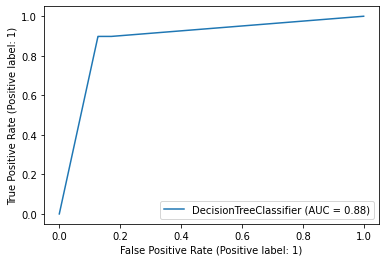

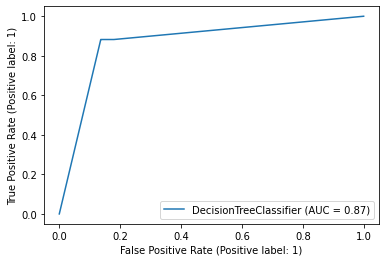

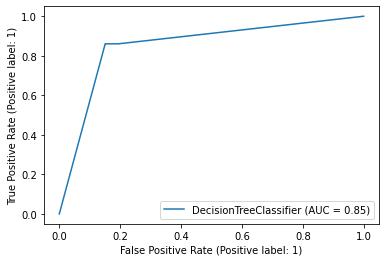

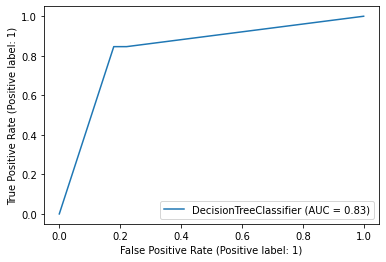

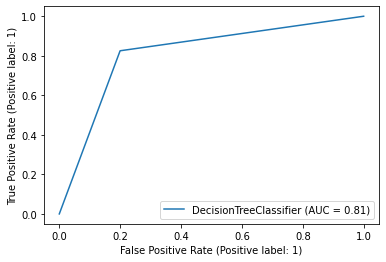

...

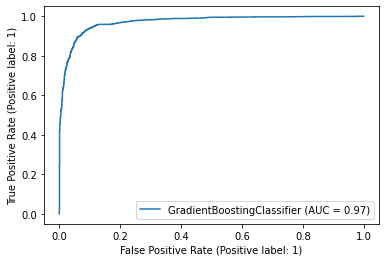

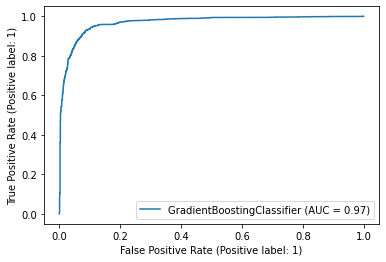

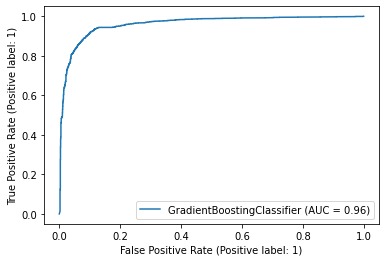

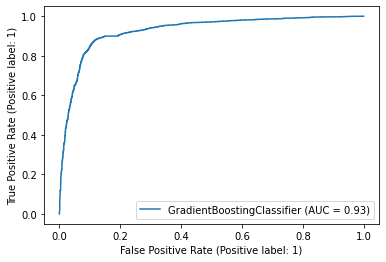

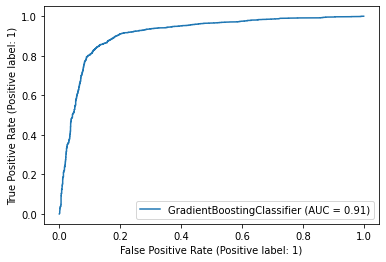

In [69]:
#First level traverse = Each algorithm's 5 unlabelled data
#Second level traverse =  Each Unlabelled version
#Thrid level traverse = F1 or accuracy

final_results_over_self = []
for i in base_algos_over:
    clf1_over, self_over_metrics = self_training(i, X_train, X_test, y_train, y_test)
    final_results_over_self.append(self_over_metrics)

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X_data2_features,Y_data2, test_size=0.2,random_state = 42)

clf2_tree = tree.DecisionTreeClassifier(criterion = 'entropy',max_features = 8, max_depth=None, min_samples_leaf = 1)
clf2_svm = svm.SVC(C=10,probability=True)
clf2_rf = RandomForestClassifier(n_estimators=155, min_samples_split=10, max_features='auto', max_depth=23)
clf2_knn = KNeighborsClassifier(weights = 'distance', n_neighbors=13, metric='manhattan')
clf2_mlp = MLPClassifier(solver= 'adam', learning_rate ='constant', hidden_layer_sizes= (50,50,50), alpha= 0.05, activation= 'relu')
clf2_gb = GradientBoostingClassifier(n_estimators= 500, max_depth= 7, learning_rate= 1,subsample=0.7)

base_algos_d2 = [clf2_tree,clf2_svm,clf2_rf,clf2_knn,clf2_mlp,clf2_gb]

C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8436724565756825
0.8581081081081081


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8823529411764707
0.8918918918918919


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8953771289537713
0.9031531531531531


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8292682926829268
0.8423423423423423


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8985507246376812
0.9054054054054054


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8786407766990293
0.8873873873873874


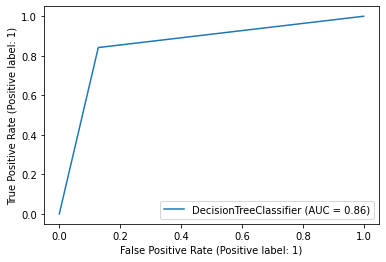

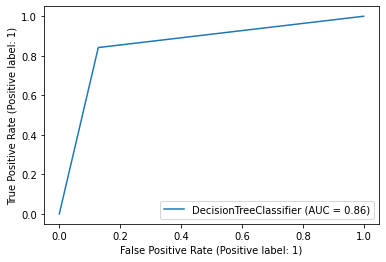

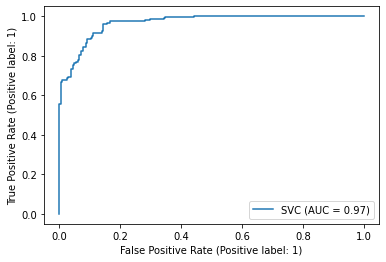

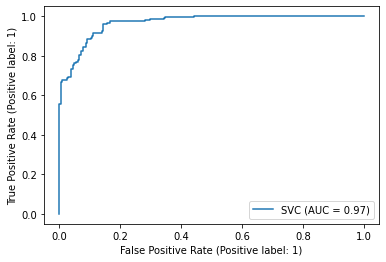

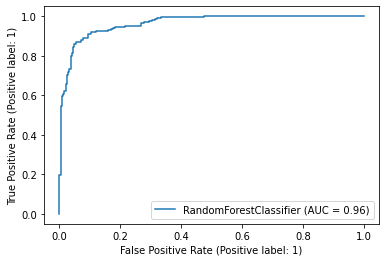

...

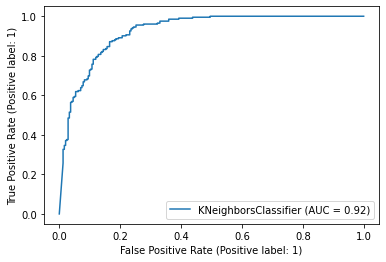

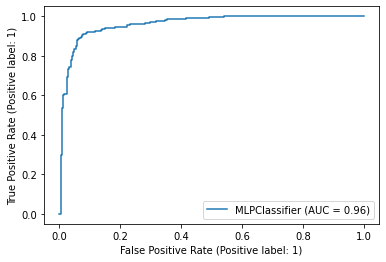

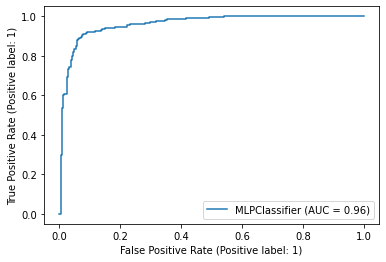

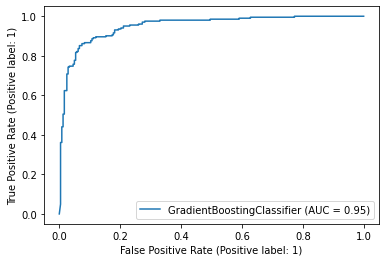

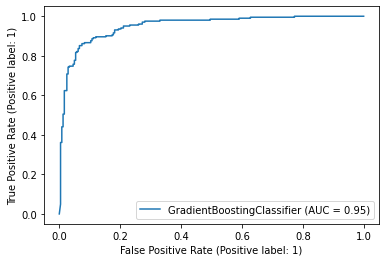

In [54]:
baseline_d2 = baseline_results(base_algos_d2,X_data2_features,Y_data2)

0.8292682926829268
0.8423423423423423
(1594, 27) (1594,) (178, 27) (178,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.072034 
0.8280871670702178
0.8400900900900901
(1417, 27) (1417,) (355, 27) (355,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.119951 
0.8289156626506023
0.8400900900900901
(886, 27) (886,) (886, 27) (886,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.133811 
0.8215962441314555
0.8288288288288288
(177, 27) (177,) (1595, 27) (1595,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.100365 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7654867256637168
0.7612612612612613
(88, 27) (88,) (1684, 27) (1684,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.119351 
0.6627680311890838
0.6103603603603603


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8079800498753117
0.8265765765765766
(1594, 27) (1594,) (178, 27) (178,)
Same shape 1
Time taken: 0.009055 
0.8118811881188119
0.8288288288288288
(1417, 27) (1417,) (355, 27) (355,)
Same shape 1
Time taken: 0.010815 
0.832535885167464
0.8423423423423423
(886, 27) (886,) (886, 27) (886,)
Same shape 1
Time taken: 0.015697 
0.7915690866510537
0.7995495495495496
(177, 27) (177,) (1595, 27) (1595,)
Same shape 1
Time taken: 0.007802 
0.7535545023696681
0.7657657657657657
(88, 27) (88,) (1684, 27) (1684,)
Same shape 1
Time taken: 0.008518 
0.7384615384615385
0.7319819819819819
0.8823529411764707
0.8918918918918919
(1594, 27) (1594,) (178, 27) (178,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.392695 
0.8801955990220048
0.8896396396396397
(1417, 27) (1417,) (355, 27) (355,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.304579 
0.8774509803921567
0.8873873873873874
(886, 27) (886,) (886, 27) (886,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.111226 
0.8535980148883374
0.8671171171171171
(177, 27) (177,) (1595, 27) (1595,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.721289 
0.8377723970944311
0.8490990990990991
(88, 27) (88,) (1684, 27) (1684,)
Same shape 1
Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 3
Same shape 4
Same shape 5
Time taken: 0.660230 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7832167832167832
0.7905405405405406
0.8932038834951457
0.9009009009009009
(1594, 27) (1594,) (178, 27) (178,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.561604 
0.8932038834951457
0.9009009009009009
(1417, 27) (1417,) (355, 27) (355,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.480236 
0.8878048780487806
0.8963963963963963
(886, 27) (886,) (886, 27) (886,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.363105 
0.8729016786570744
0.8806306306306306
(177, 27) (177,) (1595, 27) (1595,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.234763 
0.8477751756440282
0.8536036036036037
(88, 27) (88,) (1684, 27) (1684,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 1.229773 
0.8266666666666668
0.8243243243243243
0.8292682926829268
0.8423423423423423
(1594, 27) (1594,) (178, 27) (178,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.069065 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\metrics\_plot\roc_curve.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcP

0.8280871670702178
0.8400900900900901
(1417, 27) (1417,) (355, 27) (355,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.084006 
0.8289156626506023
0.8400900900900901
(886, 27) (886,) (886, 27) (886,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.120702 
0.8215962441314555
0.8288288288288288
(177, 27) (177,) (1595, 27) (1595,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.140460 
0.7654867256637168
0.7612612612612613
(88, 27) (88,) (1684, 27) (1684,)
Same shape 1
Same shape 2
Same shape 3


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 4
Same shape 5
Time taken: 0.097860 
0.6627680311890838
0.6103603603603603


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0.8968824940047961
0.9031531531531531
(1594, 27) (1594,) (178, 27) (178,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Time taken: 6.604294 
0.8813559322033897
0.8896396396396397
(1417, 27) (1417,) (355, 27) (355,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Time taken: 5.460730 
0.8883374689826302
0.8986486486486487
(886, 27) (886,) (886, 27) (886,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 3
Time taken: 8.395394 
0.8823529411764707
0.8918918918918919
(177, 27) (177,) (1595, 27) (1595,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1
Same shape 2
Same shape 3
Time taken: 5.348732 
0.8300970873786407
0.8423423423423423
(88, 27) (88,) (1684, 27) (1684,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Time taken: 4.989597 
0.7685393258426968
0.7680180180180181


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8776978417266188
0.8851351351351351
(1594, 27) (1594,) (178, 27) (178,)
Same shape 1
Same shape 2
Time taken: 1.664019 
0.8894348894348895
0.8986486486486487
(1417, 27) (1417,) (355, 27) (355,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 1.707707 
0.894736842105263
0.9009009009009009
(886, 27) (886,) (886, 27) (886,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Time taken: 1.361022 
0.8872549019607844
0.8963963963963963
(177, 27) (177,) (1595, 27) (1595,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Time taken: 1.055751 
0.8591549295774648
0.8648648648648649
(88, 27) (88,) (1684, 27) (1684,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Same shape 3
Time taken: 2.278664 
0.7334754797441364
0.7184684684684685


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


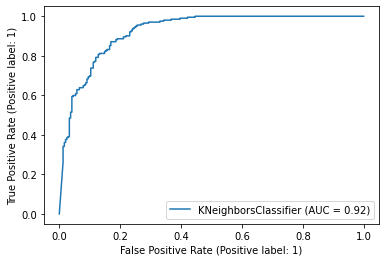

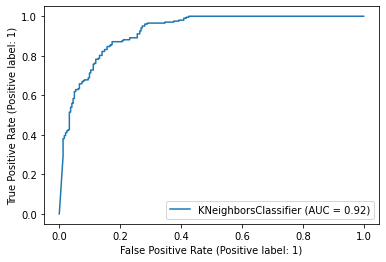

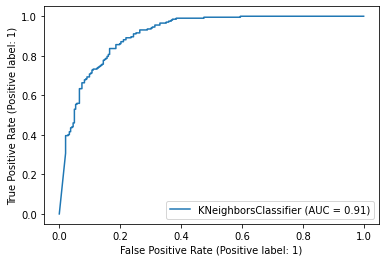

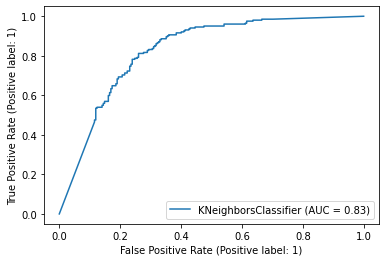

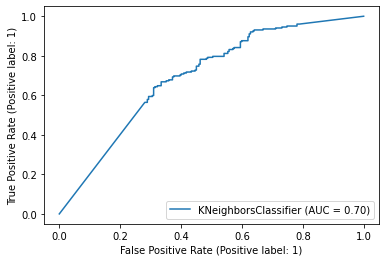

...

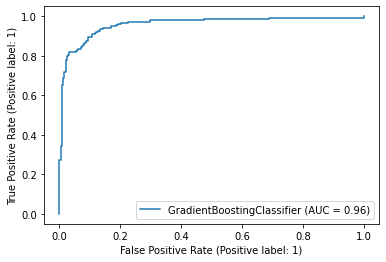

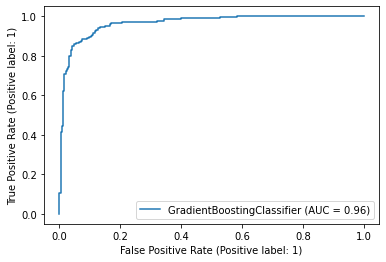

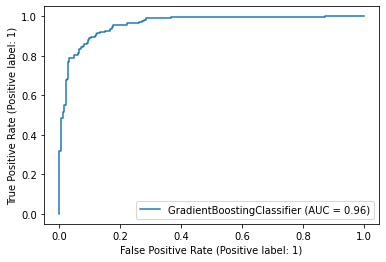

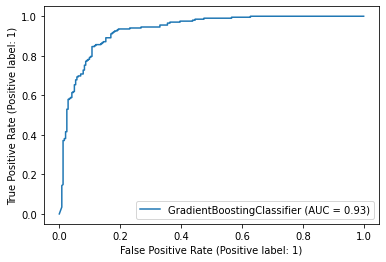

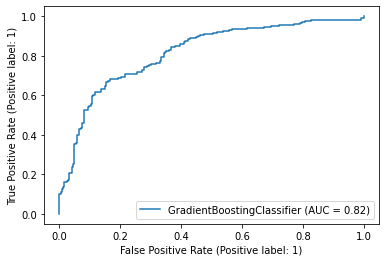

In [70]:
final_results_d2_self = []
for i in base_algos_d2:
    clf2, self_d2_metrics = self_training(i, X_train, X_test, y_train, y_test)
    final_results_d2_self.append(self_d2_metrics)

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X_data3_features,Y_data3, test_size=0.2,random_state = 42)

clf3_tree = tree.DecisionTreeClassifier(criterion = 'entropy',max_features = 9, max_depth=5, min_samples_leaf = 5)
clf3_svm = svm.SVC(C=1,probability=True)
clf3_rf = RandomForestClassifier(n_estimators=155, min_samples_split=10, max_features='sqrt', max_depth=45)
clf3_knn = KNeighborsClassifier(weights = 'uniform', n_neighbors=7, metric='minkowski') #Performs the best for dataset 3
clf3_mlp = MLPClassifier(solver= 'adam', learning_rate ='constant', hidden_layer_sizes= (50,50,50), alpha= 0.001, activation= 'tanh')
clf3_gb = GradientBoostingClassifier(n_estimators= 50, max_depth= 1, learning_rate= 0.1,subsample=1)

base_algos_d3 = [clf3_tree,clf3_svm,clf3_rf,clf3_knn,clf3_mlp,clf3_gb]

C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8064516129032259
0.8032786885245902
0.8852459016393444
0.8852459016393442


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8387096774193549
0.8360655737704918
0.8923076923076922
0.8852459016393442


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: F

0.8571428571428571
0.8524590163934426
0.8571428571428571
0.8524590163934426


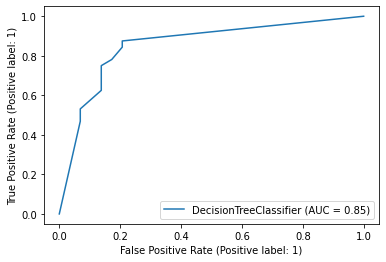

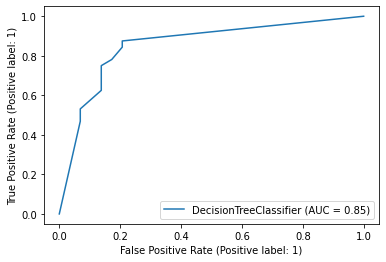

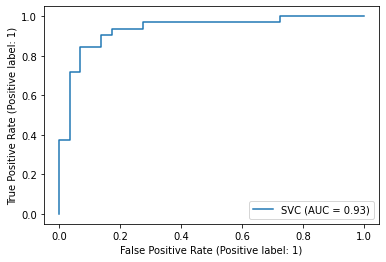

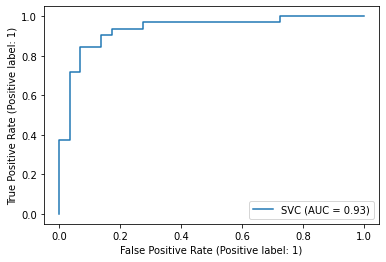

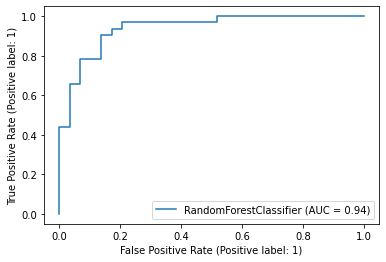

...

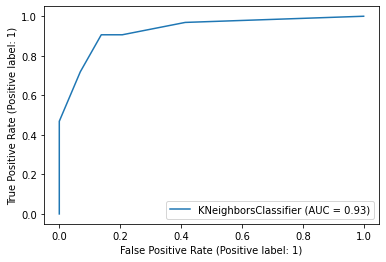

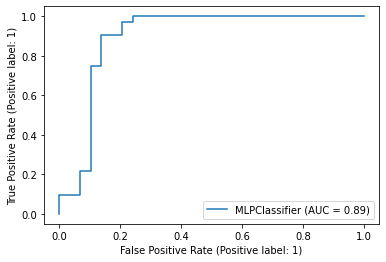

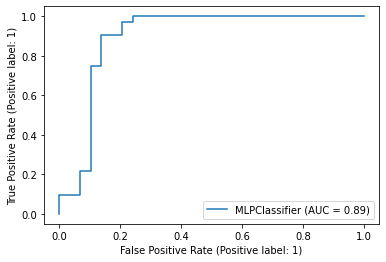

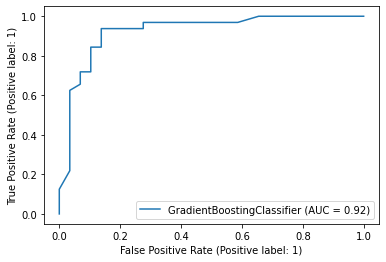

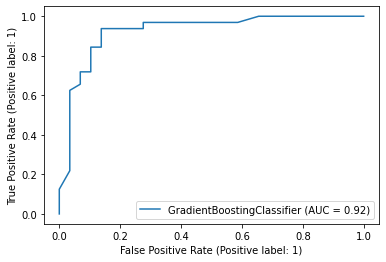

In [52]:
baseline_d3 = baseline_results(base_algos_d3,X_data3_features,Y_data3)

0.8923076923076922
0.8852459016393442
(217, 15) (217,) (25, 15) (25,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.039836 
0.90625
0.9016393442622951
(193, 15) (193,) (49, 15) (49,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.050560 
0.90625
0.9016393442622951
(121, 15) (121,) (121, 15) (121,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.040977 
0.8615384615384615
0.8524590163934426
(24, 15) (24,) (218, 15) (218,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.049135 
0.870967741935484
0.8688524590163934
(12, 15) (12,) (230, 15) (230,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.037519 
0.8888888888888888
0.8852459016393442
0.7796610169491525
0.7868852459016393
(217, 15) (217,) (25, 15) (25,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Time taken: 0.028194 
0.7857142857142857
0.8032786885245902
(193, 15) (193,) (49, 15) (49,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Time taken: 0.029467 
0.71875
0.7049180327868853
(121, 15) (121,) (121, 15) (121,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.037698 
0.78125
0.7704918032786885
(24, 15) (24,) (218, 15) (218,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Time taken: 0.031889 
0.8387096774193549
0.8360655737704918
(12, 15) (12,) (230, 15) (230,)
Same shape 1
Time taken: 0.009030 
0.742857142857143
0.7049180327868853
0.8852459016393444
0.8852459016393442
(217, 15) (217,) (25, 15) (25,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.082180 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8852459016393444
0.8852459016393442
(193, 15) (193,) (49, 15) (49,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.072653 
0.8888888888888888
0.8852459016393442
(121, 15) (121,) (121, 15) (121,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.080900 


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8888888888888888
0.8852459016393442
(24, 15) (24,) (218, 15) (218,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.058121 
0.9032258064516129
0.9016393442622951
(12, 15) (12,) (230, 15) (230,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.075125 
0.8823529411764706
0.8688524590163934


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8888888888888888
0.8852459016393442
(217, 15) (217,) (25, 15) (25,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.764534 
0.8571428571428571
0.8524590163934426
(193, 15) (193,) (49, 15) (49,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.781749 
0.8923076923076922
0.8852459016393442
(121, 15) (121,) (121, 15) (121,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.748827 
0.8571428571428571
0.8524590163934426
(24, 15) (24,) (218, 15) (218,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.830838 
0.8333333333333334
0.8360655737704918
(12, 15) (12,) (230, 15) (230,)


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.641626 
0.7948717948717949
0.7377049180327869
0.8923076923076922
0.8852459016393442
(217, 15) (217,) (25, 15) (25,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.050703 
0.90625
0.9016393442622951
(193, 15) (193,) (49, 15) (49,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.040352 
0.90625
0.9016393442622951


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\metrics\_plot\roc_curve.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcP

(121, 15) (121,) (121, 15) (121,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.040092 
0.8615384615384615
0.8524590163934426
(24, 15) (24,) (218, 15) (218,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 0.059240 
0.870967741935484
0.8688524590163934
(12, 15) (12,) (230, 15) (230,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

Same shape 5
Time taken: 0.049578 
0.8888888888888888
0.8852459016393442


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0.875
0.8688524590163934
(217, 15) (217,) (25, 15) (25,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Time taken: 1.523402 
0.870967741935484
0.8688524590163934
(193, 15) (193,) (49, 15) (49,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 3
Time taken: 2.139514 
0.875
0.8688524590163934
(121, 15) (121,) (121, 15) (121,)


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 3
Time taken: 1.985609 
0.870967741935484
0.8688524590163934
(24, 15) (24,) (218, 15) (218,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4
Same shape 5
Time taken: 2.557453 
0.9032258064516129
0.9016393442622951
(12, 15) (12,) (230, 15) (230,)
Same shape 1


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 2
Time taken: 0.593611 
0.870967741935484
0.8688524590163934
0.8571428571428571
0.8524590163934426
(217, 15) (217,) (25, 15) (25,)
Same shape 1
Same shape 2
Time taken: 0.055916 
0.875
0.8688524590163934
(193, 15) (193,) (49, 15) (49,)
Same shape 1
Same shape 2


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 3
Same shape 4
Same shape 5
Time taken: 0.143257 
0.8923076923076922
0.8852459016393442
(121, 15) (121,) (121, 15) (121,)
Same shape 1
Same shape 2
Same shape 3
Same shape 4


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Same shape 5
Time taken: 0.146431 
0.8615384615384615
0.8524590163934426
(24, 15) (24,) (218, 15) (218,)
Same shape 1
Same shape 2
Time taken: 0.048868 
0.8571428571428571
0.8524590163934426
(12, 15) (12,) (230, 15) (230,)
Same shape 1
Time taken: 0.018478 
0.8333333333333334
0.8360655737704918


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


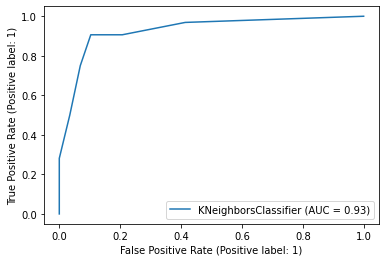

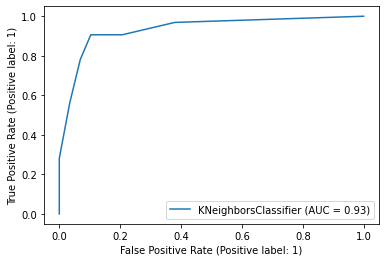

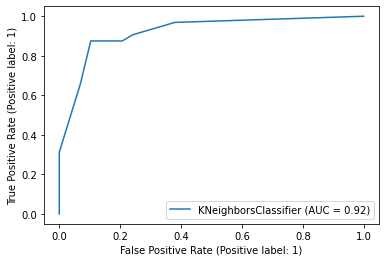

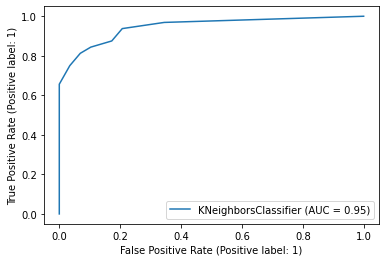

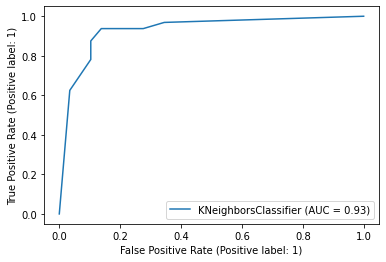

...

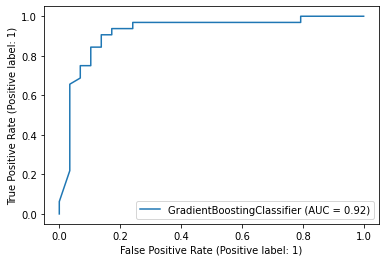

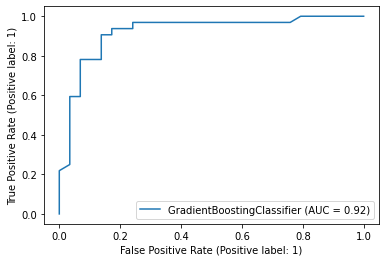

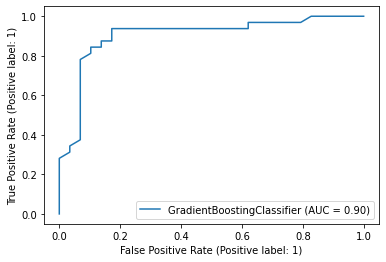

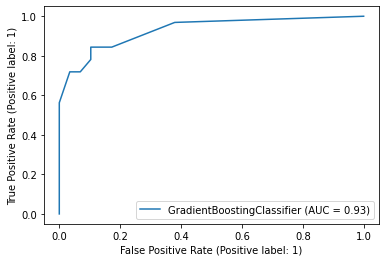

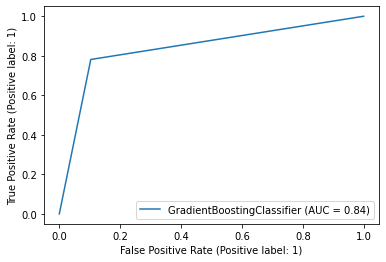

In [72]:


#First level traverse = Each algorithm's 5 unlabelled data
#Second level traverse =  Each Unlabelled version
#Thrid level traverse = F1 or accuracy

final_results_d3_self = []
for i in base_algos_d3:
    clf3, self_d3_metrics = self_training(i, X_train, X_test, y_train, y_test)
    final_results_d3_self.append(self_d3_metrics)


In [74]:
#Tune models ie. find best performing models for each dataset version 
#Maybe hyperparameter tuning needed for this

self_final_results = [final_results_d1_self,
final_results_under_self,
final_results_over_self,
final_results_d2_self,
final_results_d3_self]

self_final_results

[[[[0.598314606741573, 0.884022708840227, 0.2919471263885498],
   [0.5961002785515321, 0.8824006488240065, 0.2866804599761963],
   [0.5884057971014492, 0.8848337388483374, 0.21218419075012207],
   [0.5806451612903226, 0.8787510137875101, 0.08778166770935059],
   [0.6501079913606912, 0.8686131386861314, 0.16889119148254395]],
  [[0.5604900459418071, 0.883617193836172, 82.22707557678223],
   [0.558282208588957, 0.8832116788321168, 74.02866554260254],
   [0.5474683544303798, 0.884022708840227, 47.160210847854614],
   [0.5135566188197768, 0.8763179237631792, 16.541375398635864],
   [0.5229793977812995, 0.8779399837793999, 13.580151081085205]],
  [[0.5932452276064611, 0.8876723438767234, 19.835838556289673],
   [0.5985611510791367, 0.8868613138686131, 19.31398034095764],
   [0.5913043478260869, 0.8856447688564477, 17.664957523345947],
   [0.5857740585774059, 0.8795620437956204, 13.239584922790527],
   [0.6313131313131314, 0.8815896188158961, 11.964469194412231]],
  [[0.5390505359877489, 0.8

NOTE: After training, these results were stored in a .txt file so that it can be retrieved at a later stage for performing statistical test and analysis

## Algorithm 2: Semi-supervised ensemble

The semi-supervised boosting algorithm SemiBoost addresses the problem of selecting data
points to be used by the base learners by relying on the manifold assumption, utilizing
principles from graph-based methods. ASSEMBLE technique faced this problem which is the reason why SEMIBOOST is chosen over ASSEMBLE.

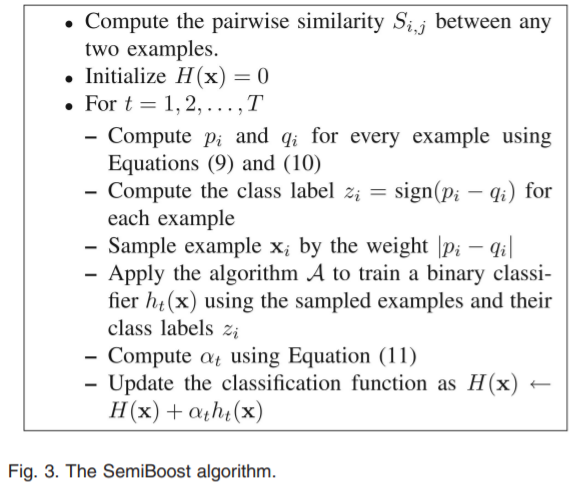

In [89]:
import numpy as np
from sklearn import neighbors
from sklearn.svm import SVC
from scipy import sparse
from scipy.spatial.distance import pdist,squareform
from sklearn.metrics.pairwise import rbf_kernel


In [90]:

def semi_boost_fit(X, y, base_model=SVC(gamma='auto', degree=2,kernel='rbf',C=10,probability=True)):
    models_list = []
    weights_list = []
    n_neighbors=4
    n_jobs = 1
    max_models = 15
    sample_percent = 0.5
    sigma_percentile = 90
    similarity_kernel = 'rbf'
    verbose = True
    
    ''' Fit model'''
        # Localize labeled data
    idx_label = np.argwhere((y == 0) | (y == 1)).flatten() # labels[0] and 1
    idx_not_label = np.array([i for i in np.arange(len(y)) if i not in idx_label])
    
    # The parameter C is defined in the paper as
    C = idx_label.shape[0]/idx_not_label.shape[0]
    
        # First we need to create the similarity matrix
    if similarity_kernel == 'knn':

        S = neighbors.kneighbors_graph(X,
                                            n_neighbors=n_neighbors,
                                            mode='distance',
                                            include_self=True,
                                            n_jobs=n_jobs)

        S = sparse.csr_matrix(S)

    elif similarity_kernel == 'rbf':
        # First aprox
        S = np.sqrt(rbf_kernel(X, gamma = 1))
        # set gamma parameter as the 15th percentile
        sigma = np.percentile(np.log(S), sigma_percentile)
        sigma_2 = (1/sigma**2)*np.ones((S.shape[0],S.shape[0]))
        S = np.power(S, sigma_2)
        # Matrix to sparse
        S = sparse.csr_matrix(S)

    else:
        print('No kernel type ', similarity_kernel)
        
    #=============================================================
        # Initialise variables
        #=============================================================
        
    H = np.zeros(idx_not_label.shape[0])

    # Loop for adding sequential models
    for t in range(15):
        #=============================================================
        # Calculate p_i and q_i for every sample
        #=============================================================
        p_1 = np.einsum('ij,j', S[:,idx_label].todense(), (y[idx_label]==1))[idx_not_label]*np.exp(-2*H)
        p_2 = np.einsum('ij,j', S[:,idx_not_label].todense(), np.exp(H))[idx_not_label]*np.exp(-H)
        p = np.add(p_1, p_2)
        p = np.squeeze(np.asarray(p))

        q_1 = np.einsum('ij,j', S[:,idx_label].todense(), (y[idx_label]==-1))[idx_not_label]*np.exp(2*H)
        q_2 = np.einsum('ij,j', S[:,idx_not_label].todense(), np.exp(-H))[idx_not_label]*np.exp(H)
        q = np.add(q_1, q_2)
        q = np.squeeze(np.asarray(q))

        # Compute predicted label z_i

        z = np.sign(p-q)

        z_conf = np.abs(p-q)

        # Sample sample_percent most confident predictions

        # Sampling weights
        sample_weights = z_conf/np.sum(z_conf)
        # If there are non-zero weights
        if np.any(sample_weights != 0):
            try:
                idx_aux = np.random.choice(np.arange(z.size),
                                              size = int(sample_percent*(idx_not_label.size)),
                                              p = sample_weights,
                                              replace = False)

            except ValueError as ve:
                print('Caught em!')
                continue
            idx_sample = idx_not_label[idx_aux]


        else:
            print('No similar unlabeled observations left.')
            break

        idx_total_sample = np.concatenate([idx_label,idx_sample])
        X_t = X[idx_total_sample,]
        np.put(y, idx_sample, z[idx_aux])# Include predicted to train new model
        y_t = y[idx_total_sample]


        # Fit BaseModel to samples using predicted labels

        # Fit model to unlabeled observations
        clf = base_model
        clf.fit(X_t, y_t)
        # Make predictions for unlabeled observations
        h = clf.predict(X[idx_not_label])

        # Refresh indexes
        idx_label = idx_total_sample
        idx_not_label = np.array([i for i in np.arange(len(y)) if i not in idx_label])


        # Compute weight (a) for the BaseModel as in (12)

        e = (np.dot(p,h==-1) + np.dot(q,h==1))/(np.sum(np.add(p,q)))
        a = 0.25*np.log((1-e)/e)

        # Update final model

        # If a<0 the model is not converging
        if a<0:
            if verbose:
                print('Problematic convergence of the model. a<0')
            break

        # Save model
        models_list.append(clf)
#         print(models_list)
        #save weights
        weights_list.append(a)
        # Update
        
        H = np.zeros(len(idx_not_label))
        w = np.sum(weights_list)
        for i in range(len(models_list)):
            H = np.add(H, weights_list[i]*models_list[i].predict(X[idx_not_label]))



        # Breaking conditions


        # Maximum number of models reached
#         if (t==max_models) & verbose:
            
#             print('Maximum number of models reached')

#         # If no samples are left without label, break
        if len(idx_not_label) <2:
            
            if verbose:
                print('All observations have been labeled')
                print('Number of iterations: ',t + 1)
            break


    return weights_list,models_list


def semi_boost_predict(weights_list,models_list, X):
    estimate = np.zeros(X.shape[0])
    # Predict weighting each model
    w = np.sum(weights_list)
    for i in range(len(models_list)):
        # estimate = np.add(estimate,  self.weights[i]*self.models[i].predict_proba(X)[:,1]/w)
        estimate = np.add(estimate, weights_list[i]*models_list[i].predict(X))
#     print(estimate)
    estimate = np.array(list(map(lambda x: 1 if x>0 else 0, estimate)))
    estimate = estimate.astype(int)
    return estimate

In [99]:
#Code to set labelled data as 0 or 1 and unlabelled data as -1
def transform_unlabelled(y_train_dataset,level_of_unlabelled):
    df_percent = y_train_dataset.sample(frac=level_of_unlabelled,random_state=42) #Could be a problem!
    df_percent=df_percent.replace(0,-1)
    df_percent=df_percent.replace(1,-1)

    y_train_dataset.loc[df_percent.index] = df_percent
    print(y_train_dataset)
    print(y_train_dataset.unique())
    return y_train_dataset

In [114]:
import time

def semi_boost_wrapper(X,y, base_algos): #Pass whole X and Y data for eg. X_data2_features and Y_data2
    final_result = []
    for j in base_algos:
        
        X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2,random_state = 42) 
        level_of_unlabelled = [0.1,0.2,0.5,0.9,0.95]  
        
        algo2_metrics = []
        for i in level_of_unlabelled:
            
            y_train_transform3 = transform_unlabelled(y_train,i)
        #     print(y_train_transform3.shape)
            a = X_train.to_numpy()
            b = y_train_transform3.to_numpy()

            sb_time1 = time.time()
        #     print(X_train, y_train_transform3)

            print("Base model %s and level of unlabelled %f" %(j,i))
            print("===================================================")
            w_l,m_l = semi_boost_fit(a, b) #Function version
            sb_time2 = time.time()

            diff = sb_time2 - sb_time1

            print('Time taken: %f' % diff)

            c = X_test.to_numpy()

            prediction = semi_boost_predict(w_l,m_l,c) #Function version

            f1 = f1_score(y_test,prediction)
            acc = accuracy_score(y_test,prediction)
            print(f1)
            print(acc)
            fpr,tpr, thresh = metrics.roc_curve(y_test, prediction)
            auc = metrics.roc_auc_score(y_test, prediction)
            plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.legend(loc=4)
            plt.show()
            algo2_metrics.append([f1,acc,diff])
        
            print("===================================================")
        final_result.append(algo2_metrics)
        print(final_result)
    return final_result


1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860      0
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 100.563931
0.6185286103542235
0.8864557988645579


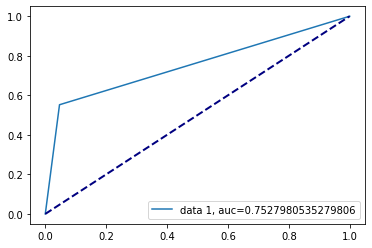

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 301.171554
0.6370370370370371
0.8807785888077859


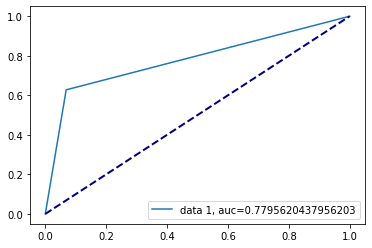

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 98.466905
0.2962962962962963
0.3142741281427413


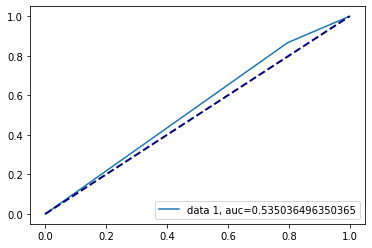

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 220.913814
0.27926657263751764
0.1711273317112733


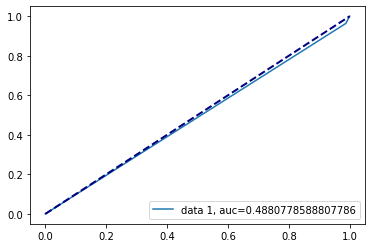

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 149.655573
0.2843033509700177
0.17721005677210055


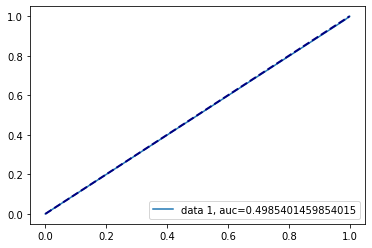

[[[0.6185286103542235, 0.8864557988645579, 100.56393051147461], [0.6370370370370371, 0.8807785888077859, 301.17155408859253], [0.2962962962962963, 0.3142741281427413, 98.46690487861633], [0.27926657263751764, 0.1711273317112733, 220.91381359100342], [0.2843033509700177, 0.17721005677210055, 149.65557265281677]]]
1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860      0
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 217.660225
0.6153846153846154
0.8844282238442822


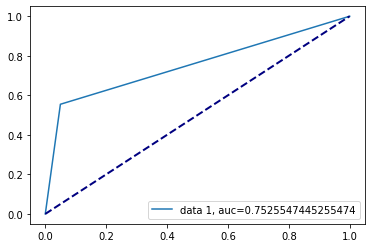

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 183.352247
0.635118306351183
0.8811841038118411


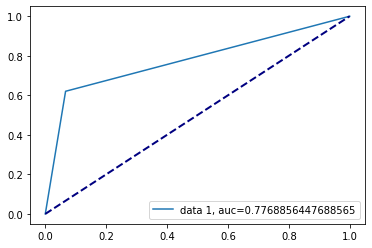

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 263.405642
0.2974068071312804
0.29683698296836986


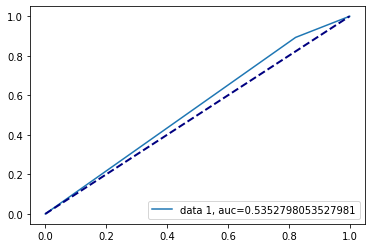

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 219.836434
0.2770870337477797
0.17477696674776966


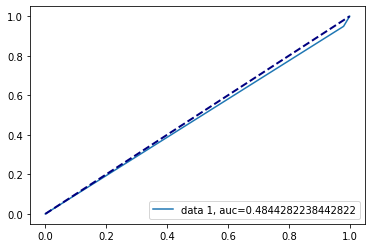

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 156.096770
0.27462257368799425
0.1816707218167072


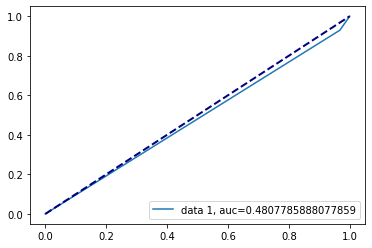

[[[0.6185286103542235, 0.8864557988645579, 100.56393051147461], [0.6370370370370371, 0.8807785888077859, 301.17155408859253], [0.2962962962962963, 0.3142741281427413, 98.46690487861633], [0.27926657263751764, 0.1711273317112733, 220.91381359100342], [0.2843033509700177, 0.17721005677210055, 149.65557265281677]], [[0.6153846153846154, 0.8844282238442822, 217.6602246761322], [0.635118306351183, 0.8811841038118411, 183.35224676132202], [0.2974068071312804, 0.29683698296836986, 263.4056417942047], [0.2770870337477797, 0.17477696674776966, 219.8364338874817], [0.27462257368799425, 0.1816707218167072, 156.0967698097229]]]
1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860      0
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=200) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 150.367391
0.6189189189189189
0.8856447688564477


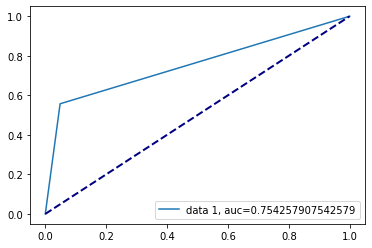

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=200) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 186.217029
0.6302729528535981
0.8791565287915653


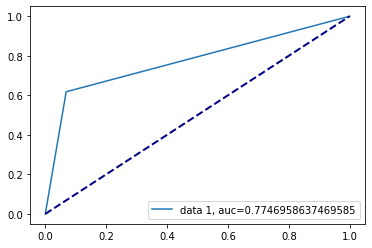

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=200) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 262.283653
0.2982527427874847
0.29967558799675587


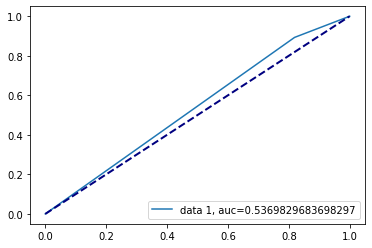

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=200) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)
C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:76: RuntimeWarning: invalid value encountered in true_divide
  sample_weights = z_conf/np.sum(z_conf)


Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 240.314339
0.27524893314367
0.1735604217356042


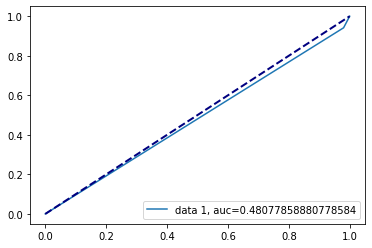

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=200) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 152.393951
0.2854115153655952
0.17964314679643148


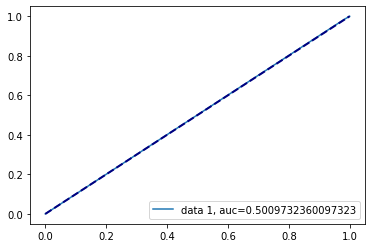

[[[0.6185286103542235, 0.8864557988645579, 100.56393051147461], [0.6370370370370371, 0.8807785888077859, 301.17155408859253], [0.2962962962962963, 0.3142741281427413, 98.46690487861633], [0.27926657263751764, 0.1711273317112733, 220.91381359100342], [0.2843033509700177, 0.17721005677210055, 149.65557265281677]], [[0.6153846153846154, 0.8844282238442822, 217.6602246761322], [0.635118306351183, 0.8811841038118411, 183.35224676132202], [0.2974068071312804, 0.29683698296836986, 263.4056417942047], [0.2770870337477797, 0.17477696674776966, 219.8364338874817], [0.27462257368799425, 0.1816707218167072, 156.0967698097229]], [[0.6189189189189189, 0.8856447688564477, 150.3673906326294], [0.6302729528535981, 0.8791565287915653, 186.21702909469604], [0.2982527427874847, 0.29967558799675587, 262.2836525440216], [0.27524893314367, 0.1735604217356042, 240.3143389225006], [0.2854115153655952, 0.17964314679643148, 152.39395141601562]]]
1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
1

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 217.630807
0.6089309878213803
0.8828061638280617


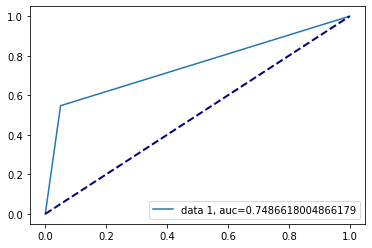

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='euclidean', n_neighbors=9) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 297.162111
0.6374695863746959
0.8791565287915653


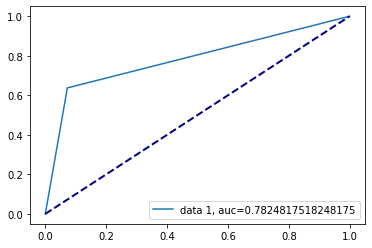

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='euclidean', n_neighbors=9) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 149.636207
0.30493273542600896
0.3085969180859692


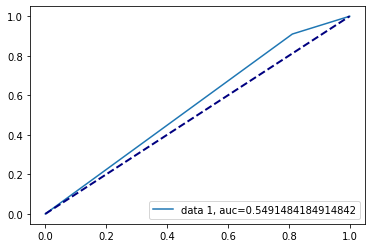

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='euclidean', n_neighbors=9) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)
C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:76: RuntimeWarning: invalid value encountered in true_divide
  sample_weights = z_conf/np.sum(z_conf)


Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 250.124188
0.2767162066525124
0.1711273317112733


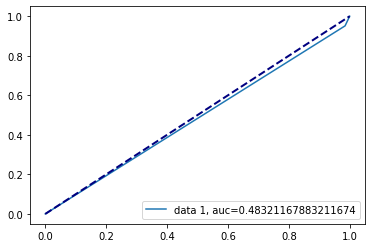

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='euclidean', n_neighbors=9) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 152.835743
0.2802682668549241
0.17315490673154907


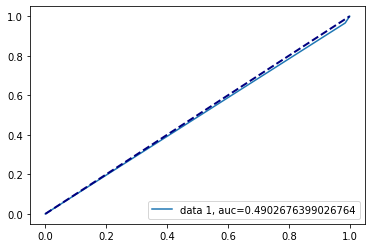

[[[0.6185286103542235, 0.8864557988645579, 100.56393051147461], [0.6370370370370371, 0.8807785888077859, 301.17155408859253], [0.2962962962962963, 0.3142741281427413, 98.46690487861633], [0.27926657263751764, 0.1711273317112733, 220.91381359100342], [0.2843033509700177, 0.17721005677210055, 149.65557265281677]], [[0.6153846153846154, 0.8844282238442822, 217.6602246761322], [0.635118306351183, 0.8811841038118411, 183.35224676132202], [0.2974068071312804, 0.29683698296836986, 263.4056417942047], [0.2770870337477797, 0.17477696674776966, 219.8364338874817], [0.27462257368799425, 0.1816707218167072, 156.0967698097229]], [[0.6189189189189189, 0.8856447688564477, 150.3673906326294], [0.6302729528535981, 0.8791565287915653, 186.21702909469604], [0.2982527427874847, 0.29967558799675587, 262.2836525440216], [0.27524893314367, 0.1735604217356042, 240.3143389225006], [0.2854115153655952, 0.17964314679643148, 152.39395141601562]], [[0.6089309878213803, 0.8828061638280617, 217.63080668449402], [0.6

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 99.189130
0.6205962059620596
0.8864557988645579


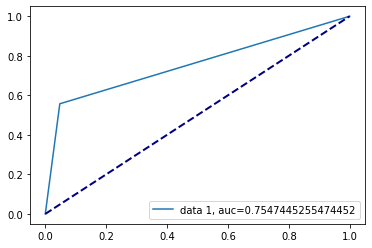

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100)) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 293.916518
0.6364749082007344
0.8795620437956204


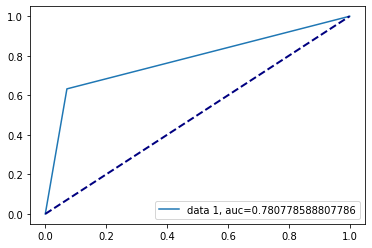

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100)) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 264.372594
0.29943043124491453
0.30170316301703165


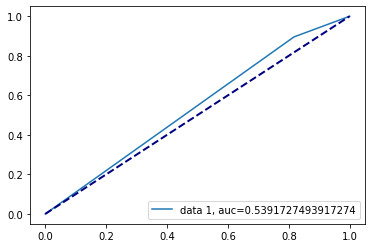

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100)) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)
C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:76: RuntimeWarning: invalid value encountered in true_divide
  sample_weights = z_conf/np.sum(z_conf)


Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 243.976481
0.2765730536793459
0.17477696674776966


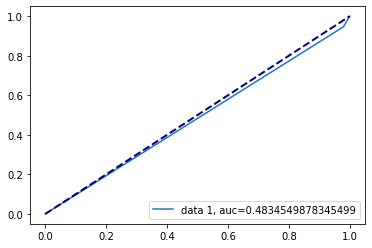

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100)) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 154.701179
0.27726300784034213
0.17761557177615572


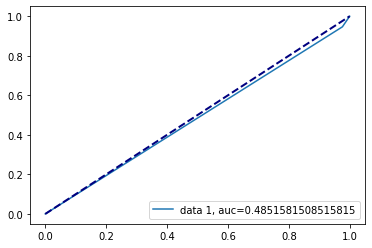

[[[0.6185286103542235, 0.8864557988645579, 100.56393051147461], [0.6370370370370371, 0.8807785888077859, 301.17155408859253], [0.2962962962962963, 0.3142741281427413, 98.46690487861633], [0.27926657263751764, 0.1711273317112733, 220.91381359100342], [0.2843033509700177, 0.17721005677210055, 149.65557265281677]], [[0.6153846153846154, 0.8844282238442822, 217.6602246761322], [0.635118306351183, 0.8811841038118411, 183.35224676132202], [0.2974068071312804, 0.29683698296836986, 263.4056417942047], [0.2770870337477797, 0.17477696674776966, 219.8364338874817], [0.27462257368799425, 0.1816707218167072, 156.0967698097229]], [[0.6189189189189189, 0.8856447688564477, 150.3673906326294], [0.6302729528535981, 0.8791565287915653, 186.21702909469604], [0.2982527427874847, 0.29967558799675587, 262.2836525440216], [0.27524893314367, 0.1735604217356042, 240.3143389225006], [0.2854115153655952, 0.17964314679643148, 152.39395141601562]], [[0.6089309878213803, 0.8828061638280617, 217.63080668449402], [0.6

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 99.749587
0.6117969821673525
0.8852392538523925


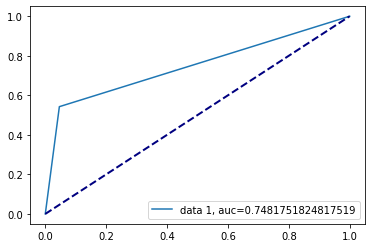

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270     0
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 152.587554
0.6327543424317619
0.8799675587996756


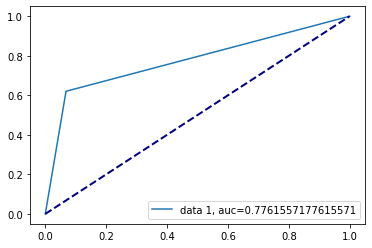

1785    -1
10407    0
286      0
6520    -1
12251    0
        ..
11964    0
5191     1
5390     0
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 262.729677
0.30113636363636365
0.30170316301703165


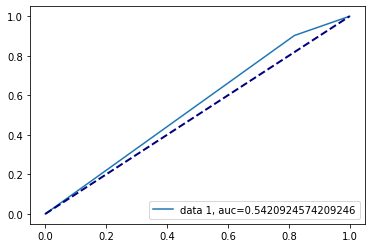

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 221.801793
0.2769668921324315
0.17639902676399027


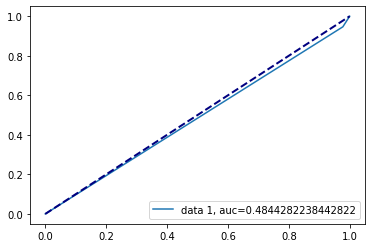

1785    -1
10407   -1
286     -1
6520    -1
12251    0
        ..
11964   -1
5191    -1
5390    -1
860     -1
7270    -1
Name: Revenue, Length: 9864, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 154.237723
0.27880512091038406
0.17761557177615572


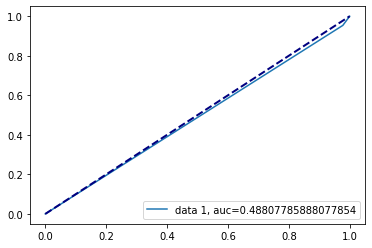

[[[0.6185286103542235, 0.8864557988645579, 100.56393051147461], [0.6370370370370371, 0.8807785888077859, 301.17155408859253], [0.2962962962962963, 0.3142741281427413, 98.46690487861633], [0.27926657263751764, 0.1711273317112733, 220.91381359100342], [0.2843033509700177, 0.17721005677210055, 149.65557265281677]], [[0.6153846153846154, 0.8844282238442822, 217.6602246761322], [0.635118306351183, 0.8811841038118411, 183.35224676132202], [0.2974068071312804, 0.29683698296836986, 263.4056417942047], [0.2770870337477797, 0.17477696674776966, 219.8364338874817], [0.27462257368799425, 0.1816707218167072, 156.0967698097229]], [[0.6189189189189189, 0.8856447688564477, 150.3673906326294], [0.6302729528535981, 0.8791565287915653, 186.21702909469604], [0.2982527427874847, 0.29967558799675587, 262.2836525440216], [0.27524893314367, 0.1735604217356042, 240.3143389225006], [0.2854115153655952, 0.17964314679643148, 152.39395141601562]], [[0.6089309878213803, 0.8828061638280617, 217.63080668449402], [0.6

In [120]:
# print(feature_selected_X_data.shape,Y_data.shape)

# #Undersampled
# print(X_under.shape,y_under.shape)

# #Oversampled
# print(X_over.shape,y_over.shape)

# X_train, X_test, y_train, y_test = train_test_split(feature_selected_X_data,Y_data, test_size=0.2,random_state = 42)

final_results_d1_boost = semi_boost_wrapper(feature_selected_X_data,Y_data,base_algos)

9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 78.477282
0.8017492711370262
0.9341723136495643


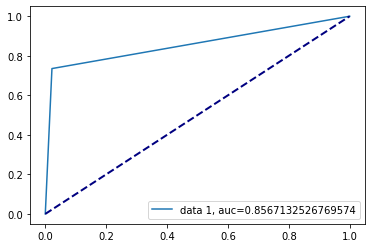

9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 98.113704
0.8005822416302766
0.9336882865440465


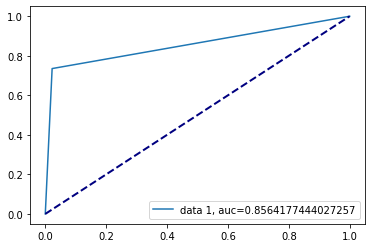

9031   -1
8100    0
8400    0
828     0
6964    0
       ..
5734   -1
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  13
Time taken: 215.743686
0.3069438301636444
0.2415295256534366


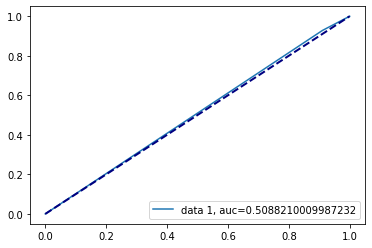

9031   -1
8100   -1
8400   -1
828    -1
6964    0
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 146.861812
0.2927852348993289
0.18393030009680542


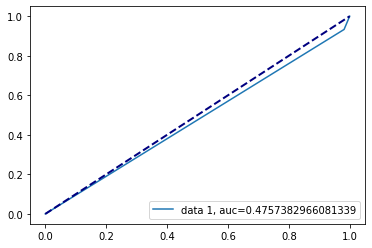

9031   -1
8100   -1
8400   -1
828    -1
6964   -1
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 115.191563
0.29837024655244465
0.18731848983543078


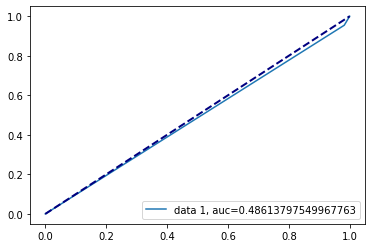

[[[0.8017492711370262, 0.9341723136495643, 78.47728228569031], [0.8005822416302766, 0.9336882865440465, 98.11370420455933], [0.3069438301636444, 0.2415295256534366, 215.74368619918823], [0.2927852348993289, 0.18393030009680542, 146.861811876297], [0.29837024655244465, 0.18731848983543078, 115.19156336784363]]]
9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 62.746166
0.8005822416302766
0.9336882865440465


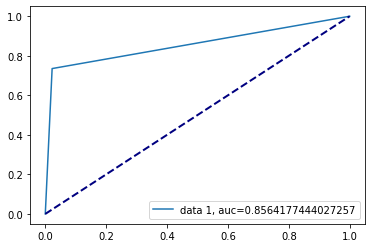

9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 77.815370
0.8040638606676342
0.9346563407550823


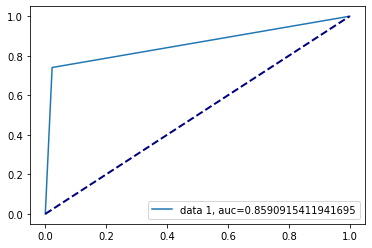

9031   -1
8100    0
8400    0
828     0
6964    0
       ..
5734   -1
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  13
Time taken: 212.162235
0.307488986784141
0.23910939012584706


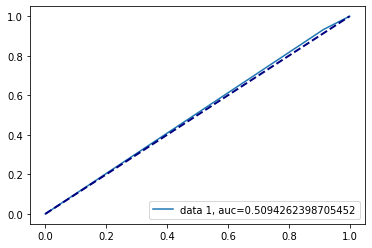

9031   -1
8100   -1
8400   -1
828    -1
6964    0
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 61.928385
0.29583333333333334
0.1819941916747338


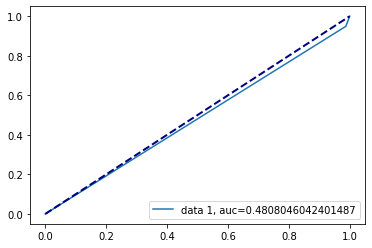

9031   -1
8100   -1
8400   -1
828    -1
6964   -1
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 100.918330
0.3038397328881469
0.19264278799612777


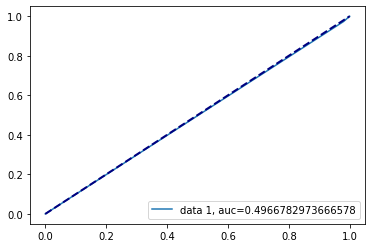

[[[0.8017492711370262, 0.9341723136495643, 78.47728228569031], [0.8005822416302766, 0.9336882865440465, 98.11370420455933], [0.3069438301636444, 0.2415295256534366, 215.74368619918823], [0.2927852348993289, 0.18393030009680542, 146.861811876297], [0.29837024655244465, 0.18731848983543078, 115.19156336784363]], [[0.8005822416302766, 0.9336882865440465, 62.746166467666626], [0.8040638606676342, 0.9346563407550823, 77.8153703212738], [0.307488986784141, 0.23910939012584706, 212.1622347831726], [0.29583333333333334, 0.1819941916747338, 61.92838478088379], [0.3038397328881469, 0.19264278799612777, 100.9183304309845]]]
9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model RandomForestClassifier(max_depth=23, max_features='sqrt', min_samples_split=5,
                       n_estimators=200) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 158.260101
0.804093567251462
0.9351403678606002


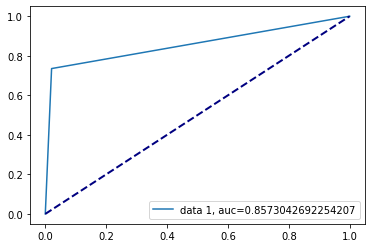

9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model RandomForestClassifier(max_depth=23, max_features='sqrt', min_samples_split=5,
                       n_estimators=200) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 78.325094
0.8023088023088022
0.9336882865440465


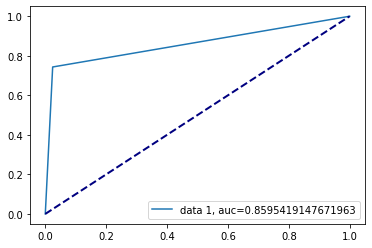

9031   -1
8100    0
8400    0
828     0
6964    0
       ..
5734   -1
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=23, max_features='sqrt', min_samples_split=5,
                       n_estimators=200) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  13
Time taken: 212.504708
0.3164893617021276
0.2536302032913843


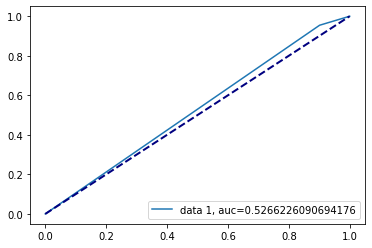

9031   -1
8100   -1
8400   -1
828    -1
6964    0
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=23, max_features='sqrt', min_samples_split=5,
                       n_estimators=200) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 144.536597
0.2947807933194154
0.1824782187802517


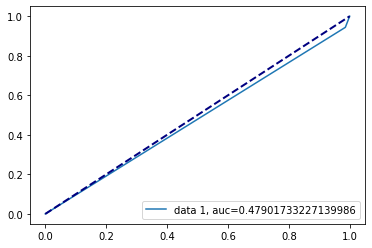

9031   -1
8100   -1
8400   -1
828    -1
6964   -1
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=23, max_features='sqrt', min_samples_split=5,
                       n_estimators=200) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 101.353813
0.2955499580184719
0.18780251694094868


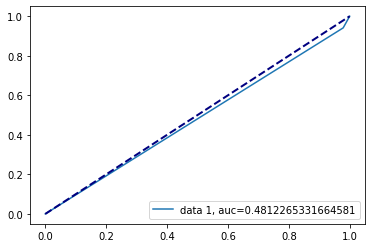

[[[0.8017492711370262, 0.9341723136495643, 78.47728228569031], [0.8005822416302766, 0.9336882865440465, 98.11370420455933], [0.3069438301636444, 0.2415295256534366, 215.74368619918823], [0.2927852348993289, 0.18393030009680542, 146.861811876297], [0.29837024655244465, 0.18731848983543078, 115.19156336784363]], [[0.8005822416302766, 0.9336882865440465, 62.746166467666626], [0.8040638606676342, 0.9346563407550823, 77.8153703212738], [0.307488986784141, 0.23910939012584706, 212.1622347831726], [0.29583333333333334, 0.1819941916747338, 61.92838478088379], [0.3038397328881469, 0.19264278799612777, 100.9183304309845]], [[0.804093567251462, 0.9351403678606002, 158.26010084152222], [0.8023088023088022, 0.9336882865440465, 78.3250937461853], [0.3164893617021276, 0.2536302032913843, 212.50470781326294], [0.2947807933194154, 0.1824782187802517, 144.53659653663635], [0.2955499580184719, 0.18780251694094868, 101.35381269454956]]]
9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 78.606483
0.8029197080291972
0.9346563407550823


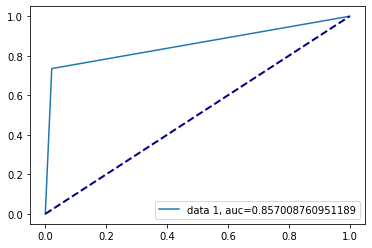

9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=15, weights='distance') and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 78.447812
0.7999999999999999
0.9332042594385286


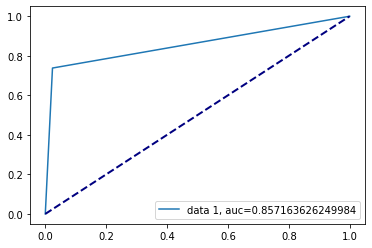

9031   -1
8100    0
8400    0
828     0
6964    0
       ..
5734   -1
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=15, weights='distance') and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  13
Time taken: 212.386812
0.30830741892492225
0.2463697967086157


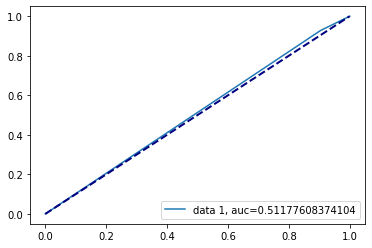

9031   -1
8100   -1
8400   -1
828    -1
6964    0
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=15, weights='distance') and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 144.849817
0.29958506224066395
0.1829622458857696


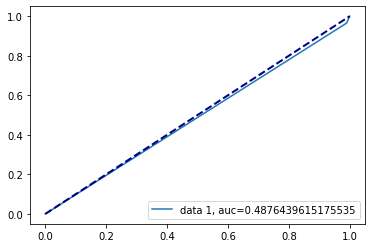

9031   -1
8100   -1
8400   -1
828    -1
6964   -1
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=15, weights='distance') and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 101.259229
0.29946080464537544
0.1824782187802517


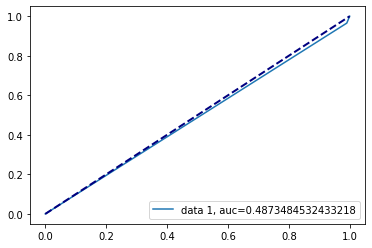

[[[0.8017492711370262, 0.9341723136495643, 78.47728228569031], [0.8005822416302766, 0.9336882865440465, 98.11370420455933], [0.3069438301636444, 0.2415295256534366, 215.74368619918823], [0.2927852348993289, 0.18393030009680542, 146.861811876297], [0.29837024655244465, 0.18731848983543078, 115.19156336784363]], [[0.8005822416302766, 0.9336882865440465, 62.746166467666626], [0.8040638606676342, 0.9346563407550823, 77.8153703212738], [0.307488986784141, 0.23910939012584706, 212.1622347831726], [0.29583333333333334, 0.1819941916747338, 61.92838478088379], [0.3038397328881469, 0.19264278799612777, 100.9183304309845]], [[0.804093567251462, 0.9351403678606002, 158.26010084152222], [0.8023088023088022, 0.9336882865440465, 78.3250937461853], [0.3164893617021276, 0.2536302032913843, 212.50470781326294], [0.2947807933194154, 0.1824782187802517, 144.53659653663635], [0.2955499580184719, 0.18780251694094868, 101.35381269454956]], [[0.8029197080291972, 0.9346563407550823, 78.6064829826355], [0.79999

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 62.041353
0.8034934497816594
0.9346563407550823


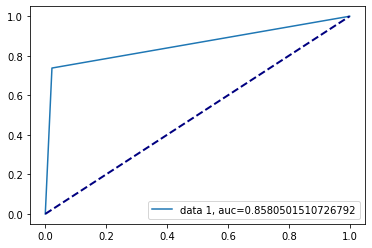

9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 77.244422
0.8040638606676342
0.9346563407550823


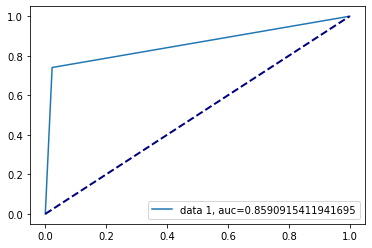

9031   -1
8100    0
8400    0
828     0
6964    0
       ..
5734   -1
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  13
Time taken: 212.933996
0.3035157988429017
0.2424975798644724


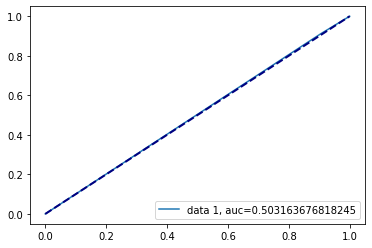

9031   -1
8100   -1
8400   -1
828    -1
6964    0
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 146.111250
0.2958629335562056
0.18441432720232334


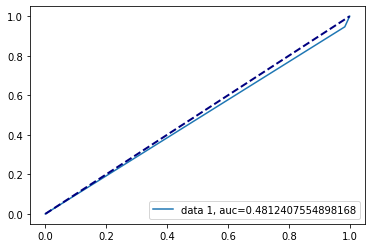

9031   -1
8100   -1
8400   -1
828    -1
6964   -1
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 102.060574
0.29205020920502095
0.18102613746369797


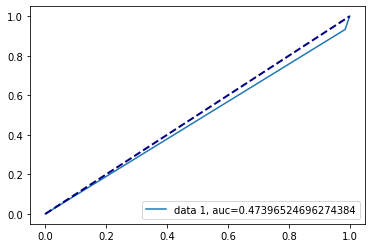

[[[0.8017492711370262, 0.9341723136495643, 78.47728228569031], [0.8005822416302766, 0.9336882865440465, 98.11370420455933], [0.3069438301636444, 0.2415295256534366, 215.74368619918823], [0.2927852348993289, 0.18393030009680542, 146.861811876297], [0.29837024655244465, 0.18731848983543078, 115.19156336784363]], [[0.8005822416302766, 0.9336882865440465, 62.746166467666626], [0.8040638606676342, 0.9346563407550823, 77.8153703212738], [0.307488986784141, 0.23910939012584706, 212.1622347831726], [0.29583333333333334, 0.1819941916747338, 61.92838478088379], [0.3038397328881469, 0.19264278799612777, 100.9183304309845]], [[0.804093567251462, 0.9351403678606002, 158.26010084152222], [0.8023088023088022, 0.9336882865440465, 78.3250937461853], [0.3164893617021276, 0.2536302032913843, 212.50470781326294], [0.2947807933194154, 0.1824782187802517, 144.53659653663635], [0.2955499580184719, 0.18780251694094868, 101.35381269454956]], [[0.8029197080291972, 0.9346563407550823, 78.6064829826355], [0.79999

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 62.589768
0.8017492711370262
0.9341723136495643


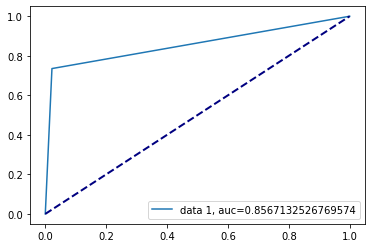

9031    1
8100    0
8400    0
828     0
6964    0
       ..
5734    0
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[ 1  0 -1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 98.553637
0.8063583815028902
0.9351403678606002


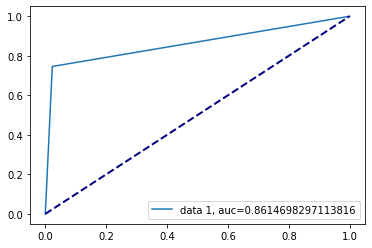

9031   -1
8100    0
8400    0
828     0
6964    0
       ..
5734   -1
5191    0
5390    0
860    -1
7270    0
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  13
Time taken: 213.941272
0.30762371823450735
0.24830590513068732


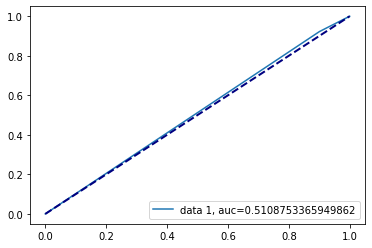

9031   -1
8100   -1
8400   -1
828    -1
6964    0
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 144.160666
0.29620358781810596
0.18344627299128752


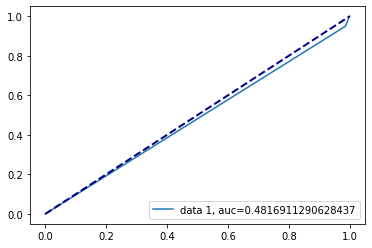

9031   -1
8100   -1
8400   -1
828    -1
6964   -1
       ..
5734   -1
5191   -1
5390   -1
860    -1
7270   -1
Name: Revenue, Length: 8260, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Caught em!
Caught em!
Time taken: 102.071949
0.2990420658059142
0.18538238141335914


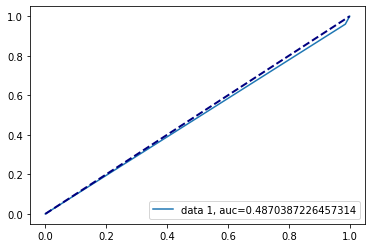

[[[0.8017492711370262, 0.9341723136495643, 78.47728228569031], [0.8005822416302766, 0.9336882865440465, 98.11370420455933], [0.3069438301636444, 0.2415295256534366, 215.74368619918823], [0.2927852348993289, 0.18393030009680542, 146.861811876297], [0.29837024655244465, 0.18731848983543078, 115.19156336784363]], [[0.8005822416302766, 0.9336882865440465, 62.746166467666626], [0.8040638606676342, 0.9346563407550823, 77.8153703212738], [0.307488986784141, 0.23910939012584706, 212.1622347831726], [0.29583333333333334, 0.1819941916747338, 61.92838478088379], [0.3038397328881469, 0.19264278799612777, 100.9183304309845]], [[0.804093567251462, 0.9351403678606002, 158.26010084152222], [0.8023088023088022, 0.9336882865440465, 78.3250937461853], [0.3164893617021276, 0.2536302032913843, 212.50470781326294], [0.2947807933194154, 0.1824782187802517, 144.53659653663635], [0.2955499580184719, 0.18780251694094868, 101.35381269454956]], [[0.8029197080291972, 0.9346563407550823, 78.6064829826355], [0.79999

In [119]:
final_results_under_boost = semi_boost_wrapper(X_under,y_under,base_algos_under)

2487     0
16790    1
6346     0
16598   -1
6105     0
        ..
11284    1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[ 0  1 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 665.465250
0.8587979724837075
0.8596785799952027


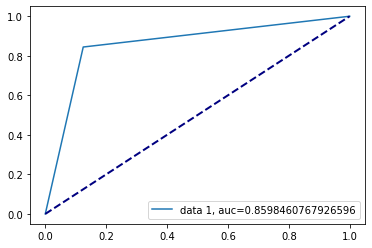

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 705.222470
0.8653846153846155
0.8623171024226434


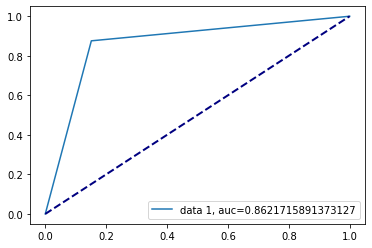

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  14
Time taken: 2092.879763
0.6889920424403182
0.550011993283761


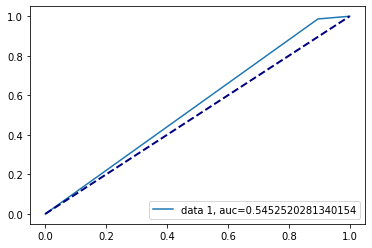

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 1339.049384
0.6672028309474022
0.5037179179659391


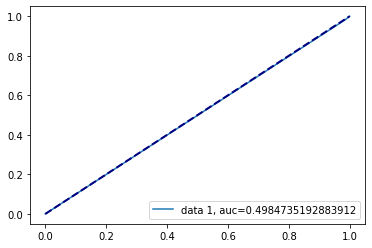

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 888.099414
0.6651670951156812
0.5001199328376109


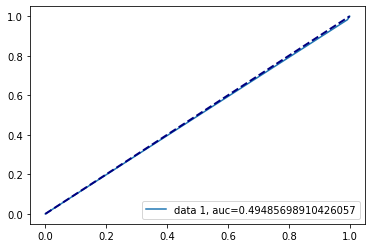

[[[0.8587979724837075, 0.8596785799952027, 665.4652502536774], [0.8653846153846155, 0.8623171024226434, 705.2224702835083], [0.6889920424403182, 0.550011993283761, 2092.879762649536], [0.6672028309474022, 0.5037179179659391, 1339.0493836402893], [0.6651670951156812, 0.5001199328376109, 888.0994138717651]]]
2487     0
16790    1
6346     0
16598   -1
6105     0
        ..
11284    1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[ 0  1 -1]
Base model SVC(C=10, probability=True) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 532.975626
0.8596914175506268
0.8603981770208683


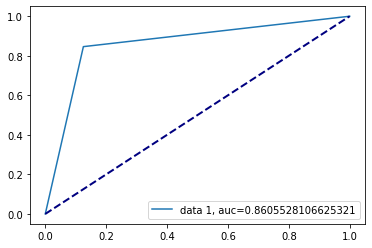

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model SVC(C=10, probability=True) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 696.374568
0.8646370023419204
0.8613576397217558


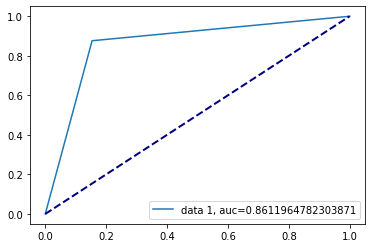

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model SVC(C=10, probability=True) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 748.091592
0.6921549155908638
0.5538498440873111


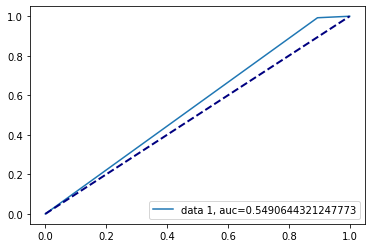

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model SVC(C=10, probability=True) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 1368.923348
0.6641995172968624
0.4994003358119453


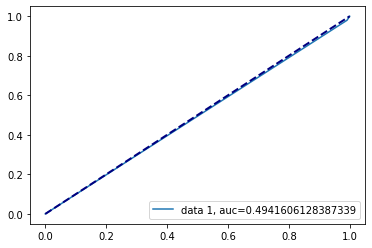

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model SVC(C=10, probability=True) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 878.085162
0.6678433889602055
0.5034780522907172


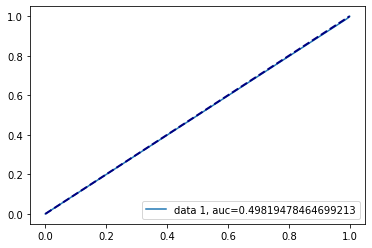

[[[0.8587979724837075, 0.8596785799952027, 665.4652502536774], [0.8653846153846155, 0.8623171024226434, 705.2224702835083], [0.6889920424403182, 0.550011993283761, 2092.879762649536], [0.6672028309474022, 0.5037179179659391, 1339.0493836402893], [0.6651670951156812, 0.5001199328376109, 888.0994138717651]], [[0.8596914175506268, 0.8603981770208683, 532.9756264686584], [0.8646370023419204, 0.8613576397217558, 696.3745677471161], [0.6921549155908638, 0.5538498440873111, 748.0915920734406], [0.6641995172968624, 0.4994003358119453, 1368.923347711563], [0.6678433889602055, 0.5034780522907172, 878.0851624011993]]]
2487     0
16790    1
6346     0
16598   -1
6105     0
        ..
11284    1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[ 0  1 -1]
Base model RandomForestClassifier(max_depth=23, min_samples_split=5, n_estimators=110) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 646.983859
0.8592092574734812
0.8599184456704245


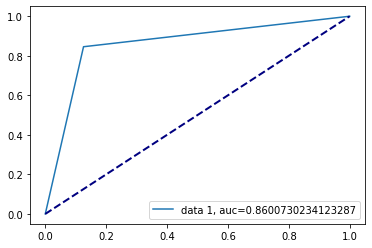

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model RandomForestClassifier(max_depth=23, min_samples_split=5, n_estimators=110) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 707.856553
0.8651053864168617
0.8618373710721996


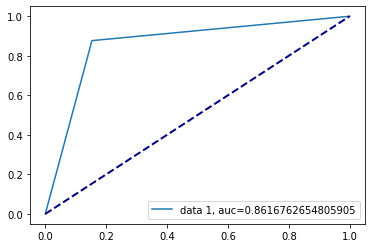

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model RandomForestClassifier(max_depth=23, min_samples_split=5, n_estimators=110) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 753.301850
0.6944582299421008
0.5569680978651955


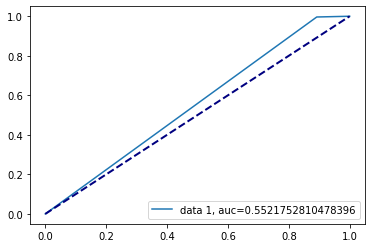

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=23, min_samples_split=5, n_estimators=110) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 1348.044313
0.6670944970319268
0.5022787239146078


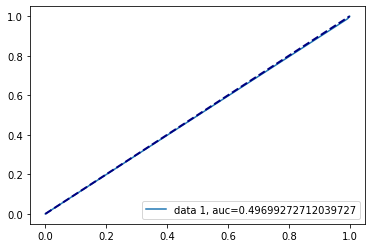

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model RandomForestClassifier(max_depth=23, min_samples_split=5, n_estimators=110) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 891.194158
0.6627925746569816
0.49892060446150155


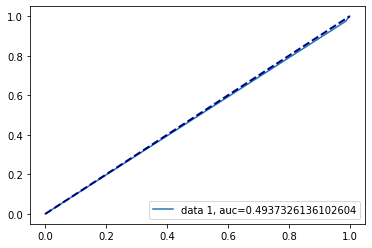

[[[0.8587979724837075, 0.8596785799952027, 665.4652502536774], [0.8653846153846155, 0.8623171024226434, 705.2224702835083], [0.6889920424403182, 0.550011993283761, 2092.879762649536], [0.6672028309474022, 0.5037179179659391, 1339.0493836402893], [0.6651670951156812, 0.5001199328376109, 888.0994138717651]], [[0.8596914175506268, 0.8603981770208683, 532.9756264686584], [0.8646370023419204, 0.8613576397217558, 696.3745677471161], [0.6921549155908638, 0.5538498440873111, 748.0915920734406], [0.6641995172968624, 0.4994003358119453, 1368.923347711563], [0.6678433889602055, 0.5034780522907172, 878.0851624011993]], [[0.8592092574734812, 0.8599184456704245, 646.9838588237762], [0.8651053864168617, 0.8618373710721996, 707.8565528392792], [0.6944582299421008, 0.5569680978651955, 753.301849603653], [0.6670944970319268, 0.5022787239146078, 1348.044312953949], [0.6627925746569816, 0.49892060446150155, 891.1941583156586]]]
2487     0
16790    1
6346     0
16598   -1
6105     0
        ..
11284    1
1

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 578.044390
0.859141341051616
0.8599184456704245


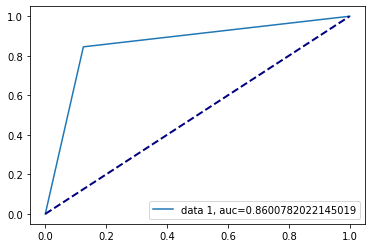

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=11, weights='distance') and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 273.620742
0.86685419596812
0.8637562964739746


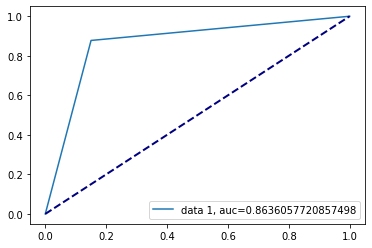

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=11, weights='distance') and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  14
Time taken: 837.722638
0.6862842892768081
0.5473734708563205


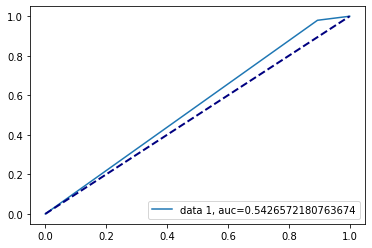

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=11, weights='distance') and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 547.603786
0.6663447609850315
0.5027584552650516


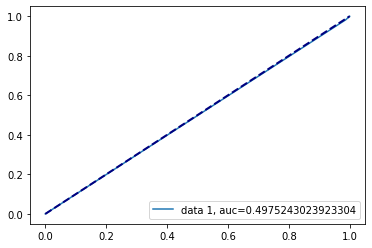

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=11, weights='distance') and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 422.994633
0.6673111003705493
0.5046773806668265


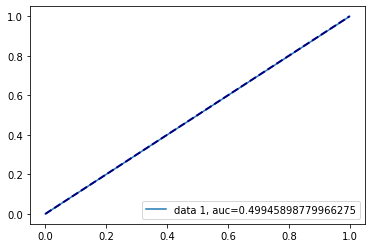

[[[0.8587979724837075, 0.8596785799952027, 665.4652502536774], [0.8653846153846155, 0.8623171024226434, 705.2224702835083], [0.6889920424403182, 0.550011993283761, 2092.879762649536], [0.6672028309474022, 0.5037179179659391, 1339.0493836402893], [0.6651670951156812, 0.5001199328376109, 888.0994138717651]], [[0.8596914175506268, 0.8603981770208683, 532.9756264686584], [0.8646370023419204, 0.8613576397217558, 696.3745677471161], [0.6921549155908638, 0.5538498440873111, 748.0915920734406], [0.6641995172968624, 0.4994003358119453, 1368.923347711563], [0.6678433889602055, 0.5034780522907172, 878.0851624011993]], [[0.8592092574734812, 0.8599184456704245, 646.9838588237762], [0.8651053864168617, 0.8618373710721996, 707.8565528392792], [0.6944582299421008, 0.5569680978651955, 753.301849603653], [0.6670944970319268, 0.5022787239146078, 1348.044312953949], [0.6627925746569816, 0.49892060446150155, 891.1941583156586]], [[0.859141341051616, 0.8599184456704245, 578.0443902015686], [0.86685419596812

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 301.653893
0.859073359073359
0.8599184456704245


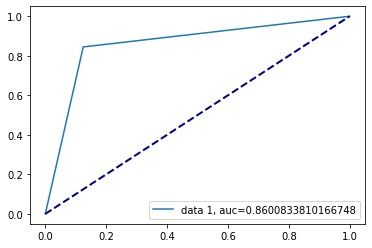

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 303.127015
0.8656506447831184
0.8625569680978652


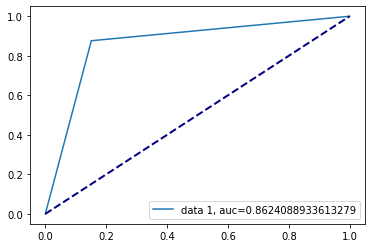

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  14
Time taken: 932.125232
0.688361281753279
0.5497721276085392


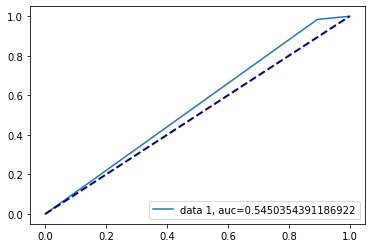

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 601.885501
0.6635483870967742
0.4996402014871672


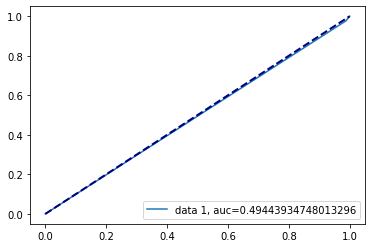

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model MLPClassifier(activation='tanh', hidden_layer_sizes=(50, 100, 50)) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 387.397719
0.6658097686375322
0.5010793955384985


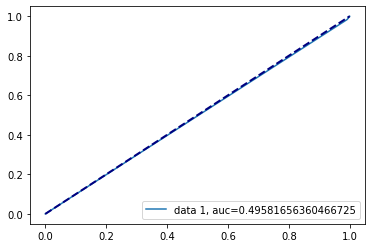

[[[0.8587979724837075, 0.8596785799952027, 665.4652502536774], [0.8653846153846155, 0.8623171024226434, 705.2224702835083], [0.6889920424403182, 0.550011993283761, 2092.879762649536], [0.6672028309474022, 0.5037179179659391, 1339.0493836402893], [0.6651670951156812, 0.5001199328376109, 888.0994138717651]], [[0.8596914175506268, 0.8603981770208683, 532.9756264686584], [0.8646370023419204, 0.8613576397217558, 696.3745677471161], [0.6921549155908638, 0.5538498440873111, 748.0915920734406], [0.6641995172968624, 0.4994003358119453, 1368.923347711563], [0.6678433889602055, 0.5034780522907172, 878.0851624011993]], [[0.8592092574734812, 0.8599184456704245, 646.9838588237762], [0.8651053864168617, 0.8618373710721996, 707.8565528392792], [0.6944582299421008, 0.5569680978651955, 753.301849603653], [0.6670944970319268, 0.5022787239146078, 1348.044312953949], [0.6627925746569816, 0.49892060446150155, 891.1941583156586]], [[0.859141341051616, 0.8599184456704245, 578.0443902015686], [0.86685419596812

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 292.586489
0.8596914175506268
0.8603981770208683


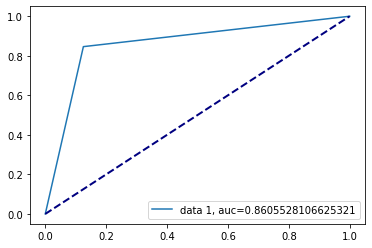

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964    0
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Problematic convergence of the model. a<0
Time taken: 305.603773
0.865231633130557
0.8618373710721996


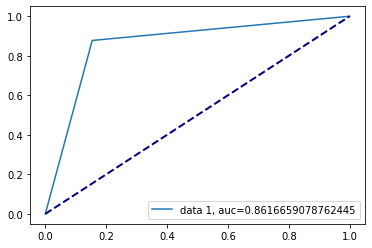

2487    -1
16790    1
6346     0
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390     0
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  1  0]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  14
Time taken: 868.190034
0.690330071321944
0.552170784360758


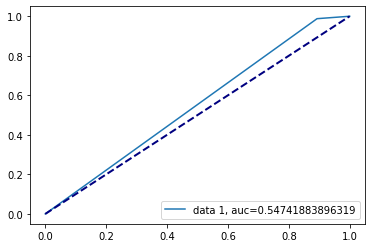

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 523.611803
0.663768115942029
0.49916047013672343


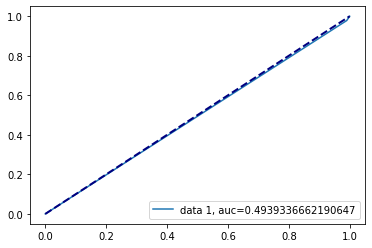

2487    -1
16790   -1
6346    -1
16598   -1
6105     0
        ..
11284   -1
11964   -1
5390    -1
860     -1
15795   -1
Name: Revenue, Length: 16675, dtype: int32
[-1  0  1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=9, n_estimators=250) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


Caught em!
Caught em!
Caught em!
Time taken: 340.576136
0.6664522354454808
0.5025185895898296


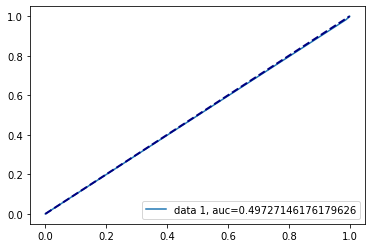

[[[0.8587979724837075, 0.8596785799952027, 665.4652502536774], [0.8653846153846155, 0.8623171024226434, 705.2224702835083], [0.6889920424403182, 0.550011993283761, 2092.879762649536], [0.6672028309474022, 0.5037179179659391, 1339.0493836402893], [0.6651670951156812, 0.5001199328376109, 888.0994138717651]], [[0.8596914175506268, 0.8603981770208683, 532.9756264686584], [0.8646370023419204, 0.8613576397217558, 696.3745677471161], [0.6921549155908638, 0.5538498440873111, 748.0915920734406], [0.6641995172968624, 0.4994003358119453, 1368.923347711563], [0.6678433889602055, 0.5034780522907172, 878.0851624011993]], [[0.8592092574734812, 0.8599184456704245, 646.9838588237762], [0.8651053864168617, 0.8618373710721996, 707.8565528392792], [0.6944582299421008, 0.5569680978651955, 753.301849603653], [0.6670944970319268, 0.5022787239146078, 1348.044312953949], [0.6627925746569816, 0.49892060446150155, 891.1941583156586]], [[0.859141341051616, 0.8599184456704245, 578.0443902015686], [0.86685419596812

In [118]:
final_results_over_boost = semi_boost_wrapper(X_over,y_over,base_algos_over)

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  8
Time taken: 9.698520
0.9004739336492891
0.9054054054054054


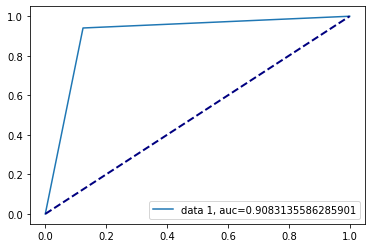

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  9
Time taken: 12.352440
0.8648648648648649
0.8648648648648649


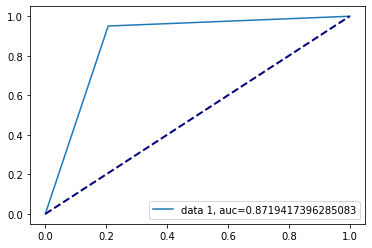

209     1
53      0
184     0
2115   -1
728     1
       ..
1655   -1
1108    0
1143    1
1307   -1
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 14.128205
0.6781411359724612
0.5788288288288288


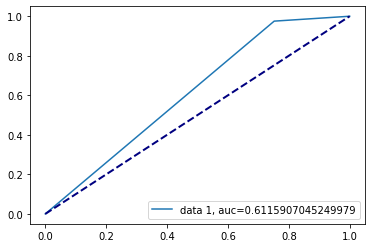

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108    0
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 8.696348
0.6253869969040248
0.45495495495495497


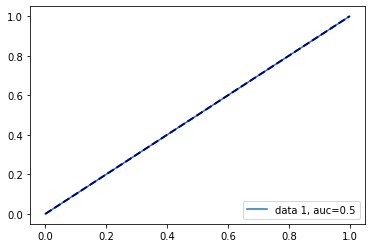

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108   -1
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 6.455407
0.6253869969040248
0.45495495495495497


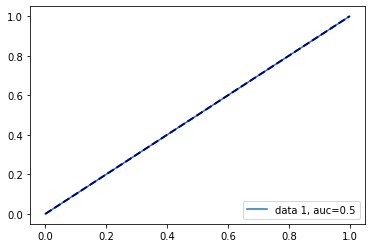

[[[0.9004739336492891, 0.9054054054054054, 9.698519945144653], [0.8648648648648649, 0.8648648648648649, 12.352439641952515], [0.6781411359724612, 0.5788288288288288, 14.128205299377441], [0.6253869969040248, 0.45495495495495497, 8.696348428726196], [0.6253869969040248, 0.45495495495495497, 6.455407381057739]]]
209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  8
Time taken: 9.846179
0.9004739336492891
0.9054054054054054


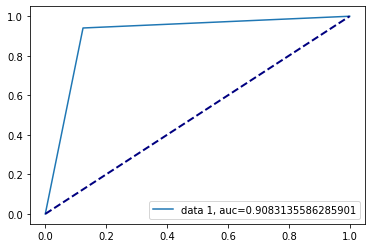

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  9
Time taken: 12.425658
0.8648648648648649
0.8648648648648649


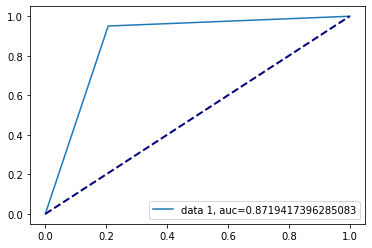

209     1
53      0
184     0
2115   -1
728     1
       ..
1655   -1
1108    0
1143    1
1307   -1
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 14.057827
0.6781411359724612
0.5788288288288288


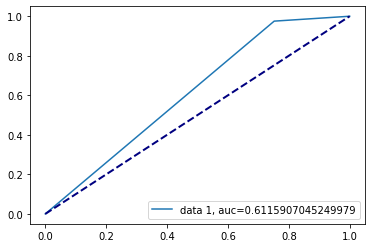

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108    0
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 8.636319
0.6253869969040248
0.45495495495495497


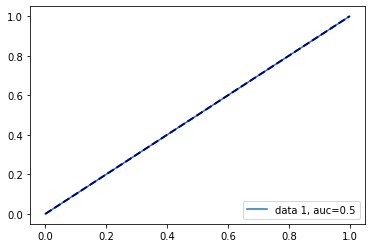

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108   -1
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model DecisionTreeClassifier(criterion='entropy', max_features=8) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 6.366760
0.6253869969040248
0.45495495495495497


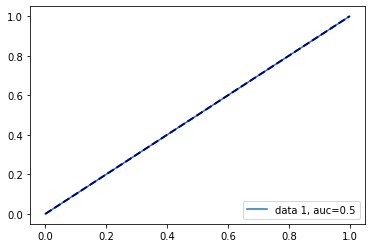

[[[0.9004739336492891, 0.9054054054054054, 9.698519945144653], [0.8648648648648649, 0.8648648648648649, 12.352439641952515], [0.6781411359724612, 0.5788288288288288, 14.128205299377441], [0.6253869969040248, 0.45495495495495497, 8.696348428726196], [0.6253869969040248, 0.45495495495495497, 6.455407381057739]], [[0.9004739336492891, 0.9054054054054054, 9.846179485321045], [0.8648648648648649, 0.8648648648648649, 12.425658226013184], [0.6781411359724612, 0.5788288288288288, 14.057827234268188], [0.6253869969040248, 0.45495495495495497, 8.636319160461426], [0.6253869969040248, 0.45495495495495497, 6.366760015487671]]]
209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model SVC(C=10, probability=True) and level of unlabelled 0.100000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  8
Time taken: 10.272483
0.9004739336492891
0.9054054054054054


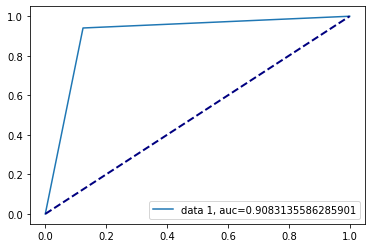

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model SVC(C=10, probability=True) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  9
Time taken: 12.281430
0.8648648648648649
0.8648648648648649


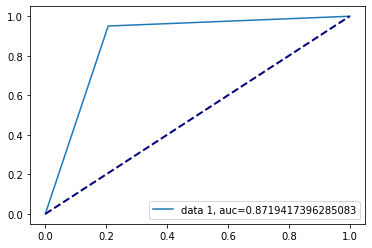

209     1
53      0
184     0
2115   -1
728     1
       ..
1655   -1
1108    0
1143    1
1307   -1
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model SVC(C=10, probability=True) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 13.999824
0.6781411359724612
0.5788288288288288


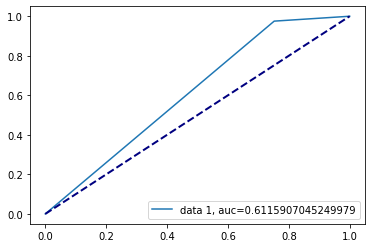

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108    0
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model SVC(C=10, probability=True) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 8.717106
0.6253869969040248
0.45495495495495497


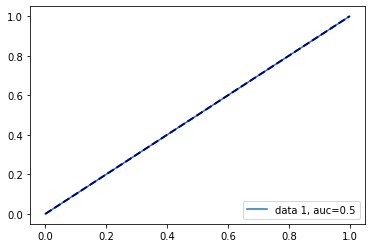

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108   -1
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model SVC(C=10, probability=True) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 6.427502
0.6253869969040248
0.45495495495495497


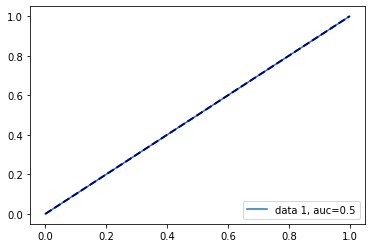

[[[0.9004739336492891, 0.9054054054054054, 9.698519945144653], [0.8648648648648649, 0.8648648648648649, 12.352439641952515], [0.6781411359724612, 0.5788288288288288, 14.128205299377441], [0.6253869969040248, 0.45495495495495497, 8.696348428726196], [0.6253869969040248, 0.45495495495495497, 6.455407381057739]], [[0.9004739336492891, 0.9054054054054054, 9.846179485321045], [0.8648648648648649, 0.8648648648648649, 12.425658226013184], [0.6781411359724612, 0.5788288288288288, 14.057827234268188], [0.6253869969040248, 0.45495495495495497, 8.636319160461426], [0.6253869969040248, 0.45495495495495497, 6.366760015487671]], [[0.9004739336492891, 0.9054054054054054, 10.272482633590698], [0.8648648648648649, 0.8648648648648649, 12.2814302444458], [0.6781411359724612, 0.5788288288288288, 13.999823808670044], [0.6253869969040248, 0.45495495495495497, 8.717106103897095], [0.6253869969040248, 0.45495495495495497, 6.427501678466797]]]
209     1
53      0
184     0
2115    1
728     1
       ..
1655   

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  8
Time taken: 9.887274
0.9004739336492891
0.9054054054054054


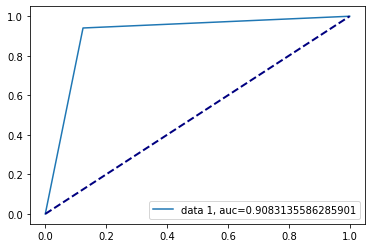

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model RandomForestClassifier(max_depth=23, min_samples_split=10, n_estimators=155) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  9
Time taken: 12.261293
0.8648648648648649
0.8648648648648649


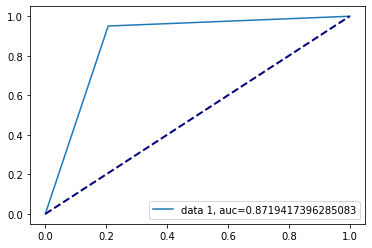

209     1
53      0
184     0
2115   -1
728     1
       ..
1655   -1
1108    0
1143    1
1307   -1
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model RandomForestClassifier(max_depth=23, min_samples_split=10, n_estimators=155) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 14.091068
0.6781411359724612
0.5788288288288288


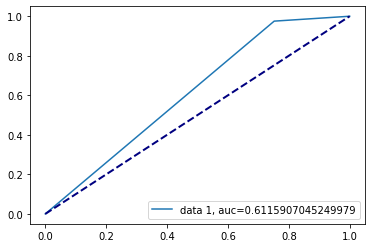

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108    0
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model RandomForestClassifier(max_depth=23, min_samples_split=10, n_estimators=155) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 8.680792
0.6253869969040248
0.45495495495495497


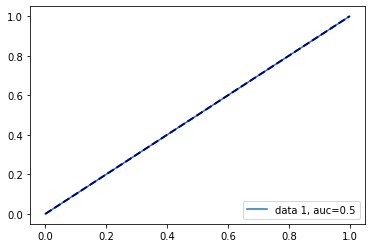

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108   -1
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model RandomForestClassifier(max_depth=23, min_samples_split=10, n_estimators=155) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 6.463643
0.6253869969040248
0.45495495495495497


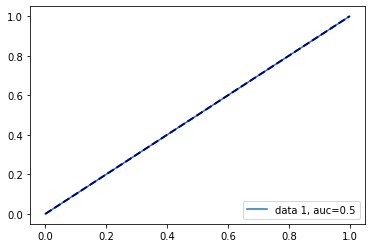

[[[0.9004739336492891, 0.9054054054054054, 9.698519945144653], [0.8648648648648649, 0.8648648648648649, 12.352439641952515], [0.6781411359724612, 0.5788288288288288, 14.128205299377441], [0.6253869969040248, 0.45495495495495497, 8.696348428726196], [0.6253869969040248, 0.45495495495495497, 6.455407381057739]], [[0.9004739336492891, 0.9054054054054054, 9.846179485321045], [0.8648648648648649, 0.8648648648648649, 12.425658226013184], [0.6781411359724612, 0.5788288288288288, 14.057827234268188], [0.6253869969040248, 0.45495495495495497, 8.636319160461426], [0.6253869969040248, 0.45495495495495497, 6.366760015487671]], [[0.9004739336492891, 0.9054054054054054, 10.272482633590698], [0.8648648648648649, 0.8648648648648649, 12.2814302444458], [0.6781411359724612, 0.5788288288288288, 13.999823808670044], [0.6253869969040248, 0.45495495495495497, 8.717106103897095], [0.6253869969040248, 0.45495495495495497, 6.427501678466797]], [[0.9004739336492891, 0.9054054054054054, 9.887274265289307], [0.86

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  8
Time taken: 9.896665
0.9004739336492891
0.9054054054054054


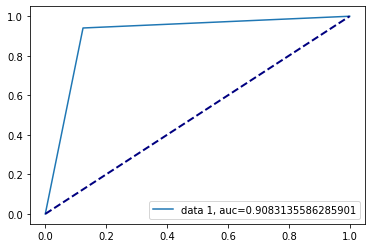

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  9
Time taken: 12.585501
0.8648648648648649
0.8648648648648649


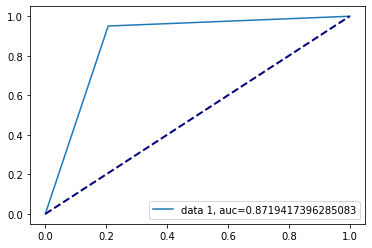

209     1
53      0
184     0
2115   -1
728     1
       ..
1655   -1
1108    0
1143    1
1307   -1
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 13.996326
0.6781411359724612
0.5788288288288288


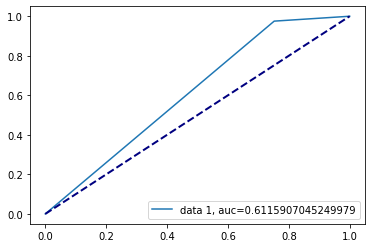

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108    0
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 8.772195
0.6253869969040248
0.45495495495495497


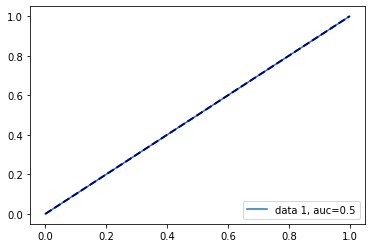

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108   -1
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance') and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 6.563504
0.6253869969040248
0.45495495495495497


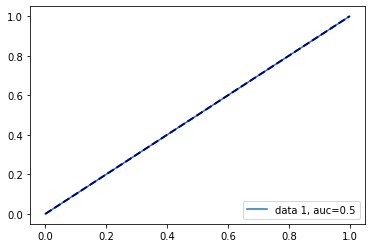

[[[0.9004739336492891, 0.9054054054054054, 9.698519945144653], [0.8648648648648649, 0.8648648648648649, 12.352439641952515], [0.6781411359724612, 0.5788288288288288, 14.128205299377441], [0.6253869969040248, 0.45495495495495497, 8.696348428726196], [0.6253869969040248, 0.45495495495495497, 6.455407381057739]], [[0.9004739336492891, 0.9054054054054054, 9.846179485321045], [0.8648648648648649, 0.8648648648648649, 12.425658226013184], [0.6781411359724612, 0.5788288288288288, 14.057827234268188], [0.6253869969040248, 0.45495495495495497, 8.636319160461426], [0.6253869969040248, 0.45495495495495497, 6.366760015487671]], [[0.9004739336492891, 0.9054054054054054, 10.272482633590698], [0.8648648648648649, 0.8648648648648649, 12.2814302444458], [0.6781411359724612, 0.5788288288288288, 13.999823808670044], [0.6253869969040248, 0.45495495495495497, 8.717106103897095], [0.6253869969040248, 0.45495495495495497, 6.427501678466797]], [[0.9004739336492891, 0.9054054054054054, 9.887274265289307], [0.86

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  8
Time taken: 9.774023
0.9004739336492891
0.9054054054054054


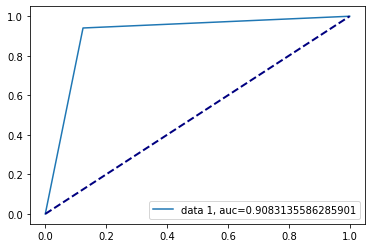

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model MLPClassifier(alpha=0.05, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  9
Time taken: 12.246378
0.8648648648648649
0.8648648648648649


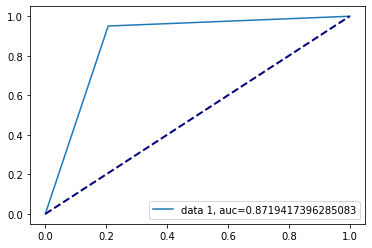

209     1
53      0
184     0
2115   -1
728     1
       ..
1655   -1
1108    0
1143    1
1307   -1
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model MLPClassifier(alpha=0.05, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 13.944500
0.6781411359724612
0.5788288288288288


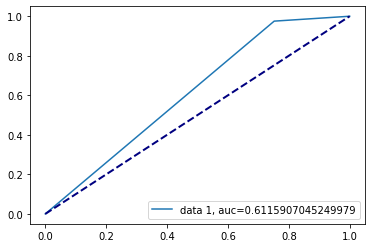

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108    0
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model MLPClassifier(alpha=0.05, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 8.786860
0.6253869969040248
0.45495495495495497


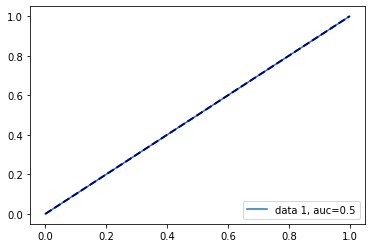

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108   -1
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model MLPClassifier(alpha=0.05, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 6.454829
0.6253869969040248
0.45495495495495497


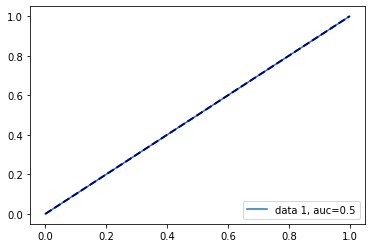

[[[0.9004739336492891, 0.9054054054054054, 9.698519945144653], [0.8648648648648649, 0.8648648648648649, 12.352439641952515], [0.6781411359724612, 0.5788288288288288, 14.128205299377441], [0.6253869969040248, 0.45495495495495497, 8.696348428726196], [0.6253869969040248, 0.45495495495495497, 6.455407381057739]], [[0.9004739336492891, 0.9054054054054054, 9.846179485321045], [0.8648648648648649, 0.8648648648648649, 12.425658226013184], [0.6781411359724612, 0.5788288288288288, 14.057827234268188], [0.6253869969040248, 0.45495495495495497, 8.636319160461426], [0.6253869969040248, 0.45495495495495497, 6.366760015487671]], [[0.9004739336492891, 0.9054054054054054, 10.272482633590698], [0.8648648648648649, 0.8648648648648649, 12.2814302444458], [0.6781411359724612, 0.5788288288288288, 13.999823808670044], [0.6253869969040248, 0.45495495495495497, 8.717106103897095], [0.6253869969040248, 0.45495495495495497, 6.427501678466797]], [[0.9004739336492891, 0.9054054054054054, 9.887274265289307], [0.86

C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  8
Time taken: 9.963987
0.8983451536643027
0.9031531531531531


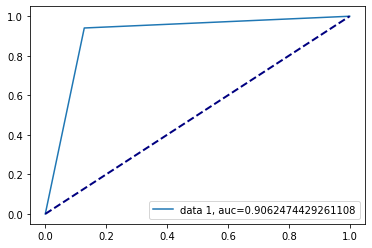

209     1
53      0
184     0
2115    1
728     1
       ..
1655   -1
1108    0
1143    1
1307    0
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=7, n_estimators=500,
                           subsample=0.7) and level of unlabelled 0.200000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  9
Time taken: 12.858703
0.8648648648648649
0.8648648648648649


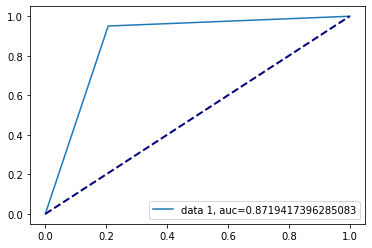

209     1
53      0
184     0
2115   -1
728     1
       ..
1655   -1
1108    0
1143    1
1307   -1
873     1
Name: Teenhome, Length: 1772, dtype: int64
[ 1  0 -1]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=7, n_estimators=500,
                           subsample=0.7) and level of unlabelled 0.500000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  10
Time taken: 14.021511
0.6781411359724612
0.5788288288288288


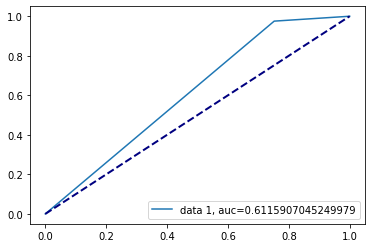

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108    0
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=7, n_estimators=500,
                           subsample=0.7) and level of unlabelled 0.900000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 8.612218
0.6253869969040248
0.45495495495495497


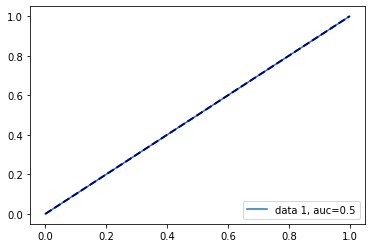

209    -1
53     -1
184    -1
2115   -1
728    -1
       ..
1655   -1
1108   -1
1143   -1
1307   -1
873    -1
Name: Teenhome, Length: 1772, dtype: int64
[-1  1  0]
Base model GradientBoostingClassifier(learning_rate=1, max_depth=7, n_estimators=500,
                           subsample=0.7) and level of unlabelled 0.950000


C:\Users\achan260\AppData\Local\Temp/ipykernel_13688/79937319.py:36: RuntimeWarning: divide by zero encountered in log
  sigma = np.percentile(np.log(S), sigma_percentile)


All observations have been labeled
Number of iterations:  11
Time taken: 6.436144
0.6253869969040248
0.45495495495495497


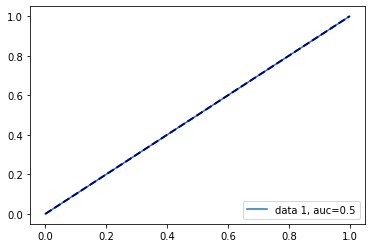

[[[0.9004739336492891, 0.9054054054054054, 9.698519945144653], [0.8648648648648649, 0.8648648648648649, 12.352439641952515], [0.6781411359724612, 0.5788288288288288, 14.128205299377441], [0.6253869969040248, 0.45495495495495497, 8.696348428726196], [0.6253869969040248, 0.45495495495495497, 6.455407381057739]], [[0.9004739336492891, 0.9054054054054054, 9.846179485321045], [0.8648648648648649, 0.8648648648648649, 12.425658226013184], [0.6781411359724612, 0.5788288288288288, 14.057827234268188], [0.6253869969040248, 0.45495495495495497, 8.636319160461426], [0.6253869969040248, 0.45495495495495497, 6.366760015487671]], [[0.9004739336492891, 0.9054054054054054, 10.272482633590698], [0.8648648648648649, 0.8648648648648649, 12.2814302444458], [0.6781411359724612, 0.5788288288288288, 13.999823808670044], [0.6253869969040248, 0.45495495495495497, 8.717106103897095], [0.6253869969040248, 0.45495495495495497, 6.427501678466797]], [[0.9004739336492891, 0.9054054054054054, 9.887274265289307], [0.86

In [117]:
final_results_d2_boost = semi_boost_wrapper(X_data2_features,Y_data2, base_algos_d2)

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106    1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.100000
All observations have been labeled
Number of iterations:  5
Time taken: 0.168035
0.8484848484848485
0.8360655737704918


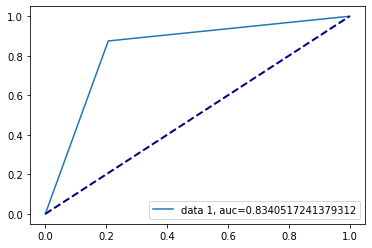

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106   -1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.200000
All observations have been labeled
Number of iterations:  6
Time taken: 0.203913
0.8529411764705882
0.8360655737704918


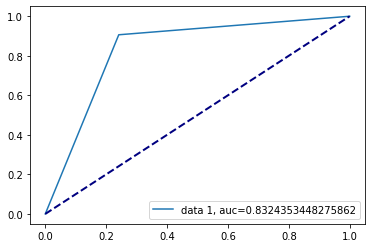

132   -1
202    0
196   -1
75     1
176    0
      ..
188   -1
71     1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.500000
All observations have been labeled
Number of iterations:  7
Time taken: 0.253170
0.7804878048780487
0.7049180327868853


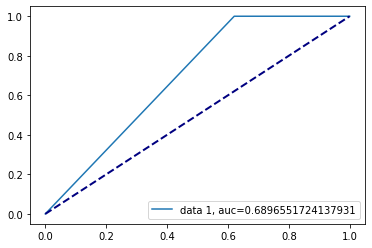

132   -1
202    0
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.900000
All observations have been labeled
Number of iterations:  8
Time taken: 0.161577
0.6881720430107526
0.5245901639344263


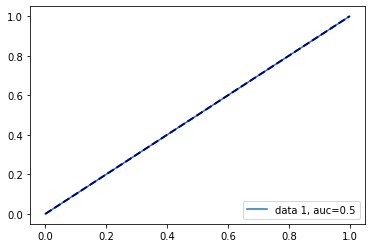

132   -1
202   -1
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  1  0]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.950000
All observations have been labeled
Number of iterations:  8
Time taken: 0.127009
0.6881720430107526
0.5245901639344263


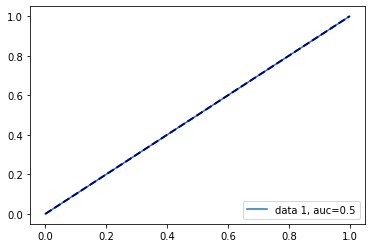

[[[0.8484848484848485, 0.8360655737704918, 0.16803479194641113], [0.8529411764705882, 0.8360655737704918, 0.20391321182250977], [0.7804878048780487, 0.7049180327868853, 0.2531700134277344], [0.6881720430107526, 0.5245901639344263, 0.1615769863128662], [0.6881720430107526, 0.5245901639344263, 0.12700867652893066]]]
132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106    1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.100000
All observations have been labeled
Number of iterations:  5
Time taken: 0.171650
0.8484848484848485
0.8360655737704918


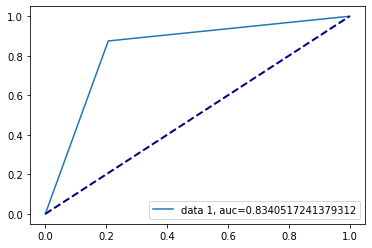

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106   -1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.200000
All observations have been labeled
Number of iterations:  6
Time taken: 0.205183
0.8529411764705882
0.8360655737704918


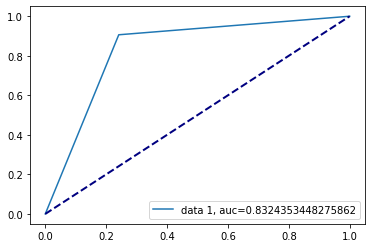

132   -1
202    0
196   -1
75     1
176    0
      ..
188   -1
71     1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.500000
All observations have been labeled
Number of iterations:  7
Time taken: 0.239014
0.7804878048780487
0.7049180327868853


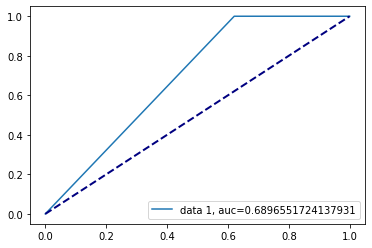

132   -1
202    0
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.900000
All observations have been labeled
Number of iterations:  8
Time taken: 0.151698
0.6881720430107526
0.5245901639344263


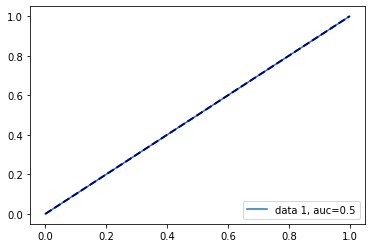

132   -1
202   -1
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  1  0]
Base model DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features=9,
                       min_samples_leaf=5) and level of unlabelled 0.950000
All observations have been labeled
Number of iterations:  8
Time taken: 0.114305
0.6881720430107526
0.5245901639344263


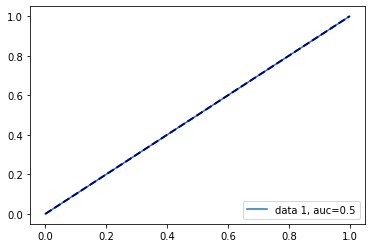

[[[0.8484848484848485, 0.8360655737704918, 0.16803479194641113], [0.8529411764705882, 0.8360655737704918, 0.20391321182250977], [0.7804878048780487, 0.7049180327868853, 0.2531700134277344], [0.6881720430107526, 0.5245901639344263, 0.1615769863128662], [0.6881720430107526, 0.5245901639344263, 0.12700867652893066]], [[0.8484848484848485, 0.8360655737704918, 0.17165040969848633], [0.8529411764705882, 0.8360655737704918, 0.2051830291748047], [0.7804878048780487, 0.7049180327868853, 0.239013671875], [0.6881720430107526, 0.5245901639344263, 0.15169787406921387], [0.6881720430107526, 0.5245901639344263, 0.11430478096008301]]]
132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106    1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.100000
All observations have been labeled
Number of iterations:  5
Time taken: 0.191845
0.8484848484848485
0.8360655737704918


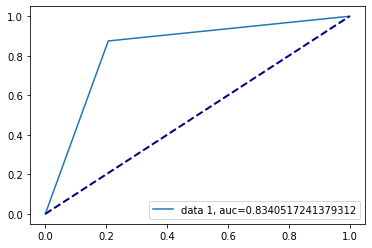

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106   -1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.200000
All observations have been labeled
Number of iterations:  6
Time taken: 0.204261
0.8529411764705882
0.8360655737704918


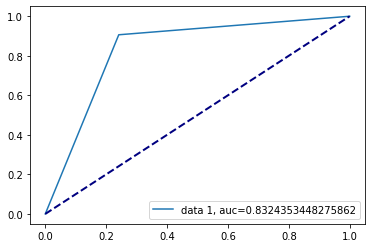

132   -1
202    0
196   -1
75     1
176    0
      ..
188   -1
71     1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.500000
All observations have been labeled
Number of iterations:  7
Time taken: 0.230431
0.7804878048780487
0.7049180327868853


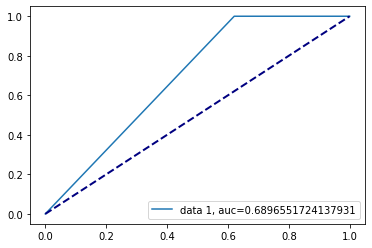

132   -1
202    0
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model SVC(C=1, probability=True) and level of unlabelled 0.900000
All observations have been labeled
Number of iterations:  8
Time taken: 0.165059
0.6881720430107526
0.5245901639344263


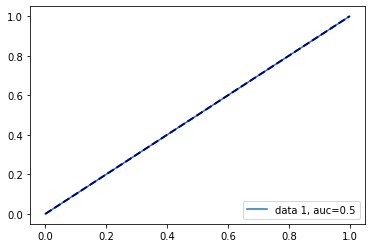

132   -1
202   -1
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  1  0]
Base model SVC(C=1, probability=True) and level of unlabelled 0.950000
All observations have been labeled
Number of iterations:  8
Time taken: 0.136399
0.6881720430107526
0.5245901639344263


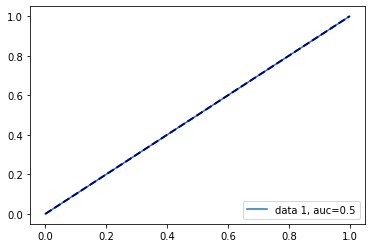

[[[0.8484848484848485, 0.8360655737704918, 0.16803479194641113], [0.8529411764705882, 0.8360655737704918, 0.20391321182250977], [0.7804878048780487, 0.7049180327868853, 0.2531700134277344], [0.6881720430107526, 0.5245901639344263, 0.1615769863128662], [0.6881720430107526, 0.5245901639344263, 0.12700867652893066]], [[0.8484848484848485, 0.8360655737704918, 0.17165040969848633], [0.8529411764705882, 0.8360655737704918, 0.2051830291748047], [0.7804878048780487, 0.7049180327868853, 0.239013671875], [0.6881720430107526, 0.5245901639344263, 0.15169787406921387], [0.6881720430107526, 0.5245901639344263, 0.11430478096008301]], [[0.8484848484848485, 0.8360655737704918, 0.19184470176696777], [0.8529411764705882, 0.8360655737704918, 0.20426058769226074], [0.7804878048780487, 0.7049180327868853, 0.23043107986450195], [0.6881720430107526, 0.5245901639344263, 0.16505932807922363], [0.6881720430107526, 0.5245901639344263, 0.1363992691040039]]]
132    1
202    0
196    0
75     1
176    0
      ..
188

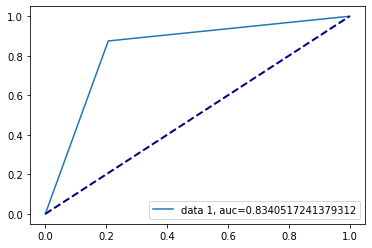

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106   -1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=155) and level of unlabelled 0.200000
All observations have been labeled
Number of iterations:  6
Time taken: 0.217148
0.8529411764705882
0.8360655737704918


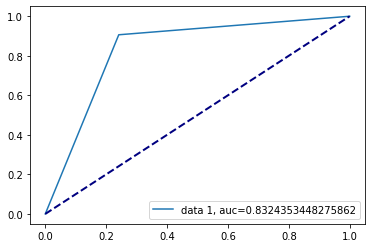

132   -1
202    0
196   -1
75     1
176    0
      ..
188   -1
71     1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=155) and level of unlabelled 0.500000
All observations have been labeled
Number of iterations:  7
Time taken: 0.235346
0.7804878048780487
0.7049180327868853


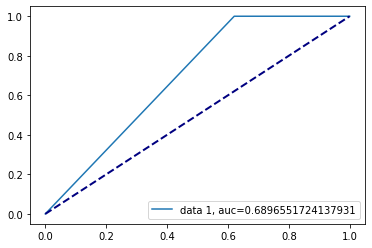

132   -1
202    0
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=155) and level of unlabelled 0.900000
All observations have been labeled
Number of iterations:  8
Time taken: 0.154483
0.6881720430107526
0.5245901639344263


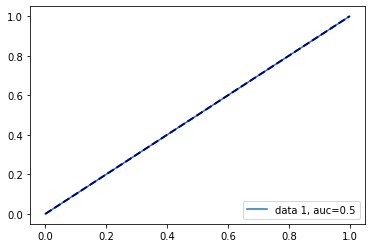

132   -1
202   -1
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  1  0]
Base model RandomForestClassifier(max_depth=45, max_features='sqrt', min_samples_split=10,
                       n_estimators=155) and level of unlabelled 0.950000
All observations have been labeled
Number of iterations:  8
Time taken: 0.127260
0.6881720430107526
0.5245901639344263


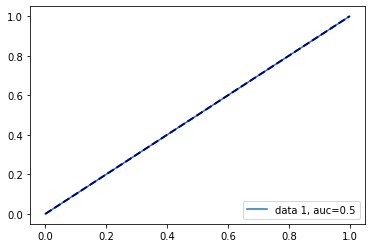

[[[0.8484848484848485, 0.8360655737704918, 0.16803479194641113], [0.8529411764705882, 0.8360655737704918, 0.20391321182250977], [0.7804878048780487, 0.7049180327868853, 0.2531700134277344], [0.6881720430107526, 0.5245901639344263, 0.1615769863128662], [0.6881720430107526, 0.5245901639344263, 0.12700867652893066]], [[0.8484848484848485, 0.8360655737704918, 0.17165040969848633], [0.8529411764705882, 0.8360655737704918, 0.2051830291748047], [0.7804878048780487, 0.7049180327868853, 0.239013671875], [0.6881720430107526, 0.5245901639344263, 0.15169787406921387], [0.6881720430107526, 0.5245901639344263, 0.11430478096008301]], [[0.8484848484848485, 0.8360655737704918, 0.19184470176696777], [0.8529411764705882, 0.8360655737704918, 0.20426058769226074], [0.7804878048780487, 0.7049180327868853, 0.23043107986450195], [0.6881720430107526, 0.5245901639344263, 0.16505932807922363], [0.6881720430107526, 0.5245901639344263, 0.1363992691040039]], [[0.8484848484848485, 0.8360655737704918, 0.1780712604522

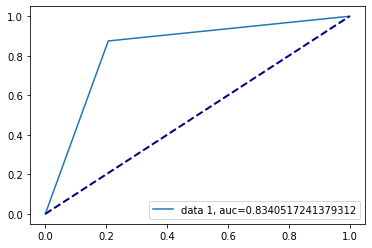

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106   -1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.200000
All observations have been labeled
Number of iterations:  6
Time taken: 0.195534
0.8529411764705882
0.8360655737704918


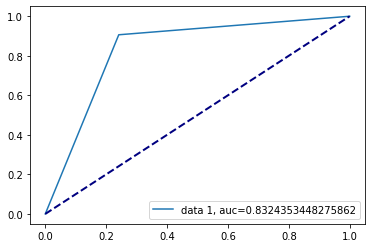

132   -1
202    0
196   -1
75     1
176    0
      ..
188   -1
71     1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.500000
All observations have been labeled
Number of iterations:  7
Time taken: 0.234397
0.7804878048780487
0.7049180327868853


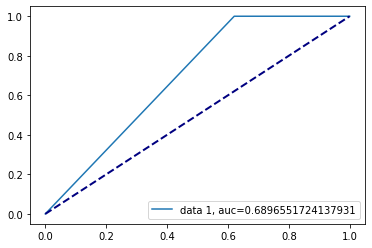

132   -1
202    0
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.900000
All observations have been labeled
Number of iterations:  8
Time taken: 0.154039
0.6881720430107526
0.5245901639344263


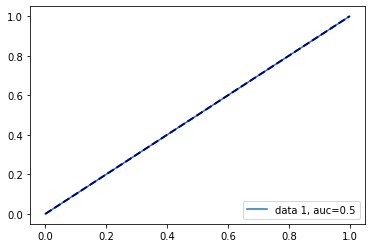

132   -1
202   -1
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  1  0]
Base model KNeighborsClassifier(n_neighbors=7) and level of unlabelled 0.950000
All observations have been labeled
Number of iterations:  8
Time taken: 0.132349
0.6881720430107526
0.5245901639344263


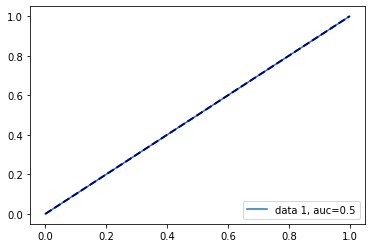

[[[0.8484848484848485, 0.8360655737704918, 0.16803479194641113], [0.8529411764705882, 0.8360655737704918, 0.20391321182250977], [0.7804878048780487, 0.7049180327868853, 0.2531700134277344], [0.6881720430107526, 0.5245901639344263, 0.1615769863128662], [0.6881720430107526, 0.5245901639344263, 0.12700867652893066]], [[0.8484848484848485, 0.8360655737704918, 0.17165040969848633], [0.8529411764705882, 0.8360655737704918, 0.2051830291748047], [0.7804878048780487, 0.7049180327868853, 0.239013671875], [0.6881720430107526, 0.5245901639344263, 0.15169787406921387], [0.6881720430107526, 0.5245901639344263, 0.11430478096008301]], [[0.8484848484848485, 0.8360655737704918, 0.19184470176696777], [0.8529411764705882, 0.8360655737704918, 0.20426058769226074], [0.7804878048780487, 0.7049180327868853, 0.23043107986450195], [0.6881720430107526, 0.5245901639344263, 0.16505932807922363], [0.6881720430107526, 0.5245901639344263, 0.1363992691040039]], [[0.8484848484848485, 0.8360655737704918, 0.1780712604522

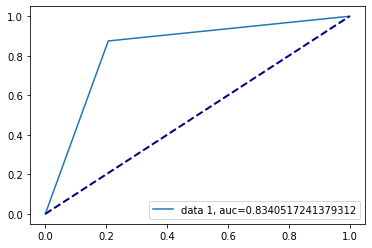

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106   -1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model MLPClassifier(activation='tanh', alpha=0.001, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.200000
All observations have been labeled
Number of iterations:  6
Time taken: 0.211450
0.8529411764705882
0.8360655737704918


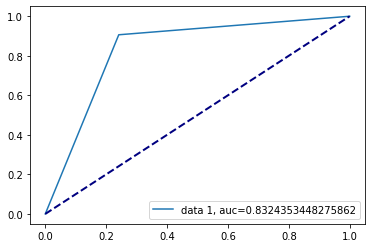

132   -1
202    0
196   -1
75     1
176    0
      ..
188   -1
71     1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model MLPClassifier(activation='tanh', alpha=0.001, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.500000
All observations have been labeled
Number of iterations:  7
Time taken: 0.236358
0.7804878048780487
0.7049180327868853


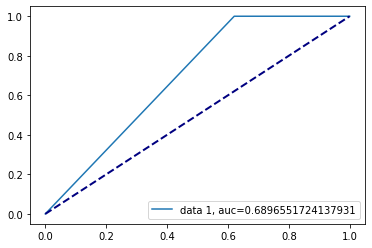

132   -1
202    0
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model MLPClassifier(activation='tanh', alpha=0.001, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.900000
All observations have been labeled
Number of iterations:  8
Time taken: 0.154305
0.6881720430107526
0.5245901639344263


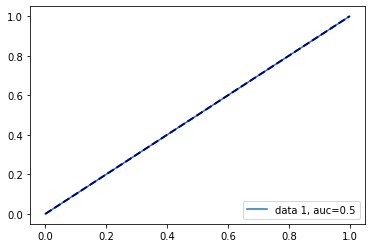

132   -1
202   -1
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  1  0]
Base model MLPClassifier(activation='tanh', alpha=0.001, hidden_layer_sizes=(50, 50, 50)) and level of unlabelled 0.950000
All observations have been labeled
Number of iterations:  8
Time taken: 0.144387
0.6881720430107526
0.5245901639344263


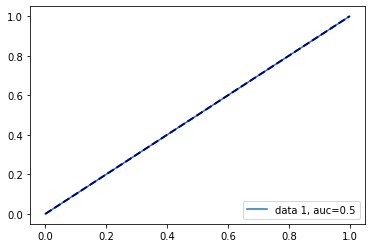

[[[0.8484848484848485, 0.8360655737704918, 0.16803479194641113], [0.8529411764705882, 0.8360655737704918, 0.20391321182250977], [0.7804878048780487, 0.7049180327868853, 0.2531700134277344], [0.6881720430107526, 0.5245901639344263, 0.1615769863128662], [0.6881720430107526, 0.5245901639344263, 0.12700867652893066]], [[0.8484848484848485, 0.8360655737704918, 0.17165040969848633], [0.8529411764705882, 0.8360655737704918, 0.2051830291748047], [0.7804878048780487, 0.7049180327868853, 0.239013671875], [0.6881720430107526, 0.5245901639344263, 0.15169787406921387], [0.6881720430107526, 0.5245901639344263, 0.11430478096008301]], [[0.8484848484848485, 0.8360655737704918, 0.19184470176696777], [0.8529411764705882, 0.8360655737704918, 0.20426058769226074], [0.7804878048780487, 0.7049180327868853, 0.23043107986450195], [0.6881720430107526, 0.5245901639344263, 0.16505932807922363], [0.6881720430107526, 0.5245901639344263, 0.1363992691040039]], [[0.8484848484848485, 0.8360655737704918, 0.1780712604522

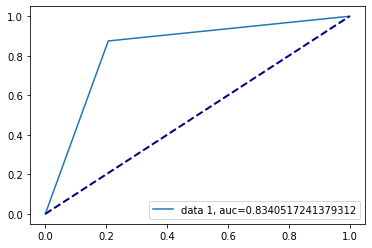

132    1
202    0
196    0
75     1
176    0
      ..
188   -1
71     1
106   -1
270    0
102    1
Name: target, Length: 242, dtype: int64
[ 1  0 -1]
Base model GradientBoostingClassifier(max_depth=1, n_estimators=50, subsample=1) and level of unlabelled 0.200000
All observations have been labeled
Number of iterations:  6
Time taken: 0.216196
0.8529411764705882
0.8360655737704918


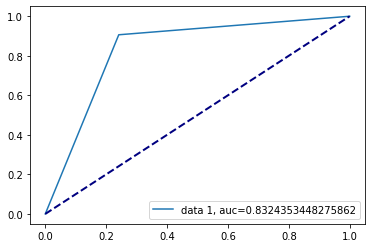

132   -1
202    0
196   -1
75     1
176    0
      ..
188   -1
71     1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model GradientBoostingClassifier(max_depth=1, n_estimators=50, subsample=1) and level of unlabelled 0.500000
All observations have been labeled
Number of iterations:  7
Time taken: 0.243859
0.7804878048780487
0.7049180327868853


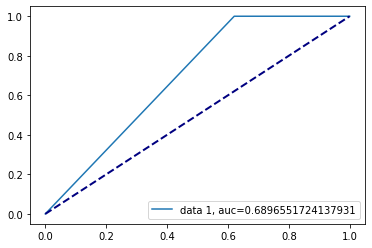

132   -1
202    0
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  0  1]
Base model GradientBoostingClassifier(max_depth=1, n_estimators=50, subsample=1) and level of unlabelled 0.900000
All observations have been labeled
Number of iterations:  8
Time taken: 0.164283
0.6881720430107526
0.5245901639344263


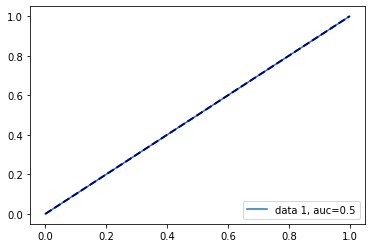

132   -1
202   -1
196   -1
75    -1
176   -1
      ..
188   -1
71    -1
106   -1
270   -1
102    1
Name: target, Length: 242, dtype: int64
[-1  1  0]
Base model GradientBoostingClassifier(max_depth=1, n_estimators=50, subsample=1) and level of unlabelled 0.950000
All observations have been labeled
Number of iterations:  8
Time taken: 0.135557
0.6881720430107526
0.5245901639344263


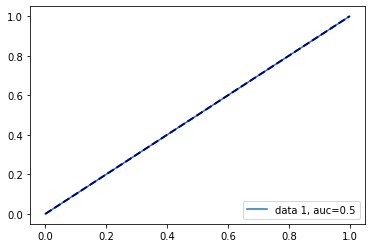

[[[0.8484848484848485, 0.8360655737704918, 0.16803479194641113], [0.8529411764705882, 0.8360655737704918, 0.20391321182250977], [0.7804878048780487, 0.7049180327868853, 0.2531700134277344], [0.6881720430107526, 0.5245901639344263, 0.1615769863128662], [0.6881720430107526, 0.5245901639344263, 0.12700867652893066]], [[0.8484848484848485, 0.8360655737704918, 0.17165040969848633], [0.8529411764705882, 0.8360655737704918, 0.2051830291748047], [0.7804878048780487, 0.7049180327868853, 0.239013671875], [0.6881720430107526, 0.5245901639344263, 0.15169787406921387], [0.6881720430107526, 0.5245901639344263, 0.11430478096008301]], [[0.8484848484848485, 0.8360655737704918, 0.19184470176696777], [0.8529411764705882, 0.8360655737704918, 0.20426058769226074], [0.7804878048780487, 0.7049180327868853, 0.23043107986450195], [0.6881720430107526, 0.5245901639344263, 0.16505932807922363], [0.6881720430107526, 0.5245901639344263, 0.1363992691040039]], [[0.8484848484848485, 0.8360655737704918, 0.1780712604522

In [115]:
final_results_d3_boost = semi_boost_wrapper(X_data3_features,Y_data3, base_algos_d3)

In [128]:
final_results_boost = [
    final_results_d1_boost,
    final_results_under_boost,
    final_results_over_boost,
    final_results_d2_boost,
    final_results_d3_boost
]

final_results_boost

[[[[0.6185286103542235, 0.8864557988645579, 100.56393051147461],
   [0.6370370370370371, 0.8807785888077859, 301.17155408859253],
   [0.2962962962962963, 0.3142741281427413, 98.46690487861633],
   [0.27926657263751764, 0.1711273317112733, 220.91381359100342],
   [0.2843033509700177, 0.17721005677210055, 149.65557265281677]],
  [[0.6153846153846154, 0.8844282238442822, 217.6602246761322],
   [0.635118306351183, 0.8811841038118411, 183.35224676132202],
   [0.2974068071312804, 0.29683698296836986, 263.4056417942047],
   [0.2770870337477797, 0.17477696674776966, 219.8364338874817],
   [0.27462257368799425, 0.1816707218167072, 156.0967698097229]],
  [[0.6189189189189189, 0.8856447688564477, 150.3673906326294],
   [0.6302729528535981, 0.8791565287915653, 186.21702909469604],
   [0.2982527427874847, 0.29967558799675587, 262.2836525440216],
   [0.27524893314367, 0.1735604217356042, 240.3143389225006],
   [0.2854115153655952, 0.17964314679643148, 152.39395141601562]],
  [[0.6089309878213803, 0.

In [121]:
#For each level of unlabelled data
# final_results_d3_boost[0] - TREE OTHERS index for algos: 1 - SVM, 2 - RF, 3 - KNN, 4 - MLP, 5 - GB 
# final_results_d3_boost[0][0] - TREE, 10% labelled OTHERS index for levels: 1 - 20%, 2 - 50%, 3 - 90%, 4 - 95% 
# final_results_d3_boost[0][0][0] - TREE, 10% labelled, f1 OTHERS index for metrics: 1 - accuracy, 2 - runtime

In [131]:
!pip install tensorflow


  Using cached tensorflow-2.7.0-cp39-cp39-win_amd64.whl (430.8 MB)
  Using cached absl_py-1.0.0-py3-none-any.whl (126 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
  Using cached tensorflow_io_gcs_filesystem-0.22.0-cp39-cp39-win_amd64.whl (1.5 MB)
  Using cached gast-0.4.0-py3-none-any.whl (9.8 kB)
  Using cached tensorflow_estimator-2.7.0-py2.py3-none-any.whl (463 kB)
  Using cached wrapt-1.13.3-cp39-cp39-win_amd64.whl (34 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl (65 kB)
  Using cached flatbuffers-2.0-py2.py3-none-any.whl (26 kB)
  Using cached termcolor-1.1.0.tar.gz (3.9 kB)
  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Using cached protobuf-3.19.1-cp39-cp39-win_amd64.whl (895 kB)
  Using cached tensorboard-2.7.0-py3-none-any.whl (5.8 MB)
  Using cached wheel-0.37.0-py2.py3-none-any.whl (35 kB)
  Using cached libclang-12.0.0-py2.py3-none-win_amd64.whl (13.1 MB)
  Using 

You should consider upgrading via the 'C:\Python-Workspace\Scripts\python.exe -m pip install --upgrade pip' command.


## Unsupervised pretraining

As the name suggests, the encoders encode the data into a low dimensional space and the decoders decode the output of the encoder back to the original dimension. The encoder and decoder are connected by a bottleneck layer that uses the encoder output as input. In case of large number of unlabelled data, stacked autoencoders can be used to gain information about the data (both labelled and unlabelled). This step is called pretraining. The autoencoder’s encoded output without the unlabelled data can further be used as an input to a supervised classifier to perform classification

In [37]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.utils import plot_model
import time
from matplotlib.pyplot import *
!pip install pydot


#Pass train data to train encoder, So input = X_train and y_train
def unsupervised_pretrain(model_list, X_train, X_test, y_train, y_test):
    #Split X_train and y_train further to create a validation set
    #NOTE: Final prediction input = 
    result_pretrain = []
    level_of_unlabelled = [0.1,0.2,0.5,0.9,0.95]
    for i in level_of_unlabelled:
        a = time.time()
        X_train1, X_test1, y_train1, y_test1 = train_test_split(X_train,y_train, test_size=i,random_state = 42)

        n_inputs = X_train.shape[1]
        # define encoder
        visible = Input(shape=(n_inputs,))
        # encoder level 1
        e = Dense(n_inputs*2)(visible)
        e = BatchNormalization()(e)
        e = LeakyReLU()(e)
        # encoder level 2
        e = Dense(n_inputs)(e)
        e = BatchNormalization()(e)
        e = LeakyReLU()(e)
        # bottleneck
        n_bottleneck = round(float(n_inputs) / 2.0)
        bottleneck = Dense(n_bottleneck)(e)
        # define decoder, level 1
        d = Dense(n_inputs)(bottleneck)
        d = BatchNormalization()(d)
        d = LeakyReLU()(d)
        # decoder level 2
        d = Dense(n_inputs*2)(d)
        d = BatchNormalization()(d)
        d = LeakyReLU()(d)
        # output layer
        output = Dense(n_inputs, activation='linear')(d)
        # define autoencoder model
        model = Model(inputs=visible, outputs=output)
        # compile autoencoder model
        model.compile(optimizer='adam', loss='mse')
        # plot the autoencoder
        plot_model(model, 'autoencoder_compress.png', show_shapes=True)
        # fit the autoencoder model to reconstruct input
        history = model.fit(X_train1, X_train1, epochs=200, batch_size=16, verbose=2, validation_data=(X_test1,X_test1))
        # plot loss
        plot(history.history['loss'], label='train')
        plot(history.history['val_loss'], label='test')
        legend()
        show()
        # define an encoder model (without the decoder)
        encoder = Model(inputs=visible, outputs=bottleneck)
        plot_model(encoder, 'encoder_compress.png', show_shapes=True)
        # save the encoder to file
        #         encoder.save('encoder_d.h5')
        # encode the train data
        X_train_encode = encoder.predict(X_train1)
        # encode the test data
        X_test_encode = encoder.predict(X_test1)
        
        temp_list = []

        for i in model_list:
            i.fit(X_train_encode, y_train1)
            b = time.time()
            diff = b - a
                # make predictions on the test set
            yhat = i.predict(X_test_encode)
            # calculate classification accuracy
            f1, acc = evaluation(i,X_test_encode,y_test1)
            temp_list.append([f1,acc,diff])
    
        result_pretrain.append(temp_list)
    return result_pretrain

You should consider upgrading via the 'C:\Python-Workspace\Scripts\python.exe -m pip install --upgrade pip' command.


## Baseline model for pretrained

In this case, the level of unlabelled data is 0% ie. NO unlabelled data

In [172]:
#Pass train data to train encoder, So input = X_train and y_train
def unsupervised_pretrain_b(model_list, X_train, X_test, y_train, y_test):
    #Split X_train and y_train further to create a validation set
    #NOTE: Final prediction input = 
    result_pretrain = []
    a = time.time()
    n_inputs = X_train.shape[1]
    # define encoder
    visible = Input(shape=(n_inputs,))
    # encoder level 1
    e = Dense(n_inputs*2)(visible)
    e = BatchNormalization()(e)
    e = LeakyReLU()(e)
    # encoder level 2
    e = Dense(n_inputs)(e)
    e = BatchNormalization()(e)
    e = LeakyReLU()(e)
    # bottleneck
    n_bottleneck = round(float(n_inputs) / 2.0)
    bottleneck = Dense(n_bottleneck)(e)
    # define decoder, level 1
    d = Dense(n_inputs)(bottleneck)
    d = BatchNormalization()(d)
    d = LeakyReLU()(d)
    # decoder level 2
    d = Dense(n_inputs*2)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU()(d)
    # output layer
    output = Dense(n_inputs, activation='linear')(d)
    # define autoencoder model
    model = Model(inputs=visible, outputs=output)
    # compile autoencoder model
    model.compile(optimizer='adam', loss='mse')
    # plot the autoencoder
    plot_model(model, 'autoencoder_compress.png', show_shapes=True)
    # fit the autoencoder model to reconstruct input
    history = model.fit(X_train, X_train, epochs=200, batch_size=16, verbose=2, validation_data=(X_test,X_test))
    # plot loss
    plot(history.history['loss'], label='train')
    plot(history.history['val_loss'], label='test')
    legend()
    show()
    # define an encoder model (without the decoder)
    encoder = Model(inputs=visible, outputs=bottleneck)
    plot_model(encoder, 'encoder_compress.png', show_shapes=True)
    # save the encoder to file
    #         encoder.save('encoder_d.h5')
    # encode the train data
    X_train_encode = encoder.predict(X_train)
    # encode the test data
    X_test_encode = encoder.predict(X_test)

    temp_list = []

    for i in model_list:
        i.fit(X_train_encode, y_train)
        b = time.time()
        diff = b - a
            # make predictions on the test set
        yhat = i.predict(X_test_encode)
        # calculate classification accuracy
        f1, acc = evaluation(i,X_test_encode,y_test)
        temp_list.append([f1,acc,diff])

    result_pretrain.append(temp_list)
    return result_pretrain

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
617/617 - 4s - loss: 0.4476 - val_loss: 0.1562 - 4s/epoch - 6ms/step
Epoch 2/200
617/617 - 2s - loss: 0.2688 - val_loss: 0.0972 - 2s/epoch - 3ms/step
Epoch 3/200
617/617 - 2s - loss: 0.2339 - val_loss: 0.0859 - 2s/epoch - 3ms/step
Epoch 4/200
617/617 - 2s - loss: 0.2169 - val_loss: 0.0778 - 2s/epoch - 3ms/step
Epoch 5/200
617/617 - 2s - loss: 0.2070 - val_loss: 0.1095 - 2s/epoch - 3ms/step
Epoch 6/200
617/617 - 2s - loss: 0.1968 - val_loss: 0.0689 - 2s/epoch - 3ms/step
Epoch 7/200
617/617 - 2s - loss: 0.1875 - val_loss: 0.0697 - 2s/epoch - 3ms/step
Epoch 8/200
617/617 - 2s - loss: 0.1819 - val_loss: 0.0636 - 2s/epoch - 3ms/step
Epoch 9/200
617/617 - 2s - loss: 0.1818 - val_loss: 0.0639 - 2s/epoch - 3ms/step
Epoch 10/200
617/617 - 2s - loss: 0.1705 - val_loss: 0.0619 - 2s/epoch - 3ms/step
Epoch 11/200
617/61

Epoch 99/200
617/617 - 2s - loss: 0.1087 - val_loss: 0.0518 - 2s/epoch - 3ms/step
Epoch 100/200
617/617 - 2s - loss: 0.1056 - val_loss: 0.0377 - 2s/epoch - 3ms/step
Epoch 101/200
617/617 - 2s - loss: 0.1037 - val_loss: 0.0427 - 2s/epoch - 3ms/step
Epoch 102/200
617/617 - 2s - loss: 0.1047 - val_loss: 0.0482 - 2s/epoch - 3ms/step
Epoch 103/200
617/617 - 2s - loss: 0.1040 - val_loss: 0.0468 - 2s/epoch - 3ms/step
Epoch 104/200
617/617 - 2s - loss: 0.1028 - val_loss: 0.0489 - 2s/epoch - 3ms/step
Epoch 105/200
617/617 - 2s - loss: 0.1040 - val_loss: 0.0540 - 2s/epoch - 3ms/step
Epoch 106/200
617/617 - 2s - loss: 0.1039 - val_loss: 0.0604 - 2s/epoch - 3ms/step
Epoch 107/200
617/617 - 2s - loss: 0.1057 - val_loss: 0.0504 - 2s/epoch - 3ms/step
Epoch 108/200
617/617 - 2s - loss: 0.1027 - val_loss: 0.0378 - 2s/epoch - 3ms/step
Epoch 109/200
617/617 - 2s - loss: 0.1045 - val_loss: 0.0499 - 2s/epoch - 3ms/step
Epoch 110/200
617/617 - 2s - loss: 0.0984 - val_loss: 0.0537 - 2s/epoch - 3ms/step
Epoch

Epoch 198/200
617/617 - 2s - loss: 0.0896 - val_loss: 0.0444 - 2s/epoch - 3ms/step
Epoch 199/200
617/617 - 2s - loss: 0.0861 - val_loss: 0.0419 - 2s/epoch - 3ms/step
Epoch 200/200
617/617 - 2s - loss: 0.0964 - val_loss: 0.0501 - 2s/epoch - 3ms/step


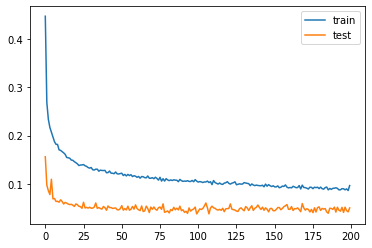

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5024000000000001
0.8738848337388483


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.45868465430016864
0.8698296836982968


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5159235668789809
0.8767234387672344


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5341614906832298
0.878345498783455


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5451761102603369
0.8795620437956204


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.48857142857142855
0.8548256285482563
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
517/517 - 3s - loss: 0.4592 - val_loss: 0.1565 - 3s/epoch - 7ms/step
Epoch 2/200
517/517 - 2s - loss: 0.2895 - val_loss: 0.1085 - 2s/epoch - 3ms/step
Epoch 3/200
517/517 - 2s - loss: 0.2436 - val_loss: 0.0831 - 2s/epoch - 3ms/step
Epoch 4/200
517/517 - 2s - loss: 0.2208 - val_loss: 0.0732 - 2s/epoch - 3ms/step
Epoch 5/200
517/517 - 2s - loss: 0.2132 - val_loss: 0.0702 - 2s/epoch - 3ms/step
Epoch 6/200
517/517 - 2s - loss: 0.2006 - val_loss: 0.0683 - 2s/epoch - 3ms/step
Epoch 7/200
517/517 - 2s - loss: 0.1940 - val_loss: 0.0615 - 2s/epoch - 3ms/step
Epoch 8/200
517/517 - 2s - loss: 0.1845 - val_loss: 0.0602 - 2s/epoch - 3ms/step
Epoch 9/200
517/517 - 2s - loss: 0.1808 - val_loss: 0.0588 - 2s/epoch - 3ms/step
Epoch 10/200
517/517 - 2s - loss: 0.1714 - val_loss: 0.0544 - 

Epoch 99/200
517/517 - 2s - loss: 0.0954 - val_loss: 0.0421 - 2s/epoch - 3ms/step
Epoch 100/200
517/517 - 2s - loss: 0.0938 - val_loss: 0.0419 - 2s/epoch - 3ms/step
Epoch 101/200
517/517 - 2s - loss: 0.0951 - val_loss: 0.0411 - 2s/epoch - 3ms/step
Epoch 102/200
517/517 - 2s - loss: 0.0924 - val_loss: 0.0379 - 2s/epoch - 3ms/step
Epoch 103/200
517/517 - 1s - loss: 0.0910 - val_loss: 0.0362 - 1s/epoch - 3ms/step
Epoch 104/200
517/517 - 1s - loss: 0.0924 - val_loss: 0.0357 - 1s/epoch - 3ms/step
Epoch 105/200
517/517 - 2s - loss: 0.0951 - val_loss: 0.0387 - 2s/epoch - 3ms/step
Epoch 106/200
517/517 - 2s - loss: 0.0944 - val_loss: 0.0381 - 2s/epoch - 3ms/step
Epoch 107/200
517/517 - 2s - loss: 0.0920 - val_loss: 0.0387 - 2s/epoch - 3ms/step
Epoch 108/200
517/517 - 2s - loss: 0.0911 - val_loss: 0.0375 - 2s/epoch - 3ms/step
Epoch 109/200
517/517 - 2s - loss: 0.0912 - val_loss: 0.0402 - 2s/epoch - 3ms/step
Epoch 110/200
517/517 - 2s - loss: 0.0905 - val_loss: 0.0354 - 2s/epoch - 3ms/step
Epoch

Epoch 198/200
517/517 - 2s - loss: 0.0791 - val_loss: 0.0337 - 2s/epoch - 3ms/step
Epoch 199/200
517/517 - 1s - loss: 0.0825 - val_loss: 0.0432 - 1s/epoch - 3ms/step
Epoch 200/200
517/517 - 1s - loss: 0.0845 - val_loss: 0.0353 - 1s/epoch - 2ms/step


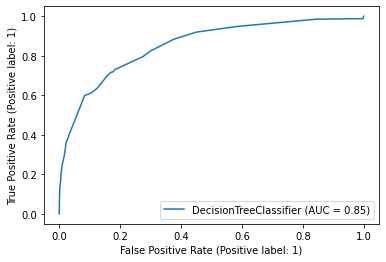

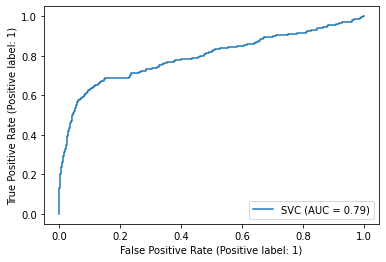

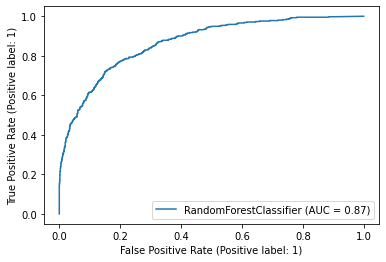

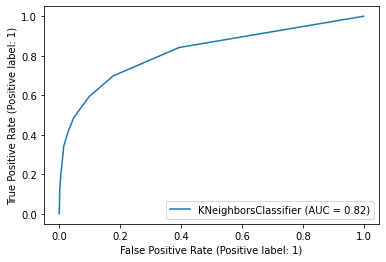

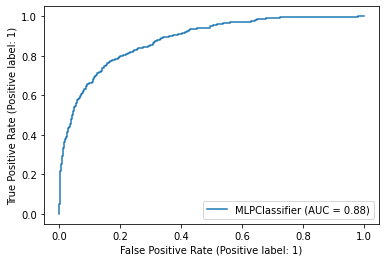

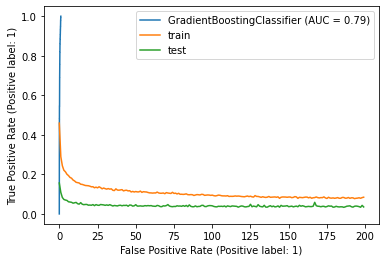

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6978193146417445
0.9060987415295256


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7523809523809524
0.9244917715392061


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7534039334341907
0.9211035818005808


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7281399046104929
0.9172313649564375


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.780058651026393
0.9273959341723137


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7206946454413892
0.9065827686350436
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
1043/1043 - 5s - loss: 0.3805 - val_loss: 0.1222 - 5s/epoch - 5ms/step
Epoch 2/200
1043/1043 - 3s - loss: 0.2441 - val_loss: 0.0958 - 3s/epoch - 3ms/step
Epoch 3/200
1043/1043 - 3s - loss: 0.2153 - val_loss: 0.0854 - 3s/epoch - 3ms/step
Epoch 4/200
1043/1043 - 3s - loss: 0.1992 - val_loss: 0.0770 - 3s/epoch - 3ms/step
Epoch 5/200
1043/1043 - 3s - loss: 0.1872 - val_loss: 0.0695 - 3s/epoch - 3ms/step
Epoch 6/200
1043/1043 - 3s - loss: 0.1815 - val_loss: 0.0651 - 3s/epoch - 3ms/step
Epoch 7/200
1043/1043 - 3s - loss: 0.1715 - val_loss: 0.0591 - 3s/epoch - 3ms/step
Epoch 8/200
1043/1043 - 3s - loss: 0.1614 - val_loss: 0.0564 - 3s/epoch - 3ms/step
Epoch 9/200
1043/1043 - 3s - loss: 0.1556 - val_loss: 0.0495 - 3s/epoch - 3ms/step
Epoch 10/200
1043/1043 - 3s - loss: 0.1547 - 

Epoch 97/200
1043/1043 - 3s - loss: 0.0870 - val_loss: 0.0491 - 3s/epoch - 3ms/step
Epoch 98/200
1043/1043 - 3s - loss: 0.0897 - val_loss: 0.0489 - 3s/epoch - 3ms/step
Epoch 99/200
1043/1043 - 3s - loss: 0.0845 - val_loss: 0.0471 - 3s/epoch - 3ms/step
Epoch 100/200
1043/1043 - 3s - loss: 0.0862 - val_loss: 0.0477 - 3s/epoch - 3ms/step
Epoch 101/200
1043/1043 - 3s - loss: 0.0869 - val_loss: 0.0480 - 3s/epoch - 3ms/step
Epoch 102/200
1043/1043 - 3s - loss: 0.0853 - val_loss: 0.0504 - 3s/epoch - 3ms/step
Epoch 103/200
1043/1043 - 3s - loss: 0.0853 - val_loss: 0.0532 - 3s/epoch - 3ms/step
Epoch 104/200
1043/1043 - 3s - loss: 0.0891 - val_loss: 0.0579 - 3s/epoch - 3ms/step
Epoch 105/200
1043/1043 - 3s - loss: 0.0836 - val_loss: 0.0546 - 3s/epoch - 3ms/step
Epoch 106/200
1043/1043 - 3s - loss: 0.0864 - val_loss: 0.0466 - 3s/epoch - 3ms/step
Epoch 107/200
1043/1043 - 3s - loss: 0.0842 - val_loss: 0.0502 - 3s/epoch - 3ms/step
Epoch 108/200
1043/1043 - 3s - loss: 0.0847 - val_loss: 0.0505 - 3s/

Epoch 194/200
1043/1043 - 3s - loss: 0.0710 - val_loss: 0.0477 - 3s/epoch - 3ms/step
Epoch 195/200
1043/1043 - 3s - loss: 0.0669 - val_loss: 0.0474 - 3s/epoch - 3ms/step
Epoch 196/200
1043/1043 - 3s - loss: 0.0674 - val_loss: 0.0475 - 3s/epoch - 3ms/step
Epoch 197/200
1043/1043 - 3s - loss: 0.0667 - val_loss: 0.0473 - 3s/epoch - 3ms/step
Epoch 198/200
1043/1043 - 3s - loss: 0.0694 - val_loss: 0.0515 - 3s/epoch - 3ms/step
Epoch 199/200
1043/1043 - 3s - loss: 0.0692 - val_loss: 0.0454 - 3s/epoch - 3ms/step
Epoch 200/200
1043/1043 - 3s - loss: 0.0699 - val_loss: 0.0482 - 3s/epoch - 3ms/step


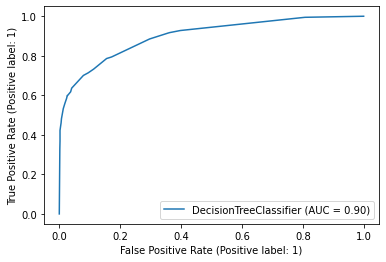

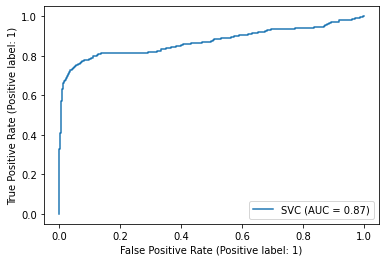

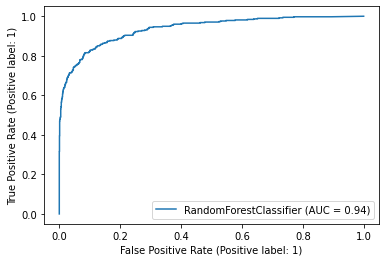

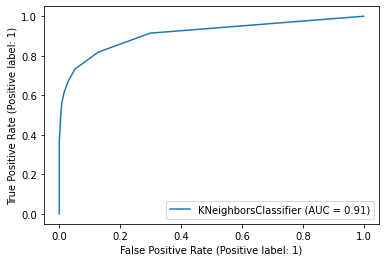

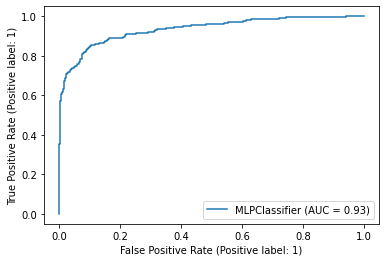

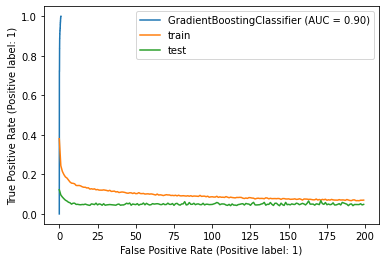

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7916968380400675
0.7929959222835212


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8180009945300845
0.824418325737587


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8952916373858045
0.8927800431758215


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8762376237623762
0.8680738786279684


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8610328638497652
0.8579995202686496


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8779573670648865
0.8750299832094027
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
111/111 - 3s - loss: 0.5239 - val_loss: 0.2826 - 3s/epoch - 25ms/step
Epoch 2/200
111/111 - 0s - loss: 0.2504 - val_loss: 0.1707 - 370ms/epoch - 3ms/step
Epoch 3/200
111/111 - 0s - loss: 0.2179 - val_loss: 0.1377 - 373ms/epoch - 3ms/step
Epoch 4/200
111/111 - 0s - loss: 0.1967 - val_loss: 0.1188 - 378ms/epoch - 3ms/step
Epoch 5/200
111/111 - 0s - loss: 0.1780 - val_loss: 0.1075 - 390ms/epoch - 4ms/step
Epoch 6/200
111/111 - 0s - loss: 0.1706 - val_loss: 0.1011 - 390ms/epoch - 4ms/step
Epoch 7/200
111/111 - 0s - loss: 0.1573 - val_loss: 0.0913 - 381ms/epoch - 3ms/step
Epoch 8/200
111/111 - 0s - loss: 0.1507 - val_loss: 0.0870 - 377ms/epoch - 3ms/step
Epoch 9/200
111/111 - 0s - loss: 0.1455 - val_loss: 0.0797 - 392ms/epoch - 4ms/step
Epoch 10/200
111/111 - 0s - loss: 0.14

111/111 - 0s - loss: 0.0827 - val_loss: 0.0370 - 369ms/epoch - 3ms/step
Epoch 96/200
111/111 - 0s - loss: 0.0777 - val_loss: 0.0331 - 369ms/epoch - 3ms/step
Epoch 97/200
111/111 - 0s - loss: 0.0755 - val_loss: 0.0326 - 379ms/epoch - 3ms/step
Epoch 98/200
111/111 - 0s - loss: 0.0793 - val_loss: 0.0378 - 400ms/epoch - 4ms/step
Epoch 99/200
111/111 - 0s - loss: 0.0800 - val_loss: 0.0339 - 370ms/epoch - 3ms/step
Epoch 100/200
111/111 - 0s - loss: 0.0776 - val_loss: 0.0319 - 386ms/epoch - 3ms/step
Epoch 101/200
111/111 - 0s - loss: 0.0794 - val_loss: 0.0330 - 377ms/epoch - 3ms/step
Epoch 102/200
111/111 - 0s - loss: 0.0790 - val_loss: 0.0333 - 375ms/epoch - 3ms/step
Epoch 103/200
111/111 - 0s - loss: 0.0793 - val_loss: 0.0364 - 385ms/epoch - 3ms/step
Epoch 104/200
111/111 - 0s - loss: 0.0800 - val_loss: 0.0322 - 372ms/epoch - 3ms/step
Epoch 105/200
111/111 - 0s - loss: 0.0782 - val_loss: 0.0354 - 401ms/epoch - 4ms/step
Epoch 106/200
111/111 - 0s - loss: 0.0774 - val_loss: 0.0401 - 370ms/epo

Epoch 191/200
111/111 - 0s - loss: 0.0645 - val_loss: 0.0293 - 395ms/epoch - 4ms/step
Epoch 192/200
111/111 - 0s - loss: 0.0651 - val_loss: 0.0400 - 391ms/epoch - 4ms/step
Epoch 193/200
111/111 - 0s - loss: 0.0656 - val_loss: 0.0272 - 376ms/epoch - 3ms/step
Epoch 194/200
111/111 - 0s - loss: 0.0636 - val_loss: 0.0281 - 379ms/epoch - 3ms/step
Epoch 195/200
111/111 - 0s - loss: 0.0686 - val_loss: 0.0318 - 361ms/epoch - 3ms/step
Epoch 196/200
111/111 - 0s - loss: 0.0678 - val_loss: 0.0272 - 360ms/epoch - 3ms/step
Epoch 197/200
111/111 - 0s - loss: 0.0659 - val_loss: 0.0271 - 369ms/epoch - 3ms/step
Epoch 198/200
111/111 - 0s - loss: 0.0643 - val_loss: 0.0286 - 368ms/epoch - 3ms/step
Epoch 199/200
111/111 - 0s - loss: 0.0644 - val_loss: 0.0290 - 381ms/epoch - 3ms/step
Epoch 200/200
111/111 - 0s - loss: 0.0664 - val_loss: 0.0292 - 380ms/epoch - 3ms/step


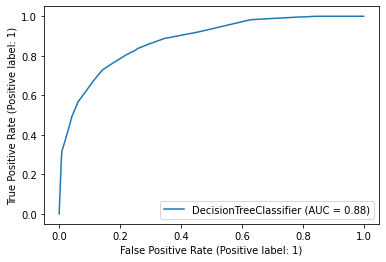

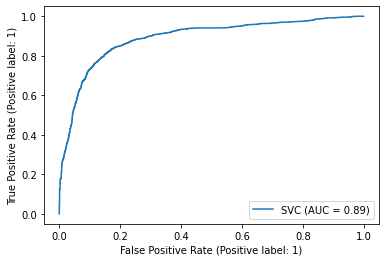

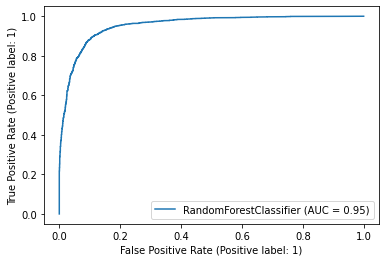

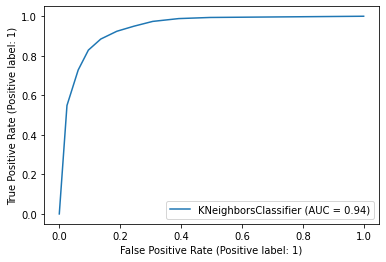

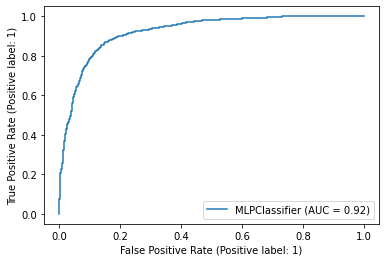

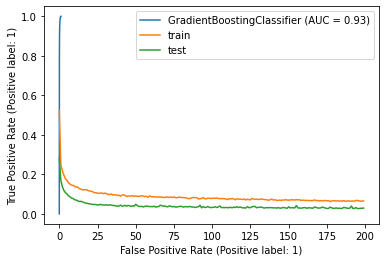

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7461928934010152
0.7747747747747747


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8463476070528967
0.8626126126126126


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8380462724935732
0.8581081081081081
0.7951219512195122
0.8108108108108109


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8871794871794871
0.9009009009009009


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8484848484848486
0.8648648648648649
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
16/16 - 2s - loss: 0.9689 - val_loss: 0.6819 - 2s/epoch - 135ms/step
Epoch 2/200
16/16 - 0s - loss: 0.6594 - val_loss: 0.6118 - 92ms/epoch - 6ms/step
Epoch 3/200
16/16 - 0s - loss: 0.5139 - val_loss: 0.5575 - 94ms/epoch - 6ms/step
Epoch 4/200
16/16 - 0s - loss: 0.4220 - val_loss: 0.5058 - 84ms/epoch - 5ms/step
Epoch 5/200
16/16 - 0s - loss: 0.3672 - val_loss: 0.4556 - 84ms/epoch - 5ms/step
Epoch 6/200
16/16 - 0s - loss: 0.3418 - val_loss: 0.4108 - 76ms/epoch - 5ms/step
Epoch 7/200
16/16 - 0s - loss: 0.3052 - val_loss: 0.3741 - 84ms/epoch - 5ms/step
Epoch 8/200
16/16 - 0s - loss: 0.2899 - val_loss: 0.3454 - 85ms/epoch - 5ms/step
Epoch 9/200
16/16 - 0s - loss: 0.2874 - val_loss: 0.3257 - 84ms/epoch - 5ms/step
Epoch 10/200
16/16 - 0s - loss: 0.2748 - val_loss: 0.3058 - 85m

Epoch 99/200
16/16 - 0s - loss: 0.1480 - val_loss: 0.1186 - 97ms/epoch - 6ms/step
Epoch 100/200
16/16 - 0s - loss: 0.1468 - val_loss: 0.1172 - 84ms/epoch - 5ms/step
Epoch 101/200
16/16 - 0s - loss: 0.1453 - val_loss: 0.1168 - 93ms/epoch - 6ms/step
Epoch 102/200
16/16 - 0s - loss: 0.1385 - val_loss: 0.1180 - 88ms/epoch - 5ms/step
Epoch 103/200
16/16 - 0s - loss: 0.1439 - val_loss: 0.1198 - 74ms/epoch - 5ms/step
Epoch 104/200
16/16 - 0s - loss: 0.1441 - val_loss: 0.1196 - 99ms/epoch - 6ms/step
Epoch 105/200
16/16 - 0s - loss: 0.1495 - val_loss: 0.1181 - 83ms/epoch - 5ms/step
Epoch 106/200
16/16 - 0s - loss: 0.1483 - val_loss: 0.1168 - 94ms/epoch - 6ms/step
Epoch 107/200
16/16 - 0s - loss: 0.1440 - val_loss: 0.1149 - 85ms/epoch - 5ms/step
Epoch 108/200
16/16 - 0s - loss: 0.1393 - val_loss: 0.1141 - 76ms/epoch - 5ms/step
Epoch 109/200
16/16 - 0s - loss: 0.1490 - val_loss: 0.1140 - 84ms/epoch - 5ms/step
Epoch 110/200
16/16 - 0s - loss: 0.1446 - val_loss: 0.1154 - 89ms/epoch - 6ms/step
Epoch

Epoch 198/200
16/16 - 0s - loss: 0.1366 - val_loss: 0.1038 - 89ms/epoch - 6ms/step
Epoch 199/200
16/16 - 0s - loss: 0.1276 - val_loss: 0.1025 - 86ms/epoch - 5ms/step
Epoch 200/200
16/16 - 0s - loss: 0.1400 - val_loss: 0.0983 - 89ms/epoch - 6ms/step


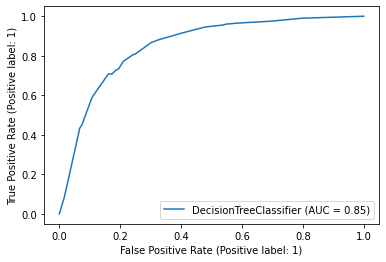

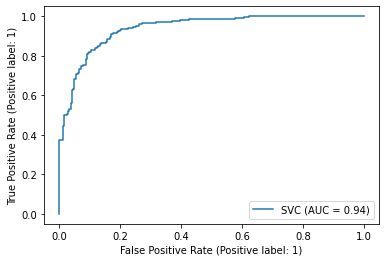

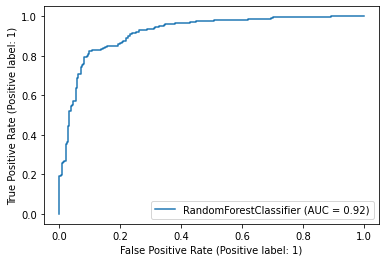

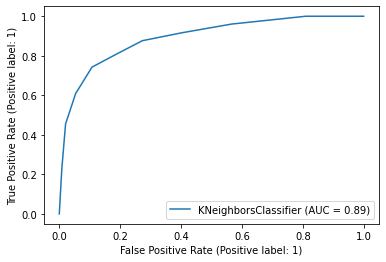

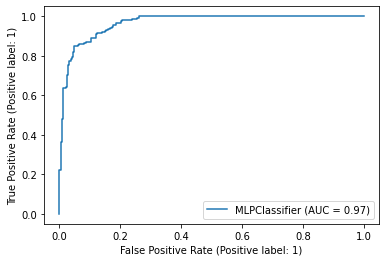

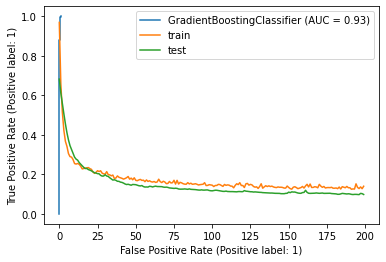

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7857142857142857
0.8032786885245902
0.8387096774193549
0.8360655737704918


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8524590163934426
0.8524590163934426
0.8524590163934426
0.8524590163934426


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8333333333333334
0.8360655737704918
0.7619047619047619
0.7540983606557377


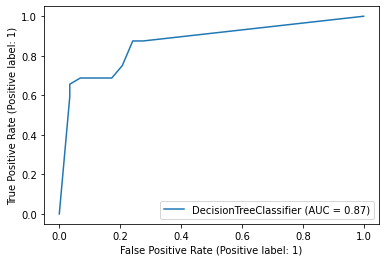

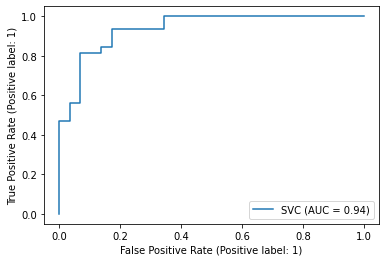

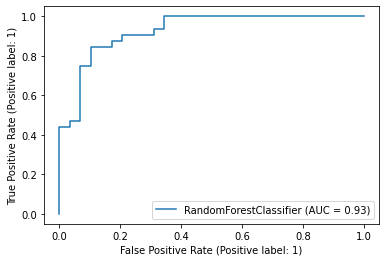

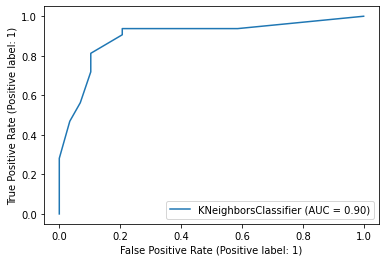

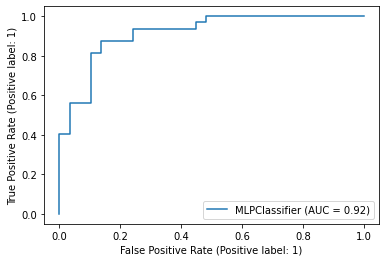

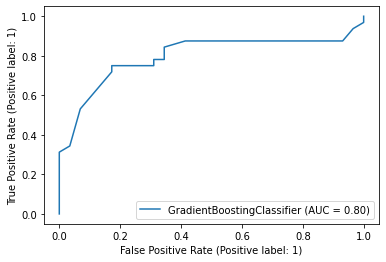

In [175]:
X_train, X_test, y_train, y_test = train_test_split(feature_selected_X_data,Y_data, test_size=0.2,random_state = 42)
pretrain_d = unsupervised_pretrain_b(base_algos,X_train, X_test, y_train, y_test)

X_train, X_test, y_train, y_test = train_test_split(X_under,y_under, test_size=0.2,random_state = 42)
pretrain_dunder = unsupervised_pretrain_b(base_algos,X_train, X_test, y_train, y_test)

X_train, X_test, y_train, y_test = train_test_split(X_over,y_over, test_size=0.2,random_state = 42)
pretrain_dover = unsupervised_pretrain_b(base_algos,X_train, X_test, y_train, y_test)

X_train, X_test, y_train, y_test = train_test_split(X_data2_features,Y_data2, test_size=0.2,random_state = 42)
pretrain_d2 = unsupervised_pretrain_b(base_algos,X_train, X_test, y_train, y_test)

X_train, X_test, y_train, y_test = train_test_split(X_data3_features,Y_data3, test_size=0.2,random_state = 42)
pretrain_d3 = unsupervised_pretrain_b(base_algos,X_train, X_test, y_train, y_test)

In [235]:
pretrain_d3

[[[0.7857142857142857, 0.8032786885245902, 21.59654402732849],
  [0.8387096774193549, 0.8360655737704918, 21.65351915359497],
  [0.8524590163934426, 0.8524590163934426, 22.114567279815674],
  [0.8524590163934426, 0.8524590163934426, 22.243220329284668],
  [0.8333333333333334, 0.8360655737704918, 23.25228476524353],
  [0.7619047619047619, 0.7540983606557377, 23.42058229446411]]]

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
555/555 - 1s - loss: 0.5200 - val_loss: 0.2128 - 1s/epoch - 2ms/step
Epoch 2/200
555/555 - 1s - loss: 0.2681 - val_loss: 0.1294 - 595ms/epoch - 1ms/step
Epoch 3/200
555/555 - 1s - loss: 0.2232 - val_loss: 0.1058 - 667ms/epoch - 1ms/step
Epoch 4/200
555/555 - 1s - loss: 0.2065 - val_loss: 0.0907 - 649ms/epoch - 1ms/step
Epoch 5/200
555/555 - 1s - loss: 0.1920 - val_loss: 0.0844 - 631ms/epoch - 1ms/step
Epoch 6/200
555/555 - 1s - loss: 0.1837 - val_loss: 0.0805 - 631ms/epoch - 1ms/step
Epoch 7/200
555/555 - 1s - loss: 0.1806 - val_loss: 0.0870 - 638ms/epoch - 1ms/step
Epoch 8/200
555/555 - 1s - loss: 0.1701 - val_loss: 0.0784 - 651ms/epoch - 1ms/step
Epoch 9/200
555/555 - 1s - loss: 0.1686 - val_loss: 0.0753 - 635ms/epoch - 1ms/step
Epoch 10/200
555/555 - 1s - loss: 0.1600 - val_loss: 0.0701 - 636ms/epoch - 1

Epoch 96/200
555/555 - 1s - loss: 0.1037 - val_loss: 0.0451 - 636ms/epoch - 1ms/step
Epoch 97/200
555/555 - 1s - loss: 0.1026 - val_loss: 0.0549 - 634ms/epoch - 1ms/step
Epoch 98/200
555/555 - 1s - loss: 0.1039 - val_loss: 0.0454 - 668ms/epoch - 1ms/step
Epoch 99/200
555/555 - 1s - loss: 0.1023 - val_loss: 0.0445 - 638ms/epoch - 1ms/step
Epoch 100/200
555/555 - 1s - loss: 0.1058 - val_loss: 0.0471 - 656ms/epoch - 1ms/step
Epoch 101/200
555/555 - 1s - loss: 0.1026 - val_loss: 0.0441 - 625ms/epoch - 1ms/step
Epoch 102/200
555/555 - 1s - loss: 0.1038 - val_loss: 0.0453 - 632ms/epoch - 1ms/step
Epoch 103/200
555/555 - 1s - loss: 0.1047 - val_loss: 0.0478 - 634ms/epoch - 1ms/step
Epoch 104/200
555/555 - 1s - loss: 0.1036 - val_loss: 0.0469 - 642ms/epoch - 1ms/step
Epoch 105/200
555/555 - 1s - loss: 0.1022 - val_loss: 0.0445 - 630ms/epoch - 1ms/step
Epoch 106/200
555/555 - 1s - loss: 0.1041 - val_loss: 0.0449 - 652ms/epoch - 1ms/step
Epoch 107/200
555/555 - 1s - loss: 0.1025 - val_loss: 0.04

Epoch 192/200
555/555 - 1s - loss: 0.0954 - val_loss: 0.0448 - 643ms/epoch - 1ms/step
Epoch 193/200
555/555 - 1s - loss: 0.0945 - val_loss: 0.0443 - 642ms/epoch - 1ms/step
Epoch 194/200
555/555 - 1s - loss: 0.0961 - val_loss: 0.0414 - 636ms/epoch - 1ms/step
Epoch 195/200
555/555 - 1s - loss: 0.0959 - val_loss: 0.0425 - 631ms/epoch - 1ms/step
Epoch 196/200
555/555 - 1s - loss: 0.0930 - val_loss: 0.0466 - 697ms/epoch - 1ms/step
Epoch 197/200
555/555 - 1s - loss: 0.0987 - val_loss: 0.0444 - 670ms/epoch - 1ms/step
Epoch 198/200
555/555 - 1s - loss: 0.0951 - val_loss: 0.0463 - 654ms/epoch - 1ms/step
Epoch 199/200
555/555 - 1s - loss: 0.0950 - val_loss: 0.0462 - 632ms/epoch - 1ms/step
Epoch 200/200
555/555 - 1s - loss: 0.0989 - val_loss: 0.0525 - 653ms/epoch - 1ms/step


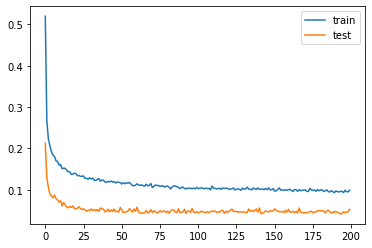

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5567765567765569
0.8774062816616008


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.49549549549549543
0.8865248226950354


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5126050420168068
0.8824721377912867
0.5106382978723405
0.8834853090172239


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5614035087719298
0.8986828774062816


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5149253731343284
0.8682877406281662
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
494/494 - 2s - loss: 0.4945 - val_loss: 0.2118 - 2s/epoch - 3ms/step
Epoch 2/200
494/494 - 1s - loss: 0.2774 - val_loss: 0.1408 - 705ms/epoch - 1ms/step
Epoch 3/200
494/494 - 1s - loss: 0.2492 - val_loss: 0.1290 - 761ms/epoch - 2ms/step
Epoch 4/200
494/494 - 1s - loss: 0.2251 - val_loss: 0.1097 - 700ms/epoch - 1ms/step
Epoch 5/200
494/494 - 1s - loss: 0.2118 - val_loss: 0.0971 - 786ms/epoch - 2ms/step
Epoch 6/200
494/494 - 1s - loss: 0.2018 - val_loss: 0.0891 - 616ms/epoch - 1ms/step
Epoch 7/200
494/494 - 1s - loss: 0.1917 - val_loss: 0.0822 - 616ms/epoch - 1ms/step
Epoch 8/200
494/494 - 1s - loss: 0.1823 - val_loss: 0.0795 - 640ms/epoch - 1ms/step
Epoch 9/200
494/494 - 1s - loss: 0.1766 - val_loss: 0.0751 - 651ms/epoch - 1ms/step
Epoch 10/200
494/494 - 1s - loss: 0.167

494/494 - 1s - loss: 0.1041 - val_loss: 0.0561 - 601ms/epoch - 1ms/step
Epoch 96/200
494/494 - 1s - loss: 0.1053 - val_loss: 0.0514 - 616ms/epoch - 1ms/step
Epoch 97/200
494/494 - 1s - loss: 0.1028 - val_loss: 0.0527 - 601ms/epoch - 1ms/step
Epoch 98/200
494/494 - 1s - loss: 0.1031 - val_loss: 0.0527 - 631ms/epoch - 1ms/step
Epoch 99/200
494/494 - 1s - loss: 0.1043 - val_loss: 0.0541 - 633ms/epoch - 1ms/step
Epoch 100/200
494/494 - 1s - loss: 0.1043 - val_loss: 0.0544 - 605ms/epoch - 1ms/step
Epoch 101/200
494/494 - 1s - loss: 0.1023 - val_loss: 0.0509 - 635ms/epoch - 1ms/step
Epoch 102/200
494/494 - 1s - loss: 0.1003 - val_loss: 0.0502 - 600ms/epoch - 1ms/step
Epoch 103/200
494/494 - 1s - loss: 0.1035 - val_loss: 0.0526 - 632ms/epoch - 1ms/step
Epoch 104/200
494/494 - 1s - loss: 0.1016 - val_loss: 0.0503 - 622ms/epoch - 1ms/step
Epoch 105/200
494/494 - 1s - loss: 0.1031 - val_loss: 0.0499 - 595ms/epoch - 1ms/step
Epoch 106/200
494/494 - 1s - loss: 0.1063 - val_loss: 0.0626 - 617ms/epo

Epoch 191/200
494/494 - 1s - loss: 0.0871 - val_loss: 0.0473 - 633ms/epoch - 1ms/step
Epoch 192/200
494/494 - 1s - loss: 0.0887 - val_loss: 0.0516 - 617ms/epoch - 1ms/step
Epoch 193/200
494/494 - 1s - loss: 0.0851 - val_loss: 0.0475 - 767ms/epoch - 2ms/step
Epoch 194/200
494/494 - 1s - loss: 0.0842 - val_loss: 0.0505 - 721ms/epoch - 1ms/step
Epoch 195/200
494/494 - 1s - loss: 0.0836 - val_loss: 0.0461 - 713ms/epoch - 1ms/step
Epoch 196/200
494/494 - 1s - loss: 0.0875 - val_loss: 0.0474 - 730ms/epoch - 1ms/step
Epoch 197/200
494/494 - 1s - loss: 0.0826 - val_loss: 0.0517 - 723ms/epoch - 1ms/step
Epoch 198/200
494/494 - 1s - loss: 0.0843 - val_loss: 0.0466 - 716ms/epoch - 1ms/step
Epoch 199/200
494/494 - 1s - loss: 0.0836 - val_loss: 0.0478 - 616ms/epoch - 1ms/step
Epoch 200/200
494/494 - 1s - loss: 0.0820 - val_loss: 0.0467 - 622ms/epoch - 1ms/step


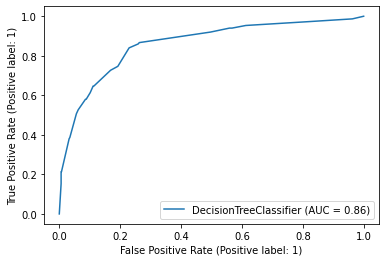

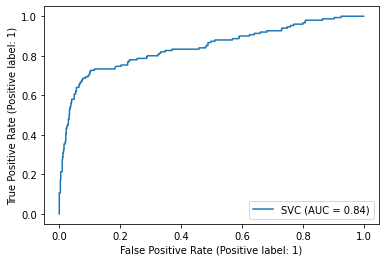

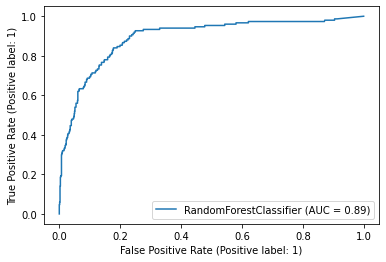

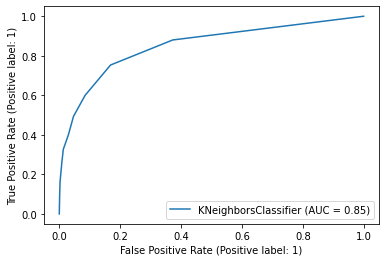

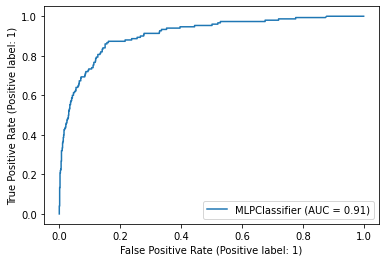

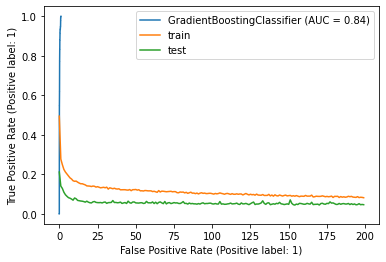

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.45982142857142866
0.8773441459706032


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5319148936170213
0.8884946781550938


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5245901639344263
0.8824125696908262
0.5469387755102042
0.8874809934110491


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5692007797270955
0.8879878357830715


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5437616387337056
0.8758236188545362
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
309/309 - 1s - loss: 0.5875 - val_loss: 0.2559 - 1s/epoch - 4ms/step
Epoch 2/200
309/309 - 1s - loss: 0.3207 - val_loss: 0.1680 - 531ms/epoch - 2ms/step
Epoch 3/200
309/309 - 1s - loss: 0.2784 - val_loss: 0.1383 - 538ms/epoch - 2ms/step
Epoch 4/200
309/309 - 1s - loss: 0.2569 - val_loss: 0.1276 - 563ms/epoch - 2ms/step
Epoch 5/200
309/309 - 1s - loss: 0.2398 - val_loss: 0.1151 - 538ms/epoch - 2ms/step
Epoch 6/200
309/309 - 1s - loss: 0.2336 - val_loss: 0.1098 - 537ms/epoch - 2ms/step
Epoch 7/200
309/309 - 1s - loss: 0.2187 - val_loss: 0.0963 - 549ms/epoch - 2ms/step
Epoch 8/200
309/309 - 1s - loss: 0.2097 - val_loss: 0.0898 - 585ms/epoch - 2ms/step
Epoch 9/200
309/309 - 1s - loss: 0.2038 - val_loss: 0.0856 - 544ms/epoch - 2ms/step
Epoch 10/200
309/309 - 1s - loss: 0.197

309/309 - 1s - loss: 0.1093 - val_loss: 0.0513 - 568ms/epoch - 2ms/step
Epoch 96/200
309/309 - 1s - loss: 0.1097 - val_loss: 0.0494 - 570ms/epoch - 2ms/step
Epoch 97/200
309/309 - 1s - loss: 0.1092 - val_loss: 0.0477 - 565ms/epoch - 2ms/step
Epoch 98/200
309/309 - 1s - loss: 0.1150 - val_loss: 0.0469 - 552ms/epoch - 2ms/step
Epoch 99/200
309/309 - 1s - loss: 0.1132 - val_loss: 0.0493 - 534ms/epoch - 2ms/step
Epoch 100/200
309/309 - 1s - loss: 0.1104 - val_loss: 0.0518 - 538ms/epoch - 2ms/step
Epoch 101/200
309/309 - 1s - loss: 0.1108 - val_loss: 0.0481 - 563ms/epoch - 2ms/step
Epoch 102/200
309/309 - 1s - loss: 0.1108 - val_loss: 0.0501 - 552ms/epoch - 2ms/step
Epoch 103/200
309/309 - 1s - loss: 0.1137 - val_loss: 0.0462 - 535ms/epoch - 2ms/step
Epoch 104/200
309/309 - 1s - loss: 0.1144 - val_loss: 0.0528 - 564ms/epoch - 2ms/step
Epoch 105/200
309/309 - 1s - loss: 0.1148 - val_loss: 0.0473 - 583ms/epoch - 2ms/step
Epoch 106/200
309/309 - 1s - loss: 0.1109 - val_loss: 0.0454 - 539ms/epo

Epoch 191/200
309/309 - 1s - loss: 0.0948 - val_loss: 0.0455 - 566ms/epoch - 2ms/step
Epoch 192/200
309/309 - 1s - loss: 0.0981 - val_loss: 0.0439 - 536ms/epoch - 2ms/step
Epoch 193/200
309/309 - 1s - loss: 0.0971 - val_loss: 0.0490 - 569ms/epoch - 2ms/step
Epoch 194/200
309/309 - 1s - loss: 0.0965 - val_loss: 0.0524 - 601ms/epoch - 2ms/step
Epoch 195/200
309/309 - 1s - loss: 0.0978 - val_loss: 0.0444 - 528ms/epoch - 2ms/step
Epoch 196/200
309/309 - 1s - loss: 0.0985 - val_loss: 0.0496 - 553ms/epoch - 2ms/step
Epoch 197/200
309/309 - 1s - loss: 0.0939 - val_loss: 0.0469 - 521ms/epoch - 2ms/step
Epoch 198/200
309/309 - 1s - loss: 0.1014 - val_loss: 0.0538 - 581ms/epoch - 2ms/step
Epoch 199/200
309/309 - 1s - loss: 0.0982 - val_loss: 0.0472 - 537ms/epoch - 2ms/step
Epoch 200/200
309/309 - 1s - loss: 0.1001 - val_loss: 0.0430 - 564ms/epoch - 2ms/step


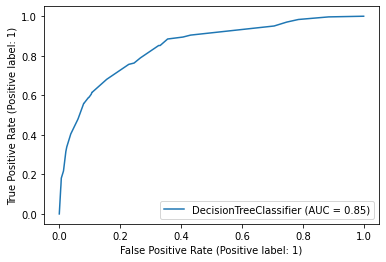

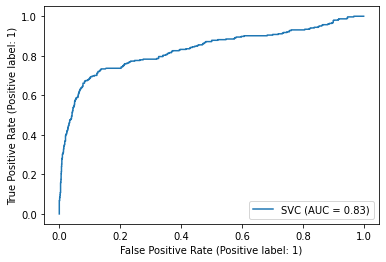

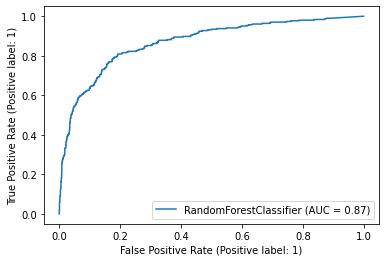

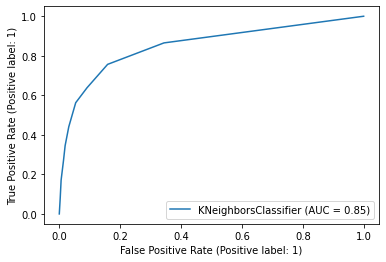

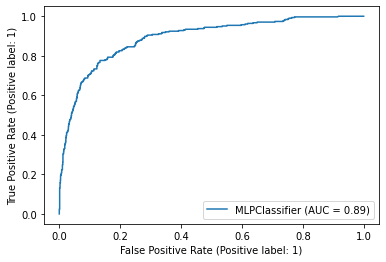

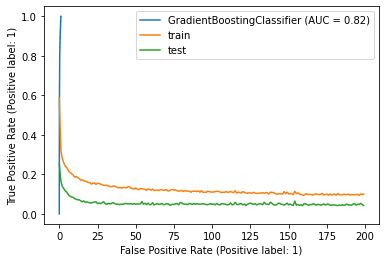

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5456053067993365
0.8888888888888888


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5400696864111498
0.8929440389294404


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5716573258606886
0.8915247364152473


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5442622950819672
0.8872668288726683


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5977011494252874
0.8935523114355232


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5499254843517138
0.8775344687753447
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
62/62 - 1s - loss: 1.0777 - val_loss: 0.6643 - 1s/epoch - 18ms/step
Epoch 2/200
62/62 - 0s - loss: 0.7274 - val_loss: 0.5133 - 428ms/epoch - 7ms/step
Epoch 3/200
62/62 - 0s - loss: 0.6083 - val_loss: 0.4024 - 404ms/epoch - 7ms/step
Epoch 4/200
62/62 - 0s - loss: 0.5463 - val_loss: 0.3266 - 405ms/epoch - 7ms/step
Epoch 5/200
62/62 - 0s - loss: 0.5070 - val_loss: 0.2839 - 443ms/epoch - 7ms/step
Epoch 6/200
62/62 - 0s - loss: 0.4777 - val_loss: 0.2479 - 424ms/epoch - 7ms/step
Epoch 7/200
62/62 - 0s - loss: 0.4502 - val_loss: 0.2212 - 452ms/epoch - 7ms/step
Epoch 8/200
62/62 - 0s - loss: 0.4445 - val_loss: 0.2045 - 449ms/epoch - 7ms/step
Epoch 9/200
62/62 - 1s - loss: 0.4154 - val_loss: 0.1887 - 517ms/epoch - 8ms/step
Epoch 10/200
62/62 - 0s - loss: 0.4052 - val_loss: 0.175

Epoch 98/200
62/62 - 0s - loss: 0.1557 - val_loss: 0.0691 - 438ms/epoch - 7ms/step
Epoch 99/200
62/62 - 0s - loss: 0.1652 - val_loss: 0.0847 - 364ms/epoch - 6ms/step
Epoch 100/200
62/62 - 0s - loss: 0.1761 - val_loss: 0.0721 - 432ms/epoch - 7ms/step
Epoch 101/200
62/62 - 0s - loss: 0.1642 - val_loss: 0.0780 - 448ms/epoch - 7ms/step
Epoch 102/200
62/62 - 0s - loss: 0.1722 - val_loss: 0.0775 - 405ms/epoch - 7ms/step
Epoch 103/200
62/62 - 0s - loss: 0.1848 - val_loss: 0.0701 - 418ms/epoch - 7ms/step
Epoch 104/200
62/62 - 0s - loss: 0.1613 - val_loss: 0.0676 - 400ms/epoch - 6ms/step
Epoch 105/200
62/62 - 0s - loss: 0.1665 - val_loss: 0.0806 - 427ms/epoch - 7ms/step
Epoch 106/200
62/62 - 0s - loss: 0.1749 - val_loss: 0.0740 - 462ms/epoch - 7ms/step
Epoch 107/200
62/62 - 0s - loss: 0.1678 - val_loss: 0.0767 - 374ms/epoch - 6ms/step
Epoch 108/200
62/62 - 0s - loss: 0.1623 - val_loss: 0.0752 - 407ms/epoch - 7ms/step
Epoch 109/200
62/62 - 0s - loss: 0.1558 - val_loss: 0.0697 - 448ms/epoch - 7ms

Epoch 196/200
62/62 - 0s - loss: 0.1324 - val_loss: 0.0640 - 415ms/epoch - 7ms/step
Epoch 197/200
62/62 - 0s - loss: 0.1405 - val_loss: 0.0642 - 449ms/epoch - 7ms/step
Epoch 198/200
62/62 - 0s - loss: 0.1440 - val_loss: 0.0670 - 419ms/epoch - 7ms/step
Epoch 199/200
62/62 - 0s - loss: 0.1329 - val_loss: 0.0636 - 443ms/epoch - 7ms/step
Epoch 200/200
62/62 - 0s - loss: 0.1444 - val_loss: 0.0669 - 432ms/epoch - 7ms/step


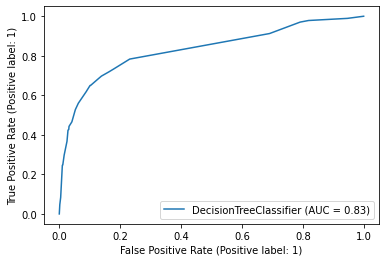

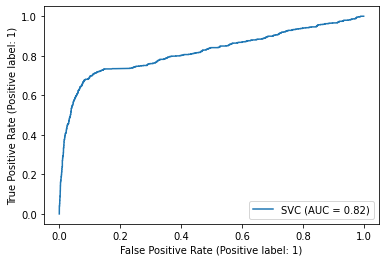

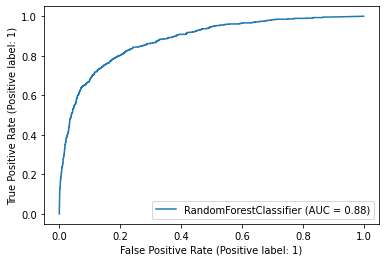

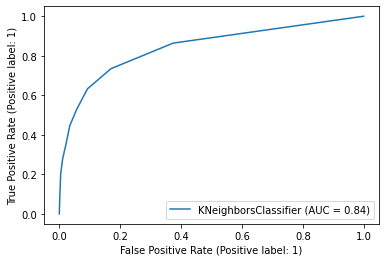

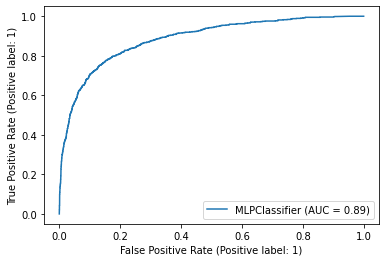

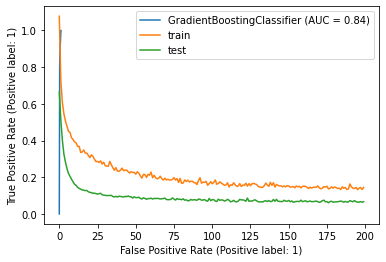

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.4718196457326892
0.8522189682360892


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.479836651352731
0.885221896823609


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.4931506849315068
0.8749718405046182


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5301743406347788
0.8816174814147331


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5888795282224094
0.8900653300292859


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5
0.8634827663888263
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
31/31 - 1s - loss: 1.6721 - val_loss: 0.8329 - 1s/epoch - 36ms/step
Epoch 2/200
31/31 - 0s - loss: 1.1746 - val_loss: 0.7329 - 429ms/epoch - 14ms/step
Epoch 3/200
31/31 - 0s - loss: 0.9795 - val_loss: 0.6404 - 372ms/epoch - 12ms/step
Epoch 4/200
31/31 - 0s - loss: 0.8848 - val_loss: 0.5597 - 447ms/epoch - 14ms/step
Epoch 5/200
31/31 - 0s - loss: 0.7917 - val_loss: 0.4770 - 417ms/epoch - 13ms/step
Epoch 6/200
31/31 - 0s - loss: 0.7176 - val_loss: 0.4079 - 400ms/epoch - 13ms/step
Epoch 7/200
31/31 - 0s - loss: 0.6841 - val_loss: 0.3645 - 352ms/epoch - 11ms/step
Epoch 8/200
31/31 - 0s - loss: 0.6303 - val_loss: 0.3287 - 465ms/epoch - 15ms/step
Epoch 9/200
31/31 - 0s - loss: 0.5973 - val_loss: 0.3002 - 451ms/epoch - 15ms/step
Epoch 10/200
31/31 - 0s - loss: 0.5676 - val_loss: 0.2850 - 335

Epoch 97/200
31/31 - 0s - loss: 0.2001 - val_loss: 0.1387 - 486ms/epoch - 16ms/step
Epoch 98/200
31/31 - 0s - loss: 0.2091 - val_loss: 0.1278 - 363ms/epoch - 12ms/step
Epoch 99/200
31/31 - 0s - loss: 0.2032 - val_loss: 0.1347 - 385ms/epoch - 12ms/step
Epoch 100/200
31/31 - 0s - loss: 0.1933 - val_loss: 0.1282 - 431ms/epoch - 14ms/step
Epoch 101/200
31/31 - 0s - loss: 0.1980 - val_loss: 0.1268 - 439ms/epoch - 14ms/step
Epoch 102/200
31/31 - 0s - loss: 0.2106 - val_loss: 0.1300 - 362ms/epoch - 12ms/step
Epoch 103/200
31/31 - 0s - loss: 0.2154 - val_loss: 0.1225 - 407ms/epoch - 13ms/step
Epoch 104/200
31/31 - 0s - loss: 0.2093 - val_loss: 0.1246 - 411ms/epoch - 13ms/step
Epoch 105/200
31/31 - 0s - loss: 0.2017 - val_loss: 0.1262 - 422ms/epoch - 14ms/step
Epoch 106/200
31/31 - 0s - loss: 0.2012 - val_loss: 0.1335 - 421ms/epoch - 14ms/step
Epoch 107/200
31/31 - 0s - loss: 0.2066 - val_loss: 0.1269 - 397ms/epoch - 13ms/step
Epoch 108/200
31/31 - 0s - loss: 0.1819 - val_loss: 0.1238 - 421ms/e

Epoch 194/200
31/31 - 0s - loss: 0.1590 - val_loss: 0.1173 - 383ms/epoch - 12ms/step
Epoch 195/200
31/31 - 0s - loss: 0.1829 - val_loss: 0.1174 - 401ms/epoch - 13ms/step
Epoch 196/200
31/31 - 0s - loss: 0.1798 - val_loss: 0.1178 - 385ms/epoch - 12ms/step
Epoch 197/200
31/31 - 0s - loss: 0.1787 - val_loss: 0.1185 - 418ms/epoch - 13ms/step
Epoch 198/200
31/31 - 0s - loss: 0.1675 - val_loss: 0.1133 - 391ms/epoch - 13ms/step
Epoch 199/200
31/31 - 0s - loss: 0.1721 - val_loss: 0.1152 - 394ms/epoch - 13ms/step
Epoch 200/200
31/31 - 0s - loss: 0.1928 - val_loss: 0.1106 - 432ms/epoch - 14ms/step


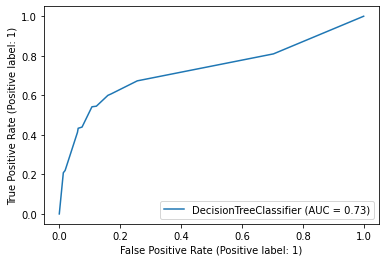

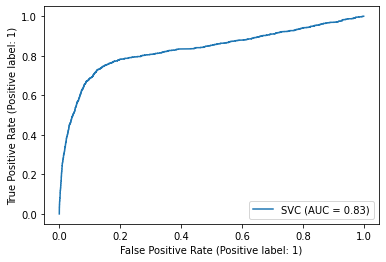

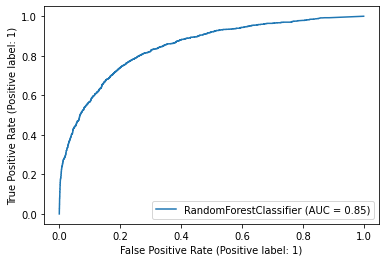

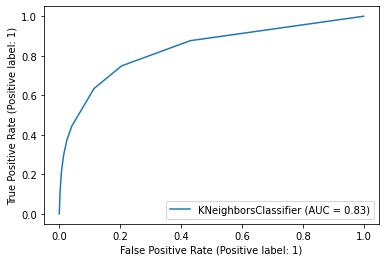

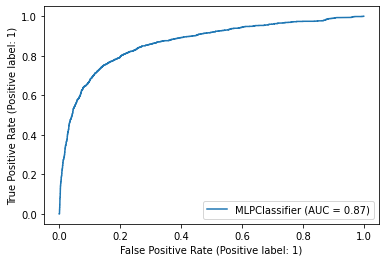

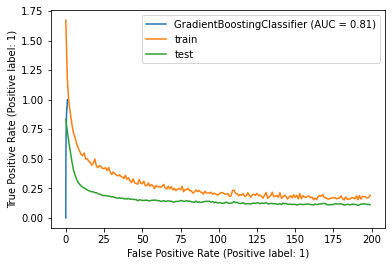

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.43755238893545684
0.8567922313520435


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.4443349753694581
0.8796286415537296


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.48173913043478256
0.8727990609326646


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.4697314519799726
0.8756802902571764


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5578059071729957
0.8881656173300608


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.4528018051899211
0.8447337530679757


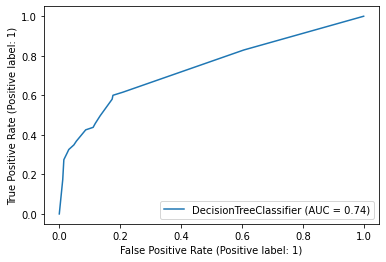

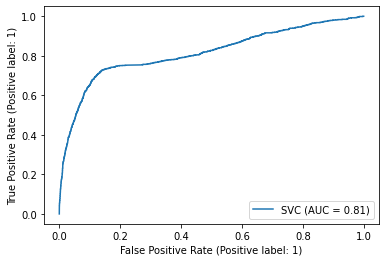

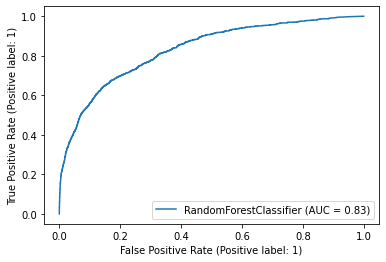

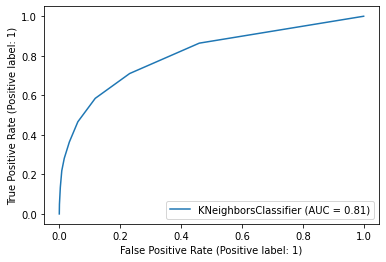

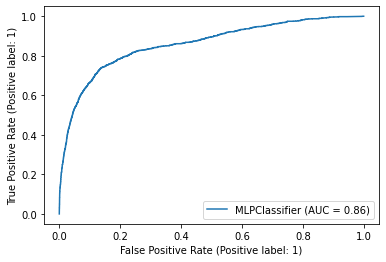

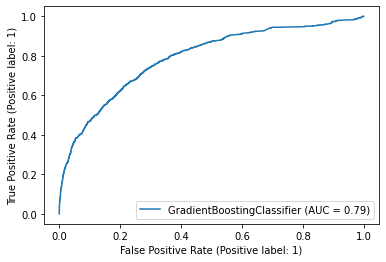

In [114]:
X_train, X_test, y_train, y_test = train_test_split(feature_selected_X_data,Y_data, test_size=0.2,random_state = 42)
pretrain_d1 = unsupervised_pretrain(base_algos,X_train, X_test, y_train, y_test)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
465/465 - 1s - loss: 0.4719 - val_loss: 0.1474 - 1s/epoch - 3ms/step
Epoch 2/200
465/465 - 0s - loss: 0.2789 - val_loss: 0.1169 - 484ms/epoch - 1ms/step
Epoch 3/200
465/465 - 1s - loss: 0.2468 - val_loss: 0.0938 - 538ms/epoch - 1ms/step
Epoch 4/200
465/465 - 1s - loss: 0.2201 - val_loss: 0.0856 - 563ms/epoch - 1ms/step
Epoch 5/200
465/465 - 1s - loss: 0.2039 - val_loss: 0.0819 - 536ms/epoch - 1ms/step
Epoch 6/200
465/465 - 1s - loss: 0.2035 - val_loss: 0.0768 - 549ms/epoch - 1ms/step
Epoch 7/200
465/465 - 1s - loss: 0.1847 - val_loss: 0.0760 - 547ms/epoch - 1ms/step
Epoch 8/200
465/465 - 1s - loss: 0.1835 - val_loss: 0.0776 - 554ms/epoch - 1ms/step
Epoch 9/200
465/465 - 1s - loss: 0.1726 - val_loss: 0.0700 - 549ms/epoch - 1ms/step
Epoch 10/200
465/465 - 1s - loss: 0.1721 - val_loss: 0.0655 - 545ms/epoch - 1

Epoch 96/200
465/465 - 1s - loss: 0.0916 - val_loss: 0.0317 - 549ms/epoch - 1ms/step
Epoch 97/200
465/465 - 1s - loss: 0.0976 - val_loss: 0.0365 - 530ms/epoch - 1ms/step
Epoch 98/200
465/465 - 1s - loss: 0.0945 - val_loss: 0.0444 - 539ms/epoch - 1ms/step
Epoch 99/200
465/465 - 1s - loss: 0.0913 - val_loss: 0.0379 - 517ms/epoch - 1ms/step
Epoch 100/200
465/465 - 1s - loss: 0.0970 - val_loss: 0.0365 - 553ms/epoch - 1ms/step
Epoch 101/200
465/465 - 1s - loss: 0.0940 - val_loss: 0.0385 - 530ms/epoch - 1ms/step
Epoch 102/200
465/465 - 1s - loss: 0.0923 - val_loss: 0.0368 - 536ms/epoch - 1ms/step
Epoch 103/200
465/465 - 1s - loss: 0.0907 - val_loss: 0.0325 - 528ms/epoch - 1ms/step
Epoch 104/200
465/465 - 1s - loss: 0.0945 - val_loss: 0.0483 - 538ms/epoch - 1ms/step
Epoch 105/200
465/465 - 1s - loss: 0.0890 - val_loss: 0.0361 - 532ms/epoch - 1ms/step
Epoch 106/200
465/465 - 1s - loss: 0.0922 - val_loss: 0.0360 - 553ms/epoch - 1ms/step
Epoch 107/200
465/465 - 1s - loss: 0.0923 - val_loss: 0.03

Epoch 192/200
465/465 - 1s - loss: 0.0797 - val_loss: 0.0395 - 532ms/epoch - 1ms/step
Epoch 193/200
465/465 - 1s - loss: 0.0829 - val_loss: 0.0430 - 522ms/epoch - 1ms/step
Epoch 194/200
465/465 - 1s - loss: 0.0805 - val_loss: 0.0409 - 532ms/epoch - 1ms/step
Epoch 195/200
465/465 - 1s - loss: 0.0772 - val_loss: 0.0443 - 547ms/epoch - 1ms/step
Epoch 196/200
465/465 - 1s - loss: 0.0767 - val_loss: 0.0394 - 521ms/epoch - 1ms/step
Epoch 197/200
465/465 - 1s - loss: 0.0756 - val_loss: 0.0412 - 550ms/epoch - 1ms/step
Epoch 198/200
465/465 - 1s - loss: 0.0776 - val_loss: 0.0404 - 531ms/epoch - 1ms/step
Epoch 199/200
465/465 - 1s - loss: 0.0749 - val_loss: 0.0395 - 522ms/epoch - 1ms/step
Epoch 200/200
465/465 - 1s - loss: 0.0780 - val_loss: 0.0351 - 551ms/epoch - 1ms/step


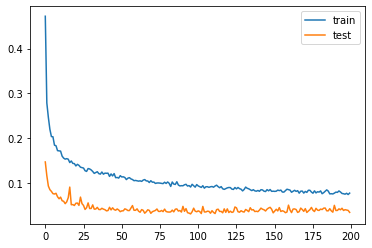

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6564885496183207
0.8910411622276029


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6363636363636364
0.9031476997578692


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7368421052631579
0.9213075060532687
0.672566371681416
0.910411622276029


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7984496124031008
0.937046004842615


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.714828897338403
0.9092009685230025
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
413/413 - 1s - loss: 0.5078 - val_loss: 0.1663 - 1s/epoch - 3ms/step
Epoch 2/200
413/413 - 0s - loss: 0.2944 - val_loss: 0.1038 - 379ms/epoch - 919us/step
Epoch 3/200
413/413 - 0s - loss: 0.2564 - val_loss: 0.0884 - 473ms/epoch - 1ms/step
Epoch 4/200
413/413 - 0s - loss: 0.2344 - val_loss: 0.0801 - 447ms/epoch - 1ms/step
Epoch 5/200
413/413 - 0s - loss: 0.2179 - val_loss: 0.0783 - 470ms/epoch - 1ms/step
Epoch 6/200
413/413 - 0s - loss: 0.2058 - val_loss: 0.0730 - 466ms/epoch - 1ms/step
Epoch 7/200
413/413 - 0s - loss: 0.1950 - val_loss: 0.0697 - 466ms/epoch - 1ms/step
Epoch 8/200
413/413 - 0s - loss: 0.1896 - val_loss: 0.0704 - 470ms/epoch - 1ms/step
Epoch 9/200
413/413 - 0s - loss: 0.1824 - val_loss: 0.0657 - 463ms/epoch - 1ms/step
Epoch 10/200
413/413 - 1s - loss: 0.17

413/413 - 0s - loss: 0.0993 - val_loss: 0.0376 - 466ms/epoch - 1ms/step
Epoch 96/200
413/413 - 0s - loss: 0.0972 - val_loss: 0.0448 - 485ms/epoch - 1ms/step
Epoch 97/200
413/413 - 0s - loss: 0.0940 - val_loss: 0.0386 - 488ms/epoch - 1ms/step
Epoch 98/200
413/413 - 0s - loss: 0.0988 - val_loss: 0.0390 - 464ms/epoch - 1ms/step
Epoch 99/200
413/413 - 0s - loss: 0.0982 - val_loss: 0.0449 - 484ms/epoch - 1ms/step
Epoch 100/200
413/413 - 0s - loss: 0.0985 - val_loss: 0.0431 - 496ms/epoch - 1ms/step
Epoch 101/200
413/413 - 0s - loss: 0.0949 - val_loss: 0.0442 - 469ms/epoch - 1ms/step
Epoch 102/200
413/413 - 0s - loss: 0.0936 - val_loss: 0.0422 - 469ms/epoch - 1ms/step
Epoch 103/200
413/413 - 0s - loss: 0.0975 - val_loss: 0.0436 - 468ms/epoch - 1ms/step
Epoch 104/200
413/413 - 0s - loss: 0.0944 - val_loss: 0.0414 - 470ms/epoch - 1ms/step
Epoch 105/200
413/413 - 0s - loss: 0.0916 - val_loss: 0.0431 - 479ms/epoch - 1ms/step
Epoch 106/200
413/413 - 0s - loss: 0.0964 - val_loss: 0.0376 - 466ms/epo

Epoch 191/200
413/413 - 1s - loss: 0.0826 - val_loss: 0.0317 - 506ms/epoch - 1ms/step
Epoch 192/200
413/413 - 1s - loss: 0.0858 - val_loss: 0.0339 - 583ms/epoch - 1ms/step
Epoch 193/200
413/413 - 0s - loss: 0.0838 - val_loss: 0.0356 - 481ms/epoch - 1ms/step
Epoch 194/200
413/413 - 0s - loss: 0.0845 - val_loss: 0.0384 - 469ms/epoch - 1ms/step
Epoch 195/200
413/413 - 0s - loss: 0.0900 - val_loss: 0.0375 - 469ms/epoch - 1ms/step
Epoch 196/200
413/413 - 0s - loss: 0.0834 - val_loss: 0.0374 - 467ms/epoch - 1ms/step
Epoch 197/200
413/413 - 0s - loss: 0.0842 - val_loss: 0.0352 - 450ms/epoch - 1ms/step
Epoch 198/200
413/413 - 0s - loss: 0.0812 - val_loss: 0.0394 - 468ms/epoch - 1ms/step
Epoch 199/200
413/413 - 0s - loss: 0.0846 - val_loss: 0.0398 - 468ms/epoch - 1ms/step
Epoch 200/200
413/413 - 0s - loss: 0.0828 - val_loss: 0.0344 - 467ms/epoch - 1ms/step


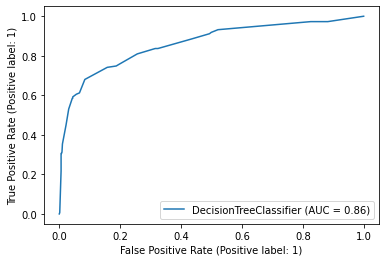

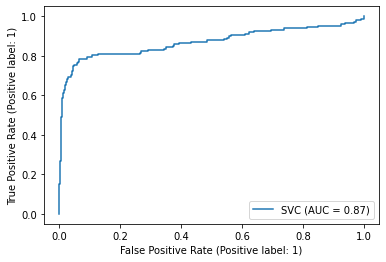

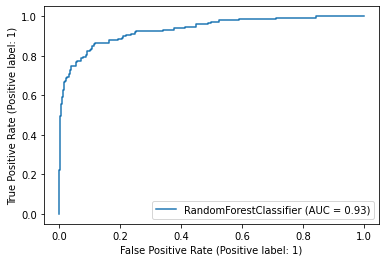

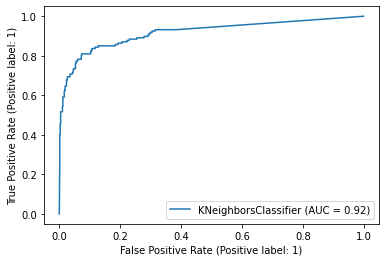

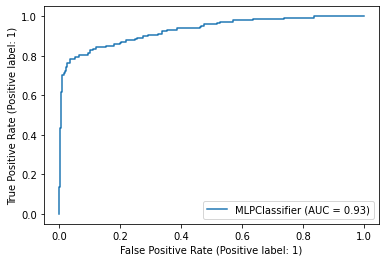

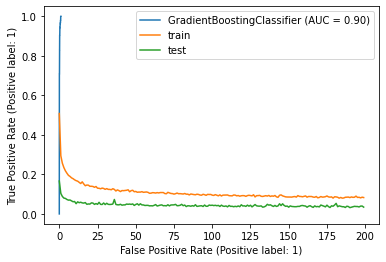

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6414342629482072
0.8910411622276029


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6983471074380165
0.9116222760290557


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.735408560311284
0.9176755447941889
0.6610526315789474
0.902542372881356


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7546468401486989
0.9200968523002422


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7240143369175627
0.9067796610169492
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
259/259 - 1s - loss: 0.5914 - val_loss: 0.2771 - 1s/epoch - 4ms/step
Epoch 2/200
259/259 - 0s - loss: 0.3750 - val_loss: 0.1884 - 438ms/epoch - 2ms/step
Epoch 3/200
259/259 - 0s - loss: 0.3235 - val_loss: 0.1469 - 485ms/epoch - 2ms/step
Epoch 4/200
259/259 - 0s - loss: 0.2922 - val_loss: 0.1276 - 431ms/epoch - 2ms/step
Epoch 5/200
259/259 - 0s - loss: 0.2719 - val_loss: 0.1140 - 452ms/epoch - 2ms/step
Epoch 6/200
259/259 - 0s - loss: 0.2630 - val_loss: 0.1062 - 455ms/epoch - 2ms/step
Epoch 7/200
259/259 - 0s - loss: 0.2540 - val_loss: 0.1004 - 495ms/epoch - 2ms/step
Epoch 8/200
259/259 - 0s - loss: 0.2463 - val_loss: 0.0950 - 437ms/epoch - 2ms/step
Epoch 9/200
259/259 - 0s - loss: 0.2344 - val_loss: 0.1043 - 434ms/epoch - 2ms/step
Epoch 10/200
259/259 - 0s - loss: 0.228

259/259 - 0s - loss: 0.1192 - val_loss: 0.0490 - 438ms/epoch - 2ms/step
Epoch 96/200
259/259 - 0s - loss: 0.1278 - val_loss: 0.0506 - 455ms/epoch - 2ms/step
Epoch 97/200
259/259 - 0s - loss: 0.1334 - val_loss: 0.0502 - 448ms/epoch - 2ms/step
Epoch 98/200
259/259 - 0s - loss: 0.1253 - val_loss: 0.0506 - 444ms/epoch - 2ms/step
Epoch 99/200
259/259 - 0s - loss: 0.1214 - val_loss: 0.0490 - 460ms/epoch - 2ms/step
Epoch 100/200
259/259 - 0s - loss: 0.1249 - val_loss: 0.0553 - 447ms/epoch - 2ms/step
Epoch 101/200
259/259 - 0s - loss: 0.1263 - val_loss: 0.0588 - 435ms/epoch - 2ms/step
Epoch 102/200
259/259 - 0s - loss: 0.1236 - val_loss: 0.0525 - 485ms/epoch - 2ms/step
Epoch 103/200
259/259 - 1s - loss: 0.1284 - val_loss: 0.0552 - 500ms/epoch - 2ms/step
Epoch 104/200
259/259 - 0s - loss: 0.1237 - val_loss: 0.0558 - 436ms/epoch - 2ms/step
Epoch 105/200
259/259 - 0s - loss: 0.1241 - val_loss: 0.0514 - 440ms/epoch - 2ms/step
Epoch 106/200
259/259 - 0s - loss: 0.1309 - val_loss: 0.0536 - 462ms/epo

Epoch 191/200
259/259 - 0s - loss: 0.1110 - val_loss: 0.0452 - 465ms/epoch - 2ms/step
Epoch 192/200
259/259 - 0s - loss: 0.1064 - val_loss: 0.0475 - 467ms/epoch - 2ms/step
Epoch 193/200
259/259 - 0s - loss: 0.1089 - val_loss: 0.0452 - 466ms/epoch - 2ms/step
Epoch 194/200
259/259 - 0s - loss: 0.1119 - val_loss: 0.0532 - 451ms/epoch - 2ms/step
Epoch 195/200
259/259 - 0s - loss: 0.1068 - val_loss: 0.0442 - 439ms/epoch - 2ms/step
Epoch 196/200
259/259 - 0s - loss: 0.1050 - val_loss: 0.0472 - 464ms/epoch - 2ms/step
Epoch 197/200
259/259 - 0s - loss: 0.1089 - val_loss: 0.0444 - 451ms/epoch - 2ms/step
Epoch 198/200
259/259 - 0s - loss: 0.1030 - val_loss: 0.0448 - 485ms/epoch - 2ms/step
Epoch 199/200
259/259 - 0s - loss: 0.1118 - val_loss: 0.0449 - 443ms/epoch - 2ms/step
Epoch 200/200
259/259 - 0s - loss: 0.1073 - val_loss: 0.0461 - 444ms/epoch - 2ms/step


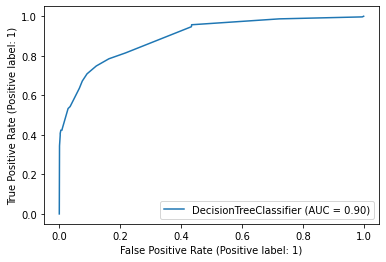

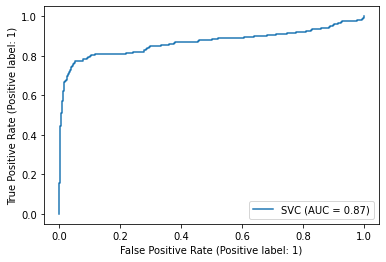

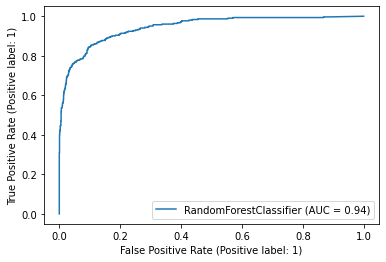

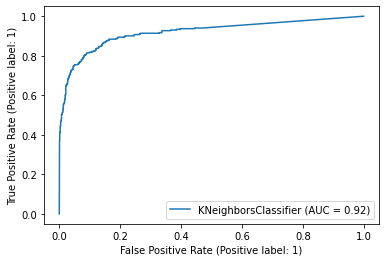

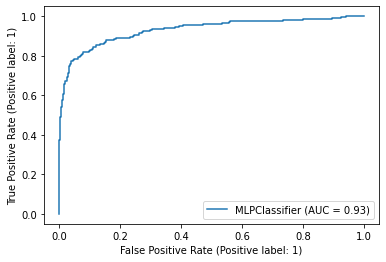

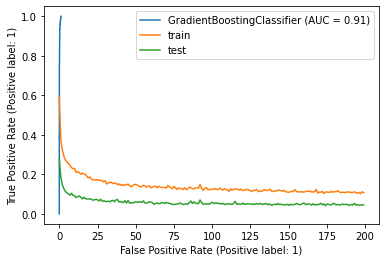

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6326359832635983
0.8937046004842615


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7024859663191659
0.9101694915254237


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7395596051632498
0.9169491525423729
0.6888708367181153
0.9072639225181598


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7665920954511559
0.9242130750605327


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7318840579710145
0.910411622276029
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
52/52 - 1s - loss: 1.4701 - val_loss: 0.6837 - 1s/epoch - 23ms/step
Epoch 2/200
52/52 - 0s - loss: 0.9417 - val_loss: 0.5815 - 336ms/epoch - 6ms/step
Epoch 3/200
52/52 - 0s - loss: 0.7965 - val_loss: 0.4758 - 418ms/epoch - 8ms/step
Epoch 4/200
52/52 - 0s - loss: 0.6997 - val_loss: 0.4115 - 328ms/epoch - 6ms/step
Epoch 5/200
52/52 - 0s - loss: 0.6812 - val_loss: 0.3466 - 354ms/epoch - 7ms/step
Epoch 6/200
52/52 - 0s - loss: 0.6208 - val_loss: 0.3072 - 370ms/epoch - 7ms/step
Epoch 7/200
52/52 - 0s - loss: 0.5863 - val_loss: 0.2981 - 398ms/epoch - 8ms/step
Epoch 8/200
52/52 - 0s - loss: 0.5588 - val_loss: 0.2798 - 294ms/epoch - 6ms/step
Epoch 9/200
52/52 - 0s - loss: 0.5119 - val_loss: 0.2631 - 402ms/epoch - 8ms/step
Epoch 10/200
52/52 - 0s - loss: 0.5206 - val_loss: 0.2593

Epoch 98/200
52/52 - 0s - loss: 0.2113 - val_loss: 0.1093 - 349ms/epoch - 7ms/step
Epoch 99/200
52/52 - 0s - loss: 0.2283 - val_loss: 0.1272 - 351ms/epoch - 7ms/step
Epoch 100/200
52/52 - 0s - loss: 0.2122 - val_loss: 0.1102 - 354ms/epoch - 7ms/step
Epoch 101/200
52/52 - 0s - loss: 0.2005 - val_loss: 0.1122 - 364ms/epoch - 7ms/step
Epoch 102/200
52/52 - 0s - loss: 0.2190 - val_loss: 0.1151 - 336ms/epoch - 6ms/step
Epoch 103/200
52/52 - 0s - loss: 0.1816 - val_loss: 0.1064 - 397ms/epoch - 8ms/step
Epoch 104/200
52/52 - 0s - loss: 0.2039 - val_loss: 0.1133 - 369ms/epoch - 7ms/step
Epoch 105/200
52/52 - 0s - loss: 0.2031 - val_loss: 0.1168 - 332ms/epoch - 6ms/step
Epoch 106/200
52/52 - 0s - loss: 0.2018 - val_loss: 0.1276 - 369ms/epoch - 7ms/step
Epoch 107/200
52/52 - 0s - loss: 0.1852 - val_loss: 0.1119 - 328ms/epoch - 6ms/step
Epoch 108/200
52/52 - 0s - loss: 0.1944 - val_loss: 0.1218 - 388ms/epoch - 7ms/step
Epoch 109/200
52/52 - 0s - loss: 0.1862 - val_loss: 0.1217 - 351ms/epoch - 7ms

Epoch 196/200
52/52 - 0s - loss: 0.1710 - val_loss: 0.0974 - 356ms/epoch - 7ms/step
Epoch 197/200
52/52 - 0s - loss: 0.1892 - val_loss: 0.0912 - 384ms/epoch - 7ms/step
Epoch 198/200
52/52 - 0s - loss: 0.1690 - val_loss: 0.1010 - 316ms/epoch - 6ms/step
Epoch 199/200
52/52 - 0s - loss: 0.1621 - val_loss: 0.0995 - 348ms/epoch - 7ms/step
Epoch 200/200
52/52 - 0s - loss: 0.1860 - val_loss: 0.0933 - 355ms/epoch - 7ms/step


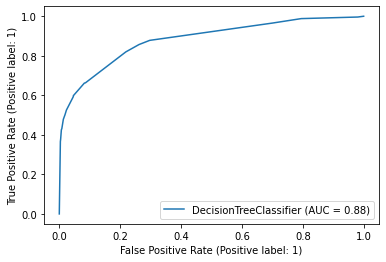

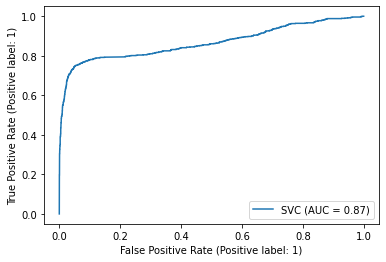

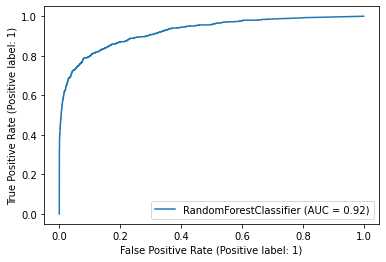

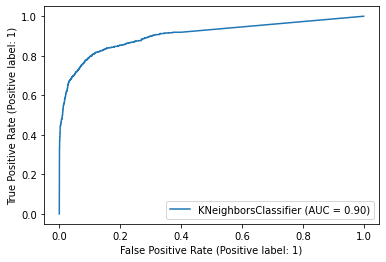

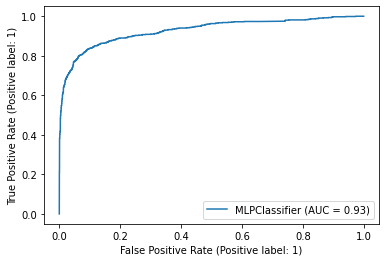

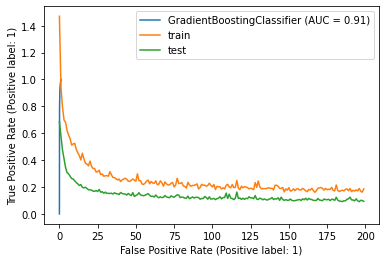

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6574563185696871
0.8866020984665053


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.644944896981313
0.9003228410008071


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6786840919333033
0.9040893193435566
0.6009852216748768
0.8910411622276029


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7310704960835509
0.9168684422921711


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6806899453092133
0.8979015334947539
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
26/26 - 1s - loss: 1.5883 - val_loss: 0.7642 - 1s/epoch - 44ms/step
Epoch 2/200
26/26 - 0s - loss: 1.2050 - val_loss: 0.6965 - 324ms/epoch - 12ms/step
Epoch 3/200
26/26 - 0s - loss: 1.0501 - val_loss: 0.6219 - 343ms/epoch - 13ms/step
Epoch 4/200
26/26 - 0s - loss: 0.9698 - val_loss: 0.5527 - 401ms/epoch - 15ms/step
Epoch 5/200
26/26 - 0s - loss: 0.9128 - val_loss: 0.4952 - 318ms/epoch - 12ms/step
Epoch 6/200
26/26 - 0s - loss: 0.8525 - val_loss: 0.4364 - 400ms/epoch - 15ms/step
Epoch 7/200
26/26 - 0s - loss: 0.8143 - val_loss: 0.3865 - 347ms/epoch - 13ms/step
Epoch 8/200
26/26 - 0s - loss: 0.8160 - val_loss: 0.3413 - 386ms/epoch - 15ms/step
Epoch 9/200
26/26 - 0s - loss: 0.7734 - val_loss: 0.3149 - 304ms/epoch - 12ms/step
Epoch 10/200
26/26 - 0s - loss: 0.7211 - val_los

Epoch 97/200
26/26 - 0s - loss: 0.2153 - val_loss: 0.1541 - 293ms/epoch - 11ms/step
Epoch 98/200
26/26 - 0s - loss: 0.2338 - val_loss: 0.1604 - 372ms/epoch - 14ms/step
Epoch 99/200
26/26 - 0s - loss: 0.2406 - val_loss: 0.1531 - 367ms/epoch - 14ms/step
Epoch 100/200
26/26 - 0s - loss: 0.2350 - val_loss: 0.1711 - 351ms/epoch - 13ms/step
Epoch 101/200
26/26 - 0s - loss: 0.2166 - val_loss: 0.1591 - 268ms/epoch - 10ms/step
Epoch 102/200
26/26 - 0s - loss: 0.2035 - val_loss: 0.1467 - 300ms/epoch - 12ms/step
Epoch 103/200
26/26 - 0s - loss: 0.2406 - val_loss: 0.1557 - 364ms/epoch - 14ms/step
Epoch 104/200
26/26 - 0s - loss: 0.2201 - val_loss: 0.1535 - 391ms/epoch - 15ms/step
Epoch 105/200
26/26 - 0s - loss: 0.2202 - val_loss: 0.1529 - 288ms/epoch - 11ms/step
Epoch 106/200
26/26 - 0s - loss: 0.2419 - val_loss: 0.1559 - 427ms/epoch - 16ms/step
Epoch 107/200
26/26 - 0s - loss: 0.2018 - val_loss: 0.1560 - 295ms/epoch - 11ms/step
Epoch 108/200
26/26 - 0s - loss: 0.2257 - val_loss: 0.1473 - 357ms/e

Epoch 194/200
26/26 - 0s - loss: 0.1688 - val_loss: 0.1321 - 285ms/epoch - 11ms/step
Epoch 195/200
26/26 - 0s - loss: 0.1677 - val_loss: 0.1347 - 352ms/epoch - 14ms/step
Epoch 196/200
26/26 - 0s - loss: 0.1807 - val_loss: 0.1329 - 333ms/epoch - 13ms/step
Epoch 197/200
26/26 - 0s - loss: 0.1745 - val_loss: 0.1344 - 416ms/epoch - 16ms/step
Epoch 198/200
26/26 - 0s - loss: 0.1756 - val_loss: 0.1289 - 326ms/epoch - 13ms/step
Epoch 199/200
26/26 - 0s - loss: 0.1700 - val_loss: 0.1301 - 290ms/epoch - 11ms/step
Epoch 200/200
26/26 - 0s - loss: 0.1776 - val_loss: 0.1361 - 306ms/epoch - 12ms/step


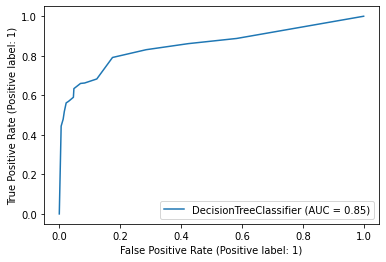

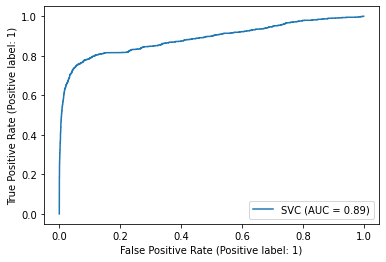

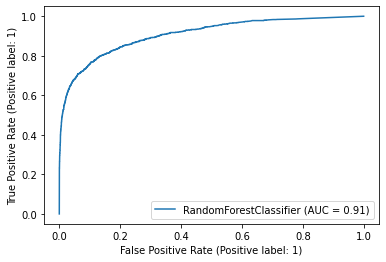

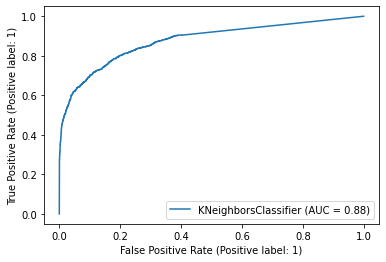

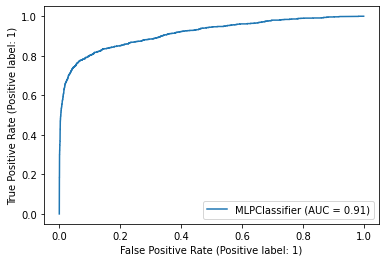

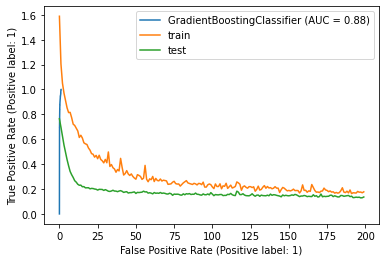

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.5424610051993068
0.8654262775583025
0.5166498486377397
0.877915126800051


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6212839293408013
0.8879826685357461
0.5644768856447688
0.885943672741175


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6632522407170295
0.899452019880209
0.6087596613912404
0.8645342168981777


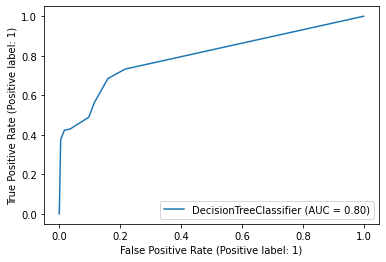

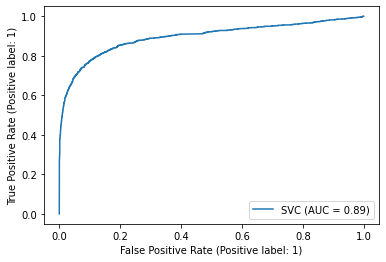

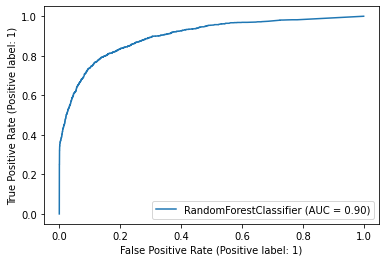

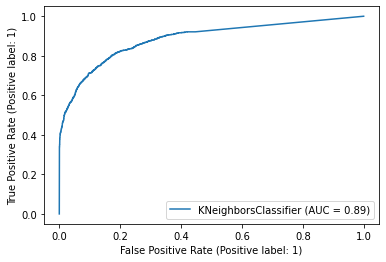

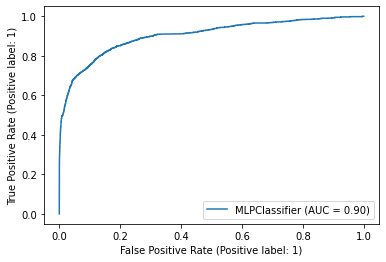

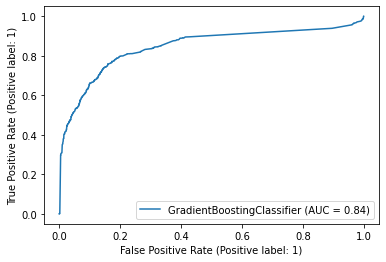

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X_under,y_under, test_size=0.2,random_state = 42)
pretrain_under = unsupervised_pretrain(base_algos_under,X_train, X_test, y_train, y_test)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
938/938 - 2s - loss: 0.4296 - val_loss: 0.1123 - 2s/epoch - 2ms/step
Epoch 2/200
938/938 - 2s - loss: 0.2402 - val_loss: 0.0807 - 2s/epoch - 2ms/step
Epoch 3/200
938/938 - 2s - loss: 0.2056 - val_loss: 0.0603 - 2s/epoch - 2ms/step
Epoch 4/200
938/938 - 1s - loss: 0.1898 - val_loss: 0.0566 - 1s/epoch - 2ms/step
Epoch 5/200
938/938 - 2s - loss: 0.1805 - val_loss: 0.0549 - 2s/epoch - 2ms/step
Epoch 6/200
938/938 - 1s - loss: 0.1697 - val_loss: 0.0524 - 1s/epoch - 2ms/step
Epoch 7/200
938/938 - 1s - loss: 0.1636 - val_loss: 0.0521 - 1s/epoch - 2ms/step
Epoch 8/200
938/938 - 1s - loss: 0.1561 - val_loss: 0.0502 - 1s/epoch - 2ms/step
Epoch 9/200
938/938 - 2s - loss: 0.1528 - val_loss: 0.0506 - 2s/epoch - 2ms/step
Epoch 10/200
938/938 - 2s - loss: 0.1520 - val_loss: 0.0496 - 2s/epoch - 2ms/step
Epoch 11/200
938/93

Epoch 99/200
938/938 - 1s - loss: 0.0929 - val_loss: 0.0350 - 829ms/epoch - 884us/step
Epoch 100/200
938/938 - 1s - loss: 0.0918 - val_loss: 0.0366 - 852ms/epoch - 909us/step
Epoch 101/200
938/938 - 1s - loss: 0.0926 - val_loss: 0.0405 - 1s/epoch - 1ms/step
Epoch 102/200
938/938 - 1s - loss: 0.0924 - val_loss: 0.0388 - 1s/epoch - 1ms/step
Epoch 103/200
938/938 - 1s - loss: 0.0916 - val_loss: 0.0367 - 1s/epoch - 1ms/step
Epoch 104/200
938/938 - 1s - loss: 0.0907 - val_loss: 0.0373 - 1s/epoch - 1ms/step
Epoch 105/200
938/938 - 1s - loss: 0.0906 - val_loss: 0.0399 - 1s/epoch - 1ms/step
Epoch 106/200
938/938 - 1s - loss: 0.0911 - val_loss: 0.0391 - 1s/epoch - 1ms/step
Epoch 107/200
938/938 - 1s - loss: 0.0908 - val_loss: 0.0361 - 1s/epoch - 1ms/step
Epoch 108/200
938/938 - 1s - loss: 0.0905 - val_loss: 0.0370 - 1s/epoch - 1ms/step
Epoch 109/200
938/938 - 1s - loss: 0.0926 - val_loss: 0.0351 - 1s/epoch - 1ms/step
Epoch 110/200
938/938 - 1s - loss: 0.0913 - val_loss: 0.0365 - 1s/epoch - 1ms/

Epoch 198/200
938/938 - 1s - loss: 0.0788 - val_loss: 0.0364 - 1s/epoch - 1ms/step
Epoch 199/200
938/938 - 1s - loss: 0.0797 - val_loss: 0.0346 - 1s/epoch - 1ms/step
Epoch 200/200
938/938 - 1s - loss: 0.0784 - val_loss: 0.0369 - 1s/epoch - 1ms/step


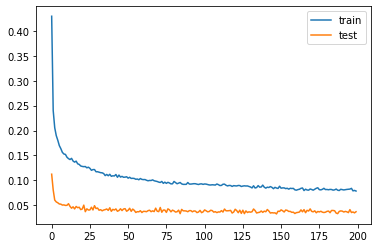

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8630460448642266
0.8609112709832134


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8432229856339788
0.8495203836930456


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.9023809523809524
0.9016786570743405
0.888382687927107
0.882494004796163


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8701837581505631
0.8687050359712231


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8809667673716012
0.88189448441247
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
834/834 - 2s - loss: 0.4223 - val_loss: 0.1339 - 2s/epoch - 2ms/step
Epoch 2/200
834/834 - 1s - loss: 0.2637 - val_loss: 0.1018 - 1s/epoch - 1ms/step
Epoch 3/200
834/834 - 1s - loss: 0.2265 - val_loss: 0.0822 - 1s/epoch - 1ms/step
Epoch 4/200
834/834 - 1s - loss: 0.2080 - val_loss: 0.0700 - 1s/epoch - 2ms/step
Epoch 5/200
834/834 - 1s - loss: 0.1916 - val_loss: 0.0663 - 1s/epoch - 1ms/step
Epoch 6/200
834/834 - 1s - loss: 0.1855 - val_loss: 0.0569 - 1s/epoch - 1ms/step
Epoch 7/200
834/834 - 1s - loss: 0.1783 - val_loss: 0.0614 - 1s/epoch - 1ms/step
Epoch 8/200
834/834 - 1s - loss: 0.1700 - val_loss: 0.0574 - 990ms/epoch - 1ms/step
Epoch 9/200
834/834 - 1s - loss: 0.1677 - val_loss: 0.0479 - 1s/epoch - 1ms/step
Epoch 10/200
834/834 - 1s - loss: 0.1629 - val_loss: 0.0468 - 

Epoch 97/200
834/834 - 1s - loss: 0.0915 - val_loss: 0.0331 - 1s/epoch - 1ms/step
Epoch 98/200
834/834 - 1s - loss: 0.0956 - val_loss: 0.0433 - 980ms/epoch - 1ms/step
Epoch 99/200
834/834 - 1s - loss: 0.0921 - val_loss: 0.0355 - 987ms/epoch - 1ms/step
Epoch 100/200
834/834 - 1s - loss: 0.0942 - val_loss: 0.0375 - 1s/epoch - 1ms/step
Epoch 101/200
834/834 - 1s - loss: 0.0929 - val_loss: 0.0422 - 1s/epoch - 1ms/step
Epoch 102/200
834/834 - 1s - loss: 0.0893 - val_loss: 0.0405 - 983ms/epoch - 1ms/step
Epoch 103/200
834/834 - 1s - loss: 0.0917 - val_loss: 0.0432 - 975ms/epoch - 1ms/step
Epoch 104/200
834/834 - 1s - loss: 0.0919 - val_loss: 0.0414 - 981ms/epoch - 1ms/step
Epoch 105/200
834/834 - 1s - loss: 0.0925 - val_loss: 0.0355 - 985ms/epoch - 1ms/step
Epoch 106/200
834/834 - 1s - loss: 0.0913 - val_loss: 0.0410 - 1s/epoch - 1ms/step
Epoch 107/200
834/834 - 1s - loss: 0.0916 - val_loss: 0.0388 - 969ms/epoch - 1ms/step
Epoch 108/200
834/834 - 1s - loss: 0.0884 - val_loss: 0.0413 - 986ms/

Epoch 195/200
834/834 - 1s - loss: 0.0814 - val_loss: 0.0371 - 1s/epoch - 1ms/step
Epoch 196/200
834/834 - 1s - loss: 0.0837 - val_loss: 0.0388 - 969ms/epoch - 1ms/step
Epoch 197/200
834/834 - 1s - loss: 0.0816 - val_loss: 0.0365 - 985ms/epoch - 1ms/step
Epoch 198/200
834/834 - 1s - loss: 0.0829 - val_loss: 0.0395 - 1s/epoch - 1ms/step
Epoch 199/200
834/834 - 1s - loss: 0.0816 - val_loss: 0.0395 - 1s/epoch - 1ms/step
Epoch 200/200
834/834 - 1s - loss: 0.0832 - val_loss: 0.0385 - 968ms/epoch - 1ms/step


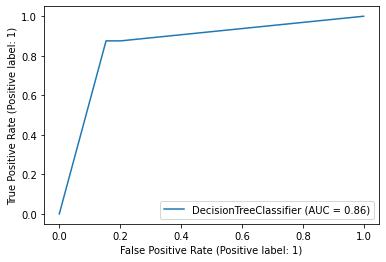

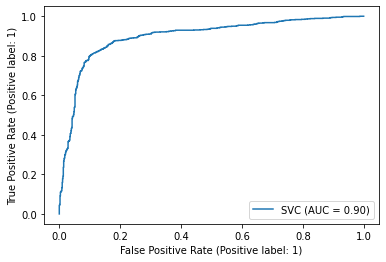

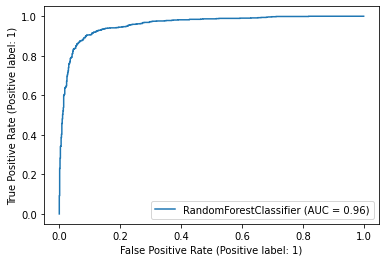

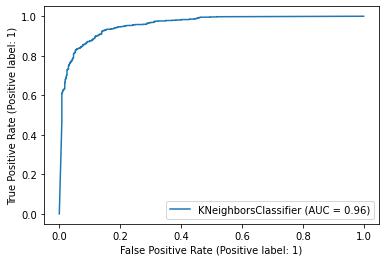

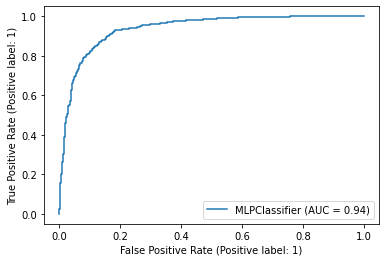

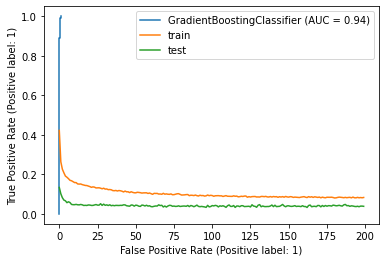

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8479154433352907
0.8446776611694153


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8372524752475248
0.8422788605697151


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8979833926453142
0.8968515742128935
0.8880090497737556
0.8812593703148426


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8862698880377137
0.8842578710644677


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8823703703703704
0.8809595202398801
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
522/522 - 2s - loss: 0.4993 - val_loss: 0.1687 - 2s/epoch - 3ms/step
Epoch 2/200
522/522 - 1s - loss: 0.2853 - val_loss: 0.1306 - 875ms/epoch - 2ms/step
Epoch 3/200
522/522 - 1s - loss: 0.2553 - val_loss: 0.1119 - 849ms/epoch - 2ms/step
Epoch 4/200
522/522 - 1s - loss: 0.2380 - val_loss: 0.1024 - 902ms/epoch - 2ms/step
Epoch 5/200
522/522 - 1s - loss: 0.2172 - val_loss: 0.0958 - 913ms/epoch - 2ms/step
Epoch 6/200
522/522 - 1s - loss: 0.2085 - val_loss: 0.0829 - 873ms/epoch - 2ms/step
Epoch 7/200
522/522 - 1s - loss: 0.2003 - val_loss: 0.0752 - 898ms/epoch - 2ms/step
Epoch 8/200
522/522 - 1s - loss: 0.1913 - val_loss: 0.0745 - 903ms/epoch - 2ms/step
Epoch 9/200
522/522 - 1s - loss: 0.1902 - val_loss: 0.0714 - 886ms/epoch - 2ms/step
Epoch 10/200
522/522 - 1s - loss: 0.180

522/522 - 1s - loss: 0.1025 - val_loss: 0.0416 - 870ms/epoch - 2ms/step
Epoch 96/200
522/522 - 1s - loss: 0.1034 - val_loss: 0.0407 - 886ms/epoch - 2ms/step
Epoch 97/200
522/522 - 1s - loss: 0.1024 - val_loss: 0.0406 - 883ms/epoch - 2ms/step
Epoch 98/200
522/522 - 1s - loss: 0.1012 - val_loss: 0.0439 - 866ms/epoch - 2ms/step
Epoch 99/200
522/522 - 1s - loss: 0.1056 - val_loss: 0.0416 - 874ms/epoch - 2ms/step
Epoch 100/200
522/522 - 1s - loss: 0.1047 - val_loss: 0.0466 - 948ms/epoch - 2ms/step
Epoch 101/200
522/522 - 1s - loss: 0.1021 - val_loss: 0.0466 - 849ms/epoch - 2ms/step
Epoch 102/200
522/522 - 1s - loss: 0.1074 - val_loss: 0.0440 - 870ms/epoch - 2ms/step
Epoch 103/200
522/522 - 1s - loss: 0.1001 - val_loss: 0.0393 - 863ms/epoch - 2ms/step
Epoch 104/200
522/522 - 1s - loss: 0.0978 - val_loss: 0.0418 - 883ms/epoch - 2ms/step
Epoch 105/200
522/522 - 1s - loss: 0.1069 - val_loss: 0.0404 - 872ms/epoch - 2ms/step
Epoch 106/200
522/522 - 1s - loss: 0.0995 - val_loss: 0.0432 - 917ms/epo

Epoch 191/200
522/522 - 1s - loss: 0.0875 - val_loss: 0.0367 - 885ms/epoch - 2ms/step
Epoch 192/200
522/522 - 1s - loss: 0.0860 - val_loss: 0.0358 - 921ms/epoch - 2ms/step
Epoch 193/200
522/522 - 1s - loss: 0.0853 - val_loss: 0.0375 - 865ms/epoch - 2ms/step
Epoch 194/200
522/522 - 1s - loss: 0.0895 - val_loss: 0.0397 - 901ms/epoch - 2ms/step
Epoch 195/200
522/522 - 1s - loss: 0.0876 - val_loss: 0.0349 - 883ms/epoch - 2ms/step
Epoch 196/200
522/522 - 1s - loss: 0.0891 - val_loss: 0.0373 - 896ms/epoch - 2ms/step
Epoch 197/200
522/522 - 1s - loss: 0.0886 - val_loss: 0.0402 - 875ms/epoch - 2ms/step
Epoch 198/200
522/522 - 1s - loss: 0.0867 - val_loss: 0.0368 - 901ms/epoch - 2ms/step
Epoch 199/200
522/522 - 1s - loss: 0.0847 - val_loss: 0.0390 - 933ms/epoch - 2ms/step
Epoch 200/200
522/522 - 1s - loss: 0.0863 - val_loss: 0.0408 - 902ms/epoch - 2ms/step


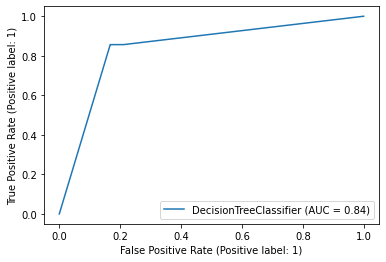

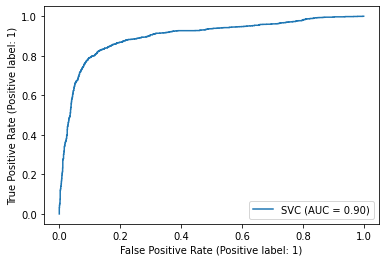

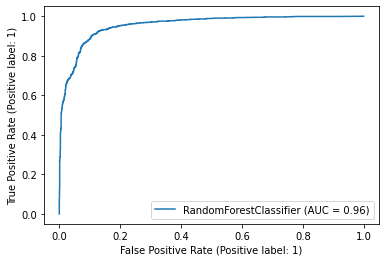

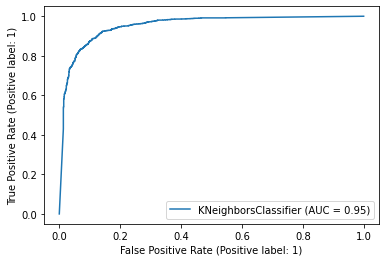

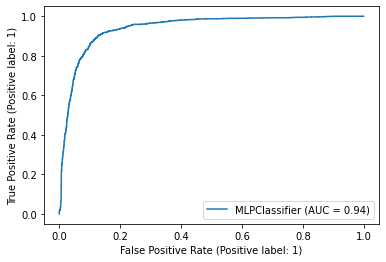

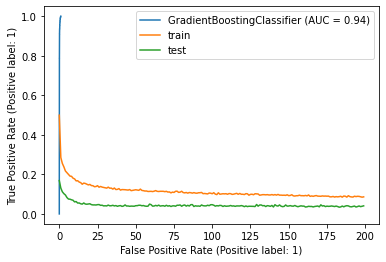

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8216613342813129
0.8195010793955385


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8345519890940638
0.839889661789398


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8758123596833275
0.8739505876709043


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8752285191956125
0.8690333413288558


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8663919952913479
0.8638762293115855


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8644992880873279
0.863036699448309
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
105/105 - 1s - loss: 0.8987 - val_loss: 0.7239 - 1s/epoch - 13ms/step
Epoch 2/200
105/105 - 1s - loss: 0.4879 - val_loss: 0.4238 - 637ms/epoch - 6ms/step
Epoch 3/200
105/105 - 1s - loss: 0.3854 - val_loss: 0.2560 - 771ms/epoch - 7ms/step
Epoch 4/200
105/105 - 1s - loss: 0.3390 - val_loss: 0.1849 - 643ms/epoch - 6ms/step
Epoch 5/200
105/105 - 1s - loss: 0.3000 - val_loss: 0.1622 - 697ms/epoch - 7ms/step
Epoch 6/200
105/105 - 1s - loss: 0.2855 - val_loss: 0.1483 - 691ms/epoch - 7ms/step
Epoch 7/200
105/105 - 1s - loss: 0.2604 - val_loss: 0.1356 - 652ms/epoch - 6ms/step
Epoch 8/200
105/105 - 1s - loss: 0.2650 - val_loss: 0.1276 - 686ms/epoch - 7ms/step
Epoch 9/200
105/105 - 1s - loss: 0.2538 - val_loss: 0.1230 - 732ms/epoch - 7ms/step
Epoch 10/200
105/105 - 1s - loss: 0.247

105/105 - 1s - loss: 0.1420 - val_loss: 0.0551 - 652ms/epoch - 6ms/step
Epoch 96/200
105/105 - 1s - loss: 0.1352 - val_loss: 0.0511 - 702ms/epoch - 7ms/step
Epoch 97/200
105/105 - 1s - loss: 0.1391 - val_loss: 0.0529 - 686ms/epoch - 7ms/step
Epoch 98/200
105/105 - 1s - loss: 0.1440 - val_loss: 0.0533 - 681ms/epoch - 6ms/step
Epoch 99/200
105/105 - 1s - loss: 0.1350 - val_loss: 0.0526 - 685ms/epoch - 7ms/step
Epoch 100/200
105/105 - 1s - loss: 0.1363 - val_loss: 0.0523 - 679ms/epoch - 6ms/step
Epoch 101/200
105/105 - 1s - loss: 0.1363 - val_loss: 0.0514 - 639ms/epoch - 6ms/step
Epoch 102/200
105/105 - 1s - loss: 0.1400 - val_loss: 0.0528 - 732ms/epoch - 7ms/step
Epoch 103/200
105/105 - 1s - loss: 0.1348 - val_loss: 0.0513 - 621ms/epoch - 6ms/step
Epoch 104/200
105/105 - 1s - loss: 0.1374 - val_loss: 0.0511 - 718ms/epoch - 7ms/step
Epoch 105/200
105/105 - 1s - loss: 0.1298 - val_loss: 0.0506 - 685ms/epoch - 7ms/step
Epoch 106/200
105/105 - 1s - loss: 0.1264 - val_loss: 0.0510 - 718ms/epo

Epoch 191/200
105/105 - 1s - loss: 0.1315 - val_loss: 0.0473 - 619ms/epoch - 6ms/step
Epoch 192/200
105/105 - 1s - loss: 0.1292 - val_loss: 0.0444 - 694ms/epoch - 7ms/step
Epoch 193/200
105/105 - 1s - loss: 0.1297 - val_loss: 0.0446 - 656ms/epoch - 6ms/step
Epoch 194/200
105/105 - 1s - loss: 0.1292 - val_loss: 0.0471 - 732ms/epoch - 7ms/step
Epoch 195/200
105/105 - 1s - loss: 0.1253 - val_loss: 0.0468 - 654ms/epoch - 6ms/step
Epoch 196/200
105/105 - 1s - loss: 0.1330 - val_loss: 0.0457 - 732ms/epoch - 7ms/step
Epoch 197/200
105/105 - 1s - loss: 0.1297 - val_loss: 0.0447 - 752ms/epoch - 7ms/step
Epoch 198/200
105/105 - 1s - loss: 0.1226 - val_loss: 0.0435 - 618ms/epoch - 6ms/step
Epoch 199/200
105/105 - 1s - loss: 0.1257 - val_loss: 0.0486 - 735ms/epoch - 7ms/step
Epoch 200/200
105/105 - 1s - loss: 0.1233 - val_loss: 0.0437 - 670ms/epoch - 6ms/step


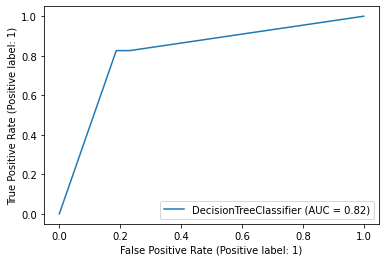

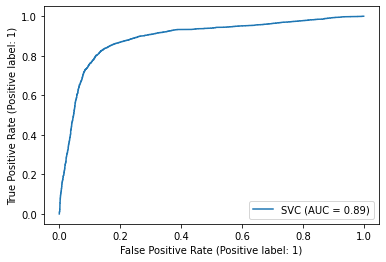

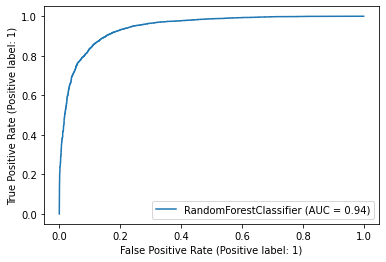

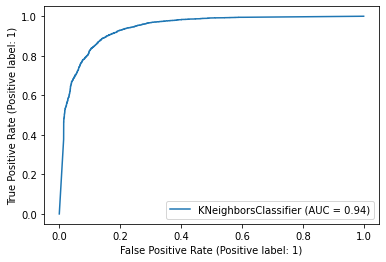

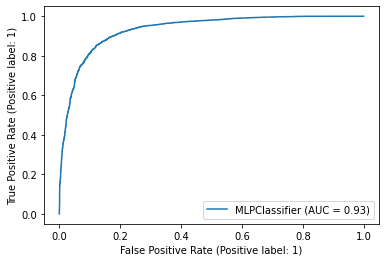

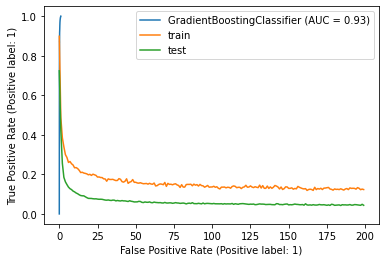

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7719090789646564
0.7686567164179104


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8210304942166141
0.8298907249466951


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8303858520900322
0.8312899786780383


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.818996295048838
0.8209621535181236


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8295214037004165
0.8336220682302772


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8216050206970222
0.8219616204690832
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
53/53 - 1s - loss: 1.0385 - val_loss: 0.8386 - 1s/epoch - 25ms/step
Epoch 2/200
53/53 - 1s - loss: 0.5872 - val_loss: 0.6262 - 721ms/epoch - 14ms/step
Epoch 3/200
53/53 - 1s - loss: 0.4289 - val_loss: 0.4643 - 700ms/epoch - 13ms/step
Epoch 4/200
53/53 - 1s - loss: 0.3746 - val_loss: 0.3293 - 633ms/epoch - 12ms/step
Epoch 5/200
53/53 - 1s - loss: 0.3154 - val_loss: 0.2540 - 619ms/epoch - 12ms/step
Epoch 6/200
53/53 - 1s - loss: 0.3081 - val_loss: 0.2169 - 729ms/epoch - 14ms/step
Epoch 7/200
53/53 - 1s - loss: 0.2899 - val_loss: 0.1958 - 689ms/epoch - 13ms/step
Epoch 8/200
53/53 - 1s - loss: 0.2732 - val_loss: 0.1768 - 585ms/epoch - 11ms/step
Epoch 9/200
53/53 - 1s - loss: 0.2653 - val_loss: 0.1699 - 653ms/epoch - 12ms/step
Epoch 10/200
53/53 - 1s - loss: 0.2675 - val_los

Epoch 97/200
53/53 - 1s - loss: 0.1507 - val_loss: 0.0543 - 653ms/epoch - 12ms/step
Epoch 98/200
53/53 - 1s - loss: 0.1374 - val_loss: 0.0545 - 685ms/epoch - 13ms/step
Epoch 99/200
53/53 - 1s - loss: 0.1443 - val_loss: 0.0526 - 682ms/epoch - 13ms/step
Epoch 100/200
53/53 - 1s - loss: 0.1542 - val_loss: 0.0511 - 705ms/epoch - 13ms/step
Epoch 101/200
53/53 - 1s - loss: 0.1468 - val_loss: 0.0535 - 717ms/epoch - 14ms/step
Epoch 102/200
53/53 - 1s - loss: 0.1518 - val_loss: 0.0519 - 713ms/epoch - 13ms/step
Epoch 103/200
53/53 - 1s - loss: 0.1367 - val_loss: 0.0533 - 637ms/epoch - 12ms/step
Epoch 104/200
53/53 - 1s - loss: 0.1491 - val_loss: 0.0507 - 699ms/epoch - 13ms/step
Epoch 105/200
53/53 - 1s - loss: 0.1459 - val_loss: 0.0507 - 663ms/epoch - 13ms/step
Epoch 106/200
53/53 - 1s - loss: 0.1432 - val_loss: 0.0510 - 621ms/epoch - 12ms/step
Epoch 107/200
53/53 - 1s - loss: 0.1320 - val_loss: 0.0508 - 561ms/epoch - 11ms/step
Epoch 108/200
53/53 - 1s - loss: 0.1401 - val_loss: 0.0491 - 678ms/e

Epoch 194/200
53/53 - 1s - loss: 0.1254 - val_loss: 0.0446 - 719ms/epoch - 14ms/step
Epoch 195/200
53/53 - 1s - loss: 0.1237 - val_loss: 0.0449 - 648ms/epoch - 12ms/step
Epoch 196/200
53/53 - 1s - loss: 0.1260 - val_loss: 0.0435 - 601ms/epoch - 11ms/step
Epoch 197/200
53/53 - 1s - loss: 0.1257 - val_loss: 0.0429 - 701ms/epoch - 13ms/step
Epoch 198/200
53/53 - 1s - loss: 0.1376 - val_loss: 0.0445 - 722ms/epoch - 14ms/step
Epoch 199/200
53/53 - 1s - loss: 0.1259 - val_loss: 0.0427 - 701ms/epoch - 13ms/step
Epoch 200/200
53/53 - 1s - loss: 0.1269 - val_loss: 0.0453 - 553ms/epoch - 10ms/step


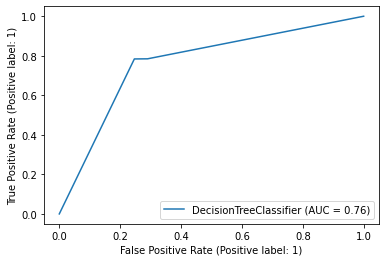

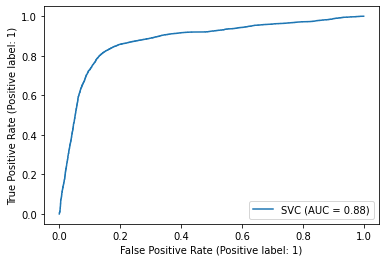

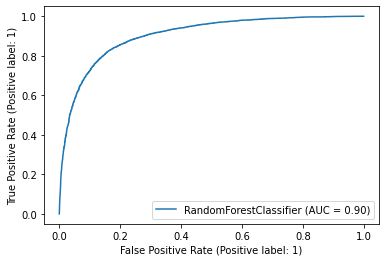

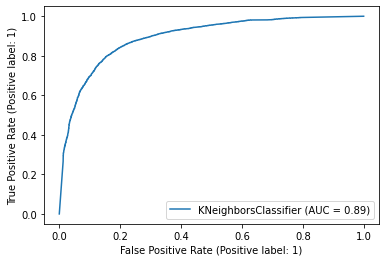

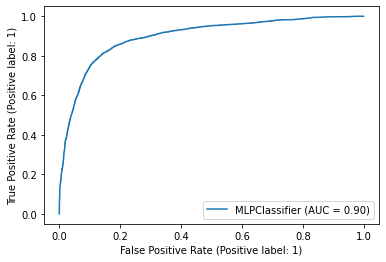

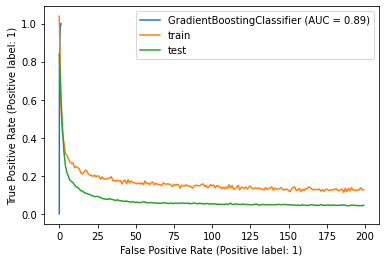

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7526646975728779
0.7568488827168287


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.79703340817854
0.8117030677944704


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7923742598737719
0.7985734124479232


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7974924012158054
0.7981315490468375


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.811961278345047
0.8209821992172706
0.785242718446602
0.790556747885368


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


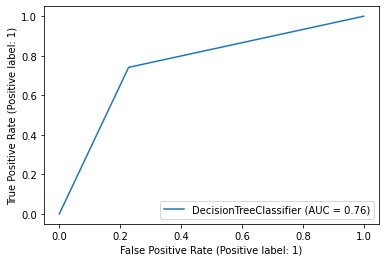

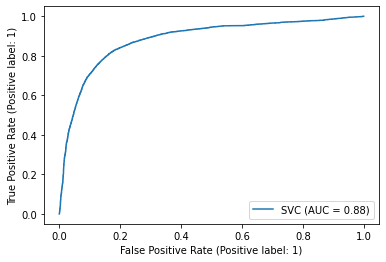

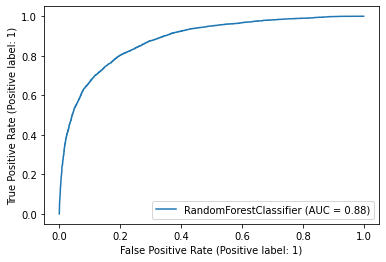

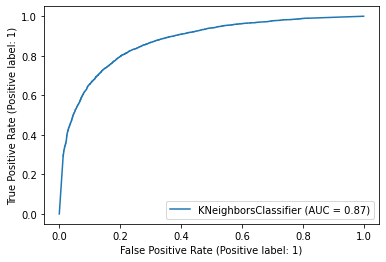

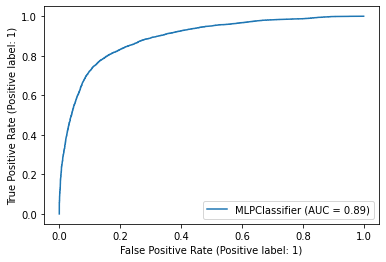

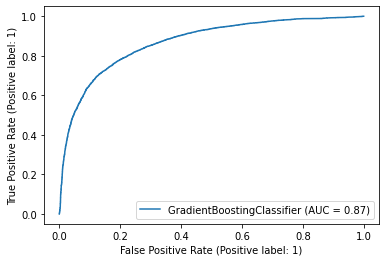

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X_over,y_over, test_size=0.2,random_state = 42)
pretrain_over = unsupervised_pretrain(base_algos_over,X_train, X_test, y_train, y_test)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
100/100 - 1s - loss: 0.5507 - val_loss: 0.3110 - 899ms/epoch - 9ms/step
Epoch 2/200
100/100 - 0s - loss: 0.2644 - val_loss: 0.1848 - 170ms/epoch - 2ms/step
Epoch 3/200
100/100 - 0s - loss: 0.2240 - val_loss: 0.1465 - 167ms/epoch - 2ms/step
Epoch 4/200
100/100 - 0s - loss: 0.2004 - val_loss: 0.1253 - 172ms/epoch - 2ms/step
Epoch 5/200
100/100 - 0s - loss: 0.1843 - val_loss: 0.1089 - 168ms/epoch - 2ms/step
Epoch 6/200
100/100 - 0s - loss: 0.1747 - val_loss: 0.0988 - 172ms/epoch - 2ms/step
Epoch 7/200
100/100 - 0s - loss: 0.1662 - val_loss: 0.0914 - 170ms/epoch - 2ms/step
Epoch 8/200
100/100 - 0s - loss: 0.1595 - val_loss: 0.0875 - 187ms/epoch - 2ms/step
Epoch 9/200
100/100 - 0s - loss: 0.1561 - val_loss: 0.0808 - 191ms/epoch - 2ms/step
Epoch 10/200
100/100 - 0s - loss: 0.1472 - val_loss: 0.0761 - 203ms/epoch 

Epoch 96/200
100/100 - 0s - loss: 0.0810 - val_loss: 0.0370 - 170ms/epoch - 2ms/step
Epoch 97/200
100/100 - 0s - loss: 0.0803 - val_loss: 0.0341 - 175ms/epoch - 2ms/step
Epoch 98/200
100/100 - 0s - loss: 0.0774 - val_loss: 0.0328 - 183ms/epoch - 2ms/step
Epoch 99/200
100/100 - 0s - loss: 0.0787 - val_loss: 0.0413 - 197ms/epoch - 2ms/step
Epoch 100/200
100/100 - 0s - loss: 0.0823 - val_loss: 0.0349 - 207ms/epoch - 2ms/step
Epoch 101/200
100/100 - 0s - loss: 0.0813 - val_loss: 0.0314 - 193ms/epoch - 2ms/step
Epoch 102/200
100/100 - 0s - loss: 0.0803 - val_loss: 0.0349 - 162ms/epoch - 2ms/step
Epoch 103/200
100/100 - 0s - loss: 0.0763 - val_loss: 0.0343 - 159ms/epoch - 2ms/step
Epoch 104/200
100/100 - 0s - loss: 0.0781 - val_loss: 0.0374 - 159ms/epoch - 2ms/step
Epoch 105/200
100/100 - 0s - loss: 0.0810 - val_loss: 0.0408 - 159ms/epoch - 2ms/step
Epoch 106/200
100/100 - 0s - loss: 0.0740 - val_loss: 0.0365 - 167ms/epoch - 2ms/step
Epoch 107/200
100/100 - 0s - loss: 0.0796 - val_loss: 0.03

Epoch 192/200
100/100 - 0s - loss: 0.0645 - val_loss: 0.0276 - 169ms/epoch - 2ms/step
Epoch 193/200
100/100 - 0s - loss: 0.0678 - val_loss: 0.0305 - 169ms/epoch - 2ms/step
Epoch 194/200
100/100 - 0s - loss: 0.0674 - val_loss: 0.0286 - 170ms/epoch - 2ms/step
Epoch 195/200
100/100 - 0s - loss: 0.0688 - val_loss: 0.0330 - 162ms/epoch - 2ms/step
Epoch 196/200
100/100 - 0s - loss: 0.0682 - val_loss: 0.0439 - 167ms/epoch - 2ms/step
Epoch 197/200
100/100 - 0s - loss: 0.0695 - val_loss: 0.0298 - 167ms/epoch - 2ms/step
Epoch 198/200
100/100 - 0s - loss: 0.0676 - val_loss: 0.0308 - 185ms/epoch - 2ms/step
Epoch 199/200
100/100 - 0s - loss: 0.0645 - val_loss: 0.0309 - 180ms/epoch - 2ms/step
Epoch 200/200
100/100 - 0s - loss: 0.0658 - val_loss: 0.0265 - 170ms/epoch - 2ms/step


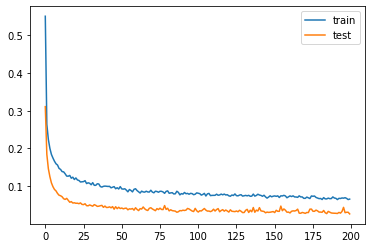

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.7738095238095238
0.7865168539325843


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8622754491017964
0.8707865168539326


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8198757763975155
0.8370786516853933
0.8554913294797688
0.8595505617977528


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8862275449101796
0.8932584269662921


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8795180722891567
0.8876404494382022
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
89/89 - 1s - loss: 0.6369 - val_loss: 0.3810 - 864ms/epoch - 10ms/step
Epoch 2/200
89/89 - 0s - loss: 0.2722 - val_loss: 0.2700 - 174ms/epoch - 2ms/step
Epoch 3/200
89/89 - 0s - loss: 0.2301 - val_loss: 0.2269 - 164ms/epoch - 2ms/step
Epoch 4/200
89/89 - 0s - loss: 0.2095 - val_loss: 0.2052 - 169ms/epoch - 2ms/step
Epoch 5/200
89/89 - 0s - loss: 0.1927 - val_loss: 0.1904 - 180ms/epoch - 2ms/step
Epoch 6/200
89/89 - 0s - loss: 0.1775 - val_loss: 0.1788 - 157ms/epoch - 2ms/step
Epoch 7/200
89/89 - 0s - loss: 0.1703 - val_loss: 0.1709 - 159ms/epoch - 2ms/step
Epoch 8/200
89/89 - 0s - loss: 0.1650 - val_loss: 0.1607 - 173ms/epoch - 2ms/step
Epoch 9/200
89/89 - 0s - loss: 0.1535 - val_loss: 0.1537 - 165ms/epoch - 2ms/step
Epoch 10/200
89/89 - 0s - loss: 0.1528 - val_loss: 0.

Epoch 98/200
89/89 - 0s - loss: 0.0793 - val_loss: 0.0668 - 153ms/epoch - 2ms/step
Epoch 99/200
89/89 - 0s - loss: 0.0791 - val_loss: 0.0638 - 164ms/epoch - 2ms/step
Epoch 100/200
89/89 - 0s - loss: 0.0768 - val_loss: 0.0638 - 174ms/epoch - 2ms/step
Epoch 101/200
89/89 - 0s - loss: 0.0797 - val_loss: 0.0632 - 164ms/epoch - 2ms/step
Epoch 102/200
89/89 - 0s - loss: 0.0769 - val_loss: 0.0629 - 168ms/epoch - 2ms/step
Epoch 103/200
89/89 - 0s - loss: 0.0773 - val_loss: 0.0635 - 163ms/epoch - 2ms/step
Epoch 104/200
89/89 - 0s - loss: 0.0755 - val_loss: 0.0657 - 157ms/epoch - 2ms/step
Epoch 105/200
89/89 - 0s - loss: 0.0815 - val_loss: 0.0714 - 158ms/epoch - 2ms/step
Epoch 106/200
89/89 - 0s - loss: 0.0772 - val_loss: 0.0653 - 176ms/epoch - 2ms/step
Epoch 107/200
89/89 - 0s - loss: 0.0784 - val_loss: 0.0660 - 166ms/epoch - 2ms/step
Epoch 108/200
89/89 - 0s - loss: 0.0746 - val_loss: 0.0673 - 160ms/epoch - 2ms/step
Epoch 109/200
89/89 - 0s - loss: 0.0780 - val_loss: 0.0669 - 172ms/epoch - 2ms

Epoch 196/200
89/89 - 0s - loss: 0.0669 - val_loss: 0.0681 - 156ms/epoch - 2ms/step
Epoch 197/200
89/89 - 0s - loss: 0.0667 - val_loss: 0.0671 - 172ms/epoch - 2ms/step
Epoch 198/200
89/89 - 0s - loss: 0.0686 - val_loss: 0.0695 - 158ms/epoch - 2ms/step
Epoch 199/200
89/89 - 0s - loss: 0.0638 - val_loss: 0.0650 - 174ms/epoch - 2ms/step
Epoch 200/200
89/89 - 0s - loss: 0.0637 - val_loss: 0.0686 - 164ms/epoch - 2ms/step


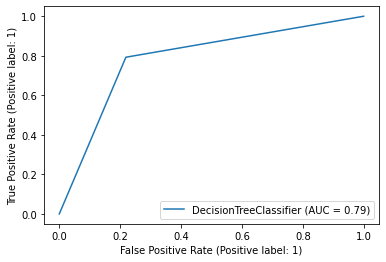

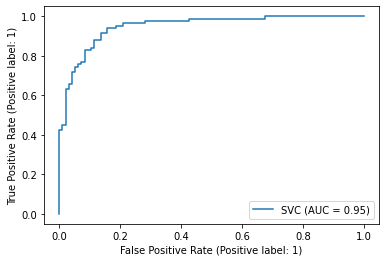

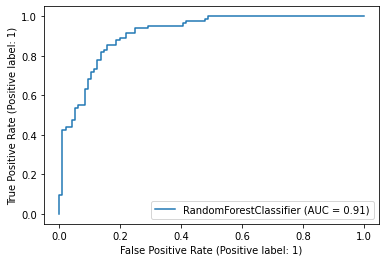

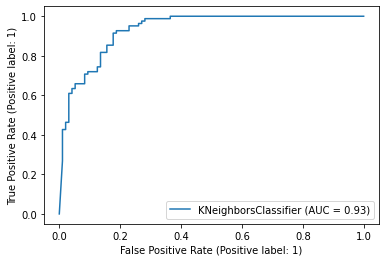

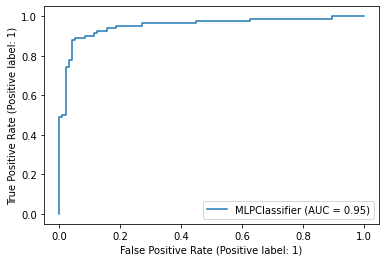

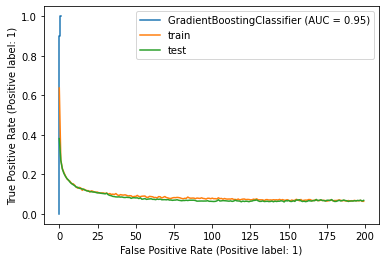

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.757396449704142
0.7690140845070422


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8527607361963191
0.8647887323943662


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8417910447761193
0.8507042253521127
0.81524926686217
0.8225352112676056


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8370607028753994
0.856338028169014


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8246153846153845
0.8394366197183099
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
56/56 - 1s - loss: 0.7314 - val_loss: 0.5020 - 971ms/epoch - 17ms/step
Epoch 2/200
56/56 - 0s - loss: 0.3426 - val_loss: 0.3413 - 133ms/epoch - 2ms/step
Epoch 3/200
56/56 - 0s - loss: 0.2591 - val_loss: 0.2440 - 142ms/epoch - 3ms/step
Epoch 4/200
56/56 - 0s - loss: 0.2286 - val_loss: 0.1953 - 146ms/epoch - 3ms/step
Epoch 5/200
56/56 - 0s - loss: 0.2028 - val_loss: 0.1709 - 136ms/epoch - 2ms/step
Epoch 6/200
56/56 - 0s - loss: 0.1940 - val_loss: 0.1560 - 160ms/epoch - 3ms/step
Epoch 7/200
56/56 - 0s - loss: 0.1808 - val_loss: 0.1489 - 143ms/epoch - 3ms/step
Epoch 8/200
56/56 - 0s - loss: 0.1718 - val_loss: 0.1376 - 157ms/epoch - 3ms/step
Epoch 9/200
56/56 - 0s - loss: 0.1682 - val_loss: 0.1321 - 133ms/epoch - 2ms/step
Epoch 10/200
56/56 - 0s - loss: 0.1693 - val_loss: 0.

Epoch 98/200
56/56 - 0s - loss: 0.0797 - val_loss: 0.0631 - 135ms/epoch - 2ms/step
Epoch 99/200
56/56 - 0s - loss: 0.0871 - val_loss: 0.0635 - 141ms/epoch - 3ms/step
Epoch 100/200
56/56 - 0s - loss: 0.0850 - val_loss: 0.0652 - 144ms/epoch - 3ms/step
Epoch 101/200
56/56 - 0s - loss: 0.0845 - val_loss: 0.0629 - 141ms/epoch - 3ms/step
Epoch 102/200
56/56 - 0s - loss: 0.0830 - val_loss: 0.0644 - 135ms/epoch - 2ms/step
Epoch 103/200
56/56 - 0s - loss: 0.0845 - val_loss: 0.0633 - 144ms/epoch - 3ms/step
Epoch 104/200
56/56 - 0s - loss: 0.0815 - val_loss: 0.0623 - 138ms/epoch - 2ms/step
Epoch 105/200
56/56 - 0s - loss: 0.0874 - val_loss: 0.0644 - 147ms/epoch - 3ms/step
Epoch 106/200
56/56 - 0s - loss: 0.0870 - val_loss: 0.0634 - 139ms/epoch - 2ms/step
Epoch 107/200
56/56 - 0s - loss: 0.0878 - val_loss: 0.0624 - 151ms/epoch - 3ms/step
Epoch 108/200
56/56 - 0s - loss: 0.0831 - val_loss: 0.0625 - 141ms/epoch - 3ms/step
Epoch 109/200
56/56 - 0s - loss: 0.0860 - val_loss: 0.0643 - 140ms/epoch - 3ms

Epoch 196/200
56/56 - 0s - loss: 0.0652 - val_loss: 0.0533 - 141ms/epoch - 3ms/step
Epoch 197/200
56/56 - 0s - loss: 0.0703 - val_loss: 0.0526 - 145ms/epoch - 3ms/step
Epoch 198/200
56/56 - 0s - loss: 0.0708 - val_loss: 0.0505 - 146ms/epoch - 3ms/step
Epoch 199/200
56/56 - 0s - loss: 0.0748 - val_loss: 0.0512 - 146ms/epoch - 3ms/step
Epoch 200/200
56/56 - 0s - loss: 0.0675 - val_loss: 0.0504 - 138ms/epoch - 2ms/step


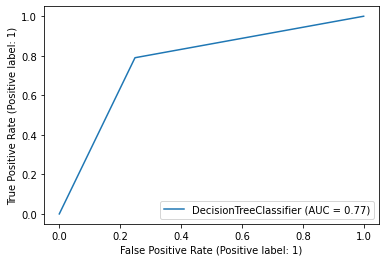

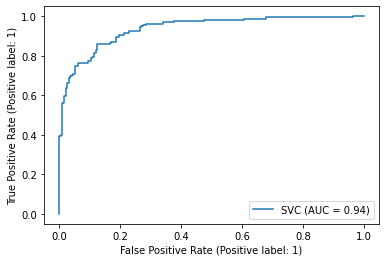

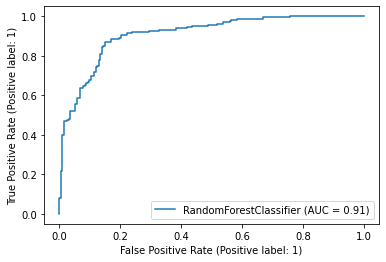

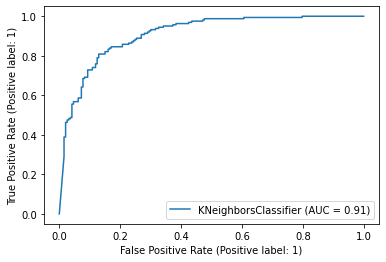

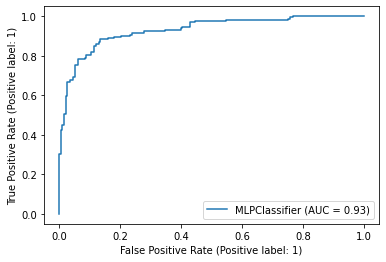

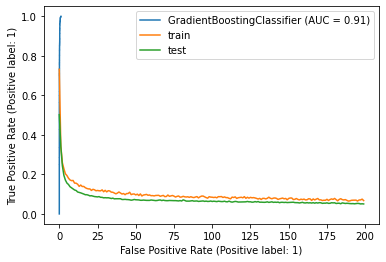

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.7188264058679708
0.7404063205417607


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8353221957040573
0.8442437923250564


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8048192771084338
0.8171557562076749
0.8013468013468013
0.8002257336343115


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.816969696969697
0.8295711060948081


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7990487514863258
0.809255079006772
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
12/12 - 1s - loss: 1.3622 - val_loss: 0.7350 - 779ms/epoch - 65ms/step
Epoch 2/200
12/12 - 0s - loss: 0.9086 - val_loss: 0.6838 - 95ms/epoch - 8ms/step
Epoch 3/200
12/12 - 0s - loss: 0.6953 - val_loss: 0.6322 - 98ms/epoch - 8ms/step
Epoch 4/200
12/12 - 0s - loss: 0.5602 - val_loss: 0.5767 - 116ms/epoch - 10ms/step
Epoch 5/200
12/12 - 0s - loss: 0.4575 - val_loss: 0.5203 - 107ms/epoch - 9ms/step
Epoch 6/200
12/12 - 0s - loss: 0.3894 - val_loss: 0.4668 - 112ms/epoch - 9ms/step
Epoch 7/200
12/12 - 0s - loss: 0.3436 - val_loss: 0.4184 - 104ms/epoch - 9ms/step
Epoch 8/200
12/12 - 0s - loss: 0.3047 - val_loss: 0.3754 - 107ms/epoch - 9ms/step
Epoch 9/200
12/12 - 0s - loss: 0.2809 - val_loss: 0.3389 - 121ms/epoch - 10ms/step
Epoch 10/200
12/12 - 0s - loss: 0.2447 - val_loss: 0.3

12/12 - 0s - loss: 0.0967 - val_loss: 0.1367 - 113ms/epoch - 9ms/step
Epoch 98/200
12/12 - 0s - loss: 0.1056 - val_loss: 0.1347 - 108ms/epoch - 9ms/step
Epoch 99/200
12/12 - 0s - loss: 0.1061 - val_loss: 0.1325 - 108ms/epoch - 9ms/step
Epoch 100/200
12/12 - 0s - loss: 0.0909 - val_loss: 0.1329 - 117ms/epoch - 10ms/step
Epoch 101/200
12/12 - 0s - loss: 0.0968 - val_loss: 0.1329 - 122ms/epoch - 10ms/step
Epoch 102/200
12/12 - 0s - loss: 0.1130 - val_loss: 0.1318 - 104ms/epoch - 9ms/step
Epoch 103/200
12/12 - 0s - loss: 0.1028 - val_loss: 0.1311 - 102ms/epoch - 9ms/step
Epoch 104/200
12/12 - 0s - loss: 0.1007 - val_loss: 0.1321 - 96ms/epoch - 8ms/step
Epoch 105/200
12/12 - 0s - loss: 0.0943 - val_loss: 0.1325 - 125ms/epoch - 10ms/step
Epoch 106/200
12/12 - 0s - loss: 0.1018 - val_loss: 0.1275 - 109ms/epoch - 9ms/step
Epoch 107/200
12/12 - 0s - loss: 0.1017 - val_loss: 0.1274 - 111ms/epoch - 9ms/step
Epoch 108/200
12/12 - 0s - loss: 0.0925 - val_loss: 0.1292 - 117ms/epoch - 10ms/step
Epoch

Epoch 195/200
12/12 - 0s - loss: 0.0746 - val_loss: 0.1070 - 107ms/epoch - 9ms/step
Epoch 196/200
12/12 - 0s - loss: 0.0854 - val_loss: 0.1075 - 108ms/epoch - 9ms/step
Epoch 197/200
12/12 - 0s - loss: 0.0867 - val_loss: 0.1071 - 112ms/epoch - 9ms/step
Epoch 198/200
12/12 - 0s - loss: 0.0794 - val_loss: 0.1063 - 112ms/epoch - 9ms/step
Epoch 199/200
12/12 - 0s - loss: 0.0827 - val_loss: 0.1053 - 114ms/epoch - 9ms/step
Epoch 200/200
12/12 - 0s - loss: 0.0818 - val_loss: 0.1038 - 106ms/epoch - 9ms/step


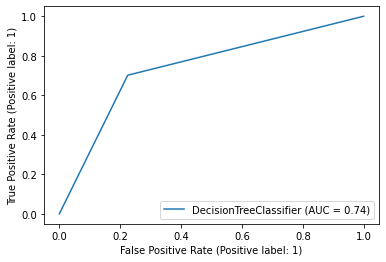

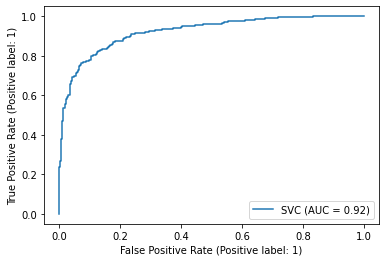

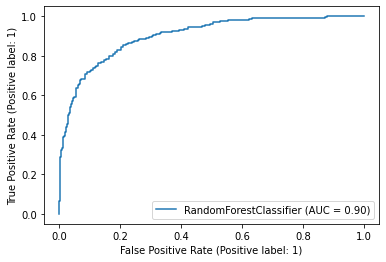

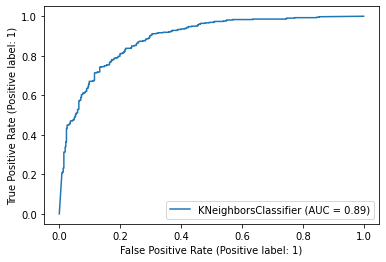

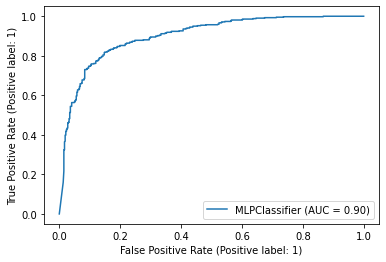

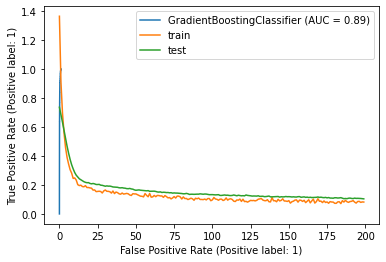

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.7230857800805988
0.6984326018808777


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7972972972972974
0.7931034482758621
0.791995148574894
0.7849529780564264


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7821363910681954
0.773667711598746


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8044692737430169
0.8025078369905956
0.7846058348851646
0.7824451410658307
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
6/6 - 1s - loss: 1.3709 - val_loss: 0.7705 - 974ms/epoch - 162ms/step
Epoch 2/200
6/6 - 0s - loss: 1.1004 - val_loss: 0.7245 - 107ms/epoch - 18ms/step
Epoch 3/200
6/6 - 0s - loss: 0.9050 - val_loss: 0.6900 - 113ms/epoch - 19ms/step
Epoch 4/200
6/6 - 0s - loss: 0.7918 - val_loss: 0.6607 - 104ms/epoch - 17ms/step
Epoch 5/200
6/6 - 0s - loss: 0.6885 - val_loss: 0.6347 - 104ms/epoch - 17ms/step
Epoch 6/200
6/6 - 0s - loss: 0.5839 - val_loss: 0.6099 - 111ms/epoch - 18ms/step
Epoch 7/200
6/6 - 0s - loss: 0.5267 - val_loss: 0.5844 - 116ms/epoch - 19ms/step
Epoch 8/200
6/6 - 0s - loss: 0.4768 - val_loss: 0.5607 - 105ms/epoch - 17ms/step
Epoch 9/200
6/6 - 0s - loss: 0.4442 - val_loss: 0.5379 - 90ms/epoch - 15ms/step
Epoch 10/200
6/6 - 0s - l

Epoch 99/200
6/6 - 0s - loss: 0.1085 - val_loss: 0.1552 - 107ms/epoch - 18ms/step
Epoch 100/200
6/6 - 0s - loss: 0.1054 - val_loss: 0.1552 - 99ms/epoch - 17ms/step
Epoch 101/200
6/6 - 0s - loss: 0.1091 - val_loss: 0.1553 - 106ms/epoch - 18ms/step
Epoch 102/200
6/6 - 0s - loss: 0.0999 - val_loss: 0.1545 - 100ms/epoch - 17ms/step
Epoch 103/200
6/6 - 0s - loss: 0.1292 - val_loss: 0.1532 - 125ms/epoch - 21ms/step
Epoch 104/200
6/6 - 0s - loss: 0.1204 - val_loss: 0.1532 - 100ms/epoch - 17ms/step
Epoch 105/200
6/6 - 0s - loss: 0.1354 - val_loss: 0.1529 - 105ms/epoch - 17ms/step
Epoch 106/200
6/6 - 0s - loss: 0.1040 - val_loss: 0.1521 - 115ms/epoch - 19ms/step
Epoch 107/200
6/6 - 0s - loss: 0.1097 - val_loss: 0.1517 - 112ms/epoch - 19ms/step
Epoch 108/200
6/6 - 0s - loss: 0.1061 - val_loss: 0.1518 - 107ms/epoch - 18ms/step
Epoch 109/200
6/6 - 0s - loss: 0.0993 - val_loss: 0.1518 - 105ms/epoch - 17ms/step
Epoch 110/200
6/6 - 0s - loss: 0.0993 - val_loss: 0.1507 - 107ms/epoch - 18ms/step
Epoch 

Epoch 198/200
6/6 - 0s - loss: 0.0919 - val_loss: 0.1320 - 117ms/epoch - 20ms/step
Epoch 199/200
6/6 - 0s - loss: 0.0871 - val_loss: 0.1315 - 113ms/epoch - 19ms/step
Epoch 200/200
6/6 - 0s - loss: 0.0766 - val_loss: 0.1305 - 114ms/epoch - 19ms/step


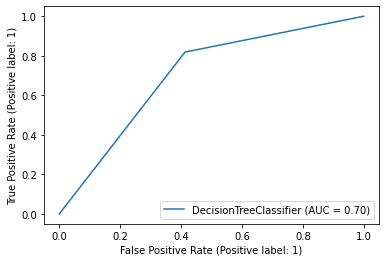

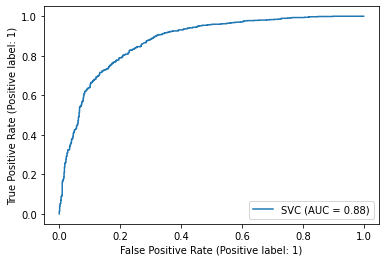

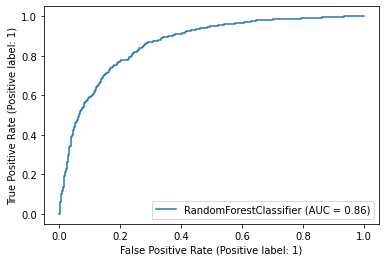

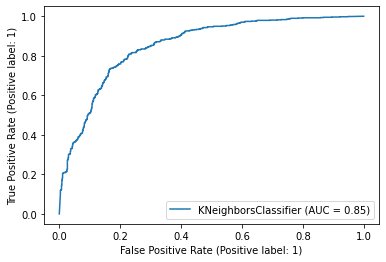

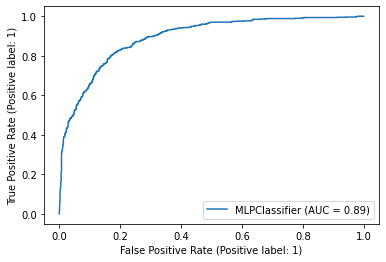

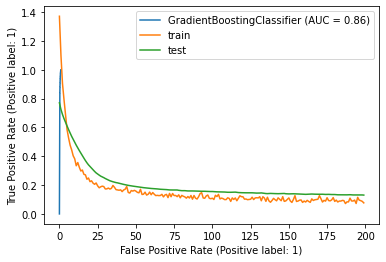

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.7279954571266326
0.7155581947743468
0.7860411899313502
0.7779097387173397


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.7687296416938112
0.7470308788598575
0.7354965585054081
0.6805225653206651
0.7733478973238667
0.753562945368171


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.7344510546241212
0.7084323040380047


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


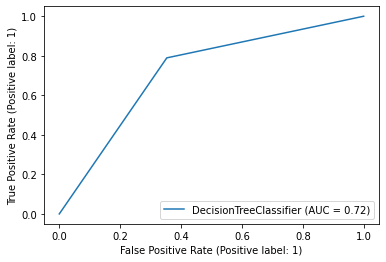

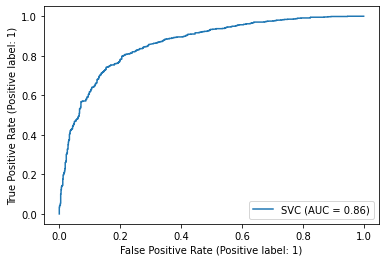

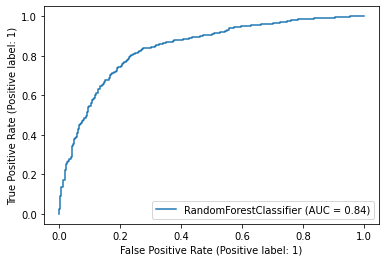

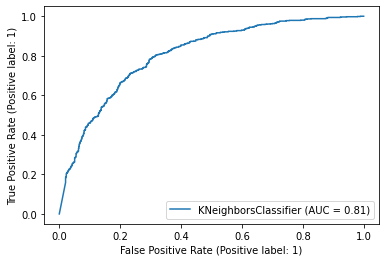

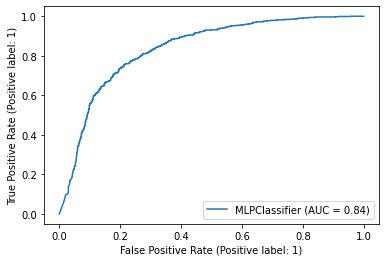

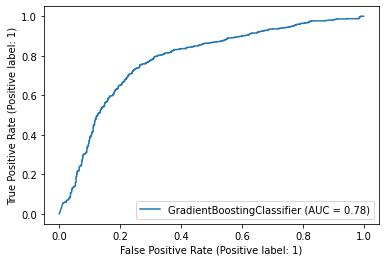

In [111]:
X_train, X_test, y_train, y_test = train_test_split(X_data2_features,Y_data2, test_size=0.2,random_state = 42)
pretrain_d2 = unsupervised_pretrain(base_algos_d2,X_train, X_test, y_train, y_test)

In [72]:
clf3_tree = tree.DecisionTreeClassifier(criterion = 'entropy',max_features = 8, max_depth=5, min_samples_leaf = 5)
clf3_svm = svm.SVC(C=1,probability=True)
clf3_rf = RandomForestClassifier(n_estimators=155, min_samples_split=10, max_features='sqrt', max_depth=45)
clf3_knn = KNeighborsClassifier(weights = 'uniform', n_neighbors=7, metric='minkowski') #Performs the best for dataset 3
clf3_mlp = MLPClassifier(solver= 'adam', learning_rate ='constant', hidden_layer_sizes= (50,50,50), alpha= 0.001, activation= 'tanh')
clf3_gb = GradientBoostingClassifier(n_estimators= 50, max_depth= 1, learning_rate= 0.1,subsample=1)

base_algos_pretrain = [clf3_tree,clf3_svm,clf3_rf,clf3_knn,clf3_mlp, clf3_gb]

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
14/14 - 1s - loss: 1.0847 - val_loss: 0.6745 - 1s/epoch - 73ms/step
Epoch 2/200
14/14 - 0s - loss: 0.7597 - val_loss: 0.6315 - 42ms/epoch - 3ms/step
Epoch 3/200
14/14 - 0s - loss: 0.5832 - val_loss: 0.5890 - 34ms/epoch - 2ms/step
Epoch 4/200
14/14 - 0s - loss: 0.4624 - val_loss: 0.5453 - 35ms/epoch - 2ms/step
Epoch 5/200
14/14 - 0s - loss: 0.4083 - val_loss: 0.5040 - 33ms/epoch - 2ms/step
Epoch 6/200
14/14 - 0s - loss: 0.3605 - val_loss: 0.4620 - 36ms/epoch - 3ms/step
Epoch 7/200
14/14 - 0s - loss: 0.3278 - val_loss: 0.4277 - 40ms/epoch - 3ms/step
Epoch 8/200
14/14 - 0s - loss: 0.3130 - val_loss: 0.3986 - 46ms/epoch - 3ms/step
Epoch 9/200
14/14 - 0s - loss: 0.2884 - val_loss: 0.3681 - 37ms/epoch - 3ms/step
Epoch 10/200
14/14 - 0s - loss: 0.2704 - val_loss: 0.3419 - 43ms/epoch - 3ms/step
Epoch 11/200
14/14 -

Epoch 99/200
14/14 - 0s - loss: 0.1194 - val_loss: 0.1266 - 40ms/epoch - 3ms/step
Epoch 100/200
14/14 - 0s - loss: 0.1171 - val_loss: 0.1260 - 38ms/epoch - 3ms/step
Epoch 101/200
14/14 - 0s - loss: 0.1256 - val_loss: 0.1239 - 37ms/epoch - 3ms/step
Epoch 102/200
14/14 - 0s - loss: 0.1267 - val_loss: 0.1242 - 38ms/epoch - 3ms/step
Epoch 103/200
14/14 - 0s - loss: 0.1207 - val_loss: 0.1236 - 40ms/epoch - 3ms/step
Epoch 104/200
14/14 - 0s - loss: 0.1356 - val_loss: 0.1223 - 37ms/epoch - 3ms/step
Epoch 105/200
14/14 - 0s - loss: 0.1124 - val_loss: 0.1230 - 36ms/epoch - 3ms/step
Epoch 106/200
14/14 - 0s - loss: 0.1265 - val_loss: 0.1205 - 38ms/epoch - 3ms/step
Epoch 107/200
14/14 - 0s - loss: 0.1264 - val_loss: 0.1207 - 39ms/epoch - 3ms/step
Epoch 108/200
14/14 - 0s - loss: 0.1171 - val_loss: 0.1215 - 36ms/epoch - 3ms/step
Epoch 109/200
14/14 - 0s - loss: 0.1211 - val_loss: 0.1203 - 35ms/epoch - 3ms/step
Epoch 110/200
14/14 - 0s - loss: 0.1197 - val_loss: 0.1207 - 38ms/epoch - 3ms/step
Epoch

Epoch 198/200
14/14 - 0s - loss: 0.1033 - val_loss: 0.0938 - 37ms/epoch - 3ms/step
Epoch 199/200
14/14 - 0s - loss: 0.1069 - val_loss: 0.0925 - 36ms/epoch - 3ms/step
Epoch 200/200
14/14 - 0s - loss: 0.1011 - val_loss: 0.0946 - 37ms/epoch - 3ms/step


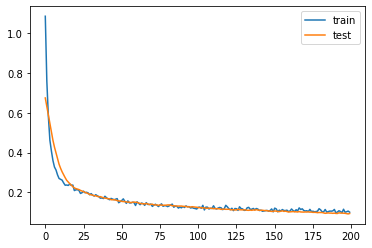

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.8125000000000001
0.76
0.7692307692307692
0.76


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8666666666666666
0.84
0.7999999999999999
0.76


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8275862068965518
0.8
0.8666666666666666
0.84
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
13/13 - 1s - loss: 1.1476 - val_loss: 0.6459 - 828ms/epoch - 64ms/step
Epoch 2/200
13/13 - 0s - loss: 0.8127 - val_loss: 0.6122 - 37ms/epoch - 3ms/step
Epoch 3/200
13/13 - 0s - loss: 0.6440 - val_loss: 0.5798 - 31ms/epoch - 2ms/step
Epoch 4/200
13/13 - 0s - loss: 0.5104 - val_loss: 0.5470 - 31ms/epoch - 2ms/step
Epoch 5/200
13/13 - 0s - loss: 0.4279 - val_loss: 0.5164 - 32ms/epoch - 2ms/step
Epoch 6/200
13/13 - 0s - loss: 0.3904 - val_loss: 0.4881 - 31ms/epoch - 2ms/step
Epoch 7/200
13/13 - 0s - loss: 0.3532 - val_loss: 0.4625 - 33ms/epoch - 3ms/step
Epoch 8/200
13/13 - 0s - loss: 0.3213 - val_loss: 0.4378 - 34ms/epoch - 3ms/step
Epoch 9/200
13/13 - 0s - loss: 0.3100 - val_loss: 0.4142 - 36ms/epoch - 3ms/step
Epoch 10/200
13/13 - 0s - loss: 0.3009 - val_loss: 0

Epoch 99/200
13/13 - 0s - loss: 0.1293 - val_loss: 0.1593 - 37ms/epoch - 3ms/step
Epoch 100/200
13/13 - 0s - loss: 0.1239 - val_loss: 0.1600 - 38ms/epoch - 3ms/step
Epoch 101/200
13/13 - 0s - loss: 0.1327 - val_loss: 0.1604 - 35ms/epoch - 3ms/step
Epoch 102/200
13/13 - 0s - loss: 0.1359 - val_loss: 0.1594 - 36ms/epoch - 3ms/step
Epoch 103/200
13/13 - 0s - loss: 0.1259 - val_loss: 0.1616 - 35ms/epoch - 3ms/step
Epoch 104/200
13/13 - 0s - loss: 0.1455 - val_loss: 0.1601 - 36ms/epoch - 3ms/step
Epoch 105/200
13/13 - 0s - loss: 0.1368 - val_loss: 0.1580 - 36ms/epoch - 3ms/step
Epoch 106/200
13/13 - 0s - loss: 0.1365 - val_loss: 0.1586 - 36ms/epoch - 3ms/step
Epoch 107/200
13/13 - 0s - loss: 0.1367 - val_loss: 0.1589 - 36ms/epoch - 3ms/step
Epoch 108/200
13/13 - 0s - loss: 0.1367 - val_loss: 0.1598 - 35ms/epoch - 3ms/step
Epoch 109/200
13/13 - 0s - loss: 0.1248 - val_loss: 0.1563 - 36ms/epoch - 3ms/step
Epoch 110/200
13/13 - 0s - loss: 0.1238 - val_loss: 0.1520 - 36ms/epoch - 3ms/step
Epoch

Epoch 198/200
13/13 - 0s - loss: 0.1010 - val_loss: 0.1285 - 40ms/epoch - 3ms/step
Epoch 199/200
13/13 - 0s - loss: 0.1139 - val_loss: 0.1244 - 36ms/epoch - 3ms/step
Epoch 200/200
13/13 - 0s - loss: 0.1146 - val_loss: 0.1245 - 36ms/epoch - 3ms/step


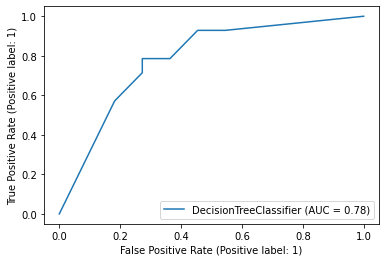

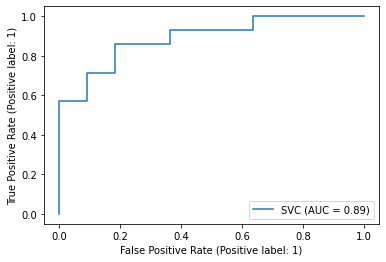

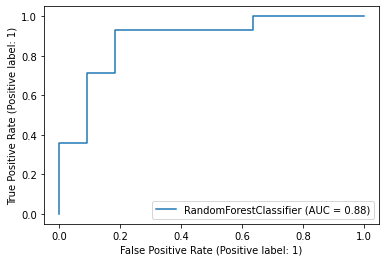

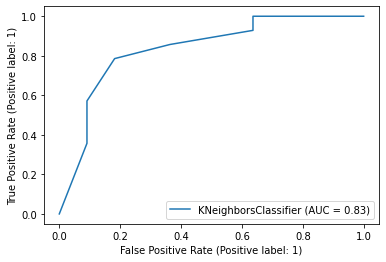

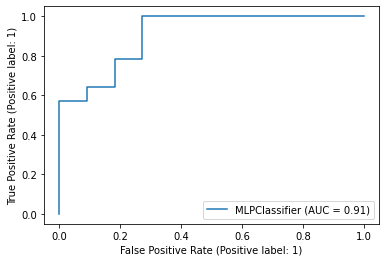

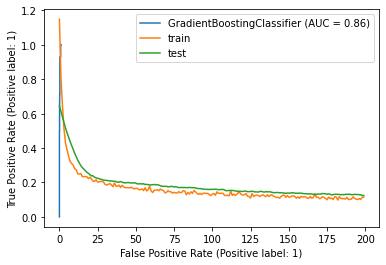

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.8260869565217391
0.8367346938775511
0.7843137254901961
0.7755102040816326


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8333333333333334
0.8367346938775511
0.7924528301886793
0.7755102040816326


C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.8846153846153847
0.8775510204081632
0.816326530612245
0.8163265306122449
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
8/8 - 1s - loss: 1.1131 - val_loss: 0.6245 - 741ms/epoch - 93ms/step
Epoch 2/200
8/8 - 0s - loss: 0.9053 - val_loss: 0.6047 - 40ms/epoch - 5ms/step
Epoch 3/200
8/8 - 0s - loss: 0.7431 - val_loss: 0.5870 - 31ms/epoch - 4ms/step
Epoch 4/200
8/8 - 0s - loss: 0.6392 - val_loss: 0.5689 - 29ms/epoch - 4ms/step
Epoch 5/200
8/8 - 0s - loss: 0.5431 - val_loss: 0.5504 - 30ms/epoch - 4ms/step
Epoch 6/200
8/8 - 0s - loss: 0.4826 - val_loss: 0.5292 - 28ms/epoch - 4ms/step
Epoch 7/200
8/8 - 0s - loss: 0.4392 - val_loss: 0.5084 - 30ms/epoch - 4ms/step
Epoch 8/200
8/8 - 0s - loss: 0.3857 - val_loss: 0.4884 - 30ms/epoch - 4ms/step
Epoch 9/200
8/8 - 0s - loss: 0.3738 - val_loss: 0.4690 - 28ms/epoch - 3ms/step
Epoch 10/200
8/8 - 0s - loss: 0.3361 - val

Epoch 101/200
8/8 - 0s - loss: 0.1216 - val_loss: 0.1508 - 37ms/epoch - 5ms/step
Epoch 102/200
8/8 - 0s - loss: 0.1408 - val_loss: 0.1505 - 32ms/epoch - 4ms/step
Epoch 103/200
8/8 - 0s - loss: 0.1281 - val_loss: 0.1496 - 34ms/epoch - 4ms/step
Epoch 104/200
8/8 - 0s - loss: 0.1239 - val_loss: 0.1494 - 35ms/epoch - 4ms/step
Epoch 105/200
8/8 - 0s - loss: 0.1299 - val_loss: 0.1492 - 34ms/epoch - 4ms/step
Epoch 106/200
8/8 - 0s - loss: 0.1310 - val_loss: 0.1495 - 33ms/epoch - 4ms/step
Epoch 107/200
8/8 - 0s - loss: 0.1386 - val_loss: 0.1483 - 33ms/epoch - 4ms/step
Epoch 108/200
8/8 - 0s - loss: 0.1311 - val_loss: 0.1478 - 33ms/epoch - 4ms/step
Epoch 109/200
8/8 - 0s - loss: 0.1445 - val_loss: 0.1477 - 34ms/epoch - 4ms/step
Epoch 110/200
8/8 - 0s - loss: 0.1362 - val_loss: 0.1469 - 34ms/epoch - 4ms/step
Epoch 111/200
8/8 - 0s - loss: 0.1463 - val_loss: 0.1456 - 32ms/epoch - 4ms/step
Epoch 112/200
8/8 - 0s - loss: 0.1419 - val_loss: 0.1450 - 32ms/epoch - 4ms/step
Epoch 113/200
8/8 - 0s - los

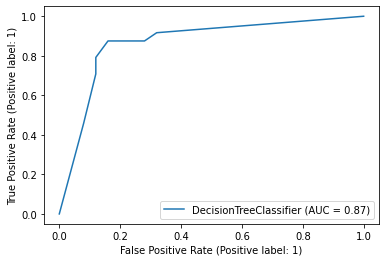

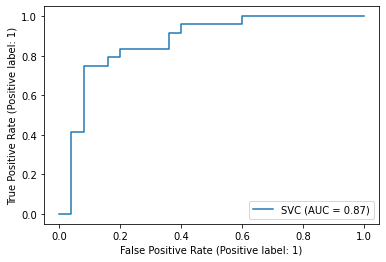

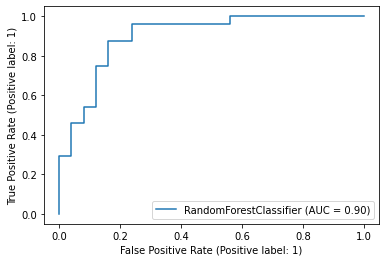

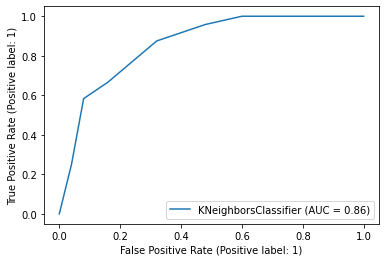

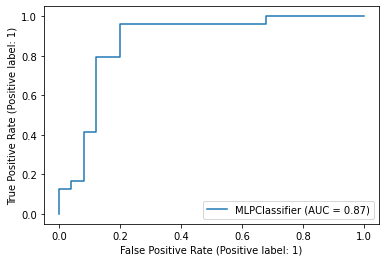

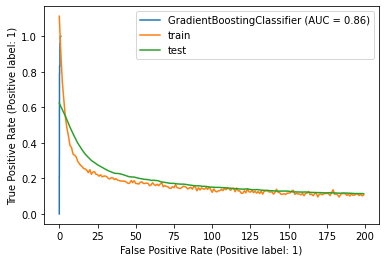

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.7941176470588236
0.768595041322314
0.8296296296296296
0.8099173553719008


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.8029197080291971
0.7768595041322314
0.8368794326241135
0.8099173553719008


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: F

0.8
0.7768595041322314
0.8472222222222222
0.8181818181818182
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
Epoch 1/200
2/2 - 1s - loss: 1.2708 - val_loss: 0.6263 - 765ms/epoch - 383ms/step
Epoch 2/200
2/2 - 0s - loss: 1.1367 - val_loss: 0.6208 - 32ms/epoch - 16ms/step
Epoch 3/200
2/2 - 0s - loss: 1.0472 - val_loss: 0.6154 - 30ms/epoch - 15ms/step
Epoch 4/200
2/2 - 0s - loss: 0.9641 - val_loss: 0.6102 - 27ms/epoch - 13ms/step
Epoch 5/200
2/2 - 0s - loss: 0.9940 - val_loss: 0.6048 - 28ms/epoch - 14ms/step
Epoch 6/200
2/2 - 0s - loss: 0.8653 - val_loss: 0.5995 - 26ms/epoch - 13ms/step
Epoch 7/200
2/2 - 0s - loss: 0.8187 - val_loss: 0.5942 - 26ms/epoch - 13ms/step
Epoch 8/200
2/2 - 0s - loss: 0.7677 - val_loss: 0.5892 - 27ms/epoch - 14ms/step
Epoch 9/200
2/2 - 0s - loss: 0.7568 - val_loss: 0.5842 - 28ms/epoch - 14ms/step
Epoch 10/200
2/2 - 0s - loss: 0.7067 - val_loss

Epoch 100/200
2/2 - 0s - loss: 0.1497 - val_loss: 0.3403 - 30ms/epoch - 15ms/step
Epoch 101/200
2/2 - 0s - loss: 0.1349 - val_loss: 0.3392 - 30ms/epoch - 15ms/step
Epoch 102/200
2/2 - 0s - loss: 0.1274 - val_loss: 0.3381 - 34ms/epoch - 17ms/step
Epoch 103/200
2/2 - 0s - loss: 0.1568 - val_loss: 0.3368 - 28ms/epoch - 14ms/step
Epoch 104/200
2/2 - 0s - loss: 0.1495 - val_loss: 0.3351 - 38ms/epoch - 19ms/step
Epoch 105/200
2/2 - 0s - loss: 0.1577 - val_loss: 0.3331 - 38ms/epoch - 19ms/step
Epoch 106/200
2/2 - 0s - loss: 0.1524 - val_loss: 0.3313 - 40ms/epoch - 20ms/step
Epoch 107/200
2/2 - 0s - loss: 0.1424 - val_loss: 0.3295 - 34ms/epoch - 17ms/step
Epoch 108/200
2/2 - 0s - loss: 0.1391 - val_loss: 0.3281 - 36ms/epoch - 18ms/step
Epoch 109/200
2/2 - 0s - loss: 0.1410 - val_loss: 0.3266 - 32ms/epoch - 16ms/step
Epoch 110/200
2/2 - 0s - loss: 0.1263 - val_loss: 0.3251 - 30ms/epoch - 15ms/step
Epoch 111/200
2/2 - 0s - loss: 0.1391 - val_loss: 0.3245 - 30ms/epoch - 15ms/step
Epoch 112/200
2/

Epoch 200/200
2/2 - 0s - loss: 0.1305 - val_loss: 0.2788 - 33ms/epoch - 17ms/step


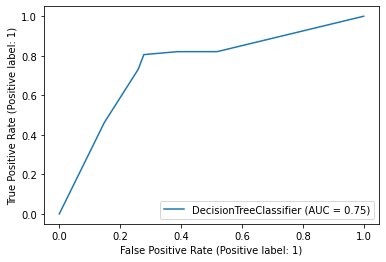

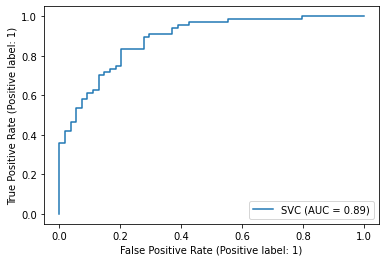

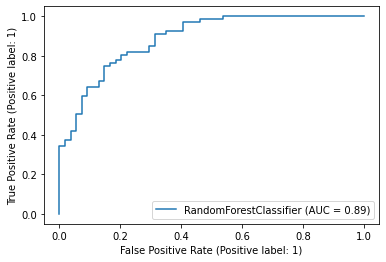

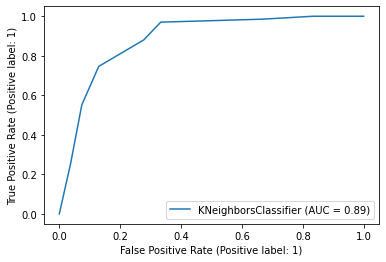

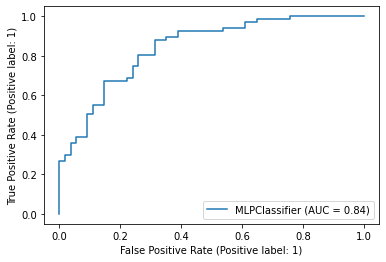

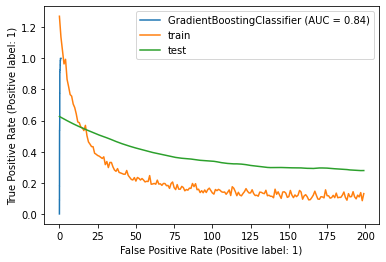

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.7340823970037454
0.6743119266055045
0.7179487179487181
0.6972477064220184


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.7413793103448276
0.7247706422018348
0.7956204379562043
0.7431192660550459
0.6607142857142857
0.6513761467889908
0.689655172413793
0.6697247706422018
('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Epoch 1/200
1/1 - 1s - loss: 1.4058 - val_loss: 0.6162 - 770ms/epoch - 770ms/step
Epoch 2/200
1/1 - 0s - loss: 1.3099 - val_loss: 0.6137 - 30ms/epoch - 30ms/step
Epoch 3/200
1/1 - 0s - loss: 1.2236 - val_loss: 0.6111 - 32ms/epoch - 32ms/step
Epoch 4/200
1/1 - 0s - loss: 1.1497 - val_loss: 0.6086 - 28ms/epoch - 28ms/step
Epoch 5/200
1/1 - 0s - loss: 1.0846 - val_loss: 0.6060 - 28ms/epoch - 28ms/step
Epoch 6/200
1/1 - 0s - loss: 1.0228 - val_loss: 0.6034 - 29ms/epoch - 29ms/step
Epoch 7/200
1/1 - 0s - loss: 0.9611 - val_loss: 0.6009 - 27ms/epoch - 27ms/step
Epoch 8/200
1/1 - 0s - loss: 0.9024 - val_loss: 0.5983 - 27ms/epoch - 27ms/step
Epoch 9/200
1/1 - 0s - loss: 0.8479 - val_loss: 0.5958 - 30ms/epoch - 30ms/step
Epoch 10/200
1/1 - 0s - loss: 0.7973 - val_loss: 0.5932 - 29ms/epoch - 29ms/step
Epoch 11/200
1/1 - 0s - loss: 0.7511 - val_loss: 0.5908 - 28ms/epoch - 28ms/step
Epoch 12/200
1/1 - 0s - loss: 0.7100 - val_loss: 0.5883 - 31ms/epoch - 31ms/step
Epoch 13/200
1/1 - 0s - loss: 0.672

Epoch 103/200
1/1 - 0s - loss: 0.0680 - val_loss: 0.4433 - 39ms/epoch - 39ms/step
Epoch 104/200
1/1 - 0s - loss: 0.0669 - val_loss: 0.4426 - 34ms/epoch - 34ms/step
Epoch 105/200
1/1 - 0s - loss: 0.0657 - val_loss: 0.4418 - 20ms/epoch - 20ms/step
Epoch 106/200
1/1 - 0s - loss: 0.0646 - val_loss: 0.4411 - 32ms/epoch - 32ms/step
Epoch 107/200
1/1 - 0s - loss: 0.0634 - val_loss: 0.4405 - 18ms/epoch - 18ms/step
Epoch 108/200
1/1 - 0s - loss: 0.0623 - val_loss: 0.4398 - 29ms/epoch - 29ms/step
Epoch 109/200
1/1 - 0s - loss: 0.0612 - val_loss: 0.4392 - 35ms/epoch - 35ms/step
Epoch 110/200
1/1 - 0s - loss: 0.0601 - val_loss: 0.4386 - 27ms/epoch - 27ms/step
Epoch 111/200
1/1 - 0s - loss: 0.0590 - val_loss: 0.4380 - 27ms/epoch - 27ms/step
Epoch 112/200
1/1 - 0s - loss: 0.0580 - val_loss: 0.4374 - 29ms/epoch - 29ms/step
Epoch 113/200
1/1 - 0s - loss: 0.0569 - val_loss: 0.4368 - 20ms/epoch - 20ms/step
Epoch 114/200
1/1 - 0s - loss: 0.0559 - val_loss: 0.4363 - 32ms/epoch - 32ms/step
Epoch 115/200
1/

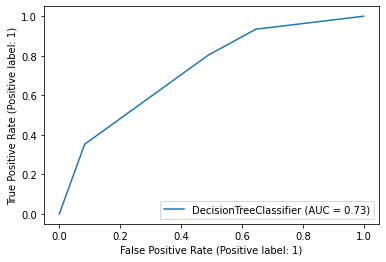

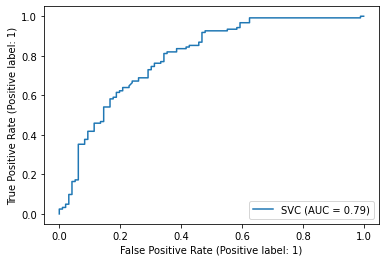

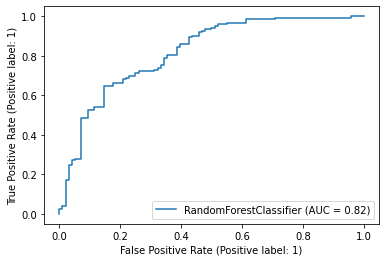

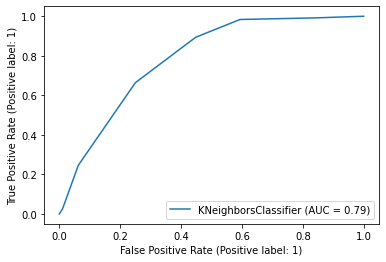

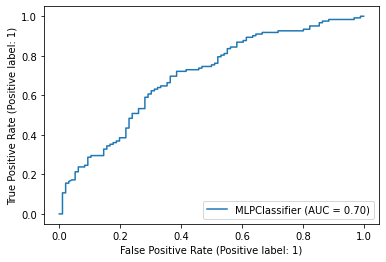

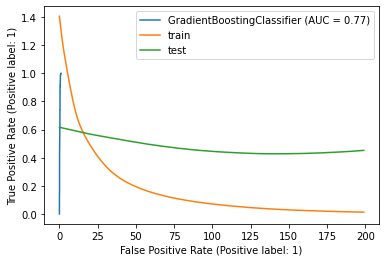

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')
0.48571428571428565
0.5304347826086957
0.6692307692307692
0.6260869565217392


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(

0.5964912280701755
0.5
0.759322033898305
0.691304347826087
0.6147186147186147
0.6130434782608696


C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Python-Workspace\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


0.6209677419354839
0.591304347826087


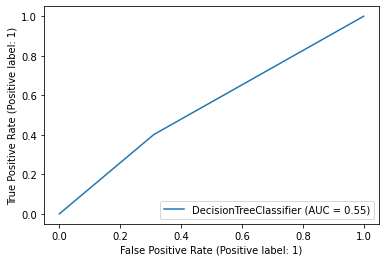

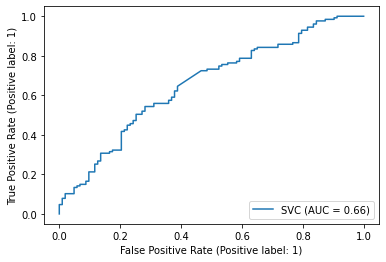

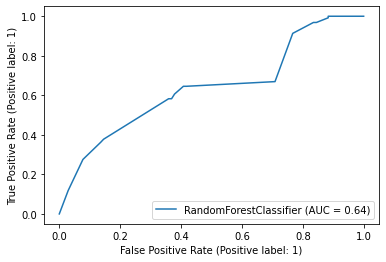

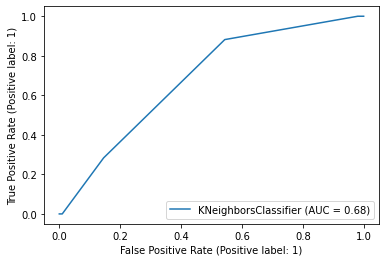

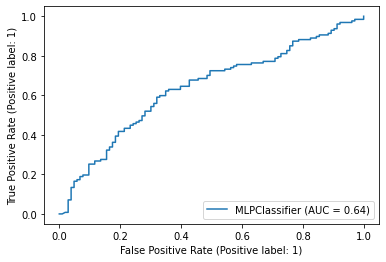

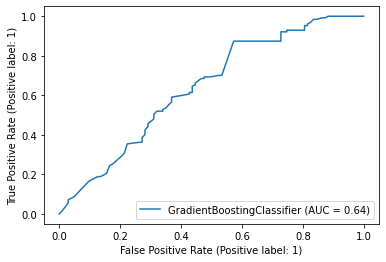

In [108]:
X_train, X_test, y_train, y_test = train_test_split(X_data3_features,Y_data3, test_size=0.2,random_state = 42)
pretrain_d3 = unsupervised_pretrain(base_algos_pretrain,X_train, X_test, y_train, y_test)

In [110]:
pretrain_d3[0] #represents metrics for each algorithm
pretrain_d3[1] #each outer list represents level of unlabelled data
len(pretrain_d3) #ie. 5 different levels of unlabelled data

pretrain_d3

[[[0.8125000000000001, 0.76, 9.583867311477661],
  [0.7692307692307692, 0.76, 9.604055643081665],
  [0.8666666666666666, 0.84, 9.731593370437622],
  [0.7999999999999999, 0.76, 9.764765977859497],
  [0.8275862068965518, 0.8, 10.413366794586182],
  [0.8666666666666666, 0.84, 10.441238164901733]],
 [[0.8260869565217391, 0.8367346938775511, 9.050915718078613],
  [0.7843137254901961, 0.7755102040816326, 9.069398880004883],
  [0.8333333333333334, 0.8367346938775511, 9.205346822738647],
  [0.7924528301886793, 0.7755102040816326, 9.242650985717773],
  [0.8846153846153847, 0.8775510204081632, 9.859874248504639],
  [0.816326530612245, 0.8163265306122449, 9.882631301879883]],
 [[0.7941176470588236, 0.768595041322314, 9.152975082397461],
  [0.8296296296296296, 0.8099173553719008, 9.167640209197998],
  [0.8029197080291971, 0.7768595041322314, 9.309890270233154],
  [0.8368794326241135, 0.8099173553719008, 9.348544836044312],
  [0.8, 0.7768595041322314, 9.828567266464233],
  [0.8472222222222222, 0.81

In [115]:
final_results_pretraining = [pretrain_d1,pretrain_under,pretrain_over,pretrain_d2,pretrain_d3]

In [116]:
final_results_pretraining

[[[[0.5567765567765569, 0.8774062816616008, 130.68332147598267],
   [0.49549549549549543, 0.8865248226950354, 134.645521402359],
   [0.5126050420168068, 0.8824721377912867, 137.0932674407959],
   [0.5106382978723405, 0.8834853090172239, 137.21406292915344],
   [0.5614035087719298, 0.8986828774062816, 147.9339668750763],
   [0.5149253731343284, 0.8682877406281662, 156.70368909835815]],
  [[0.45982142857142866, 0.8773441459706032, 126.90684962272644],
   [0.5319148936170213, 0.8884946781550938, 130.1175844669342],
   [0.5245901639344263, 0.8824125696908262, 132.71454668045044],
   [0.5469387755102042, 0.8874809934110491, 132.8885588645935],
   [0.5692007797270955, 0.8879878357830715, 142.06433868408203],
   [0.5437616387337056, 0.8758236188545362, 149.2827353477478]],
  [[0.5456053067993365, 0.8888888888888888, 113.7230007648468],
   [0.5400696864111498, 0.8929440389294404, 114.97738027572632],
   [0.5716573258606886, 0.8915247364152473, 117.60478377342224],
   [0.5442622950819672, 0.887

In [62]:
final_results_baseline = [baseline_d1,baseline_under,baseline_over,baseline_d2,baseline_d3]

In [179]:
#Collect data for statistical analysis!

# Step:1 Get the best base algo for each case based on F score
# best_baseline = []

# for i in final_results_baseline:
#     a = max(i, key=lambda x: x[1])
#     best_baseline.append(a)

# #Step 2: Get the best SSL for each dataset!

# #Step 3: Get the best SSL per level_of_unlabelled

In [178]:
# best_baseline #1 - F1, acc, time for each dataset

### The .txt file for each algorithm is parsed to get the data that we need to perform analysis

In [365]:
# from pprint import pprint


# # Collect data for every level of unlabelled data
# # 5 - Dataset, 6 - Algorithm - 
# # 10% unlabelled dataset

# # SSL
# self_train[0] #First dataset
# # self_train[0][0] #First dataset, First algo
# # self_train[0][0][0] #First dataset, first algo, first level_labelled

# temp = []
# for i in self_train[0]:
#     pprint(i)
#     temp.append(i)
    
# pprint(temp)
# for i in temp:
#     a = max(i[0], key=lambda x: x[1])

    

In [176]:
# for i in pretrain[0]:
#     a = max(i, key=lambda x: x[1])
#     print(a)

In [337]:
self_training_10 = [0.8909164639091647,0.9341723136495643,0.9201247301511154,0.9009009009009009,0.9016393442622951]
self_training_10_time = [191.9153995513916, 48.36803078651428, 33.72533988952637, 1.5616037845611572, 0.03983640670776367]


semi_boost_10 = [0.8864557988645579,0.9351403678606002,0.8603981770208683,0.9054054054054054,0.8360655737704918]
semi_boost_10_time = [100.56393051147461, 158.26010084152222, 532.9756264686584, 9.698519945144653, 0.16803479194641113]

pretraining_10 = [0.8986828774062816,0.937046004842615,0.9016786570743405,0.8932584269662921,0.84]
pretraining_10_time = [147.9339668750763, 127.51731204986572,283.73779034614563,40.892606258392334,9.731593370437622]

self_training_20 = [0.8868613138686131,0.9351403678606002,0.9196449988006716,0.8986486486486487,0.9016393442622951]
self_training_20_time = [19.31398034095764, 41.910906076431274, 46.73220419883728, 5.460730075836182, 0.05055999755859375]



semi_boost_20 = [0.8811841038118411,0.9351403678606002,0.8637562964739746,0.8648648648648649,0.8360655737704918]
semi_boost_20_time = [183.35224676132202, 98.5536367893219, 273.62074160575867, 12.352439641952515, 0.20391321182250977]

pretraining_20 = [0.8884946781550938,0.9200968523002422,0.8968515742128935,0.8647887323943662,0.8775510204081632]
pretraining_20_time = [130.1175844669342,116.43825435638428,230.58418083190918,34.960954427719116,9.859874248504639]

self_training_50 = [0.8856447688564477,0.9332042594385286,0.9078915807147997,0.8918918918918919,0.9016393442622951]
self_training_50_time = [17.664957523345947, 28.088576793670654, 22.53720188140869, 8.39539361000061, 0.08089971542358398]


semi_boost_50 = [0.3142741281427413,0.2536302032913843, 0.5569680978651955,0.5788288288288288,0.7049180327868853]
semi_boost_50_time = [98.46690487861633, 212.50470781326294, 753.301849603653, 14.128205299377441, 0.2531700134277344]

pretraining_50 = [0.8935523114355232,0.9242130750605327,0.8739505876709043,0.8442437923250564,0.8181818181818182]
pretraining_50_time = [123.97479581832886,102.87192678451538,195.1131637096405,30.06281542778015,9.853073120117188]

self_training_90 = [0.8815896188158961,0.9283639883833494,0.8791076996881746,0.8536036036036037,0.9016393442622951]
self_training_90_time = [162.18946862220764, 127.64382910728455, 27.143039226531982, 1.2347633838653564, 0.0581209659576416]


semi_boost_90 = [0.17639902676399027,0.18441432720232334,0.5037179179659391,0.45495495495495497,0.5245901639344263]
semi_boost_90_time = [221.80179286003113, 146.1112504005432, 1339.0493836402893, 8.696348428726196, 0.1615769863128662]

pretraining_90 = [0.8900653300292859,0.9168684422921711,0.8336220682302772,0.8025078369905956,0.7431192660550459]
pretraining_90_time = [89.69333386421204,75.54245352745056,146.51365089416504,24.157747983932495,8.07295560836792]



self_training_95 = [0.8832116788321168,0.9269119070667957,0.8680738786279684,0.8243243243243243,0.8852459016393442]
self_training_95_time = [103.41419506072998, 9.452633619308472, 5.73777437210083, 1.2297728061676025, 0.03751873970031738]


semi_boost_95 = [0.1816707218167072,0.19264278799612777,0.5046773806668265,0.45495495495495497,0.5245901639344263]
semi_boost_95_time = [156.0967698097229, 100.9183304309845, 422.99463272094727, 6.455407381057739, 0.12700867652893066]

pretraining_95 = [0.8881656173300608,0.899452019880209,0.8209821992172706,0.7779097387173397,0.691304347826087]
pretraining_95_time = [85.574462890625,71.68608832359314,138.9577498435974,23.66098427772522,8.002392053604126]

f1_baseline = [0.8872668288726683,0.9356243949661182,0.9222835212281123,0.9054054054054054,0.8852459016393442]
boost_baseline = [0.8345465676,0.93232134345,0.9268222920140156,0.8990177630190438,0.8567729047439684]
pretrain_baseline = [0.8795620437956204,0.9273959341723137,0.8927800431758215,0.9009009009009009,0.8524590163934426]

### Impact of level of unlabelled data on runtime

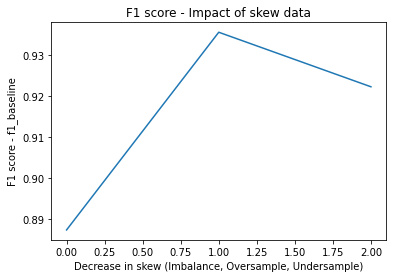

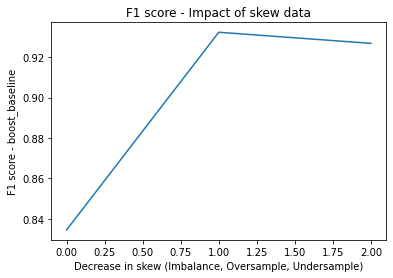

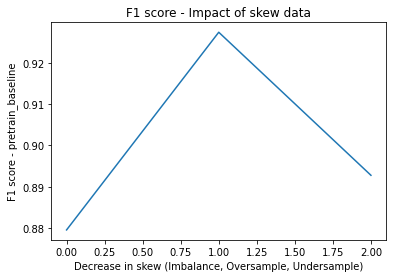

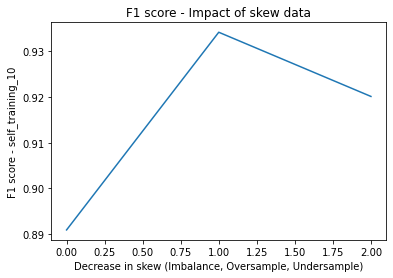

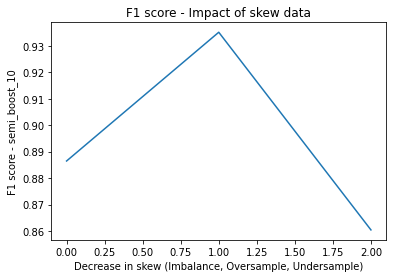

...

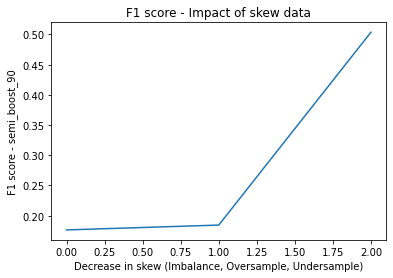

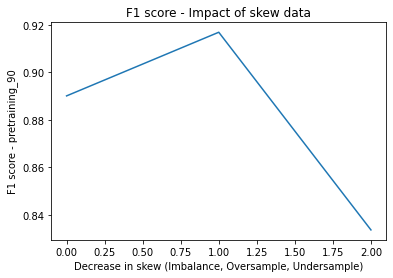

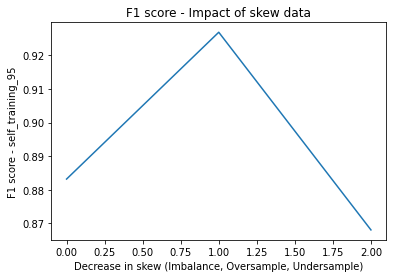

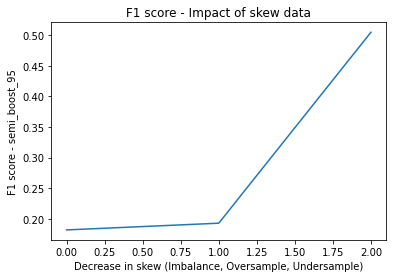

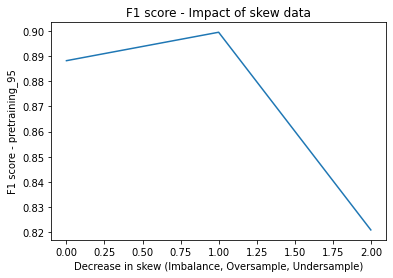

In [331]:
m_list = [f1_baseline,boost_baseline,pretrain_baseline,self_training_10,semi_boost_10,pretraining_10,self_training_20,semi_boost_20,pretraining_20,self_training_50,semi_boost_50,pretraining_50,self_training_90,semi_boost_90,pretraining_90,self_training_95,semi_boost_95,pretraining_95]
m_list_label = ["f1_baseline","boost_baseline","pretrain_baseline","self_training_10","semi_boost_10","pretraining_10","self_training_20","semi_boost_20","pretraining_20","self_training_50","semi_boost_50","pretraining_50","self_training_90","semi_boost_90","pretraining_90","self_training_95","semi_boost_95","pretraining_95"]
def plot_skew_impact(m_list):
    for i, j in zip(m_list, m_list_label):
        plt.plot([0,1,2],i[:3])
        plt.title('F1 score - Impact of skew data')
        plt.xlabel('Decrease in skew (Imbalance, Oversample, Undersample)')
        plt.ylabel("F1 score - {}".format(str(j)))
        plt.show()
plot_skew_impact(m_list)

In [338]:
self_time = [self_training_10_time,self_training_20_time,self_training_50_time,self_training_90_time,self_training_95_time]
sem_time = [semi_boost_10_time,semi_boost_20_time,semi_boost_50_time,semi_boost_90_time,semi_boost_95_time]
pre_list = [pretraining_10_time,pretraining_20_time,pretraining_50_time,pretraining_90_time,pretraining_95_time]
for i in range(len(pre_list[0])):
    for j in range(len(pre_list)):
        print(pre_list[j][i])
# self[2][0]

147.9339668750763
130.1175844669342
123.97479581832886
89.69333386421204
85.574462890625
127.51731204986572
116.43825435638428
102.87192678451538
75.54245352745056
71.68608832359314
283.73779034614563
230.58418083190918
195.1131637096405
146.51365089416504
138.9577498435974
40.892606258392334
34.960954427719116
30.06281542778015
24.157747983932495
23.66098427772522
9.731593370437622
9.859874248504639
9.853073120117188
8.07295560836792
8.002392053604126


## Impact of unlabelled data in F1 score (SSL performance)

### Self training

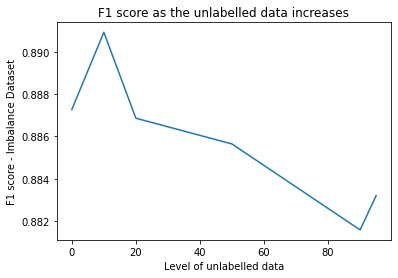

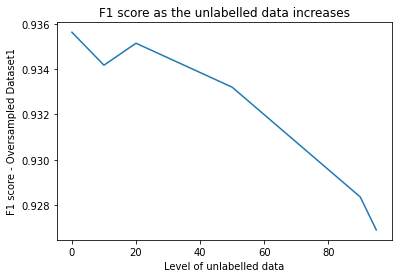

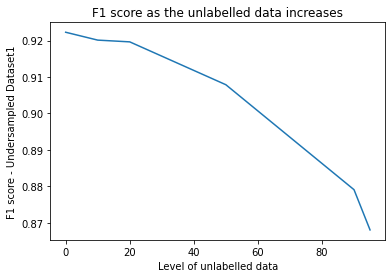

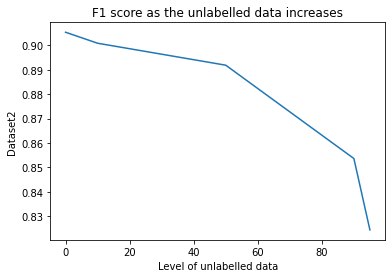

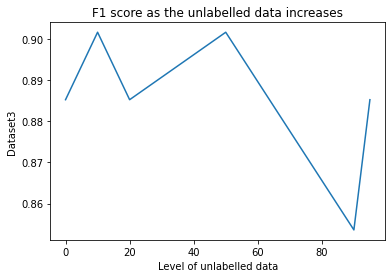

In [319]:
self = [f1_baseline,self_training_10,self_training_20,self_training_50,self_training_90,self_training_95]
semi = [boost_baseline,semi_boost_10,semi_boost_20,semi_boost_50,semi_boost_90,semi_boost_95]
pretr = [pretrain_baseline,pretraining_10,pretraining_20,pretraining_50,pretraining_90,pretraining_95]


self_training = [0.8872668288726683,0.8909164639091647,0.8868613138686131,0.8856447688564477,0.8815896188158961,0.8832116788321168,0.9356243949661182,0.9341723136495643,0.9351403678606002,0.9332042594385286,0.9283639883833494,0.9269119070667957,0.9222835212281123,0.9201247301511154,0.9196449988006716,0.9078915807147997,0.8791076996881746,0.8680738786279684,0.9054054054054054,0.9009009009009009,0.8986486486486487,0.8918918918918919,0.8536036036036037,0.8243243243243243,0.8852459016393442,0.9016393442622951,0.8852459016393442,0.9016393442622951,0.8536036036036037,0.8852459016393442]
semi_boost = [0.8345465676,0.8864557988645579,0.8811841038118411,0.3142741281427413,0.17639902676399027,0.1816707218167072,0.93232134345,0.9351403678606002,0.9351403678606002,0.2536302032913843,0.18441432720232334,0.19264278799612777,0.9268222920140156,0.8603981770208683,0.8637562964739746,0.5569680978651955,0.5037179179659391,0.5046773806668265,0.8990177630190438,0.9054054054054054,0.8648648648648649,0.5788288288288288,0.45495495495495497,0.45495495495495497,0.8567729047439684,0.8360655737704918,0.8360655737704918,0.7049180327868853,0.5245901639344263,0.5245901639344263]
pretraining = [0.8795620437956204,0.8986828774062816,0.8884946781550938,0.8935523114355232,0.8900653300292859,0.8881656173300608,0.9273959341723137,0.937046004842615,0.9200968523002422,0.9242130750605327,0.9168684422921711,0.899452019880209,0.8927800431758215,0.9016786570743405,0.8968515742128935,0.8739505876709043,0.8336220682302772,0.8209821992172706,0.9009009009009009,0.8932584269662921,0.8647887323943662,0.8442437923250564,0.8025078369905956,0.7779097387173397,0.8524590163934426,0.84,0.8775510204081632,0.8181818181818182,0.7431192660550459,0.691304347826087]



plt.plot([0,10,20,50,90,95],self_training[:6])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Imbalance Dataset')


plt.show()

plt.plot([0,10,20,50,90,95],self_training[6:12])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Oversampled Dataset1')
plt.show()

plt.plot([0,10,20,50,90,95],self_training[12:18])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Undersampled Dataset1')
plt.show()


plt.plot([0,10,20,50,90,95],self_training[18:24])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Dataset2')
plt.show()


plt.plot([0,10,20,50,90,95],self_training[24:30])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Dataset3')
plt.show()


### Semi supervised ensemble

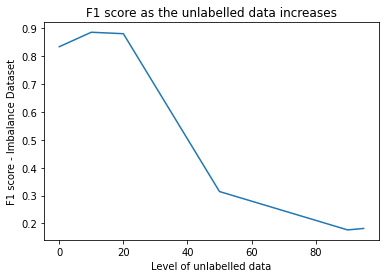

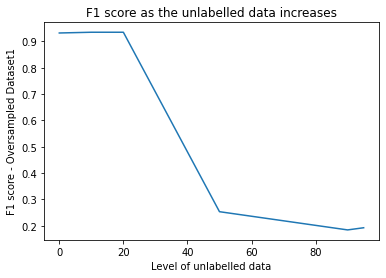

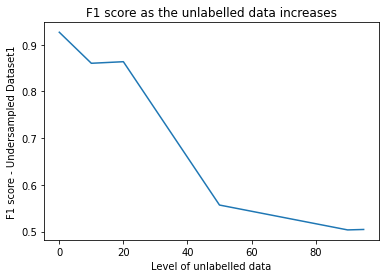

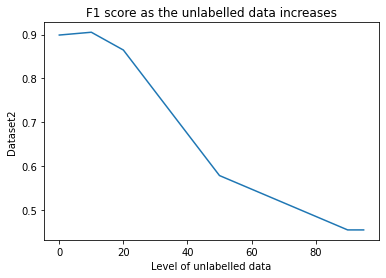

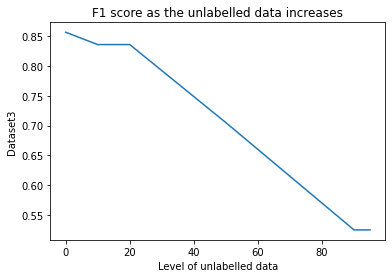

In [321]:
plt.plot([0,10,20,50,90,95],semi_boost[:6])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Imbalance Dataset')


plt.show()

plt.plot([0,10,20,50,90,95],semi_boost[6:12])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Oversampled Dataset1')
plt.show()

plt.plot([0,10,20,50,90,95],semi_boost[12:18])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Undersampled Dataset1')
plt.show()


plt.plot([0,10,20,50,90,95],semi_boost[18:24])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Dataset2')
plt.show()


plt.plot([0,10,20,50,90,95],semi_boost[24:30])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Dataset3')
plt.show()

### Unsupervised Pretraining

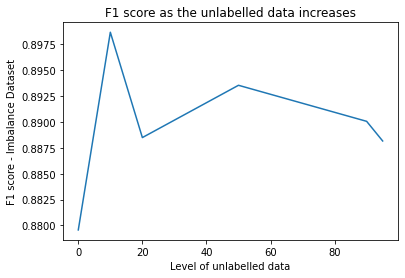

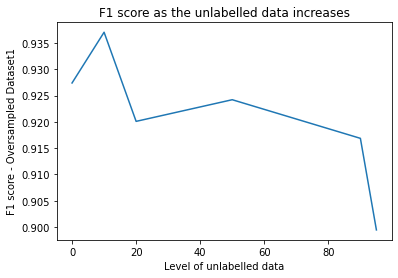

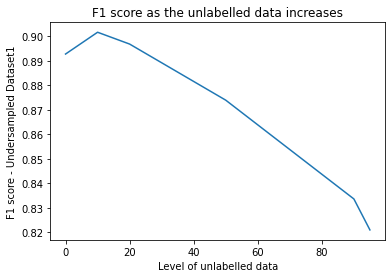

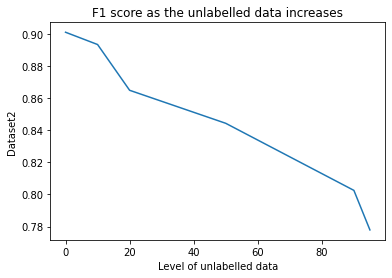

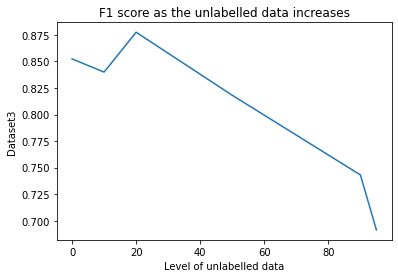

In [322]:
plt.plot([0,10,20,50,90,95],pretraining[:6])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Imbalance Dataset')


plt.show()

plt.plot([0,10,20,50,90,95],pretraining[6:12])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Oversampled Dataset1')
plt.show()

plt.plot([0,10,20,50,90,95],pretraining[12:18])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('F1 score - Undersampled Dataset1')
plt.show()


plt.plot([0,10,20,50,90,95],pretraining[18:24])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Dataset2')
plt.show()


plt.plot([0,10,20,50,90,95],pretraining[24:30])
plt.title('F1 score as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Dataset3')
plt.show()

## Impact of unlabelled data in training time

In [340]:
self_training_time = [191.9153995513916,19.31398034095764,17.664957523345947,162.18946862220764,103.41419506072998,48.36803078651428,41.910906076431274,28.088576793670654,127.64382910728455,9.452633619308472,33.72533988952637,46.73220419883728,22.53720188140869,27.143039226531982,5.73777437210083,1.5616037845611572,5.460730075836182,8.39539361000061,1.2347633838653564,1.2297728061676025,0.03983640670776367,0.05055999755859375,0.08089971542358398,0.0581209659576416,0.03751873970031738]
semi_boost_time = [100.56393051147461,183.35224676132202,98.46690487861633,221.80179286003113,156.0967698097229,158.26010084152222,98.5536367893219,212.50470781326294,146.1112504005432,100.9183304309845,532.9756264686584,273.62074160575867,753.301849603653,1339.0493836402893,422.99463272094727,9.698519945144653,12.352439641952515,14.128205299377441,8.696348428726196,6.455407381057739,0.16803479194641113,0.20391321182250977,0.2531700134277344,0.1615769863128662,0.12700867652893066]
pretraining_time = [147.9339668750763,130.1175844669342,123.97479581832886,89.69333386421204,85.574462890625,127.51731204986572,116.43825435638428,102.87192678451538,75.54245352745056,71.68608832359314,283.73779034614563,230.58418083190918,195.1131637096405,146.51365089416504,138.9577498435974,40.892606258392334,34.960954427719116,30.06281542778015,24.157747983932495,23.66098427772522,9.731593370437622,9.859874248504639,9.853073120117188,8.07295560836792,8.002392053604126]


### Self training

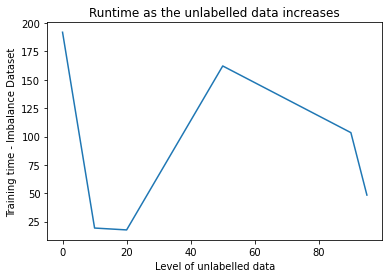

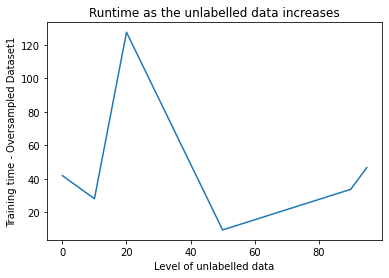

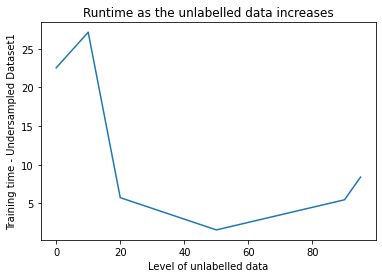

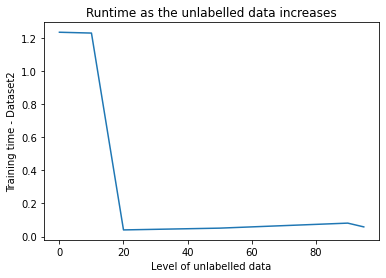

In [351]:
plt.plot([0,10,20,50,90,95],self_training_time[:6])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Imbalance Dataset')


plt.show()

plt.plot([0,10,20,50,90,95],self_training_time[6:12])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Oversampled Dataset1')
plt.show()

plt.plot([0,10,20,50,90,95],self_training_time[12:18])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Undersampled Dataset1')
plt.show()


plt.plot([0,10,20,50,90,95],self_training_time[18:24])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Dataset2')
plt.show()

### Semi supervised ensemble

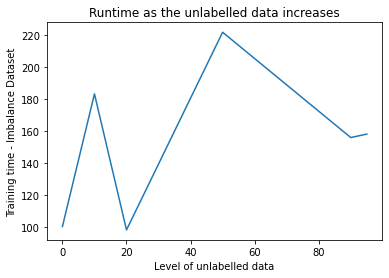

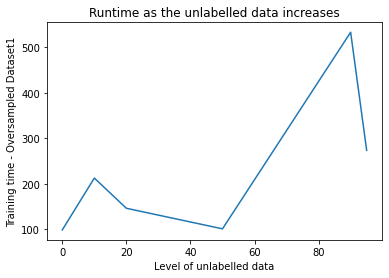

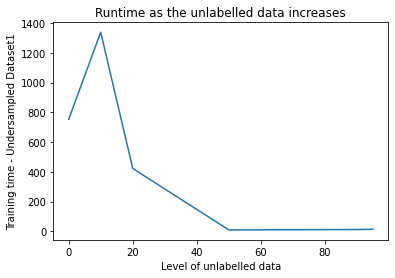

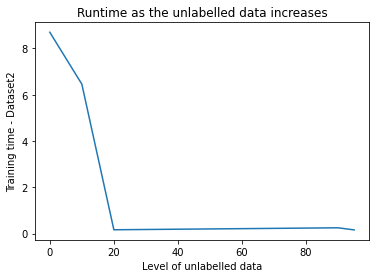

In [350]:
plt.plot([0,10,20,50,90,95],semi_boost_time[:6])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Imbalance Dataset')


plt.show()

plt.plot([0,10,20,50,90,95],semi_boost_time[6:12])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Oversampled Dataset1')
plt.show()

plt.plot([0,10,20,50,90,95],semi_boost_time[12:18])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Undersampled Dataset1')
plt.show()


plt.plot([0,10,20,50,90,95],semi_boost_time[18:24])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Dataset2')
plt.show()





### Unsupervised Pretraining

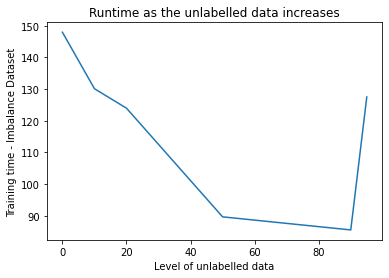

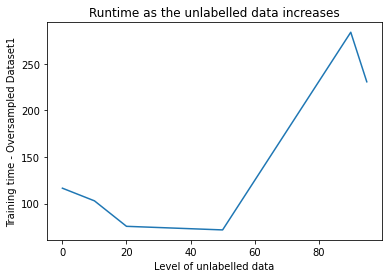

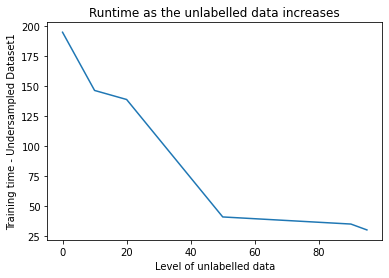

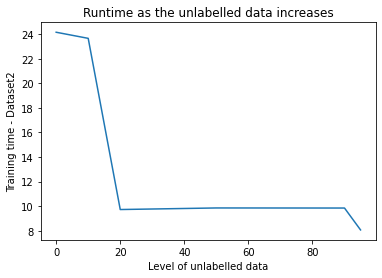

In [349]:
plt.plot([0,10,20,50,90,95],pretraining_time[:6])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Imbalance Dataset')


plt.show()

plt.plot([0,10,20,50,90,95],pretraining_time[6:12])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Oversampled Dataset1')
plt.show()

plt.plot([0,10,20,50,90,95],pretraining_time[12:18])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Undersampled Dataset1')
plt.show()


plt.plot([0,10,20,50,90,95],pretraining_time[18:24])
plt.title('Runtime as the unlabelled data increases')
plt.xlabel('Level of unlabelled data')
plt.ylabel('Training time - Dataset2')
plt.show()





Choice of base algorithms for each SSL

Self supervised: Random Forest 
Ensemble: Decision Tree
Unsupervised pretraining: MLP

In [248]:
import pandas as pd
df_lst = [self_training,semi_boost,pretraining]

dataset = ['Imbalanced','Imbalanced','Imbalanced','Imbalanced','Imbalanced','Imbalanced','Oversampled','Oversampled','Oversampled','Oversampled','Oversampled','Oversampled','Undersampled','Undersampled','Undersampled','Undersampled','Undersampled','Undersampled','Customer','Customer','Customer','Customer','Customer','Customer','Heart disease','Heart disease','Heart disease','Heart disease','Heart disease','Heart disease']
unlabel = [0  ,10  ,20  ,50  ,90  ,95  ,0  ,10  ,20  ,50  ,90  ,95  ,0  ,10  ,20  ,50  ,90  ,95  ,0  ,10  ,20  ,50  ,90  ,95  ,0  ,10  ,20  ,50  ,90  ,95]

# print(len(self_base_algo_choice))
rank_table1 = pd.DataFrame(
    {'Dataset': dataset,
     'Unlabelled %': unlabel,
    'Self Training': self_training,
     'Semi supervised ensemble': semi_boost,
     'Unsupervised pretraining': pretraining
    })

# base_algo_choice = [0,]
rank_table1

,Dataset,Unlabelled %,Self Training,Semi supervised ensemble,Unsupervised pretraining
0,Imbalanced,0,0.887267,0.834547,0.879562
1,Imbalanced,10,0.890916,0.886456,0.898683
2,Imbalanced,20,0.886861,0.881184,0.888495
3,Imbalanced,50,0.885645,0.314274,0.893552
4,Imbalanced,90,0.881590,0.176399,0.890065
5,Imbalanced,95,0.883212,0.181671,0.888166
6,Oversampled,0,0.935624,0.932321,0.927396
7,Oversampled,10,0.934172,0.935140,0.937046
8,Oversampled,20,0.935140,0.935140,0.920097
9,Oversampled,50,0.933204,0.253630,0.924213


In order to find the best algorithm & dataset pair, the algorithms are ranked for each dataset based on F1 score

In [265]:
#Ranking the performance of each model per dataset
ranked = rank_table1[["Self Training","Semi supervised ensemble","Unsupervised pretraining"]].rank(axis=1, ascending=False)
ranked.insert(loc=0, column='Dataset', value=dataset)
ranked.insert(loc=1,column='Unlabelled %', value =unlabel)



In [360]:
ranked

,Dataset,Unlabelled %,Self Training,Semi supervised ensemble,Unsupervised pretraining
0,Imbalanced,0,1.0,3.0,2.0
1,Imbalanced,10,2.0,3.0,1.0
2,Imbalanced,20,2.0,3.0,1.0
3,Imbalanced,50,2.0,3.0,1.0
4,Imbalanced,90,2.0,3.0,1.0
5,Imbalanced,95,2.0,3.0,1.0
6,Oversampled,0,1.0,2.0,3.0
7,Oversampled,10,3.0,2.0,1.0
8,Oversampled,20,1.5,1.5,3.0
9,Oversampled,50,1.0,3.0,2.0


In [226]:
from scipy.stats import friedmanchisquare

stat, p = friedmanchisquare(self_training, semi_boost, pretraining)
print('Statistics=%.f, p=%.f' % (stat, p))
# interpret
critical_value = 43.77
critical_value_99 = 50


if stat < critical_value:
	print('95% All algorithms perform similarly (fail to reject H0)')
else:
	print('95% All algorithms perform significantly different (reject H0)')
 
if stat < critical_value_99 :
	print('99% All algorithms perform similarly (fail to reject H0)')
else:
	print('99% All algorithms perform significantly different (reject H0)')

Statistics=28, p=0
95% All algorithms perform similarly (fail to reject H0)
99% All algorithms perform similarly (fail to reject H0)


## SSL implementation and design decisions

### Choice of algorithms

This question has been partially answered in the Background section where the semi-supervised learning algorithm used in this project is briefly discussed. Self training algorithm was experimented with different base learners and the best performing base learner is considered for the SSL algorithm for each dataset. In case of SemiBoost, it was considered because of the meaningful approach that the algorithm takes to calculate the confidence of the unlabelled data using neighboring data points. Finally, autoencoders are used to learn the pattern in the input data by training an autoencoder to represent an input data and thereby leveraging the unlabelled data as well. The application of autoencoder to construct the input data and passing the generated input data as the input data for a supervised classifier improves the performance of the supervised classifier.


### Choice of best algorithm & dataset pairs and choice of parameter settings

- For the imbalanced dataset, the best performing algorithm is Unsupervised Pretraining with the best count value equal to 5 which is greater than the best count for Self training and SemiBoost

- In the case of oversampled dataset, the best count for Self training is the highest with a value of 5 when compared to SemiBoost and Unsupervised Pretraining. Therefore, this implicitly means that the model has achieved higher F1-score in more of the unlabelled cases for the oversampled dataset

- Finally, in the case of Under sampled, Dataset 2 as well as Dataset 3, we can be concluded that Self Training performed better than the other two SSL algorithms based on the Best count equal to 5. 

- In summary, by calculating the best count value for the three algorithms for all datasets, we can be observe that:

•	Self training has attained rank 1 in 22 occurences

•	Semi supervised ensemble (SemiBoost) has attained rank 1 in 3 occurrences

•	And finally, Unsupervised pretraining has attained rank 1 in 6 cases.

### Impact of number of labels on iii

In summary, by calculating the best count value for the three algorithms for all datasets, we can be observe that:

•	Self training has attained rank 1 in 22 occurences

•	Semi supervised ensemble (SemiBoost) has attained rank 1 in 3 occurrences

•	And finally, Unsupervised pretraining has attained rank 1 in 6 cases.


### Impact of skew on iii

Based on the findings from this experiment, we can say that using unlabelled data in the form of pseudo labels have managed to produce similar F1-scores in the imbalanced data even in the case when level of unlabelled data is more than 50%. This can be verified by the diagram below that represents the Friedman test table that compares the F1-score of different algorithms for all possible dataset versions.

NOTE: The data below was also obtained from the Statistical test notebook just like parsing the data for accuracy, F1 score and training time. Additionally, the index of the instance in the list is obtained. Since, the list generated is ordered, the following numbers represents a base algorithm:

0 - Decision Tree

1 - SVM

2 - KNN

3 - RF

4 - MLP

5 - Gradient Boosting

The frequency of each algorithm is plotted below for all versions of data (30 different cases!)

In [277]:
self_base_algo_choice = [4,2,4,4,1,2,2,4,4,1,1,1,4,2,5,5,5,5,2,3,5,5,3,3,0,0,2,2,0,0] #Random Forest
# print(self_base_algo_choice.count(0))
# print(self_base_algo_choice.count(1))
# print(self_base_algo_choice.count(2))
# print(self_base_algo_choice.count(3))
# print(self_base_algo_choice.count(4))
# print(self_base_algo_choice.count(5))
semi_base_algo_choice = [0,1,1,1,1,0,1,0,5,1,2,5,2,4,1,1,3,2,0,3,0,0,0,0,0,0,0,0,0,0] #DT
# print(semi_base_algo_choice.count(0))
# print(semi_base_algo_choice.count(1))
# print(semi_base_algo_choice.count(2))
# print(semi_base_algo_choice.count(3))
# print(semi_base_algo_choice.count(4))
# print(semi_base_algo_choice.count(5))
pretrain_base_algo_choice = [4,4,2,4,2,4,1,4,4,4,4,4,4,4,4,2,2,2,4,4,4,1,1,4,1,2,4,5,3,3] #MLP
# print(pretrain_base_algo_choice.count(0))
# print(pretrain_base_algo_choice.count(1))
# print(pretrain_base_algo_choice.count(2))
# print(pretrain_base_algo_choice.count(3))
# print(pretrain_base_algo_choice.count(4))
# print(pretrain_base_algo_choice.count(5))

### Self training best performing base algorithm

The plot below shows the frequency of the best performing base algorithms for each SSL algorithm in different dataset conditions. This plot is used to justify why a particular base algorithm was implemented

<BarContainer object of 30 artists>

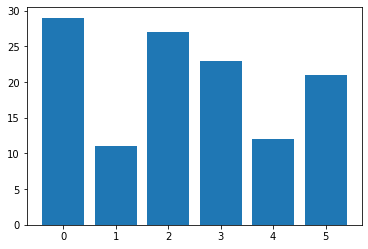

In [306]:
bestalgolist = [dataset,self_base_algo_choice]
bestAlgoPair = pd.DataFrame(bestalgolist) 
num1 = list(ranked["Dataset"].index)
bestAlgoPair = pd.DataFrame(
    {'Dataset': dataset,
     'Unlabelled %': unlabel,
    'Self Training': self_base_algo_choice,
     'Semi supervised ensemble': semi_base_algo_choice,
     'Unsupervised pretraining': pretrain_base_algo_choice
    })
plt.bar(self_base_algo_choice, height=num1) #Frequency based on 30 dataset cases.


### Semi supervised ensemble best performing base algorithms

<BarContainer object of 30 artists>

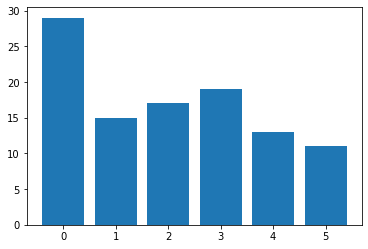

In [307]:
plt.bar(semi_base_algo_choice, height=num1)


### Unsupervised pretraining best performing algorithm

<BarContainer object of 30 artists>

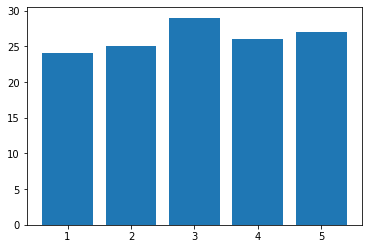

In [308]:
plt.bar(pretrain_base_algo_choice, height=num1)
